In [1]:
import tweepy
from textblob import TextBlob
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt

In [3]:
config = pd.read_csv("./config.csv")

In [4]:
twitterAPIkey= config['twitterAPIkey'] [0]
twitterAPISecret= config['twitterAPISecret'] [0]
twitterAPIAccessToken=config['twitterAPIAccessToken'] [0]
twitterAPIAccessTokenSecret=config['twitterAPIAccessTokenSecret'] [0]

In [5]:
auth=tweepy.OAuthHandler(twitterAPIkey,twitterAPISecret)
auth.set_access_token(twitterAPIAccessToken,twitterAPIAccessTokenSecret)
twitterAPI =tweepy.API(auth,wait_on_rate_limit=True)

In [6]:
twitterAccount ="KamalaHarris"

In [11]:
tweets = tweepy.Cursor(twitterAPI.user_timeline,
                       screen_name=twitterAccount,
                       count=None,
                       since_id=None,
                       max_id=None,trim_user=True,exclude_replies=True,contributor_details=False,
                       include_entities=False).items(50);

In [12]:
df = pd.DataFrame(data=[tweet.text for tweet in tweets],columns=['Tweet'])

In [13]:
df.head()

,Tweet
0,.@TheDemocrats are taking the fight to protect...
1,Help @TheDemocrats fight back against Republic...
2,Our democracy is stronger when everyone partic...
3,Your vote is your power—and you must not let a...
4,The right to vote is not partisan—it’s not Dem...


In [15]:
def cleanUpTweet(txt):
    txt= re.sub(r'@[A-Za-z0-9_]+','',txt)
    txt= re.sub(r'#','',txt)
    txt= re.sub(r'RT : ','',txt)
    txt= re.sub(r'https?:\/\/[A-Za-z0-9\.\/]+','',txt)
    return txt

In [16]:
df['Tweet']=df['Tweet'].apply(cleanUpTweet)

In [17]:
def getTextSubjectivity(txt):
    return TextBlob(txt).sentiment.subjectivity

In [18]:
def getTextPolarity(txt):
    return TextBlob(txt).sentiment.polarity

In [19]:
df['Subjectivity']=df['Tweet'].apply(getTextSubjectivity)
df['Polarity']=df['Tweet'].apply(getTextPolarity)

In [20]:
df.head(50)

,Tweet,Subjectivity,Polarity
0,. are taking the fight to protect and expand t...,0.467857,0.192857
1,Help fight back against Republican efforts to...,0.267857,0.142857
2,Our democracy is stronger when everyone partic...,0.400000,0.400000
3,Your vote is your power—and you must not let a...,0.000000,0.000000
4,The right to vote is not partisan—it’s not Dem...,0.401786,0.214286
5,Our democracy is strongest when everyone parti...,0.000000,0.000000
6,. are making a $25 million investment to prote...,0.000000,0.000000
7,NEW: We’re proud to announce we’re expanding o...,0.727273,0.468182
8,Proud to announce are launching a first-of-it...,1.000000,0.800000
9,We’re closer than ever to declaring our indepe...,1.000000,0.300000


In [21]:
df = df.drop(df[df['Tweet']==''].index)

In [22]:
df.head(50)

,Tweet,Subjectivity,Polarity
0,. are taking the fight to protect and expand t...,0.467857,0.192857
1,Help fight back against Republican efforts to...,0.267857,0.142857
2,Our democracy is stronger when everyone partic...,0.400000,0.400000
3,Your vote is your power—and you must not let a...,0.000000,0.000000
4,The right to vote is not partisan—it’s not Dem...,0.401786,0.214286
5,Our democracy is strongest when everyone parti...,0.000000,0.000000
6,. are making a $25 million investment to prote...,0.000000,0.000000
7,NEW: We’re proud to announce we’re expanding o...,0.727273,0.468182
8,Proud to announce are launching a first-of-it...,1.000000,0.800000
9,We’re closer than ever to declaring our indepe...,1.000000,0.300000


In [23]:
def getTextAnalysis(a):
    if a<0:
        return "Negative"
    elif a==0:
        return "Neutral"
    else:
        return "positive"

In [24]:
df["Score"]=df['Polarity'].apply(getTextAnalysis)

In [25]:
df.head(50)

,Tweet,Subjectivity,Polarity,Score
0,. are taking the fight to protect and expand t...,0.467857,0.192857,positive
1,Help fight back against Republican efforts to...,0.267857,0.142857,positive
2,Our democracy is stronger when everyone partic...,0.400000,0.400000,positive
3,Your vote is your power—and you must not let a...,0.000000,0.000000,Neutral
4,The right to vote is not partisan—it’s not Dem...,0.401786,0.214286,positive
5,Our democracy is strongest when everyone parti...,0.000000,0.000000,Neutral
6,. are making a $25 million investment to prote...,0.000000,0.000000,Neutral
7,NEW: We’re proud to announce we’re expanding o...,0.727273,0.468182,positive
8,Proud to announce are launching a first-of-it...,1.000000,0.800000,positive
9,We’re closer than ever to declaring our indepe...,1.000000,0.300000,positive


In [33]:
positive=df[df['Score']=="positive"]
print(str(positive.shape[0]/(df.shape[0])*100)+ "% of positive tweets")
pos=positive.shape[0]/df.shape[0]*100

57.99999999999999% of positive tweets


In [36]:
negative=df[df['Score']=="Negative"]
print(str(negative.shape[0]/(df.shape[0])*100)+ "% of Negative tweets")
neg=negative.shape[0]/df.shape[0]*100

4.0% of Negative tweets


In [37]:
neutral=df[df['Score']=="Neutral"]
print(str(neutral.shape[0]/(df.shape[0])*100)+ "% of Neutral tweets")
neu=neutral.shape[0]/df.shape[0]*100

38.0% of Neutral tweets


In [38]:
explode=(0,0.1,0)
labels='positive','Negative','Neutral'
sizes=[pos,neg,neu]
colors=['yellowgreen','lightcoral','gold']

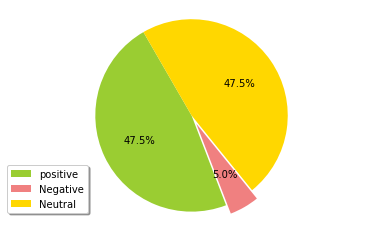

In [40]:
plt.pie(sizes,explode=explode,colors=colors,autopct='%1.1f%%',startangle=120)
plt.legend(labels,loc=(-0.05,0.05),shadow=True)
plt.axis('equal')
plt.savefig("Sentiment_Analysis.png")

<BarContainer object of 3 artists>

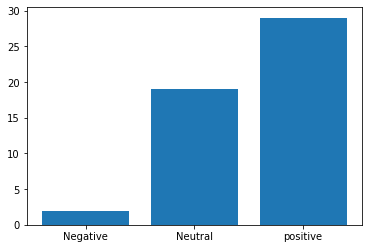

In [41]:
labels = df.groupby('Score').count().index.values
values = df.groupby('Score').size().values
plt.bar(labels,values)

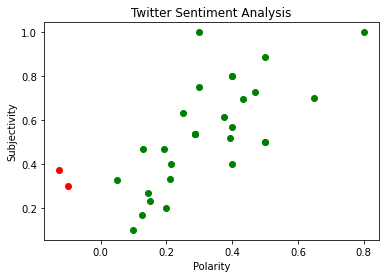

In [44]:
for index, row in df.iterrows():
    if row['Score']=='positive':
        plt.scatter(row['Polarity'],row['Subjectivity'],color='green')
    elif row['Score']=='Negative':
        plt.scatter(row['Polarity'],row['Subjectivity'],color='red')
    elif row['Score']=='Negative':
        plt.scatter(row['Polarity'],row['Subjectivity'],color='blue')
plt.title('Twitter Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

In [4]:
import tweepy
from textblob import TextBlob
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt

In [5]:
config = pd.read_csv("./config.csv")

In [6]:
twitterAPIkey= config['twitterAPIkey'] [0]
twitterAPISecret= config['twitterAPISecret'] [0]
twitterAPIAccessToken=config['twitterAPIAccessToken'] [0]
twitterAPIAccessTokenSecret=config['twitterAPIAccessTokenSecret'] [0]

In [10]:
auth=tweepy.OAuthHandler(twitterAPIkey,twitterAPISecret)
auth.set_access_token(twitterAPIAccessToken,twitterAPIAccessTokenSecret)
twitterAPI =tweepy.API(auth,wait_on_rate_limit=True)

In [11]:
twitterAccount ="SafaricomPLC"

In [12]:
tweets = tweepy.Cursor(twitterAPI.user_timeline,
                       screen_name=twitterAccount,
                       count=None,
                       since_id=None,
                       max_id=None,trim_user=True,exclude_replies=True,contributor_details=False,
                       include_entities=False).items(50);

In [13]:
df = pd.DataFrame(data=[tweet.text for tweet in tweets],columns=['Tweet'])

In [14]:
df.head()

,Tweet
0,Our official and verified pages on all platfor...
1,RT @SafaricomFDN: Ndoto Zetu Phase 3 applicati...
2,RT @SafaricomFDN: Bungoma Bible School Childre...
3,RT @Markotieno14: Thankyou @SafaricomPLC for b...
4,RT @SafaricomNews: Have you had a chance to wa...


In [15]:
def getTextSubjectivity(txt):
    return TextBlob(txt).sentiment.subjectivity

In [19]:
def getTextPolarity(txt):
    return TextBlob(txt).sentiment.polarity

In [20]:
df['Subjectivity']=df['Tweet'].apply(getTextSubjectivity)
df['Polarity']=df['Tweet'].apply(getTextPolarity)

In [21]:
def getTextAnalysis(a):
    if a<0:
        return "Negative"
    elif a==0:
        return "Neutral"
    else:
        return "positive"

In [22]:
df["Score"]=df['Polarity'].apply(getTextAnalysis)

In [17]:
df.head(50)

,Tweet,Subjectivity,Polarity,Score
0,RT @Markotieno14: Thankyou @SafaricomPLC for b...,0.125000,0.000000,Neutral
1,RT @SafaricomNews: Have you had a chance to wa...,0.277273,0.118182,positive
2,RT @PeterNdegwa_: @Markotieno14 s sheer determ...,0.688333,0.131667,positive
3,RT @PeterNdegwa_: Even though we are known for...,0.000000,0.000000,Neutral
4,RT @PeterNdegwa_: That is why i am excited to ...,0.500000,0.312500,positive
5,RT @PeterNdegwa_: We were really inspired by h...,0.200000,0.200000,positive
6,We’re proud to be supporting @Markotieno14’s O...,0.625000,0.525000,positive
7,RT @SafaricomFDN: We recently visited Mabati T...,0.175000,0.000000,Neutral
8,"Go Beyond and conquer, Eliud🥳\nWe're proud to ...",1.000000,0.800000,positive
9,Join us this Thursday 15th July live on Youtub...,0.650000,0.218182,positive


In [2]:
import pandas as pd

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
df= pd.read_csv("covid19_tweets.csv")

In [27]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


###task
+ task
  -text preprocessing
    Sentiment Analysis
    Keyword extraction
    Entity Extraction
    

In [29]:
#check columns
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [32]:
#check datatype
df.dtypes

user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [33]:
#Source of the tweet
df['source'].unique()

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [34]:
df['source'].value_counts()

Twitter Web App                56891
Twitter for Android            40179
Twitter for iPhone             35472
TweetDeck                       8543
Hootsuite Inc.                  7321
                               ...  
DirectorsTalk Auto Posting         1
science faction twitter bot        1
Conservative Daily News            1
OnlyPultCom                        1
Squarespace                        1
Name: source, Length: 610, dtype: int64

In [35]:
#plot the value count for visualization
df['source'].value_counts().nlargest(30)

Twitter Web App            56891
Twitter for Android        40179
Twitter for iPhone         35472
TweetDeck                   8543
Hootsuite Inc.              7321
Twitter for iPad            4336
Buffer                      2728
Sprout Social               1833
Instagram                   1759
IFTTT                       1545
dlvr.it                      681
GlobalPandemic.NET           679
LinkedIn                     628
COVID19-Updates              625
Twitter Media Studio         596
WordPress.com                537
HubSpot                      513
Sprinklr                     497
FS Poster                    414
Dynamic Signal               391
Resistbot Open Letters       390
Cheap Bots, Done Quick!      335
Paper.li                     322
Twitter for Advertisers      317
Blood Donors India           281
IAMBLOG2TWITTER              266
Alexander Higgins            225
Zoho Social                  224
The Social Jukebox           216
Fabrik.fm                    209
Name: sour

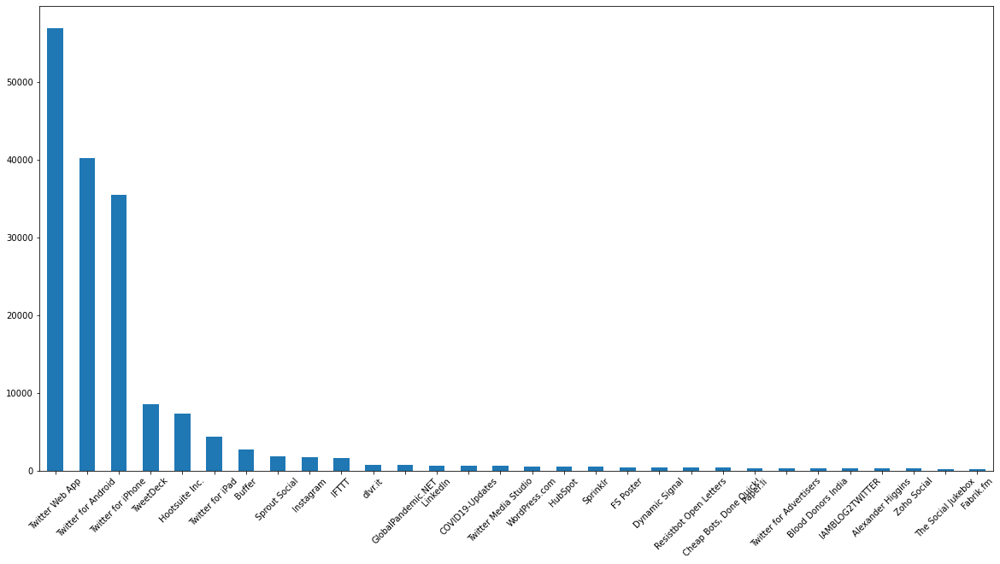

In [37]:
#plot value counts
plt.figure(figsize=(20,10))
df['source'].value_counts().nlargest(30).plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

text analysis of the tweets

In [40]:
pip install neattext

Note: you may need to restart the kernel to use updated packages.


In [7]:
import neattext.functions as nfx

In [8]:
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [43]:
df['text'].iloc[2]

'@diane3443 @wdunlap @realDonaldTrump Trump never once claimed #COVID19 was a hoax. We all claim that this effort to… https://t.co/Jkk8vHWHb3'

In [9]:
df['text'].apply(nfx.extract_hashtags)

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: text, Length: 179108, dtype: object

In [12]:
df['clean_tweet']=df['text'].apply(nfx.remove_hashtags)

In [13]:
df[['text','clean tweet']]

,text,clean tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [15]:
df['clean_tweet']=df ['clean_tweet'].apply(lambda x:nfx.remove_userhandles(x))

In [17]:
df['clean_tweet']=df['clean_tweet'].apply(nfx.remove_multiple_spaces)

In [19]:
df['clean_tweet']=df['clean_tweet'].apply(nfx.remove_urls)

In [20]:
df['clean_tweet']=df['clean_tweet'].apply(nfx.remove_puncts)

In [21]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and wouldnt it have made more sense to ha...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax We all cl...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciation f...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challenge I n...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020 The year of insanity Lol
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena Its a trib...
179106,"More than 1,200 students test positive for #CO...",More than 1200 students test positive for at m...


In [22]:
from textblob import TextBlob

In [25]:
def get_sentiment(text):
    blob=TextBlob(text)
    sentiment_polarity=blob.sentiment.polarity
    sentiment_subjectivity=blob.sentiment.subjectivity
    if sentiment_polarity>0:
        sentiment_label='Positive'
    elif sentiment_polarity<0:
        sentiment_label='Negative'
    else:
        sentiment_label='Neutral'
    result={
        'polarity':sentiment_polarity,
        'subjectivity':sentiment_subjectivity,
        'sentiment':sentiment_label}
    return result
    

In [26]:
ex1= df['clean_tweet'].iloc[0]

In [27]:
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [28]:
df['sentiment_results']= df['clean_tweet'].apply(get_sentiment)

In [29]:
df = df.join(pd.json_normalize(df['sentiment_results']))

In [30]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,clean tweet,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and wouldnt it have made more sense to ha...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax We all cl...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,@brookbanktv The one gift has give me is an ...,The one gift has give me is an appreciation f...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,25 July : Media Bulletin on Novel \n@kansa...,25 July : Media Bulletin on Novel,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


<AxesSubplot:>

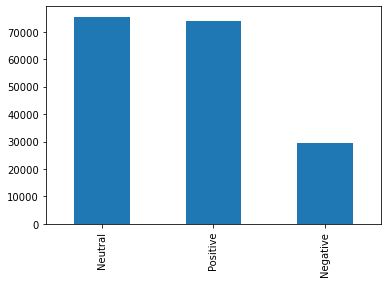

In [31]:
df['sentiment'].value_counts().plot(kind='bar')

In [36]:
positive_tweet =df[df['sentiment']=='Positive']['clean_tweet']

In [37]:
neutral_tweet =df[df['sentiment']=='Neutral']['clean_tweet']
negative_tweet =df[df['sentiment']=='Negative']['clean_tweet']

In [38]:
positive_tweet

1         Hey and  wouldnt it have made more sense to ha...
6         How Will Change Work in General (and recruitin...
8                 Praying for good health and recovery of  
12        👋🏻 — no one will be safe from until everyone i...
13        Lets all protect ourselves from Its real and t...
                                ...                        
179096    We were really bummed we couldn’t cop one of t...
179103    Thanks for nominating me for the challenge I n...
179104                       2020 The year of insanity Lol 
179105     A powerful painting by Juan Lucena Its a trib...
179106    More than 1200 students test positive for at m...
Name: clean_tweet, Length: 74154, dtype: object

In [39]:
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [40]:
positive_tweet_list

['Hey wouldnt sense players pay respects A…',
 'Change Work General (and recruiting specifically) via/',
 'Praying good health recovery',
 '👋🏻 — safe safe commit ensure…',
 'Lets protect real numbers climbing fast Continent Lets n…',
 'Second wave Flandersback',
 'COVID Update: infection rate Florida following natural curve experts predicted initial cu…',
 'Good Patriots Volunteer Election Judge Polls open without…',
 'comprehensive review amp Analysis: key ways WASH help reduce transmission…',
 'crosses 2 lakh mark 150055 ppp recovered far positive today 6988/total…',
 'Actor father MrGKReddy tested positive 15/20 days s…',
 'safe place visit guests said hotel meticulous applying hand sanitation als…',
 'CEO live WSU talking “The effects Covid19 students”…',
 'Actionables healthy recovery',
 'understood hadnt missed meeting In…',
 'released new podcast episodes week: Technology Platforms Conduct Telehealth Visits C…',
 'reports 1142 positive cases 29 deaths Saturday Death toll rises 3

In [41]:
for line in positive_tweet_list:
    print(line)
    for token in line.split():
        print(token)
    

Hey wouldnt sense players pay respects A…
Hey
wouldnt
sense
players
pay
respects
A…
Change Work General (and recruiting specifically) via/
Change
Work
General
(and
recruiting
specifically)
via/
Praying good health recovery
Praying
good
health
recovery
👋🏻 — safe safe commit ensure…
👋🏻
—
safe
safe
commit
ensure…
Lets protect real numbers climbing fast Continent Lets n…
Lets
protect
real
numbers
climbing
fast
Continent
Lets
n…
Second wave Flandersback
Second
wave
Flandersback
COVID Update: infection rate Florida following natural curve experts predicted initial cu…
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
Good Patriots Volunteer Election Judge Polls open without…
Good
Patriots
Volunteer
Election
Judge
Polls
open
without…
comprehensive review amp Analysis: key ways WASH help reduce transmission…
comprehensive
review
amp
Analysis:
key
ways
WASH
help
reduce
transmission…
crosses 2 lakh mark 150055 ppp recovered far positive today 6988/total…


interests…
latest Islam Islamism
latest
Islam
Islamism
vilifying amp (Republicans premium stock) catering w…
vilifying
amp
(Republicans
premium
stock)
catering
w…
reports 7813 new cases Saturday tally goes 88671 death toll increase…
reports
7813
new
cases
Saturday
tally
goes
88671
death
toll
increase…
total 52 confirmed deaths
total
52
confirmed
deaths
Wear face cover pay £100 fine New laws imposed London Lol Chose cover
Wear
face
cover
pay
£100
fine
New
laws
imposed
London
Lol
Chose
cover
AP records 7813 new cases 24 hours taking tally 88671 52 deaths wer…
AP
records
7813
new
cases
24
hours
taking
tally
88671
52
deaths
wer…
statistics gives info performing better fight
statistics
gives
info
performing
better
fight
increased testing samples Covid19 fatality rate significantly dropped 235% Saturday an…
increased
testing
samples
Covid19
fatality
rate
significantly
dropped
235%
Saturday
an…
CM tested positive Theres news bcoz ministers wel…
CM
tested
positive
Theres
news
bcoz
ministers
we

early
warnings
misled…
remember people susceptible long circulating riskIts all…
remember
people
susceptible
long
circulating
riskIts
all…
Actor Father MrGKReddy Tested positive 15/20 Days s…
Actor
Father
MrGKReddy
Tested
positive
15/20
Days
s…
FIXED: starting today draconian new rules protesters…
FIXED:
starting
today
draconian
new
rules
protesters…
great summary evidence limitations information transmission schools
great
summary
evidence
limitations
information
transmission
schools
feeling anxious normal 🍌Here destressing techniques help rig…
feeling
anxious
normal
🍌Here
destressing
techniques
help
rig…
Hong Kongs situation remains grave new cases hit record
Hong
Kongs
situation
remains
grave
new
cases
hit
record
Real deaths figures
Real
deaths
figures
chart showing number new cases cases plus average number daily new cases…
chart
showing
number
new
cases
cases
plus
average
number
daily
new
cases…
love 😘😘😘
love
😘😘😘
Wash Hands Clean Hands Save Lives 🧼 Download FREE Google Play Store:


Bridal
company
western
Japan
providing
free
venues
outfits
planning
support
couples
wedding
ceremo…
blows mind parents literally care can’t wait send children to…
blows
mind
parents
literally
care
can’t
wait
send
children
to…
Actor father MrGKReddy tested positive 15/20 days s…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
live happily secure identity doesn’t affect don’t speak Demonizi…
live
happily
secure
identity
doesn’t
affect
don’t
speak
Demonizi…
Look Eat drink wisely Nourish flourish App…
Look
Eat
drink
wisely
Nourish
flourish
App…
Tune shortly latest Austin
Tune
shortly
latest
Austin
Culture Secretary Oliver Dowden announced July gyms leisure centres able reopen strict…
Culture
Secretary
Oliver
Dowden
announced
July
gyms
leisure
centres
able
reopen
strict…
people lost jobs unable loved ones people cant it…
people
lost
jobs
unable
loved
ones
people
cant
it…
Check latest updates here:
Check
latest
updates
here:
It’s mysterious GOP militants eager send kids height…
It’s
mys

Im
donating
high
antibody
blood
plasma
hope
helps
people
fights
against…
Actor father MrGKReddy tested positive 15/20 days s…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
Hola Amego 😀😀 tweet describes PERFECT Mexican STAND SLIM size ZERO amp ener…
Hola
Amego
😀😀
tweet
describes
PERFECT
Mexican
STAND
SLIM
size
ZERO
amp
ener…
understand virus attend meetings read reports listen scientists did…
understand
virus
attend
meetings
read
reports
listen
scientists
did…
inactivates created Portugal🇵🇹❤️
inactivates
created
Portugal🇵🇹❤️
Haha
Haha
5000year historical timeline went obsolete 3 months😲 dig amp thrilled buy ‘Timeline o…
5000year
historical
timeline
went
obsolete
3
months😲
dig
amp
thrilled
buy
‘Timeline
o…
Clinical Characteristics Covid 19 Subscribe videos health medicine :…
Clinical
Characteristics
Covid
19
Subscribe
videos
health
medicine
:…
survivor fingers amputated: ‘This happen you’ “It sho…
survivor
fingers
amputated:
‘This
happen
you’
“It
sho…
pointed “low death rate” Oman

Imperial
Prof
Justin
Stebbing
thinks
MEDTECH: unique effort researchers innovated novel portable rapid device de…
MEDTECH:
unique
effort
researchers
innovated
novel
portable
rapid
device
de…
currently cases PA day
currently
cases
PA
day
“young healthy people currently walk faces better of…
“young
healthy
people
currently
walk
faces
better
of…
new opportunity involved research vaccine
new
opportunity
involved
research
vaccine
faces possible fine taking photos fans
faces
possible
fine
taking
photos
fans
Brief impact Girls Adolescent Girls Young
Brief
impact
Girls
Adolescent
Girls
Young
7 study describes cluster high school Israel demonstrating potential mass transmi…
7
study
describes
cluster
high
school
Israel
demonstrating
potential
mass
transmi…
2803 new cases reported taking total number cases 36314: State Health Department
2803
new
cases
reported
taking
total
number
cases
36314:
State
Health
Department
Day 136 Reported Cases 15759 million Record High July 23 2827K 9 Day rolling aver

Angeles
keeps
insisting
Im
likeno
thanks
would…
Percent increase bit misleading Look absolute numbers
Percent
increase
bit
misleading
Look
absolute
numbers
👋🏻 — safe safe commit ensure…
👋🏻
—
safe
safe
commit
ensure…
Bhubaneswar Municipal Corporation (BMC) Saturday said 111 people tested positive COVID19 the…
Bhubaneswar
Municipal
Corporation
(BMC)
Saturday
said
111
people
tested
positive
COVID19
the…
Nice masks fun stylish people fussy wear mask save life…
Nice
masks
fun
stylish
people
fussy
wear
mask
save
life…
nations world we’ve deaths tim…
nations
world
we’ve
deaths
tim…
question Scotlands Nicola Sturgeon fear Boris Johnson positive regard for…
question
Scotlands
Nicola
Sturgeon
fear
Boris
Johnson
positive
regard
for…
better reason people shouldnt forced crowded office buildings
better
reason
people
shouldnt
forced
crowded
office
buildings
half positive cases comes South Africa Open ears bantu ba se South Africa
half
positive
cases
comes
South
Africa
Open
ears
bantu
ba
se
South
Afr

Hernandez
Tests
Positive
Covid19
👉🏻We
wishes
speedy
recovery
good
health❤️
🔺…
star says feeling okay selfisolating competition protocols
star
says
feeling
okay
selfisolating
competition
protocols
3 new deaths Zambia [11:52 GMT]
3
new
deaths
Zambia
[11:52
GMT]
2296 Coronavirus Cases – 172 New Cases 4 New Deaths Recorded Zimbabwe
2296
Coronavirus
Cases
–
172
New
Cases
4
New
Deaths
Recorded
Zimbabwe
dont visit Ghiblis world model Spirited Away Sen :)…
dont
visit
Ghiblis
world
model
Spirited
Away
Sen
:)…
India’s testing hits record high 420 lakh samples day
India’s
testing
hits
record
high
420
lakh
samples
day
2803 new positive cases reported taking total number cases 36314 reports…
2803
new
positive
cases
reported
taking
total
number
cases
36314
reports…
Youre Talk Radio Youre Massive Winner Enjoy Humour Ind…
Youre
Talk
Radio
Youre
Massive
Winner
Enjoy
Humour
Ind…
humble appeale recovered persons donate plasma great humanitarian service in…
humble
appeale
recovered
persons
donate
plasma
g

good news spread easily gym mask needed going avoid high risk…
good
news
spread
easily
gym
mask
needed
going
avoid
high
risk…
reopening boarders visitors grants free tests passengers entering country…
reopening
boarders
visitors
grants
free
tests
passengers
entering
country…
💠 | BULLETIN 25 JULY 2020 🔹In 24 hours 2985 new positive cases reported 📌…
💠
|
BULLETIN
25
JULY
2020
🔹In
24
hours
2985
new
positive
cases
reported
📌…
Psst Dont forget join webinar Good practice supporting direct payment recipients the…
Psst
Dont
forget
join
webinar
Good
practice
supporting
direct
payment
recipients
the…
Madhya Pradesh CM Shivraj Singh Chouhan tests positive coronavirus disease
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
tests
positive
coronavirus
disease
COMING @ 4:30 PM | Early data shows experimental vaccine developed amp i…
COMING
@
4:30
PM
|
Early
data
shows
experimental
vaccine
developed
amp
i…
stories auto industry stepping support innovate healthcare been…
stories
auto
industry
stepping
support


383
new
cases
509
recoveries
Customized Available variety colours sizes countrywide deliveries with…
Customized
Available
variety
colours
sizes
countrywide
deliveries
with…
afford complacent responsible stay safe
afford
complacent
responsible
stay
safe
thanks Ellen Silbergeld insightful expert comments extensive research…
thanks
Ellen
Silbergeld
insightful
expert
comments
extensive
research…
High mortality Australia concerning studies suggest severe winter th…
High
mortality
Australia
concerning
studies
suggest
severe
winter
th…
Gyms health clubs reopening prepare coronavirus spread like wildfire particularly ghettos of…
Gyms
health
clubs
reopening
prepare
coronavirus
spread
like
wildfire
particularly
ghettos
of…
powerful image: 6 April 2020 doortodoor distribution masks begins (photo CGE fotogiornalismo on…
powerful
image:
6
April
2020
doortodoor
distribution
masks
begins
(photo
CGE
fotogiornalismo
on…
Africa safe COVID19⚠️ Free offline🚫🌐 Simply dial *347*65# info check website link…


confirmed
cases
➡️
849432
cases
cured/recovered
➡️
15849068
samples
tested…
Temporary loss smell anosmia main neurological symptom earliest commonly rep…
Temporary
loss
smell
anosmia
main
neurological
symptom
earliest
commonly
rep…
Nearly 49000 fresh India’s tally 1336 lakh death toll 31358 look statewise tall…
Nearly
49000
fresh
India’s
tally
1336
lakh
death
toll
31358
look
statewise
tall…
Highly Important: network food banks working nonstop feed family during…
Highly
Important:
network
food
banks
working
nonstop
feed
family
during…
cover mouth sneeze publicwearing mask principle Respectfully covering you…
cover
mouth
sneeze
publicwearing
mask
principle
Respectfully
covering
you…
explain this: exposed positive COVID19 case dont v…
explain
this:
exposed
positive
COVID19
case
dont
v…
NTDC Successfully Installed 600 MVA Transformer 500 kV Grid Station Yousafwala Sahiwal
NTDC
Successfully
Installed
600
MVA
Transformer
500
kV
Grid
Station
Yousafwala
Sahiwal
latest Life Chronic Pain amp Aut

supporting
15000
families
hit
pandemic
hard
reach
areas
i…
Significant uncertainty surrounds “new normal” look like firms crisis parti…
Significant
uncertainty
surrounds
“new
normal”
look
like
firms
crisis
parti…
Starting BRAVE CF 36 Romania strongest Covid19 policies safety precautions ready…
Starting
BRAVE
CF
36
Romania
strongest
Covid19
policies
safety
precautions
ready…
Family gay officer died COVID19 denied insurance benefits
Family
gay
officer
died
COVID19
denied
insurance
benefits
doesnt need capitalism killer
doesnt
need
capitalism
killer
today’s shoot home Ekdum ‘good boy’ look
today’s
shoot
home
Ekdum
‘good
boy’
look
“It mixing humanities writ large practical artisanal skills—and society ready use them—that F…
“It
mixing
humanities
writ
large
practical
artisanal
skills—and
society
ready
use
them—that
F…
MR PRESIDENT …
MR
PRESIDENT
…
biggest indicators complications — age — general term us…
biggest
indicators
complications
—
age
—
general
term
us…
Proud supporting campaign pan

Exactly thats question
Exactly
thats
question
challenged healthcare systems world unique pressure global pandemic overwhelm…
challenged
healthcare
systems
world
unique
pressure
global
pandemic
overwhelm…
Tanzania’s Zanzibar thanks support COVID19
Tanzania’s
Zanzibar
thanks
support
COVID19
COVID 19 astonishing rise cause death 2020
COVID
19
astonishing
rise
cause
death
2020
news: coronavirus patients feel symptoms weeks CDC says
news:
coronavirus
patients
feel
symptoms
weeks
CDC
says
news: epidemic exceed million cases — South Africas coronavirus adviser…
news:
epidemic
exceed
million
cases
—
South
Africas
coronavirus
adviser…
proud branding logo website designing sourcing profit margins myself…
proud
branding
logo
website
designing
sourcing
profit
margins
myself…
XAVI Tested covid 19 positive Best wishes
XAVI
Tested
covid
19
positive
Best
wishes
early Jan2020 picked stock exchange hit changed…
early
Jan2020
picked
stock
exchange
hit
changed…
World changing everyones safety need adapt n

hrs
6
nationals
1
expat
working
govt
dept…
1067 new cases 12 new deaths Oman [10:21 GMT]
1067
new
cases
12
new
deaths
Oman
[10:21
GMT]
bitch happily bend virus orifice Handing America…
bitch
happily
bend
virus
orifice
Handing
America…
Dont gym whilst simply blag free discounted membership local gym saying youre gr…
Dont
gym
whilst
simply
blag
free
discounted
membership
local
gym
saying
youre
gr…
SOLD Sorry Red face masks sold 😷 Ideal sports clubs dance schools more…
SOLD
Sorry
Red
face
masks
sold
😷
Ideal
sports
clubs
dance
schools
more…
Pierre know easy lift knee uBaba Jacob Zumas neck Try
Pierre
know
easy
lift
knee
uBaba
Jacob
Zumas
neck
Try
longer you’ve experienced freedom harder America fight hands
longer
you’ve
experienced
freedom
harder
America
fight
hands
Major breakthrough drug makes UK professors millionaires | Business | Guardian
Major
breakthrough
drug
makes
UK
professors
millionaires
|
Business
|
Guardian
achieve fit purpose finance function crisis | |
achieve
fit
purpose
f

Interesting
piece
⁦
role
response
don’t
y…
Ive backed campaign ensure potential vaccine available – j…
Ive
backed
campaign
ensure
potential
vaccine
available
–
j…
Need 2nd grade education steady trigger finger future looking 2020…
Need
2nd
grade
education
steady
trigger
finger
future
looking
2020…
forgot mention biggest achievements: 10s thousands deaths be…
forgot
mention
biggest
achievements:
10s
thousands
deaths
be…
He’s going blame obesity UK apparently bigger obesity problem countries…
He’s
going
blame
obesity
UK
apparently
bigger
obesity
problem
countries…
new solution pandemic POSTERS
new
solution
pandemic
POSTERS
fair better situation w PPE (and is…
fair
better
situation
w
PPE
(and
is…
time record number 420000 tests conducted single day 420898 s…
time
record
number
420000
tests
conducted
single
day
420898
s…
shame inevitable circumstances loved year especially spending time…
shame
inevitable
circumstances
loved
year
especially
spending
time…
Visiting shops today Remember peopl

Life perfect good opportunity use Yes Thats it…
Life
perfect
good
opportunity
use
Yes
Thats
it…
Democrats perfect f*ck nah passed bill benefit working Americans th…
Democrats
perfect
f*ck
nah
passed
bill
benefit
working
Americans
th…
I’m pleased speaking live week humanitarian situation displaced Syrians…
I’m
pleased
speaking
live
week
humanitarian
situation
displaced
Syrians…
UPDATE: New cases Singapore (+513 tot 49888) Armenia (+383 tot 36996) Aust…
UPDATE:
New
cases
Singapore
(+513
tot
49888)
Armenia
(+383
tot
36996)
Aust…
reported 1487 new infections Saturday recorded 24 deaths caused debilitating…
reported
1487
new
infections
Saturday
recorded
24
deaths
caused
debilitating…
facts trusted local sources Diverse writers Expert analysis Reasoned investigation Pure unad…
facts
trusted
local
sources
Diverse
writers
Expert
analysis
Reasoned
investigation
Pure
unad…
Staying safe wool rage
Staying
safe
wool
rage
Dear kindly assist people Lagos authenticate t…
Dear
kindly
assist
people
Lago

safe
help
quickly
you’r…
great session missed watch video link be…
great
session
missed
watch
video
link
be…
want know truth inflated cause death numbers rubber sta…
want
know
truth
inflated
cause
death
numbers
rubber
sta…
😂😂😂😂you havent looked Feel free Work hard calling English…
😂😂😂😂you
havent
looked
Feel
free
Work
hard
calling
English…
Happy Saturday plans people today venturing places opening
Happy
Saturday
plans
people
today
venturing
places
opening
Safety yall
Safety
yall
think exposed IQ politicians Note people
think
exposed
IQ
politicians
Note
people
wish happy birthday Happy birthday ❤️❤️🙏
wish
happy
birthday
Happy
birthday
❤️❤️🙏
Oh boiling 54 decision church wants open balancing ou…
Oh
boiling
54
decision
church
wants
open
balancing
ou…
true media taken backseat numbers started s…
true
media
taken
backseat
numbers
started
s…
🇷🇺 number new cases Russia slow decline 800 thousand registered patients…
🇷🇺
number
new
cases
Russia
slow
decline
800
thousand
registered
patients…
🌎 Tod

active
cases
novel
coronavirus
disease/COVID19
SHOP best quality clothing best prices EID provide free home delivery
SHOP
best
quality
clothing
best
prices
EID
provide
free
home
delivery
BellyFat6 read free unlimited sale
BellyFat6
read
free
unlimited
sale
pandemic situation poor communication barriers care healthcare areas Havi…
pandemic
situation
poor
communication
barriers
care
healthcare
areas
Havi…
| 30 new positive cases reported district today Male: 21 Female: 8 Local cases: 22
|
30
new
positive
cases
reported
district
today
Male:
21
Female:
8
Local
cases:
22
Femi Felix ft Esax Debbie Brown GOOD GOD |Naija Songs Naijapals
Femi
Felix
ft
Esax
Debbie
Brown
GOOD
GOD
|Naija
Songs
Naijapals
fucks ones brain
fucks
ones
brain
talks developer projects fighting good fight including Digital Res…
talks
developer
projects
fighting
good
fight
including
Digital
Res…
Fantastic thread comparing COVID crisis concentric ripples generated stone thrown pond Worth…
Fantastic
thread
comparing
COVID
cr

positive
minor
girl
raped
patient
coronavirus
care
facility
Delhi…
Overweight people TIMES risk death 🧐😷☠️
Overweight
people
TIMES
risk
death
🧐😷☠️
come way spreading love Covid pandemic lot easier…
come
way
spreading
love
Covid
pandemic
lot
easier…
Ep10 Sunil Shanker Theatre Apocalypse episode
Ep10
Sunil
Shanker
Theatre
Apocalypse
episode
Tourism BC 2021 slogan: Tip Lifetime 😂 YouPorn offers BC $100K build glory holes province d…
Tourism
BC
2021
slogan:
Tip
Lifetime
😂
YouPorn
offers
BC
$100K
build
glory
holes
province
d…
year graduated MH nurse pretty eventful TBH feels like 25 years But…
year
graduated
MH
nurse
pretty
eventful
TBH
feels
like
25
years
But…
Headed newly reopened week Read expect dining new awar…
Headed
newly
reopened
week
Read
expect
dining
new
awar…
researchers claim developed novel technology rapid test Ultraportable devic…
researchers
claim
developed
novel
technology
rapid
test
Ultraportable
devic…
new patented offers contactless touchscreen help fight bacteria and…


996
Covid19
cases
continue
rise
rapidly
country
socalled…
Germs fly feet Toilet flushing close lid {1 2} amp COVID19 S…
Germs
fly
feet
Toilet
flushing
close
lid
{1
2}
amp
COVID19
S…
Positive cases reach 421 996 Covid19 cases continue rise rapidly country socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Yo / folks seen good studies attitudes wearing…
Yo
/
folks
seen
good
studies
attitudes
wearing…
Air pollution exposure linked higher COVID19 cases deaths – new study
Air
pollution
exposure
linked
higher
COVID19
cases
deaths
–
new
study
Positive cases reach 421 996 Covid19 cases continue rise rapidly country socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive cases reach 421 996 Covid19 cases continue rise rapidly country socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
right wing America complete disgrace They’ve shown care conman cult leader their…
ri

Minister
Patients Longer Need Tests End Isolation New York Times
Patients
Longer
Need
Tests
End
Isolation
New
York
Times
Thanks initiatives fight…
Thanks
initiatives
fight…
Registration open course Apply information contact 012 060 0355 Whatsap…
Registration
open
course
Apply
information
contact
012
060
0355
Whatsap…
happy foreignowned youre going spreading march specia…
happy
foreignowned
youre
going
spreading
march
specia…
ALERT: Pregnant women risk death Kenyas COVID19 curfew Global Pandemic News |
ALERT:
Pregnant
women
risk
death
Kenyas
COVID19
curfew
Global
Pandemic
News
|
vaccines widely available screen needs cease existing
vaccines
widely
available
screen
needs
cease
existing
5871 new cases 146 new deaths Russia [8:39 GMT]
5871
new
cases
146
new
deaths
Russia
[8:39
GMT]
journey exit Winter Flu crisis complete Wreckage…
journey
exit
Winter
Flu
crisis
complete
Wreckage…
Im sure thinks great charge country needs so…
Im
sure
thinks
great
charge
country
needs
so…
know 911 Rashad ind

prepared
a…
agreement sell cost price 🤫
agreement
sell
cost
price
🤫
latest Daily Thanks
latest
Daily
Thanks
talking Thanks
talking
Thanks
poor people ones claim wise invest platform works others* *Think Su…
poor
people
ones
claim
wise
invest
platform
works
others*
*Think
Su…
deaths think result mass protests
deaths
think
result
mass
protests
Millions deaths Thankfully patriotic ca…
Millions
deaths
Thankfully
patriotic
ca…
CEO latest report highlights impact tha…
CEO
latest
report
highlights
impact
tha…
500 people newly evacuated flood 💔💔 volunteers aff…
500
people
newly
evacuated
flood
💔💔
volunteers
aff…
strategic dismantling economy taking place cares theres football TV today…
strategic
dismantling
economy
taking
place
cares
theres
football
TV
today…
🎾🌎🌍🌏🇦🇺 Australian Open organizers settled plan host 2021 tournament complete biosecurity a…
🎾🌎🌍🌏🇦🇺
Australian
Open
organizers
settled
plan
host
2021
tournament
complete
biosecurity
a…
24/7/2020 Kogi State Commissioner Health Dr Saka HA li

power
safe
return
workplace
Here’s
how:
47 new cases reported district 24 hours Block/ULB wise breakup positive cases:…
47
new
cases
reported
district
24
hours
Block/ULB
wise
breakup
positive
cases:…
nice gesture warriors need recognized
nice
gesture
warriors
need
recognized
notion “worker voice” rarely discussed academics union leaders i…
notion
“worker
voice”
rarely
discussed
academics
union
leaders
i…
hope staying safe sanitized action lets try minimizing infections☺️☺️…
hope
staying
safe
sanitized
action
lets
try
minimizing
infections☺️☺️…
Antibody levels patients mild COVID19 level disease people appear drop half withi…
Antibody
levels
patients
mild
COVID19
level
disease
people
appear
drop
half
withi…
miss checking different places Philippines actually miss seeing people Thanks
miss
checking
different
places
Philippines
actually
miss
seeing
people
Thanks
arent political class athletes class glamor class religi…
arent
political
class
athletes
class
glamor
class
religi…
Solo runs su

Stay
safe
Stay
hom…
Chief Minister tested positive
Chief
Minister
tested
positive
tested positive home quarantine Medicos advice
tested
positive
home
quarantine
Medicos
advice
MP CM tests positive asked people came contact tested Recently at…
MP
CM
tests
positive
asked
people
came
contact
tested
Recently
at…
24 hours 225274 new cases confirmed globally Source:…
24
hours
225274
new
cases
confirmed
globally
Source:…
tests positive
tests
positive
whilst conclude social distancing effective reducing transmission went ful…
whilst
conclude
social
distancing
effective
reducing
transmission
went
ful…
Lancet article week: actions border closures lockdowns high rate COVID19 testing wer…
Lancet
article
week:
actions
border
closures
lockdowns
high
rate
COVID19
testing
wer…
Boris plans start obesity ironic cases people admitted hospital amp i…
Boris
plans
start
obesity
ironic
cases
people
admitted
hospital
amp
i…
Today reported 1320 new positive cases taking total number cases 24013 including 152…


United
States
[7:36
GMT]
drove petco way home beach bars restaurants Gaslamp/ little Italy…
drove
petco
way
home
beach
bars
restaurants
Gaslamp/
little
Italy…
lower rates coronavirus spread infection…
lower
rates
coronavirus
spread
infection…
Iowa reports 149 new cases 2 new deaths bringing total confirmed cases 41432 826 total deaths…
Iowa
reports
149
new
cases
2
new
deaths
bringing
total
confirmed
cases
41432
826
total
deaths…
Humanitarian Air Hub running 100 days Thanks great collaborat…
Humanitarian
Air
Hub
running
100
days
Thanks
great
collaborat…
testing scaled virus stable object ocular regime excuse for…
testing
scaled
virus
stable
object
ocular
regime
excuse
for…
AIIMS begins Indias COVID19 vaccine trial
AIIMS
begins
Indias
COVID19
vaccine
trial
Good Morning gym buddies Remember train safe 💪🏾
Good
Morning
gym
buddies
Remember
train
safe
💪🏾
Good news good work youre responsible responsible t…
Good
news
good
work
youre
responsible
responsible
t…
39 new cases detected 24 hours To

🔵
(CA)
Newsom…
Latest data confirmed cases 06:00 GMT July 25: World: 15736813 🇺🇸US: 4112529 🇧🇷Brazil: 22874…
Latest
data
confirmed
cases
06:00
GMT
July
25:
World:
15736813
🇺🇸US:
4112529
🇧🇷Brazil:
22874…
Faeroe Islands active cases novel coronavirus disease/COVID19
Faeroe
Islands
active
cases
novel
coronavirus
disease/COVID19
depends happens November 3rd virus magically disappear night s…
depends
happens
November
3rd
virus
magically
disappear
night
s…
PreTSD involves involuntary intrusive images amp flashforwards haunting events experienced to…
PreTSD
involves
involuntary
intrusive
images
amp
flashforwards
haunting
events
experienced
to…
South Africa reports 13944 new cases setting new record 250 new deaths…
South
Africa
reports
13944
new
cases
setting
new
record
250
new
deaths…
antibodies vaccination available allow someo…
antibodies
vaccination
available
allow
someo…
reported 10 deaths highest single day taking states total death toll 130 info…
reported
10
deaths
highest
single
day
ta

gym
defiantly
stayed
open
amid
COVID19
judge
rules
Global
Pandemic
News
|…
Food Drug Administration authorized coronavirus test asymptomatic Covid19…
Food
Drug
Administration
authorized
coronavirus
test
asymptomatic
Covid19…
greatest success eradicating coronavirus Australia’s backyard | New Daily
greatest
success
eradicating
coronavirus
Australia’s
backyard
|
New
Daily
Cyclospora: 600 people 11 states infections linked bagged salad 👈 clic…
Cyclospora:
600
people
11
states
infections
linked
bagged
salad
👈
clic…
profoundly disrupted operations globe prolonged impact business continuity…
profoundly
disrupted
operations
globe
prolonged
impact
business
continuity…
Alabama residents help stop 🛑 spread gotta better
Alabama
residents
help
stop
🛑
spread
gotta
better
557 new positive cases 34735 total cases
557
new
positive
cases
34735
total
cases
Mexicos health ministry announced 7573 new Covid19 infections 737 new deathson Friday bringing nationwi…
Mexicos
health
ministry
announced
7573
new
C

tally
Assam
reached
29921
1130
new
cases
reported
Friday
death
toll
cl…
way world businesses care employees wins
way
world
businesses
care
employees
wins
touching 1 L cases days
touching
1
L
cases
days
patients isolation tantamount torture Amazing Polly nails note
patients
isolation
tantamount
torture
Amazing
Polly
nails
note
want live happy successful life tie GOALNot people things
want
live
happy
successful
life
tie
GOALNot
people
things
Carols treats delicious cakes 1500 free delivery town Utawala area small fee order…
Carols
treats
delicious
cakes
1500
free
delivery
town
Utawala
area
small
fee
order…
untouchables equals think best time abolish caste base…
untouchables
equals
think
best
time
abolish
caste
base…
dear lesson reminding truly matters Stay safe Erin 😘
dear
lesson
reminding
truly
matters
Stay
safe
Erin
😘
professors school medicine week “major breakthrough” treatment of…
professors
school
medicine
week
“major
breakthrough”
treatment
of…
schools remain closed person instruc

Dre
Spray
premium
hand
sanitizer
Stay
Clean
Streets
Available
at…
good day connoisseursbarberclub think OK gave trim for…
good
day
connoisseursbarberclub
think
OK
gave
trim
for…
Decided ease lockdown observing outside world free
Decided
ease
lockdown
observing
outside
world
free
Vietnam high alert medical officials central city Danang detected appears th…
Vietnam
high
alert
medical
officials
central
city
Danang
detected
appears
th…
India reported 48916 new cases 24 hours Total cases 1336861 Active cases 456071 Cure…
India
reported
48916
new
cases
24
hours
Total
cases
1336861
Active
cases
456071
Cure…
Watch amazing UNBOXING Medifence COVID Protection Kit | Review amp Offers INDIA…
Watch
amazing
UNBOXING
Medifence
COVID
Protection
Kit
|
Review
amp
Offers
INDIA…
S2E13: they’re good world 😍 unrelated looking forward storyline season 4…
S2E13:
they’re
good
world
😍
unrelated
looking
forward
storyline
season
4…
Interesting findings suggesting association rare mutations TLR7 severe 4 previousl

safety
check
staff
way
available
order
Today…
| 10 patients die Total deaths: 130
|
10
patients
die
Total
deaths:
130
United States breaks record new daily cases 78000+
United
States
breaks
record
new
daily
cases
78000+
New UPDATE sure following mother accurate date inform…
New
UPDATE
sure
following
mother
accurate
date
inform…
National directives management adopt simple healthy habits safe other…
National
directives
management
adopt
simple
healthy
habits
safe
other…
Statewise details Total Confirmed cases (till 25 July 2020 8 AM) ➡️States w…
Statewise
details
Total
Confirmed
cases
(till
25
July
2020
8
AM)
➡️States
w…
remember Johns Hopkins tracking better bangon
remember
Johns
Hopkins
tracking
better
bangon
| 10 patients die Total deaths: 130
|
10
patients
die
Total
deaths:
130
Statewise details Total Confirmed cases (till 25 July 2020 8 AM) ➡️States w…
Statewise
details
Total
Confirmed
cases
(till
25
July
2020
8
AM)
➡️States
w…
confirmed 17th death Saturday 84yearold male patient die

2020
New
Case
Confirmed
Fourteen
Cases
Discharged
Kwara
State…
“Florida virus deaths hit new high”
“Florida
virus
deaths
hit
new
high”
continues Nearly 1000 new cases confirmed July 24 2020 972 cases confirmed to…
continues
Nearly
1000
new
cases
confirmed
July
24
2020
972
cases
confirmed
to…
🔵 COVID19 Update: New Symptom Test Guide Steroid Treatment coronavirus stories ne…
🔵
COVID19
Update:
New
Symptom
Test
Guide
Steroid
Treatment
coronavirus
stories
ne…
strictly social distanced shops use public transport went outside exercise w…
strictly
social
distanced
shops
use
public
transport
went
outside
exercise
w…
Thanks featuring letter public health experts calling ot…
Thanks
featuring
letter
public
health
experts
calling
ot…
Dr Fauci trust 👏👏👏 logical relatively stable (knock wood)
Dr
Fauci
trust
👏👏👏
logical
relatively
stable
(knock
wood)
video illustrates 7 simple steps follow safe pan…
video
illustrates
7
simple
steps
follow
safe
pan…
directly affect heart
directly
affect
heart
😒How Lake

8
deaths
691
new
cases
recorded
Case
count
Ghana
31057
New
Cases
…
Stay Home Stay Safe
Stay
Home
Stay
Safe
Attending Zoom kids new normal 🤦🏻‍♂️
Attending
Zoom
kids
new
normal
🤦🏻‍♂️
Risk Restaurant
Risk
Restaurant
Oh goodness gets better thinking black lives matter
Oh
goodness
gets
better
thinking
black
lives
matter
Got new masks
Got
new
masks
PresTrump push USA trade war ChinaThat war escalate fledged conflict wit…
PresTrump
push
USA
trade
war
ChinaThat
war
escalate
fledged
conflict
wit…
RCGP ‘strongly encourages’ patients wear face coverings attending GP surgeries | ⁦ ⁦…
RCGP
‘strongly
encourages’
patients
wear
face
coverings
attending
GP
surgeries
|
⁦
⁦…
isnt right shit ready plague lifetime Nah I…
isnt
right
shit
ready
plague
lifetime
Nah
I…
rains pours soon sun shines Stay positive Better days way…
rains
pours
soon
sun
shines
Stay
positive
Better
days
way…
cant Canberra fly infested WH MANDATE WAR
cant
Canberra
fly
infested
WH
MANDATE
WAR
India’s tally crosses 13lakh mark Live blog

positive
cases
lead
death
world
Fascinating roller coaster ride
Fascinating
roller
coaster
ride
Singleday spike 48916 positive cases amp 757 deaths India 24 hours Total positive cas…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cas…
352 new cases 5 new deaths Belgium [5:19 GMT]
352
new
cases
5
new
deaths
Belgium
[5:19
GMT]
reports 5493 new cases 105 new deaths total 153520 cases 2807 deaths
reports
5493
new
cases
105
new
deaths
total
153520
cases
2807
deaths
Cabinet Secretary reviews management States high active case load Union Govt advise…
Cabinet
Secretary
reviews
management
States
high
active
case
load
Union
Govt
advise…
latest Fowlers Final Word
latest
Fowlers
Final
Word
Masks family ready bike ride (not wear ride itself) Defini…
Masks
family
ready
bike
ride
(not
wear
ride
itself)
Defini…
ELPL moving forward reopening library excited announce P…
ELPL
moving
forward
reopening
library
excited
announce
P…
reports singleday spike 48916 positive cas

doesn’t understand system works she’s willingly lev…
doesn’t
understand
system
works
she’s
willingly
lev…
pandemic liability boon efforts promote internation…
pandemic
liability
boon
efforts
promote
internation…
(1) leadership moments think this: gt pandemic normal day day…
(1)
leadership
moments
think
this:
gt
pandemic
normal
day
day…
started guard victory 49ers Super Bowl LIV earlier year…
started
guard
victory
49ers
Super
Bowl
LIV
earlier
year…
2 million children America KNOW contracted carried carrying
2
million
children
America
KNOW
contracted
carried
carrying
“She tested positive coronavirus Shes caring teenage son sic…
“She
tested
positive
coronavirus
Shes
caring
teenage
son
sic…
🎅 Xmas July Rachael received fridge thanks generous GIVIT donors 💚 We’ve working wit…
🎅
Xmas
July
Rachael
received
fridge
thanks
generous
GIVIT
donors
💚
We’ve
working
wit…
Rs 500 CRORE reached topple government
Rs
500
CRORE
reached
topple
government
Schemes Digital Frauds Survey Says
Schemes
Digital
Fra

wearing
skills
meant
be…
Mexico reports 7573 new cases 737 deaths
Mexico
reports
7573
new
cases
737
deaths
Cyber Scammers Stay Busy Pandemic | | |
Cyber
Scammers
Stay
Busy
Pandemic
|
|
|
I’m sure red shirt good idea “What’s don’t name”
I’m
sure
red
shirt
good
idea
“What’s
don’t
name”
🖋 Sign “Stop Trumps latest attack CDC American public health” I’ll deliver copy officials…
🖋
Sign
“Stop
Trumps
latest
attack
CDC
American
public
health”
I’ll
deliver
copy
officials…
352 new cases 5 new deaths Belgium [4:41 GMT]
352
new
cases
5
new
deaths
Belgium
[4:41
GMT]
COVID19 Testing Update details visit:
COVID19
Testing
Update
details
visit:
play vital role fight screening visitors b…
play
vital
role
fight
screening
visitors
b…
talked staying online teachers ready class instruction soon…
talked
staying
online
teachers
ready
class
instruction
soon…
123 new cases (REVISED total: 2373) 1 new DEATH (REVISED total: 16): hashtag (July 25 2020 11:00 HKT)
123
new
cases
(REVISED
total:
2373)
1
new
DEATH
(REVI

GMT]
ET Reports: Nagpur trials start Julyend early August race vaccine heats
ET
Reports:
Nagpur
trials
start
Julyend
early
August
race
vaccine
heats
Considering success Plasma Therapy State CM assigned district responsibilities to…
Considering
success
Plasma
Therapy
State
CM
assigned
district
responsibilities
to…
NEW: Federal judge rejects legal challenges WA emergency orders curb spread coronavirus…
NEW:
Federal
judge
rejects
legal
challenges
WA
emergency
orders
curb
spread
coronavirus…
specialty greatest claim expertise
specialty
greatest
claim
expertise
Friday’s Results Join telegram earn income right phone 📱
Friday’s
Results
Join
telegram
earn
income
right
phone
📱
167/N THREAD day 118 127th favorite album ( Gigaton by…
167/N
THREAD
day
118
127th
favorite
album
(
Gigaton
by…
big convention seagulls social distanci…
big
convention
seagulls
social
distanci…
‘We’re going run time’: Health experts sound alarm Canada’s coronavirus cases rise Health experts wo…
‘We’re
going
run
time’:
Hea

8
51day
window
allow
60
matches
pla…
UPDATE: New cases (+3257 tot 4109603) Bolivia (+1204 tot 66456)
UPDATE:
New
cases
(+3257
tot
4109603)
Bolivia
(+1204
tot
66456)
New survey 65% agreed statement “[The possibility second wav…
New
survey
65%
agreed
statement
“[The
possibility
second
wav…
safe ethical hire movers personal protective equipment wear road find…
safe
ethical
hire
movers
personal
protective
equipment
wear
road
find…
decide cant save free bed | Starr County form ethics committee…
decide
cant
save
free
bed
|
Starr
County
form
ethics
committee…
Interior Health adds new locations people exposed
Interior
Health
adds
new
locations
people
exposed
preparing special place dungeon hidden doorway oblivion long forgotten abou…
preparing
special
place
dungeon
hidden
doorway
oblivion
long
forgotten
abou…
Heartbroken families lost mothers/fathers/brothers/sisters/aunts/uncles/grandparents to…
Heartbroken
families
lost
mothers/fathers/brothers/sisters/aunts/uncles/grandparents
to…
BROADWAY 

Australia
👉
annoyed
this…
1130 people tested positive Coronavirus Assam time 1062 patients disch…
1130
people
tested
positive
Coronavirus
Assam
time
1062
patients
disch…
admit mask flattering Nancy Maybe consider w…
admit
mask
flattering
Nancy
Maybe
consider
w…
United States America 🇺🇸 deaths world 🌎
United
States
America
🇺🇸
deaths
world
🌎
Friday Chinese mainland reported: new deaths 34 new cases: 5 imported cases 29 domest…
Friday
Chinese
mainland
reported:
new
deaths
34
new
cases:
5
imported
cases
29
domest…
Schools Reopening How⚡️ talking 3 amazing guests: Dr Sally Goza Presi…
Schools
Reopening
How⚡️
talking
3
amazing
guests:
Dr
Sally
Goza
Presi…
govt briefed experts told China South Korea Japan confirmed by…
govt
briefed
experts
told
China
South
Korea
Japan
confirmed
by…
CHINAS STOCK MARKETS CURRENCY TUMBLE PANIC SELLING CHINA FOLLOW
CHINAS
STOCK
MARKETS
CURRENCY
TUMBLE
PANIC
SELLING
CHINA
FOLLOW
Trump felt internment camps Religious minorities China okay He…
Trump
felt
internment


wearing
mask
practicing
social
distancing
Healthy…
American Hotel amp Lodging Association released Safe Stay Guest Checklist guests travel safely…
American
Hotel
amp
Lodging
Association
released
Safe
Stay
Guest
Checklist
guests
travel
safely…
👉 generous amp community orientated local businesses helped tremendously du…
👉
generous
amp
community
orientated
local
businesses
helped
tremendously
du…
Half year passed confirmed case Jan 23 Prof Wang Linfa Directo…
Half
year
passed
confirmed
case
Jan
23
Prof
Wang
Linfa
Directo…
unable help people saying leadership government India helped 1…
unable
help
people
saying
leadership
government
India
helped
1…
far Cuomo blamed health commissioner nursing home operators nursing home visitors CDC nursin…
far
Cuomo
blamed
health
commissioner
nursing
home
operators
nursing
home
visitors
CDC
nursin…
Australia faces youth unemployment crisis wake Experts warning young person isnt meani…
Australia
faces
youth
unemployment
crisis
wake
Experts
warning
young
pe

sticks
Test
positive
Think
Matters
there…
COVID19 imaginative work environments tech companies obsolete futures look like…
COVID19
imaginative
work
environments
tech
companies
obsolete
futures
look
like…
follow Asia Europe baseline nearly zero health expert says
follow
Asia
Europe
baseline
nearly
zero
health
expert
says
⚠️The 2ndhighest number new cases (75k) gt1000 deaths (1178) 4th…
⚠️The
2ndhighest
number
new
cases
(75k)
gt1000
deaths
(1178)
4th…
Prof comments resurgence provinces suppressed virus new cases li…
Prof
comments
resurgence
provinces
suppressed
virus
new
cases
li…
Guest WDW Podcast Like Far Walt Disney World BOGP 1729
Guest
WDW
Podcast
Like
Far
Walt
Disney
World
BOGP
1729
Police FBI investigating professional poker player’s burned body found state park Michigan…
Police
FBI
investigating
professional
poker
player’s
burned
body
found
state
park
Michigan…
Here’s latest update LC Public Health head weekend: ✅ 168 Overall cases (+2 since…
Here’s
latest
update
LC
Public
Health

politics
evolve
amp
grow
love
Check
Soul
Proposal…
California reports 15 new cases bringing total confirmed cases 442938 8337 total deaths…
California
reports
15
new
cases
bringing
total
confirmed
cases
442938
8337
total
deaths…
Americans pay thousands deaths pay prescriptions can’t…
Americans
pay
thousands
deaths
pay
prescriptions
can’t…
13 years working Paramedic I’ve seen Zero people gasping air Flu COVID1…
13
years
working
Paramedic
I’ve
seen
Zero
people
gasping
air
Flu
COVID1…
leads fight key supplies 5 new testing…
leads
fight
key
supplies
5
new
testing…
Hey Christians support RIGHT practice religion when…
Hey
Christians
support
RIGHT
practice
religion
when…
Trump says Fauci like close Years Reality Dr Fauci wants save lives Trump onl…
Trump
says
Fauci
like
close
Years
Reality
Dr
Fauci
wants
save
lives
Trump
onl…
heads members Lake Placids Police dept going organizing Iron Man vi…
heads
members
Lake
Placids
Police
dept
going
organizing
Iron
Man
vi…
Truth Fauci —Featuring Dr Judy 

Deaths
191(+1)
Confirmed
3419(+27)
Active
294(10)
Hospitalized
12(4)
ICU…
winning worst countries rampaging Particularly light wor…
winning
worst
countries
rampaging
Particularly
light
wor…
havent early March unintended thought looked pretty…
havent
early
March
unintended
thought
looked
pretty…
unique way great 1 stop testing 2 Label Covid patients category…
unique
way
great
1
stop
testing
2
Label
Covid
patients
category…
REAL reason refusing help people need remain homes bec…
REAL
reason
refusing
help
people
need
remain
homes
bec…
hibernates doesn’t eat Maybe getting ready social distance
hibernates
doesn’t
eat
Maybe
getting
ready
social
distance
hypocritical 2020
hypocritical
2020
speed test saying
speed
test
saying
boomers great job participation trophy winning offspring COVID Cancel Culture
boomers
great
job
participation
trophy
winning
offspring
COVID
Cancel
Culture
live isn’t effected mean relax think won’t t…
live
isn’t
effected
mean
relax
think
won’t
t…
Yesterday 23072020 28272

a…
Representing immunocompromised Keeping safe
Representing
immunocompromised
Keeping
safe
New masks arrived today fun Feminist AF (and fun)
New
masks
arrived
today
fun
Feminist
AF
(and
fun)
Great summary latest Thank
Great
summary
latest
Thank
Way people comply wearing mask acknowledged people suffering f…
Way
people
comply
wearing
mask
acknowledged
people
suffering
f…
Recent news vaccine trials promising experts worry needs Plan B ⁦…
Recent
news
vaccine
trials
promising
experts
worry
needs
Plan
B
⁦…
wish speedy recovery Shannon surprised You’re filming right guys selfies togeth…
wish
speedy
recovery
Shannon
surprised
You’re
filming
right
guys
selfies
togeth…
Great need play long game need beat virus attitude Folk wrap…
Great
need
play
long
game
need
beat
virus
attitude
Folk
wrap…
Total 958 new cases reported till 830 pm24/7/2020 84 from…
Total
958
new
cases
reported
till
830
pm24/7/2020
84
from…
Michigan State football team quarantine 14 days following positive tests
Michigan
State
f

begin
week
Heres
vaccine…
Vermont require masks inside outside distancing isnt possible effective August 1…
Vermont
require
masks
inside
outside
distancing
isnt
possible
effective
August
1…
concise tweetorial recent manuscripts Thread highli…
concise
tweetorial
recent
manuscripts
Thread
highli…
result prolonged illness young adults underlying chronic medical conditions…
result
prolonged
illness
young
adults
underlying
chronic
medical
conditions…
hey guys help 50 subs we’ll post video 😍🤩😱
hey
guys
help
50
subs
we’ll
post
video
😍🤩😱
what’s going South Carolina People can’t test results quick they’re g…
what’s
going
South
Carolina
People
can’t
test
results
quick
they’re
g…
Safe home ※7/25/2020 Stars Stripes …
Safe
home
※7/25/2020
Stars
Stripes
…
shopping going comply executive order slow spre…
shopping
going
comply
executive
order
slow
spre…
Fauci pitch wild response
Fauci
pitch
wild
response
pages moms art journal heart happy 💕
pages
moms
art
journal
heart
happy
💕
Dehydrated Drinking wate

ourselves…
Friday news 5:30 10: talks testing ba…
Friday
news
5:30
10:
talks
testing
ba…
📣 New Podcast War Room 2020Jul 24 Friday Brink War: Mideast Tension Time High on…
📣
New
Podcast
War
Room
2020Jul
24
Friday
Brink
War:
Mideast
Tension
Time
High
on…
cases rise globally sure protect people following easy step…
cases
rise
globally
sure
protect
people
following
easy
step…
Canada Covid19 Statistics Updated at: 20200724 19:42:40 New Cases Today: 507 New Deaths Today: 6 Total Cases:…
Canada
Covid19
Statistics
Updated
at:
20200724
19:42:40
New
Cases
Today:
507
New
Deaths
Today:
6
Total
Cases:…
phase 3 trials look like rapid pragmatic large address efficacy sub…
phase
3
trials
look
like
rapid
pragmatic
large
address
efficacy
sub…
Celebration special winning Independent Press Award Distinguished Favorite Leadership here:…
Celebration
special
winning
Independent
Press
Award
Distinguished
Favorite
Leadership
here:…
Minnesota Legislative Update: Summer Special Sessions
Minnesota
Legislative
Upd

York
City
starting
March
2020
Valdostabased
family
nurse
practitioner
Ashli
Scruggs…
New cases Ontario jump 195 younger people new cases greater regio…
New
cases
Ontario
jump
195
younger
people
new
cases
greater
regio…
thrive hot weather thrives plans rallies Trump plans Republ…
thrive
hot
weather
thrives
plans
rallies
Trump
plans
Republ…
resilient OK left feeling helpless hopeless u…
resilient
OK
left
feeling
helpless
hopeless
u…
Free Markets Protect Consumers 👉 ~
Free
Markets
Protect
Consumers
👉
~
face major threats independent media played crucial role communicating facts tha…
face
major
threats
independent
media
played
crucial
role
communicating
facts
tha…
trend relatively flat July 10th 2 weeks flattened curve Happy Pioneer…
trend
relatively
flat
July
10th
2
weeks
flattened
curve
Happy
Pioneer…
episode Andrea Goslee shares ideas engaging connecting families online provid…
episode
Andrea
Goslee
shares
ideas
engaging
connecting
families
online
provid…
New COVID19 Data 20200724 08:00

‼️❤️
challenging times people face bereavement able…
challenging
times
people
face
bereavement
able…
cant use creativity use Maya Angelou
cant
use
creativity
use
Maya
Angelou
3500 people volunteered phaseI human clinical trials India’s indigenouslydeveloped va…
3500
people
volunteered
phaseI
human
clinical
trials
India’s
indigenouslydeveloped
va…
week told England months develop effective public heal…
week
told
England
months
develop
effective
public
heal…
Follow LATEST coronavirus updates here:
Follow
LATEST
coronavirus
updates
here:
Temporary loss smell earliest commonly reported indicators Res…
Temporary
loss
smell
earliest
commonly
reported
indicators
Res…
Simple tips kids active safe Coronavirus pandemic
Simple
tips
kids
active
safe
Coronavirus
pandemic
resulted firms cope reduced workforce migrant workers…
resulted
firms
cope
reduced
workforce
migrant
workers…
Great resource exploring digital toolkit assess…
Great
resource
exploring
digital
toolkit
assess…
convince kids clowns fu

Punjabs
Lovely
Professional
University
Students
Create
Smart
Bin
Help
Doctors
Fight
achieve fit purpose finance function crisis | |
achieve
fit
purpose
finance
function
crisis
|
|
know people’s finances negatively affected pandemic believe god will…
know
people’s
finances
negatively
affected
pandemic
believe
god
will…
Hi Im professional article writer 4 years experience provide highquality content 100% unique…
Hi
Im
professional
article
writer
4
years
experience
provide
highquality
content
100%
unique…
Hubei Province China 🇨🇳 far COVID19 epicenter
Hubei
Province
China
🇨🇳
far
COVID19
epicenter
Brits returning UK Spain better sure Sangria 2 weeks quarantin…
Brits
returning
UK
Spain
better
sure
Sangria
2
weeks
quarantin…
priorities address people suffering consequences health physical amp menta…
priorities
address
people
suffering
consequences
health
physical
amp
menta…
Free Unfree World
Free
Unfree
World
young Palestinian mans vigil dying mother struck cord lot press it…
young
Palestinia

mortality
coding
(irrespective
pt…
Pi new digital currency developed Stanford PhDs 6 million members worldwide jo…
Pi
new
digital
currency
developed
Stanford
PhDs
6
million
members
worldwide
jo…
causing disruptiion work pandemic 😡
causing
disruptiion
work
pandemic
😡
80448 Total Number Cases 52406 Total Number Active Cases 2110 Total Confirmed Cases 26110 Total Recove…
80448
Total
Number
Cases
52406
Total
Number
Active
Cases
2110
Total
Confirmed
Cases
26110
Total
Recove…
Fox News working national plan entire USA sheltered imm…
Fox
News
working
national
plan
entire
USA
sheltered
imm…
Daily new cases United States
Daily
new
cases
United
States
end seeing Mysterious Curses Episode exactly 3 AM😳 Episode m…
end
seeing
Mysterious
Curses
Episode
exactly
3
AM😳
Episode
m…
80K cases PH CoVid19 wear mask practice social distancing dont hou…
80K
cases
PH
CoVid19
wear
mask
practice
social
distancing
dont
hou…
successful marriage requires falling love times person Jua…
successful
marriage
requires
fa

sister ordered current situation time u…
sister
ordered
current
situation
time
u…
Labour calling tory policy urgent new Spanish quarantine rule shambolic labour slagged gove…
Labour
calling
tory
policy
urgent
new
Spanish
quarantine
rule
shambolic
labour
slagged
gove…
Remember thought funny years didn’t talk things matter th…
Remember
thought
funny
years
didn’t
talk
things
matter
th…
Power people 💫 Thank Baker(s) BEST COME [re: MSM] facts…
Power
people
💫
Thank
Baker(s)
BEST
COME
[re:
MSM]
facts…
they’re rationing healthcare high numbers amp pounding TX…
they’re
rationing
healthcare
high
numbers
amp
pounding
TX…
3676 new cases 32 new deaths India [9:38 GMT]
3676
new
cases
32
new
deaths
India
[9:38
GMT]
claims 3 lives Jammu amp Kashmir Death toll reaches 311
claims
3
lives
Jammu
amp
Kashmir
Death
toll
reaches
311
Prime Minister launch High Throughput testing facilities 27 July…
Prime
Minister
launch
High
Throughput
testing
facilities
27
July…
Misfortune seldom comes Stay strong fellow hum

Jameson
visitor
centre
Midleton
Electioral integrity like personal integrity matter Prez Trump thing proves that…
Electioral
integrity
like
personal
integrity
matter
Prez
Trump
thing
proves
that…
long event 15th 16th August Stalls…
long
event
15th
16th
August
Stalls…
Fair summary UKs response: Recovery drugs trial beacon excellence general c…
Fair
summary
UKs
response:
Recovery
drugs
trial
beacon
excellence
general
c…
originally developed Protecify Facemask help protect friends family Find facemasks…
originally
developed
Protecify
Facemask
help
protect
friends
family
Find
facemasks…
8 new cases confirmed today Nations Capital District bringing total number cases PNG to…
8
new
cases
confirmed
today
Nations
Capital
District
bringing
total
number
cases
PNG
to…
Uttar Pradesh win war Crime amp Corruption says CM shri ji CM says le…
Uttar
Pradesh
win
war
Crime
amp
Corruption
says
CM
shri
ji
CM
says
le…
Incompetence grand scale UK Government doesnt bl**dy clue fly U…
Incompetence
grand
scale


rooms
windows
actually
op…
primary election Early voting started lines long people wait too…
primary
election
Early
voting
started
lines
long
people
wait
too…
Ecwn student promoted havent Study Year average student want good percentage Bu…
Ecwn
student
promoted
havent
Study
Year
average
student
want
good
percentage
Bu…
48661 New Cases Cases Rises 1385522
48661
New
Cases
Cases
Rises
1385522
Indian athlete compete amid pandemic Srabani Nanda aims second Read:…
Indian
athlete
compete
amid
pandemic
Srabani
Nanda
aims
second
Read:…
Apartheid indian farmers commit suicide
Apartheid
indian
farmers
commit
suicide
Great Going busy collection Collecting money called…
Great
Going
busy
collection
Collecting
money
called…
African Ladies implored governments account needs women amp girls effective respon…
African
Ladies
implored
governments
account
needs
women
amp
girls
effective
respon…
want home office neat tidy world spotless 🌍 Contact Deep Clea…
want
home
office
neat
tidy
world
spotless
🌍
Contac

Himachal Pradesh reports 21 new cases today taking total number cases 2072 including 869 activ…
Himachal
Pradesh
reports
21
new
cases
today
taking
total
number
cases
2072
including
869
activ…
nearly week 1000 Americans day died
nearly
week
1000
Americans
day
died
Achieve Robomation Wishes Happy Kargil Vijay Diwas
Achieve
Robomation
Wishes
Happy
Kargil
Vijay
Diwas
yeh plane lots people boat
yeh
plane
lots
people
boat
✳️ MIDDAY BULLETIN | 26 July 2020 📌23 new cases1 recovery amp 1 death reported today till 12pm 📌…
✳️
MIDDAY
BULLETIN
|
26
July
2020
📌23
new
cases1
recovery
amp
1
death
reported
today
till
12pm
📌…
Actor father MrGKReddy tested positive 15/20 days s…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
Games like Animal Crossing: New Horizons flying shelves start pandemic B…
Games
like
Animal
Crossing:
New
Horizons
flying
shelves
start
pandemic
B…
Let’s responsible QUIT spitting public places increase risk spread 🚫❌…
Let’s
responsible
QUIT
spitting
public
places
increase
risk

Americans
lost
lives
the…
Hi posted similar message weeks ago nice seen tweets changed p…
Hi
posted
similar
message
weeks
ago
nice
seen
tweets
changed
p…
sir cn u pls help girl getting job need job asapcoz shes income source in…
sir
cn
u
pls
help
girl
getting
job
need
job
asapcoz
shes
income
source
in…
fellow Cowdray Park Magwegwe West Nkulumane amp Emganwini suburbs residents stay safe place…
fellow
Cowdray
Park
Magwegwe
West
Nkulumane
amp
Emganwini
suburbs
residents
stay
safe
place…
“We need focus employees before” 🇹🇭 IFCclient PRINC—one country’s l…
“We
need
focus
employees
before”
🇹🇭
IFCclient
PRINC—one
country’s
l…
New COVID19 Data 20200726 03:30:00 EDT
New
COVID19
Data
20200726
03:30:00
EDT
Seeing kind stethoscope usage time season innovation
Seeing
kind
stethoscope
usage
time
season
innovation
urging people to: 1 Safe 2 Smart 3 Kind Quit Way team help…
urging
people
to:
1
Safe
2
Smart
3
Kind
Quit
Way
team
help…
customers wear face coverings shops England way feel safe shop loca…

welcoming
travelers
10dayold
COVID
tests
—
effective…
shared platforms amp pages amp far yes
shared
platforms
amp
pages
amp
far
yes
contending wave according including Dr Is…
contending
wave
according
including
Dr
Is…
11000 Covid19 cases recorded
11000
Covid19
cases
recorded
Fun inbetween🤪
Fun
inbetween🤪
Human historys huge number deaths pandemics lunatic…
Human
historys
huge
number
deaths
pandemics
lunatic…
piercing beautiful blue eyes hope continues heal
piercing
beautiful
blue
eyes
hope
continues
heal
lunch 3 public health experts fascinating Covid antibodies…
lunch
3
public
health
experts
fascinating
Covid
antibodies…
retweet @ ERCResearch: phone conversation newly reappointed JeanPierre Bourguignon what’s in…
retweet
@
ERCResearch:
phone
conversation
newly
reappointed
JeanPierre
Bourguignon
what’s
in…
New wave imported cases strains Korea’s fight COVID19
New
wave
imported
cases
strains
Korea’s
fight
COVID19
reported 46 new cases highest daily tally month to…
reported
46
new
cases


cases
Thanks
lot
to…
“[Ask] people discuss questions as: restrictions freedoms willing accept protect…
“[Ask]
people
discuss
questions
as:
restrictions
freedoms
willing
accept
protect…
Global number cases tops 16 million half Americas Caribbean
Global
number
cases
tops
16
million
half
Americas
Caribbean
order embed consent Social Media cookies
order
embed
consent
Social
Media
cookies
New 19 positive cases reported Dadra Nagar Haveli Saturday Total cases risen 408
New
19
positive
cases
reported
Dadra
Nagar
Haveli
Saturday
Total
cases
risen
408
Karnataka: Complete lockdown observed Hubli State govt imposing complete lockdown Sunday till Au…
Karnataka:
Complete
lockdown
observed
Hubli
State
govt
imposing
complete
lockdown
Sunday
till
Au…
RunnymedeTrust: 🗣️ “ shown harsh realities racial inequalities amp manif…
RunnymedeTrust:
🗣️
“
shown
harsh
realities
racial
inequalities
amp
manif…
thought Feb/March amp acted swiftly amp appropriately the…
thought
Feb/March
amp
acted
swiftly
amp
appropri

till
Au…
Media bulletin status positive cases Telangana(…
Media
bulletin
status
positive
cases
Telangana(…
Venrap Radio Playing Venrap Radio Stay safe love Download app listen on…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
🔵 think forgot real soldiers fight commitment pay rise…
🔵
think
forgot
real
soldiers
fight
commitment
pay
rise…
Leaders world faced incredible challenge pressure continues even…
Leaders
world
faced
incredible
challenge
pressure
continues
even…
insurance travel ensure cost Find checki…
insurance
travel
ensure
cost
Find
checki…
insurance travel ensure cost Find checki…
insurance
travel
ensure
cost
Find
checki…
thinks day soon “just magically disappear” America’s president goofball…
thinks
day
soon
“just
magically
disappear”
America’s
president
goofball…
Wow surprise impose quarantine rules travellers overseas pandemic have…
Wow
surprise
impose
quarantine
rules
travellers
overseas
pandemic
have…
| relationship: helps thresh identify excelle

govt
imposing
complete
lockdown
Sunday
til…
26 July 1385522 Total cases 48661 new cases 24 hrs 705 deaths 24 hrs…
26
July
1385522
Total
cases
48661
new
cases
24
hrs
705
deaths
24
hrs…
remember meme saying July better come senseWell looks like July plans feels…
remember
meme
saying
July
better
come
senseWell
looks
like
July
plans
feels…
news: LA County reports 3600 new coronavirus cases 53 related deaths
news:
LA
County
reports
3600
new
coronavirus
cases
53
related
deaths
news: State health officials report 1000 coronavirus cases Saturday
news:
State
health
officials
report
1000
coronavirus
cases
Saturday
social distancing handwashing restrictions saving Texas hospital…
social
distancing
handwashing
restrictions
saving
Texas
hospital…
taking lightly
taking
lightly
Complete observed Hubli State govt imposing complete lockdown Sunday till…
Complete
observed
Hubli
State
govt
imposing
complete
lockdown
Sunday
till…
beautiful Amazing story amp couple love seeing bc dont stories like nearly e

(Dated
26072020)
Media Bulletin status positive cases Telangana (Dated 26072020)
Media
Bulletin
status
positive
cases
Telangana
(Dated
26072020)
150000 good mood Person woman man camera tv
150000
good
mood
Person
woman
man
camera
tv
ButWhen Tweeted Feb 12 amp Warned amp Economic Mess Created(Its Ful…
ButWhen
Tweeted
Feb
12
amp
Warned
amp
Economic
Mess
Created(Its
Ful…
Highest total confirmed cases 366368 cases followed 206737 Info
Highest
total
confirmed
cases
366368
cases
followed
206737
Info
Doja Cat Tests Positive COVID19 Calls “FourDay Symptom Freakout”
Doja
Cat
Tests
Positive
COVID19
Calls
“FourDay
Symptom
Freakout”
Barcelona Hospital Surgeons Vuzix M400 Smart Glasses Perform Assisted Gastrointestinal Surgeries Pa…
Barcelona
Hospital
Surgeons
Vuzix
M400
Smart
Glasses
Perform
Assisted
Gastrointestinal
Surgeries
Pa…
🤬🤯😡 can’t allow business model makes tiny rich risk lives livelihoods eve…
🤬🤯😡
can’t
allow
business
model
makes
tiny
rich
risk
lives
livelihoods
eve…
update till 1030 61

hope youre reading smaller towns okay right bigger counties are…
hope
youre
reading
smaller
towns
okay
right
bigger
counties
are…
7 Iraqi cartoonists 13 Images powerful illustrations Iraqi artists colourful campaign raises awarene…
7
Iraqi
cartoonists
13
Images
powerful
illustrations
Iraqi
artists
colourful
campaign
raises
awarene…
Wear right fight
Wear
right
fight
human rights Reasonably debatable civil liberties Possibly said 10 Victo…
human
rights
Reasonably
debatable
civil
liberties
Possibly
said
10
Victo…
101yearold woman wins battle
101yearold
woman
wins
battle
2971 new confirmed cases reported 24 hours Information source: GOI
2971
new
confirmed
cases
reported
24
hours
Information
source:
GOI
1918 influenza severe recent history killed over…
1918
influenza
severe
recent
history
killed
over…
new obsession airports Tom Bradley International Terminal Shot w…
new
obsession
airports
Tom
Bradley
International
Terminal
Shot
w…
HBO’s reboot adapted setting 1932 Great Depressionera Los An

कोकोनट
स्मूदी
रेसिपी
Subscribe
cooking
re…
Covid19 Updates(INDIA) updated : 26/07/2020 10:46:25 Todays Report: New Cases : 0 New Recoveries: 0 New…
Covid19
Updates(INDIA)
updated
:
26/07/2020
10:46:25
Todays
Report:
New
Cases
:
0
New
Recoveries:
0
New…
275995 MT Fresh exported Old Raghna Bazaar LCS (
275995
MT
Fresh
exported
Old
Raghna
Bazaar
LCS
(
Wait Y’all took Premier Hassan Khaire pandemic 😫 Wheww right —I catch u…
Wait
Y’all
took
Premier
Hassan
Khaire
pandemic
😫
Wheww
right
—I
catch
u…
689 new cases Kyrgyzstan [6:26 GMT]
689
new
cases
Kyrgyzstan
[6:26
GMT]
“In normal administration president seen warnings unfolding J…
“In
normal
administration
president
seen
warnings
unfolding
J…
LIVE BLOG: Proportion cargo flights aircraft normally passengers falling vi…
LIVE
BLOG:
Proportion
cargo
flights
aircraft
normally
passengers
falling
vi…
morbidity rate higher normal isn’t possibility deaths due…
morbidity
rate
higher
normal
isn’t
possibility
deaths
due…
Despicable district amp local gov

😂
Fujian reports new imported case Saturday said Provincial Health Commission Sunday morn…
Fujian
reports
new
imported
case
Saturday
said
Provincial
Health
Commission
Sunday
morn…
Guide dogs helping visually impaired runners stay fit despite pandemic
Guide
dogs
helping
visually
impaired
runners
stay
fit
despite
pandemic
Odishas case tally crosses 25000 mark @ 25389 cases 1376 new cases Local cases: 459 Ganjam cases…
Odishas
case
tally
crosses
25000
mark
@
25389
cases
1376
new
cases
Local
cases:
459
Ganjam
cases…
Total positive cases stand 8483 including 1919 active cases 6471 recoveries a…
Total
positive
cases
stand
8483
including
1919
active
cases
6471
recoveries
a…
Cases Surpass 25000 Mark 1376 New Cases 24 Hours
Cases
Surpass
25000
Mark
1376
New
Cases
24
Hours
Bihar Cabinet nod ‘special family pension’ dependents govt staff die
Bihar
Cabinet
nod
‘special
family
pension’
dependents
govt
staff
die
numbers: latest data cases deaths India globally
numbers:
latest
data
cases
deaths
India

20
consecutive
days
municipal
health
commission
announced
Sunday
Quarantine Golf Pie :)
Quarantine
Golf
Pie
:)
Pistis considers possibly missing ‘vital statistics’ wonders ‘what counts’ perh…
Pistis
considers
possibly
missing
‘vital
statistics’
wonders
‘what
counts’
perh…
Health series ADVISE NO13(How Health insurance parents)
Health
series
ADVISE
NO13(How
Health
insurance
parents)
Statewise details Total Confirmed cases (till 26 July 2020 8 AM) ➡️States w…
Statewise
details
Total
Confirmed
cases
(till
26
July
2020
8
AM)
➡️States
w…
Share advice u
Share
advice
u
choice World meets
choice
World
meets
India Tracker (As 26 July 2020 08:00 AM) Confirmed cases: 1385522 Active ca…
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
Money deemed important lives It’s hard discern point
Money
deemed
important
lives
It’s
hard
discern
point
Singleday spike 48661 positive cases amp 705 deaths India 24 hours Total positive cases…
Singleday
spike
48661
positive
cases
amp
705

Active
c…
Singleday spike 48661 positive cases amp 705 deaths India 24 hours Total positive case…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
Math problem: Covid positive exposure means quarantine =10 days teachers staff etc cycle out…
Math
problem:
Covid
positive
exposure
means
quarantine
=10
days
teachers
staff
etc
cycle
out…
isn’t finding jobs Follow you’ll latest updates 📜 public health…
isn’t
finding
jobs
Follow
you’ll
latest
updates
📜
public
health…
data London July 25: 662 cases (+3 new) 1298 cases million 23 active cases (+4) 113 total…
data
London
July
25:
662
cases
(+3
new)
1298
cases
million
23
active
cases
(+4)
113
total…
health professionals ready new normal future pandemics Hear Prof Vivian Lin…
health
professionals
ready
new
normal
future
pandemics
Hear
Prof
Vivian
Lin…
Biological aging driver severity remarkable study UK Biobank data team of…
Biological
aging
driver
severity
remarkable
study
UK
Biobank
data
team
of…
Worth 0:45

🌎
🔝
Casos
🇺🇸
4315709
🇧🇷
2396434
🇮🇳
1385494
🇷🇺
806720
🇿🇦
434200
🇲🇽
385036
🇲🇽
🇵🇪…
Maryland reported 1288 new cases Covid19 – highest daily count new cases 19 a…
Maryland
reported
1288
new
cases
Covid19
–
highest
daily
count
new
cases
19
a…
Day Dead Mask Shirt available here:
Day
Dead
Mask
Shirt
available
here:
‘Aadhaar card ID results 24 hours’ new guidelines testing Rajasthan…
‘Aadhaar
card
ID
results
24
hours’
new
guidelines
testing
Rajasthan…
State regulator announces meetings help form new reopening plans bars WKMG News 6 amp…
State
regulator
announces
meetings
help
form
new
reopening
plans
bars
WKMG
News
6
amp…
clear alternative facts lies actually kind Kellyanne spews
clear
alternative
facts
lies
actually
kind
Kellyanne
spews
aka sending 300 people like amp retweet $500$3000 through…
aka
sending
300
people
like
amp
retweet
$500$3000
through…
check feed stories 🤳 look WHOs latest advice stay safe from…
check
feed
stories
🤳
look
WHOs
latest
advice
stay
safe
from…
Invigorate Fundraisi

exclusion…
Hospitalized Patients New York City Myocardial Infartc Frequent PE D…
Hospitalized
Patients
New
York
City
Myocardial
Infartc
Frequent
PE
D…
Ondo records 13 new cases
Ondo
records
13
new
cases
Fun amp different ways view maskwearing: 1 anti superhero 2 form selfexpression your…
Fun
amp
different
ways
view
maskwearing:
1
anti
superhero
2
form
selfexpression
your…
Brazil reports 50000 new Covid19 cases fourth day row
Brazil
reports
50000
new
Covid19
cases
fourth
day
row
isnt going 2 b easy 4 2 post Im going 2 b transparent possible hopes help m…
isnt
going
2
b
easy
4
2
post
Im
going
2
b
transparent
possible
hopes
help
m…
old friend passed Dr José Antonio Soto contracted coronavirus treating p…
old
friend
passed
Dr
José
Antonio
Soto
contracted
coronavirus
treating
p…
Trying saving world Im modern day Anonymous Avenger
Trying
saving
world
Im
modern
day
Anonymous
Avenger
Houston saw people die coronavirus July died previous months combined…
Houston
saw
people
die
coronavirus
July


coming
colds
etc
help
fellow
loved
ones
(any
human)
day…
Early pilot study trained dogs detect patient control samples scent dogs 94…
Early
pilot
study
trained
dogs
detect
patient
control
samples
scent
dogs
94…
sends unsolicited dick picks grabs pussy Couple nice guys…
sends
unsolicited
dick
picks
grabs
pussy
Couple
nice
guys…
Im introvert Im totally cool wearing mask staying home social distancing usually si…
Im
introvert
Im
totally
cool
wearing
mask
staying
home
social
distancing
usually
si…
Supplies youd think youd need daughters mask a…
Supplies
youd
think
youd
need
daughters
mask
a…
🙏🙏🙏 11:11 🙏🙏🙏 Wishing Praying Outbreak END SOON SOON Surrender T…
🙏🙏🙏
11:11
🙏🙏🙏
Wishing
Praying
Outbreak
END
SOON
SOON
Surrender
T…
government says plans stage lockdown stricter social distancing…
government
says
plans
stage
lockdown
stricter
social
distancing…
37 new cases 1 new death Haiti [4:10 GMT]
37
new
cases
1
new
death
Haiti
[4:10
GMT]
00115/00116 CSMTMAS BIWEEKLY Special Parcel Train extended 

Given
Troops:
commercial leadership epic soundbites data a…
commercial
leadership
epic
soundbites
data
a…
Media best actual truth forget trump angry Stand…
Media
best
actual
truth
forget
trump
angry
Stand…
DMV allow drivers renew expired licenses online Easy fix growing problem
DMV
allow
drivers
renew
expired
licenses
online
Easy
fix
growing
problem
pro athletes mask manage breathe playing I’m thinking we’ll fine wearing th…
pro
athletes
mask
manage
breathe
playing
I’m
thinking
we’ll
fine
wearing
th…
saw Mahi Gold Plated Sparkling Multicolour Crystals Rakhi Bracelet Beloved Brother/Bhaiya RA1100627G…
saw
Mahi
Gold
Plated
Sparkling
Multicolour
Crystals
Rakhi
Bracelet
Beloved
Brother/Bhaiya
RA1100627G…
Im reTweeting article creating new varieties afflictin…
Im
reTweeting
article
creating
new
varieties
afflictin…
Business Opportunity join free
Business
Opportunity
join
free
reports 1487 new cases | Greater Kashmir
reports
1487
new
cases
|
Greater
Kashmir
Let’s start new trend: Trump suppo

9:33
PM
EDT
Realtime
mapping
(2019nCoV)
Global
Cases
(Confirmed
Cases
and…
super insightful partner middle chaos NYC counties said: ‘Nev…
super
insightful
partner
middle
chaos
NYC
counties
said:
‘Nev…
welcome Frontline Covid Warrior SDM Bhanjanagar Sri Rajendra Minz resumed duties recovering…
welcome
Frontline
Covid
Warrior
SDM
Bhanjanagar
Sri
Rajendra
Minz
resumed
duties
recovering…
California COVID Success
California
COVID
Success
New COVID19 Data 20200725 10:30:01 pm EDT
New
COVID19
Data
20200725
10:30:01
pm
EDT
Scammers Calling Paid COVID19 Testing (A Free Service) | | |
Scammers
Calling
Paid
COVID19
Testing
(A
Free
Service)
|
|
|
✅Invest Good Result 💰 ✅Instant Payment Withdraw 📊Trading session 24/7 Profit return 💯 guarantee ✅…
✅Invest
Good
Result
💰
✅Instant
Payment
Withdraw
📊Trading
session
24/7
Profit
return
💯
guarantee
✅…
GOT BIT doubt happen soondont worry mask worn amp social distancing was…
GOT
BIT
doubt
happen
soondont
worry
mask
worn
amp
social
distancing
was…
mild patients

Price
Staff
Job
[OpEd]
|
free course
free
course
RIP Regis Legendary TV host Regis Philbin died age…
RIP
Regis
Legendary
TV
host
Regis
Philbin
died
age…
stop date nights wife started great people dining
stop
date
nights
wife
started
great
people
dining
choice want eat restaurants eat NC pandemic simmers opened early lives ar…
choice
want
eat
restaurants
eat
NC
pandemic
simmers
opened
early
lives
ar…
SingHealth developed innovative breathing support Called SGInspire…
SingHealth
developed
innovative
breathing
support
Called
SGInspire…
Hi Answer poll 2 tweets down: platform meetings
Hi
Answer
poll
2
tweets
down:
platform
meetings
disinfect 6 billion people Fall coming w/it flu season good luck trie…
disinfect
6
billion
people
Fall
coming
w/it
flu
season
good
luck
trie…
Impt read returning schools 1 Updated thread kids amp summarising latest research…
Impt
read
returning
schools
1
Updated
thread
kids
amp
summarising
latest
research…
Tomorrow join Pastor FACEBOOK LIVE ONLINE WORSHIP EXPERIE

hope
break…
Fing reduculous fly holiday pub can’t doctors appointment It’s joke wh…
Fing
reduculous
fly
holiday
pub
can’t
doctors
appointment
It’s
joke
wh…
Korea reports 25 new cases
Korea
reports
25
new
cases
Florida Case Count Surpasses New York Countrys Original Epicenter
Florida
Case
Count
Surpasses
New
York
Countrys
Original
Epicenter
face new challenges era we’re developing pioneering solutions shares w…
face
new
challenges
era
we’re
developing
pioneering
solutions
shares
w…
sleek smart stylish Hp Elitebook Folio Revolve 12gb Ram 266gb Ssd Corei5 240ghz Processor Price…
sleek
smart
stylish
Hp
Elitebook
Folio
Revolve
12gb
Ram
266gb
Ssd
Corei5
240ghz
Processor
Price…
🇬🇧UK Govt actions help *everyone* enjoy healthier diets amp environments people can…
🇬🇧UK
Govt
actions
help
*everyone*
enjoy
healthier
diets
amp
environments
people
can…
learn widening listen episode 42 Effects provides updat…
learn
widening
listen
episode
42
Effects
provides
updat…
Research featured need ripple intell

amp
death
toll
rises
32771
Whi…
pandemic medical crisis social economic impact lockdown b…
pandemic
medical
crisis
social
economic
impact
lockdown
b…
announced 2541 recoveries taking total number recovered patients 220323…
announced
2541
recoveries
taking
total
number
recovered
patients
220323…
bizarre incident Kanpur police arrested goat roaming Beconganj area wea…
bizarre
incident
Kanpur
police
arrested
goat
roaming
Beconganj
area
wea…
ugandans repatriated first…
ugandans
repatriated
first…
need better girls let pandemic turn
need
better
girls
let
pandemic
turn
giving attention body bags Medical professionals healthcare system ( ICU beds ) Kem…
giving
attention
body
bags
Medical
professionals
healthcare
system
(
ICU
beds
)
Kem…
uHoo – Virus Index (Update) Technology uses power air quality data help know suitable c…
uHoo
–
Virus
Index
(Update)
Technology
uses
power
air
quality
data
help
know
suitable
c…
Health status positive cases Telangana (Dated 27072020)
Health
status
positive
cas

chance
sign
symposium
tomorrow
Wednesday
great
line
speakers
incl…
masks deep breath feels good 🙏🏼💚
masks
deep
breath
feels
good
🙏🏼💚
Update Case Ghana: 32969 confirmed cases 29494 recoveries 168 deaths New Cases: 532…
Update
Case
Ghana:
32969
confirmed
cases
29494
recoveries
168
deaths
New
Cases:
532…
New study suggests: cost preventing pandemics decade protectin…
New
study
suggests:
cost
preventing
pandemics
decade
protectin…
certified Operations 10% discount C…
certified
Operations
10%
discount
C…
2020 year decades havent hopped plane gone Eurostar different country/city…
2020
year
decades
havent
hopped
plane
gone
Eurostar
different
country/city…
Great thoughts great minds Let’s realign consuming positive amp productive thoughts…
Great
thoughts
great
minds
Let’s
realign
consuming
positive
amp
productive
thoughts…
Furlough: “It sounds gentle benign arrangement think suspended work pending…
Furlough:
“It
sounds
gentle
benign
arrangement
think
suspended
work
pending…
Media Bulletin stat

⏩Total
positive:
8584
⏩Total
discharges:
6538
⏩Total
deaths:
94…
better today years ago
better
today
years
ago
| significant improvement situation Capital weeks…
|
significant
improvement
situation
Capital
weeks…
Fascinating insight Australian response Interview with…
Fascinating
insight
Australian
response
Interview
with…
Spent Saturday lab time 4 months weekend PhD student was…
Spent
Saturday
lab
time
4
months
weekend
PhD
student
was…
New countries quarantine list short notice despite 18 million holidays thrown chaos…
New
countries
quarantine
list
short
notice
despite
18
million
holidays
thrown
chaos…
“The good news— good news— 46 weeks able countries aro…
“The
good
news—
good
news—
46
weeks
able
countries
aro…
surpassed weekend state 2nd cases
surpassed
weekend
state
2nd
cases
pandemic lockdown inflicted unprecedented havoc mankind nations it’s our…
pandemic
lockdown
inflicted
unprecedented
havoc
mankind
nations
it’s
our…
aware vids setup right totally planned ignore breakin…
aware


Good
morning
tweethearts
blessed
day
Stay
safe
care
cant come come Social Clubs members cant gather huge numbers t…
cant
come
come
Social
Clubs
members
cant
gather
huge
numbers
t…
resource: restrictions affected needle amp syringe program transactions Tas New report…
resource:
restrictions
affected
needle
amp
syringe
program
transactions
Tas
New
report…
Stay Positive Stay Focused Stay Strong nonmedical mask sold TeeP…
Stay
Positive
Stay
Focused
Stay
Strong
nonmedical
mask
sold
TeeP…
IMMUNITY
IMMUNITY
spreading reach available Health facilities
spreading
reach
available
Health
facilities
issue SOP follow strict hygiene amp social distancing Fitness industry suffering crumbling u…
issue
SOP
follow
strict
hygiene
amp
social
distancing
Fitness
industry
suffering
crumbling
u…
Early Warning Analysis Acute Food Security Hotspots amp WFP placed 25 nations…
Early
Warning
Analysis
Acute
Food
Security
Hotspots
amp
WFP
placed
25
nations…
focus recovery rate India Reporting recovery rate India: rol

Confirmed
cases:
1435453
▶️
Act…
Yes don’t know maybe don’t like love good music listen God beg you…
Yes
don’t
know
maybe
don’t
like
love
good
music
listen
God
beg
you…
1957 new cases 14 new deaths India [7:13 GMT]
1957
new
cases
14
new
deaths
India
[7:13
GMT]
units aren’t technically caretakers live in…
units
aren’t
technically
caretakers
live
in…
seeks strong global commitment collaboration treat ‘global public good’
seeks
strong
global
commitment
collaboration
treat
‘global
public
good’
stories people suffering long term effects 2040 year age…
stories
people
suffering
long
term
effects
2040
year
age…
Good story tourism industry fighting impact long drawn Struggl…
Good
story
tourism
industry
fighting
impact
long
drawn
Struggl…
news: Scott Countys surge new coronavirus cases continues 4 reported Sunday…
news:
Scott
Countys
surge
new
coronavirus
cases
continues
4
reported
Sunday…
news: Michigan reports new coronavirus deaths 1041 new cases
news:
Michigan
reports
new
coronavirus
deaths


face
mask
curb
Here’s
happens
cough
sneeze
speak
dif…
Lloyds set new syndicate Syndicate 1796 storage
Lloyds
set
new
syndicate
Syndicate
1796
storage
Easily available testing fixed shifts accessible quarantines timely salaries amp protective gear gave the…
Easily
available
testing
fixed
shifts
accessible
quarantines
timely
salaries
amp
protective
gear
gave
the…
chance president Xi good promises early
chance
president
Xi
good
promises
early
Makkah ready year’s pilgrimage measures place protect pilgrims contracting…
Makkah
ready
year’s
pilgrimage
measures
place
protect
pilgrims
contracting…
proud bring resilience stories Watch know SAP customers world us…
proud
bring
resilience
stories
Watch
know
SAP
customers
world
us…
taken number proactive steps ensure employees safe pandemic Including the…
taken
number
proactive
steps
ensure
employees
safe
pandemic
Including
the…
second phase Discretionary Business Grants Scheme ends Friday July 31 Find on…
second
phase
Discretionary
Business
Grants


fans…
imagine trying explain picture children 20 30 years lol
imagine
trying
explain
picture
children
20
30
years
lol
Greater Visakhapatnam Municipal Corporation working hard stop spread
Greater
Visakhapatnam
Municipal
Corporation
working
hard
stop
spread
PM launch High Throughput testing facilities Today location three…
PM
launch
High
Throughput
testing
facilities
Today
location
three…
Share People Died 65 Older – Vary State | KFF
Share
People
Died
65
Older
–
Vary
State
|
KFF
founders count cash Australian companies hanging fingerna…
founders
count
cash
Australian
companies
hanging
fingerna…
DEATH AampN ISLANDS Official sources confirmed death Mr Alphonse revenue staff working Dis…
DEATH
AampN
ISLANDS
Official
sources
confirmed
death
Mr
Alphonse
revenue
staff
working
Dis…
COVID19 Testing Update details visit:
COVID19
Testing
Update
details
visit:
era presents new challenges organizations society shares we’re confr…
era
presents
new
challenges
organizations
society
shares
we’re
confr…


years
free
today
She’s
faced
hardest
challenges
“get
ba…
Tips helping people deal stay calm ques…
Tips
helping
people
deal
stay
calm
ques…
battered the# pandemic companies lik…
battered
the#
pandemic
companies
lik…
[1/3] July 27 2020 9 months leaders developed nations murdering elderly…
[1/3]
July
27
2020
9
months
leaders
developed
nations
murdering
elderly…
illiterate AssHole positive shall
illiterate
AssHole
positive
shall
49931 new COVID19 cases India 24 hours tally crosses 1435 lakhmark Chec…
49931
new
COVID19
cases
India
24
hours
tally
crosses
1435
lakhmark
Chec…
4 new cases Thailand [6:31 GMT]
4
new
cases
Thailand
[6:31
GMT]
Association contact small children mild course
Association
contact
small
children
mild
course
best threads explaining logic lockdown method flattening cu…
best
threads
explaining
logic
lockdown
method
flattening
cu…
Case North Korea
Case
North
Korea
OK guys skhulu Sam percy happens ft RETWEET LIKEby tha…
OK
guys
skhulu
Sam
percy
happens
ft
RETWEET
LIKEby
tha…

91 lakh patients recovered far recovery rate stood 6392 cent morning…
91
lakh
patients
recovered
far
recovery
rate
stood
6392
cent
morning…
world scary beautiful window look Remind matters 🌆
world
scary
beautiful
window
look
Remind
matters
🌆
killed golf courses accessible resource available working pro…
killed
golf
courses
accessible
resource
available
working
pro…
alAdha fast approaching countries Arabian Gulf place measures prevent spread…
alAdha
fast
approaching
countries
Arabian
Gulf
place
measures
prevent
spread…
1503 new cases total number active cases stands 9919 ⁣⁣ ⁣ ⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣7 COV…
1503
new
cases
total
number
active
cases
stands
9919
⁣⁣
⁣
⁣⁣⁣⁣⁣⁣⁣⁣⁣⁣7
COV…
inspiring lot adapt creative ways 1m distance few…
inspiring
lot
adapt
creative
ways
1m
distance
few…
7 die toll 147
7
die
toll
147
| RIGHT way discharge 🎥
|
RIGHT
way
discharge
🎥
Check Torbays Joe Wicks Facebook Live physical activity sessions TSDFT…
Check
Torbays
Joe
Wicks
Facebook
Live
physical
activity
sessions
TSDFT…
un

happening
21 existing drugs found effective $SPY $QQQ $DIA
21
existing
drugs
found
effective
$SPY
$QQQ
$DIA
Lots people days stay safe willingly *not* stay safe expose to…
Lots
people
days
stay
safe
willingly
*not*
stay
safe
expose
to…
nice King
nice
King
News LIVE Updates: tally surges 50000 fresh cases 1435453 death…
News
LIVE
Updates:
tally
surges
50000
fresh
cases
1435453
death…
virus echelons govts know worldwide Dr V…
virus
echelons
govts
know
worldwide
Dr
V…
APOLOGIES … Mitch Malloy recent controversial show: “I apologized will…
APOLOGIES
…
Mitch
Malloy
recent
controversial
show:
“I
apologized
will…
$SAP SAP Resilient Amid COVID19 Crisis Sharp Increase Operating Free Cash Flow
$SAP
SAP
Resilient
Amid
COVID19
Crisis
Sharp
Increase
Operating
Free
Cash
Flow
time year😞 Hopefully pandemic ends soon safely enjoy nights like…
time
year😞
Hopefully
pandemic
ends
soon
safely
enjoy
nights
like…
nice King
nice
King
Join Aadhan read short news fingertips earn real cash Download App Now:…
Joi

sterilising
fluid
convenient
ec…
[ Southeast Asian countries balance public health concerns economic gains want…
[
Southeast
Asian
countries
balance
public
health
concerns
economic
gains
want…
Hi — trigger global food crisis push people into…
Hi
—
trigger
global
food
crisis
push
people
into…
(mostly) ( great leadership good
(mostly)
(
great
leadership
good
SHARE Tuesday July 28 2020 application process begins $15000 grants available Louisiana businesses…
SHARE
Tuesday
July
28
2020
application
process
begins
$15000
grants
available
Louisiana
businesses…
Self help booklets people intellectual incls info feeling d…
Self
help
booklets
people
intellectual
incls
info
feeling
d…
| video shared social media showing COVID19 patients beds hallways hospita…
|
video
shared
social
media
showing
COVID19
patients
beds
hallways
hospita…
Exactly wheres Justice people Died bc Purposefully let t…
Exactly
wheres
Justice
people
Died
bc
Purposefully
let
t…
Daily confirmed COVID19 cases line starts shoot str

inequalities
makes
clear
women
actors…
| “Today recovery rate country better compared countries mortality rate th…
|
“Today
recovery
rate
country
better
compared
countries
mortality
rate
th…
Oooooh love 🎣hook line sinker
Oooooh
love
🎣hook
line
sinker
India added record 49931 fresh cases 708 deaths 24 hours pushing tally to…
India
added
record
49931
fresh
cases
708
deaths
24
hours
pushing
tally
to…
good cause outside protesting groups current COVID19 climate…
good
cause
outside
protesting
groups
current
COVID19
climate…
add 83132 mn number undernourished people world 2020 latest edition of…
add
83132
mn
number
undernourished
people
world
2020
latest
edition
of…
Flippant answer bothered look the…
Flippant
answer
bothered
look
the…
Dear God(Allah) today lose hope remind plans better dreams ✌️
Dear
God(Allah)
today
lose
hope
remind
plans
better
dreams
✌️
Thailand situation 27 July 2020 11:30 Total confirmed: 3295 (+4 Thai) Recovered: 3111 (+2) Ac…
Thailand
situation
27
July
2020
11:30
Tota

far…
Chinese mainland reports 61 new COVID19 cases
Chinese
mainland
reports
61
new
COVID19
cases
Inc Announces revenue $37403 SecondQuarter 2020 Find More: $NKE…
Inc
Announces
revenue
$37403
SecondQuarter
2020
Find
More:
$NKE…
praise says best plan help Americans recover economically
praise
says
best
plan
help
Americans
recover
economically
1500 beds available 4 govt hospitals Delhi: Health Ministry
1500
beds
available
4
govt
hospitals
Delhi:
Health
Ministry
Statewise details Total Confirmed cases (till 27 July 2020 8 AM) ➡️States w…
Statewise
details
Total
Confirmed
cases
(till
27
July
2020
8
AM)
➡️States
w…
Pretty sure crush doe eyes alas sold soul 👿 Coulda shoulda woulda 👁
Pretty
sure
crush
doe
eyes
alas
sold
soul
👿
Coulda
shoulda
woulda
👁
worried end hospital great time contro…
worried
end
hospital
great
time
contro…
Agree Sweden closed daycare/primary/middle schools pandemic zero
Agree
Sweden
closed
daycare/primary/middle
schools
pandemic
zero
true today choose expert PHD fits bia

higher
of…
sleepless nights break CFS providing quick assignment help services students low price…
sleepless
nights
break
CFS
providing
quick
assignment
help
services
students
low
price…
New poll Associated PressNORC Center Public Affairs Research finds Trump’s approval handling…
New
poll
Associated
PressNORC
Center
Public
Affairs
Research
finds
Trump’s
approval
handling…
series tweets amazing best
series
tweets
amazing
best
agree mask powerful accessories fight super villai…
agree
mask
powerful
accessories
fight
super
villai…
GLOBAL 🌎 🔝 Casos 🇺🇸 4371839 🇧🇷 2419901 🇮🇳 1436019 🇷🇺 812485 🇿🇦 445433 🇲🇽 390516 🇲🇽 🇵🇪…
GLOBAL
🌎
🔝
Casos
🇺🇸
4371839
🇧🇷
2419901
🇮🇳
1436019
🇷🇺
812485
🇿🇦
445433
🇲🇽
390516
🇲🇽
🇵🇪…
lot free time hands dealing our…
lot
free
time
hands
dealing
our…
extraordinary path Hareth Harry AlWassiti growing wartorn Iraq fr…
extraordinary
path
Hareth
Harry
AlWassiti
growing
wartorn
Iraq
fr…
Australia’s Residential Aged Care system resourced delivery high quality hands care residents

View latest Energy Insight discover impact electricity:
View
latest
Energy
Insight
discover
impact
electricity:
sure tune Mindful Heart’s LIVE Parent Support Workshop tomorrow evening 8pm Instagram Handle:…
sure
tune
Mindful
Heart’s
LIVE
Parent
Support
Workshop
tomorrow
evening
8pm
Instagram
Handle:…
Teachers told injustice inequity societal problem problem fix takes jus…
Teachers
told
injustice
inequity
societal
problem
problem
fix
takes
jus…
Google win regulators pledge use Fitbit health data
Google
win
regulators
pledge
use
Fitbit
health
data
KIIT Provide Free Education children COVID Deceased sir
KIIT
Provide
Free
Education
children
COVID
Deceased
sir
18 new cases Haiti [4:55 GMT]
18
new
cases
Haiti
[4:55
GMT]
LATEST: 167953 cases reported GA 3498 deaths
LATEST:
167953
cases
reported
GA
3498
deaths
Golden Ray Salvage Delayed COVID19 Outbreak Weather Risk
Golden
Ray
Salvage
Delayed
COVID19
Outbreak
Weather
Risk
Checkup July 26: 14 new COVID cases reported Vermont Friday | Bennington

cases
stand
1435453
including
485114
active
cases
917568
cured/discharged/migrate…
Escape New York City pushes Hamptons home prices 13year high
Escape
New
York
City
pushes
Hamptons
home
prices
13year
high
Escape New York City pushes Hamptons home prices 13year high
Escape
New
York
City
pushes
Hamptons
home
prices
13year
high
Escape New York City pushes Hamptons home prices 13year high
Escape
New
York
City
pushes
Hamptons
home
prices
13year
high
00113/00114 CSMTSHM Daily Special Parcel Train extended upto 31122020
00113/00114
CSMTSHM
Daily
Special
Parcel
Train
extended
upto
31122020
Good
Good
sure able relate NEW NORMAL lives
sure
able
relate
NEW
NORMAL
lives
00113/00114 CSMTSHM Daily Special Parcel Train extended upto 31122020
00113/00114
CSMTSHM
Daily
Special
Parcel
Train
extended
upto
31122020
want beat modestly normal life thread highly knowledgeable…
want
beat
modestly
normal
life
thread
highly
knowledgeable…
Coronavirus EXPLODES amp Breaking TIME RECORDS GLOBE Total Confirmed 1619

scale
test…
Watching lose 141 world feel little normal
Watching
lose
141
world
feel
little
normal
Wednesday early week square expect paranoia erratic behavior Dont…
Wednesday
early
week
square
expect
paranoia
erratic
behavior
Dont…
published guidance adjusting public health social measures phase respo…
published
guidance
adjusting
public
health
social
measures
phase
respo…
Confirmed cases: California: 452869 cases 8452 deaths Florida: 423855 cases 5972 death…
Confirmed
cases:
California:
452869
cases
8452
deaths
Florida:
423855
cases
5972
death…
introduces new laws making tougher Australians 50 borrow buy homes lenders likel…
introduces
new
laws
making
tougher
Australians
50
borrow
buy
homes
lenders
likel…
COVID19 Testing Update details visit:
COVID19
Testing
Update
details
visit:
Latest update figure:
Latest
update
figure:
won’t stream New York Yankees games season all⛔️🔥 COVIDshortened season meant fewer ga…
won’t
stream
New
York
Yankees
games
season
all⛔️🔥
COVIDshortened
season
mean

free
music
keep…
Chinese health authority said Monday received reports 61 new confirmed cases Chinese mai…
Chinese
health
authority
said
Monday
received
reports
61
new
confirmed
cases
Chinese
mai…
Floridas coronavirus cases New Yorks | NHK WORLDJAPAN News
Floridas
coronavirus
cases
New
Yorks
|
NHK
WORLDJAPAN
News
Remember pretty shut August cant agree and…
Remember
pretty
shut
August
cant
agree
and…
Piñeras govt late giving economic aid Chilean families saw income drop significant % bc…
Piñeras
govt
late
giving
economic
aid
Chilean
families
saw
income
drop
significant
%
bc…
absolutely vaccine candidate avoid
absolutely
vaccine
candidate
avoid
🇺🇸 numbers (7/26): New cases: +56130 New deaths: +451 Total cases: 4371839 Total deaths: 149849 Act…
🇺🇸
numbers
(7/26):
New
cases:
+56130
New
deaths:
+451
Total
cases:
4371839
Total
deaths:
149849
Act…
Got update new job looks like cuz Lookin like Im gonna g…
Got
update
new
job
looks
like
cuz
Lookin
like
Im
gonna
g…
“Eight dogs Germany’s armed for

like
Food production workers great example types essential workers Tr…
Food
production
workers
great
example
types
essential
workers
Tr…
Huh Wear mask Social distance Wash hands Sounds like NY starting 3 month…
Huh
Wear
mask
Social
distance
Wash
hands
Sounds
like
NY
starting
3
month…
“ linked progression COVID19” 1 3 Young Adults Face Severe COVID19 Study Shows…
“
linked
progression
COVID19”
1
3
Young
Adults
Face
Severe
COVID19
Study
Shows…
Check video
Check
video
KEEPiNG AbUNDANT
KEEPiNG
AbUNDANT
Summer weekend best weekends💛🤗
Summer
weekend
best
weekends💛🤗
Health Ministry Monday said patients recovered bringing active case coun…
Health
Ministry
Monday
said
patients
recovered
bringing
active
case
coun…
economic recovery: dollar fairing infections slowing Gold rose Oil slid SampP500…
economic
recovery:
dollar
fairing
infections
slowing
Gold
rose
Oil
slid
SampP500…
Karen’s America can’t wear simple face mask help safe virus c…
Karen’s
America
can’t
wear
simple
face
mask
help
safe
virus


injured
police
149000
Americans
dead
from…
Accurate information $ssok gonna blow fam Don’t haven’t warned 0026 10 bagger
Accurate
information
$ssok
gonna
blow
fam
Don’t
haven’t
warned
0026
10
bagger
registered 97577 new cases weekend Saturday India registered 48916 infections a…
registered
97577
new
cases
weekend
Saturday
India
registered
48916
infections
a…
better time today watch tv
better
time
today
watch
tv
Majority protesters marching peacefully 149000 Americans dead f…
Majority
protesters
marching
peacefully
149000
Americans
dead
f…
African Region reports 827000 cases reported Africa 483000…
African
Region
reports
827000
cases
reported
Africa
483000…
Trump enjoying girls swimsuits #
Trump
enjoying
girls
swimsuits
#
Let Reckless Love John 12:25
Let
Reckless
Love
John
12:25
clue real goes what…
clue
real
goes
what…
¡Together United VS Pandemic Coronavirus End ¡I Love 3000
¡Together
United
VS
Pandemic
Coronavirus
End
¡I
Love
3000
Teachers New Normal
Teachers
New
Normal
30% recovered

Nellie
89
la…
Global Artichoke Leaf Extract Industry Professional Market Overview Report 20202025
Global
Artichoke
Leaf
Extract
Industry
Professional
Market
Overview
Report
20202025
Sunday update YubaSutter 20 new cases today 25 recovered 23 currently hospitalized 9 ICU (+0)…
Sunday
update
YubaSutter
20
new
cases
today
25
recovered
23
currently
hospitalized
9
ICU
(+0)…
posted 01/01/2020 Britains Death Knell
posted
01/01/2020
Britains
Death
Knell
Family fun puttputt center Memphis TN remind like pandemic going righ…
Family
fun
puttputt
center
Memphis
TN
remind
like
pandemic
going
righ…
24hour Update Ending 7/26/2020 9 pm USA posted gt56000 new cases
24hour
Update
Ending
7/26/2020
9
pm
USA
posted
gt56000
new
cases
Know info China suspect days still… 😒 sooooo far end roller coaster…
Know
info
China
suspect
days
still…
😒
sooooo
far
end
roller
coaster…
I’m happy Golden Girls face mask It’s lightweight easy breathe “Bea Safe”
I’m
happy
Golden
Girls
face
mask
It’s
lightweight
easy
breathe
“Be

p…
North Korea reports mightve gotten case Covid 19
North
Korea
reports
mightve
gotten
case
Covid
19
🙏💯 HS Alma Mata Manatee High Scho…
🙏💯
HS
Alma
Mata
Manatee
High
Scho…
Theo age 9 wants know he’s evicted month you…
Theo
age
9
wants
know
he’s
evicted
month
you…
Nischintakoili block office district shut 3 days 17 employees test positive Al…
Nischintakoili
block
office
district
shut
3
days
17
employees
test
positive
Al…
Work Rides Reopened Disney World People Right Uh Interesting
Work
Rides
Reopened
Disney
World
People
Right
Uh
Interesting
Lol people laugh butt hurt fucking quickly Welcome life things dont wa…
Lol
people
laugh
butt
hurt
fucking
quickly
Welcome
life
things
dont
wa…
Pandemic going correct brave response quick adaptation new normal essential Don’t…
Pandemic
going
correct
brave
response
quick
adaptation
new
normal
essential
Don’t…
Life hard right reasons can’t stop thinking conundrum h…
Life
hard
right
reasons
can’t
stop
thinking
conundrum
h…
👏🏻 referred “the lab” consists 

bat
meatball
jk
today
son
found
bat
driveway
better
crawling
bats
got
awat
safely…
data: 425% planets population 2268% deaths
data:
425%
planets
population
2268%
deaths
analyzed stats months ago date Heres interesting data point Largest increase in…
analyzed
stats
months
ago
date
Heres
interesting
data
point
Largest
increase
in…
latest astro arsenal @ Norfolk Virginia
latest
astro
arsenal
@
Norfolk
Virginia
New South Wales recorded 17 new cases overnight tested venues:…
New
South
Wales
recorded
17
new
cases
overnight
tested
venues:…
Lets clear suing allow spread contained kept level will…
Lets
clear
suing
allow
spread
contained
kept
level
will…
Positive results early trials vaccines heightened global anticipation era…
Positive
results
early
trials
vaccines
heightened
global
anticipation
era…
America’s Inescapable Offices Workers returned cubicle report days
America’s
Inescapable
Offices
Workers
returned
cubicle
report
days
genderaware response economic shock means supporting women labo

thread
hope
means
580
colds
kids
given
5
years
al…
Medical misinformation kills need open discussions emphasize science force nature …
Medical
misinformation
kills
need
open
discussions
emphasize
science
force
nature
…
Great Pivot @ GrowNYC teaching farm grower NYC food assistance:⁦⁩
Great
Pivot
@
GrowNYC
teaching
farm
grower
NYC
food
assistance:⁦⁩
Republican supports sending $1200 adult America (below income level) regardless pe…
Republican
supports
sending
$1200
adult
America
(below
income
level)
regardless
pe…
Excellent story business resilience evaluating business model pivoting pandem…
Excellent
story
business
resilience
evaluating
business
model
pivoting
pandem…
2nd pandemic husband haircut complete informed cut hair death I…
2nd
pandemic
husband
haircut
complete
informed
cut
hair
death
I…
happy 90% adults met hiking trails today wore masks kids Hopin…
happy
90%
adults
met
hiking
trails
today
wore
masks
kids
Hopin…
Odisha records 1376 new cases states tally 25389 Follow live…
Odi

right
time:
PM
Shri
ji…
health ministry announced 105 new cases recorded 24 hours taking the…
health
ministry
announced
105
new
cases
recorded
24
hours
taking
the…
Imagine president country family can’t benefit privilege it’s like finally le…
Imagine
president
country
family
can’t
benefit
privilege
it’s
like
finally
le…
Covid19 Updates(INDIA) updated : 28/07/2020 11:35:38 Todays Report: New Cases : 2848 New Recoveries: 80…
Covid19
Updates(INDIA)
updated
:
28/07/2020
11:35:38
Todays
Report:
New
Cases
:
2848
New
Recoveries:
80…
ready flight ✈️ cabin crew wearing Personal Protective Equipment (PPE)…
ready
flight
✈️
cabin
crew
wearing
Personal
Protective
Equipment
(PPE)…
complete movement live animal wet hide tannery end product w…
complete
movement
live
animal
wet
hide
tannery
end
product
w…
4 CovTech success stories probably havent heard
4
CovTech
success
stories
probably
havent
heard
launches new rapid testing labs says fight defeat …
launches
new
rapid
testing
labs
says
fight
defeat
…


stronger
decision
cut
staff…
amazing new aggressive regulation process decade banking sector continues to…
amazing
new
aggressive
regulation
process
decade
banking
sector
continues
to…
Northeast drama group ready bring home
Northeast
drama
group
ready
bring
home
Maharashtra Tested almst people 194 Mn 27th July Bt huge diff i…
Maharashtra
Tested
almst
people
194
Mn
27th
July
Bt
huge
diff
i…
members household people suspected confirmed monitor everyone’s health…
members
household
people
suspected
confirmed
monitor
everyone’s
health…
sure wearing mask flight
sure
wearing
mask
flight
Tenor makes surprising comments gives government earful handling o…
Tenor
makes
surprising
comments
gives
government
earful
handling
o…
Interesting developments quarantine
Interesting
developments
quarantine
positives situation traffic emaphasis health Encouragement exercise enj…
positives
situation
traffic
emaphasis
health
Encouragement
exercise
enj…
strangest partbeing taking highly precaution parents knows 

countries
comes
…
Unprecedented measures Central Banks spurred stock rally driven stocks…
Unprecedented
measures
Central
Banks
spurred
stock
rally
driven
stocks…
STRONG WARNING: Dr Anthony Fauci says it’s “conceivable” tens thousands Americans could…
STRONG
Dr
Anthony
Fauci
says
it’s
“conceivable”
tens
thousands
Americans
could…
Link KF 94 Face Masks Pack 15pcs [Made Korea] Suitable summer give…
Link
KF
94
Face
Masks
Pack
15pcs
[Made
Korea]
Suitable
summer
give…
Schools safe can’t clearer
Schools
safe
can’t
clearer
Shop bishop sleeved crop mini set R550 excl delivery DM place order…
Shop
bishop
sleeved
crop
mini
set
R550
excl
delivery
DM
place
order…
100 days USA elections 2020 Joe Biden clear advantage majority disapproving o…
100
days
USA
elections
2020
Joe
Biden
clear
advantage
majority
disapproving
o…
| positive Ive washing clothes benefitted lot E…
|
positive
Ive
washing
clothes
benefitted
lot
E…
admits 80% trial caused effects fast forward 15:30 timecode Y…
admits
80%
trial
cause

affordable
prope…
FORCE 🌹BUT WILLING STEP WORK IT❤✅🌹* *NO STORY GLORY A…
FORCE
🌹BUT
WILLING
STEP
WORK
IT❤✅🌹*
*NO
STORY
GLORY
A…
Teachers told injustice inequity societal problem problem fix takes jus…
Teachers
told
injustice
inequity
societal
problem
problem
fix
takes
jus…
27July WW Fatalities Progress chart 7day average daily reported deaths significantly (+…
27July
WW
Fatalities
Progress
chart
7day
average
daily
reported
deaths
significantly
(+…
Latest data confirmed cases 06:00 GMT July 28: World: 16482592 🇺🇸US: 4290263 🇧🇷Brazil: 2442…
Latest
data
confirmed
cases
06:00
GMT
July
28:
World:
16482592
🇺🇸US:
4290263
🇧🇷Brazil:
2442…
1215 new cases 753 quarantine amp 462 local cases Tally 28107
1215
new
cases
753
quarantine
amp
462
local
cases
Tally
28107
Women greater nyc area feel like it’s safe haircut keeps telling I’ll be…
Women
greater
nyc
area
feel
like
it’s
safe
haircut
keeps
telling
I’ll
be…
Wheres Good Lords generosity Parishioners rocking start Whorshipping
Wheres
Good
Lords
gen

true
inevitable
Prime
Minister
given
vision
formatio…
April brought fantastic news IW Capital completed £2 million Series fundraise for…
April
brought
fantastic
news
IW
Capital
completed
£2
million
Series
fundraise
for…
Women’s economic security hit hard impacting employment income Find ou…
Women’s
economic
security
hit
hard
impacting
employment
income
Find
ou…
BODYCOMBAT™ fun empowering cardio workout undergo cracking workout whilst relieving stress…
BODYCOMBAT™
fun
empowering
cardio
workout
undergo
cracking
workout
whilst
relieving
stress…
„While exact impact migratory movements uncertain need resilient sustain…
„While
exact
impact
migratory
movements
uncertain
need
resilient
sustain…
closing trade shown things need home medical PPE clearly high li…
closing
trade
shown
things
need
home
medical
PPE
clearly
high
li…
“Help help Practice COVID19 safety precautions Wear mask practice good hand hygiene amp so…
“Help
help
Practice
COVID19
safety
precautions
Wear
mask
practice
good
hand
hygi

said new hero Strangely (but surprisingly) original YouTube video taken down…
said
new
hero
Strangely
(but
surprisingly)
original
YouTube
video
taken
down…
taken lightly blood hands America chooses wear…
taken
lightly
blood
hands
America
chooses
wear…
Latest count cases hardesthit countries 0000 GMT July 28 World: 16396954 US: 4286663
Latest
count
cases
hardesthit
countries
0000
GMT
July
28
World:
16396954
US:
4286663
time governments recognize announce January normal gon…
time
governments
recognize
announce
January
normal
gon…
Truly dead time contributed positively planet worm…
Truly
dead
time
contributed
positively
planet
worm…
Free COVID 19 test drive organized club RC Indirapuram Galore MMG Govt Hospital 25th July E391 G…
Free
COVID
19
test
drive
organized
club
RC
Indirapuram
Galore
MMG
Govt
Hospital
25th
July
E391
G…
aim understand experiences learning home they’ve enjoyed ha…
aim
understand
experiences
learning
home
they’ve
enjoyed
ha…
dropped 🔥🔥💯Please check song here🙏🙏🙏
dropped

insurance
important
elements
personal
finance
Click
read
more…
latest article thoughts incoming freshmen Stay strong stil…
latest
article
thoughts
incoming
freshmen
Stay
strong
stil…
Yes sure
Yes
sure
People living country especially facing major life threatening problem o…
People
living
country
especially
facing
major
life
threatening
problem
o…
Best Practices Shipowner
Best
Practices
Shipowner
Abuja Residents: COVID19 test free walk 930am daily @ Federal Medical Center…
Abuja
Residents:
COVID19
test
free
walk
930am
daily
@
Federal
Medical
Center…
Getting ready second coming ⁦
Getting
ready
second
coming
⁦
Everyday positive cases death rate keeps increasing sir promoting f…
Everyday
positive
cases
death
rate
keeps
increasing
sir
promoting
f…
shit Sherlock
shit
Sherlock
Governments react quickly communicate transparently ensure small numbers cases cluste…
Governments
react
quickly
communicate
transparently
ensure
small
numbers
cases
cluste…
hosting UAE pandemic prudent option BCCI cons

headlights
2008
Original
headlights
(koito)
Free
delivery*
contact
072454…
Censored video practicing doctors successful / pat…
Censored
video
practicing
doctors
successful
/
pat…
knw non ur concern sound
knw
non
ur
concern
sound
Quote like Good Nazis letting Jews die needs die from…
Quote
like
Good
Nazis
letting
Jews
die
needs
die
from…
Super interesting video Facebook probably thats way ar…
Super
interesting
video
Facebook
probably
thats
way
ar…
late win
late
win
provide patients rural areas better access healthcare Public Works Department provid…
provide
patients
rural
areas
better
access
healthcare
Public
Works
Department
provid…
hypocrisy Pretty sure loved ones going cross safely amp quarantine th…
hypocrisy
Pretty
sure
loved
ones
going
cross
safely
amp
quarantine
th…
297 new cases 1 new death Uzbekistan [6:32 GMT]
297
new
cases
1
new
death
Uzbekistan
[6:32
GMT]
Interesting finds times
Interesting
finds
times
dared pick lady wants kiss sexy position picked
dared
pick
lady
wants
kis

Standard
Style
Quick
Connect
Cable
Seal
Cap
White
USB
…
Ugh don’t fly UK want catch Covid 100 closest new mates
Ugh
don’t
fly
UK
want
catch
Covid
100
closest
new
mates
ICMR establishes 3 new testing facilities launched Hon PM labs will: 🧪increase test…
ICMR
establishes
3
new
testing
facilities
launched
Hon
PM
labs
will:
🧪increase
test…
Expected Cant trust em
Expected
Cant
trust
em
Second wave forces new travel curbs globe
Second
wave
forces
new
travel
curbs
globe
Global deaths pass 650000 fresh curbs urged
Global
deaths
pass
650000
fresh
curbs
urged
know it’s political left directly accuses killing people complete…
know
it’s
political
left
directly
accuses
killing
people
complete…
request new FBI building time dire need sho…
request
new
FBI
building
time
dire
need
sho…
Paddy seek justice appropriate depts Paddy apply appeal t…
Paddy
seek
justice
appropriate
depts
Paddy
apply
appeal
t…
time new numbers come
time
new
numbers
come
Phraze Stay Crib Lyric Video
Phraze
Stay
Crib
Lyric
Video


tally
rises
28107
Jul 26 15337^5 1150dead 14 day rolling avg amp new ^ 2631 ^5 2533…
Jul
26
15337^5
1150dead
14
day
rolling
avg
amp
new
^
2631
^5
2533…
late save lives Mr President sideeffects t…
late
save
lives
Mr
President
sideeffects
t…
Launch Mass MicroTraining Campaign leveraging successful adoption of…
Launch
Mass
MicroTraining
Campaign
leveraging
successful
adoption
of…
UPDATE: New cases Colombia (+8125 tot 257101) Kazakhstan (+1526 tot 84648)…
UPDATE:
New
cases
Colombia
(+8125
tot
257101)
Kazakhstan
(+1526
tot
84648)…
roadmap SONA Thats job Congress economic ministers Marcos
roadmap
SONA
Thats
job
Congress
economic
ministers
Marcos
surprising results latest Commerce survey
surprising
results
latest
Commerce
survey
practice good Sophya Radio | Message The…
practice
good
Sophya
Radio
|
Message
The…
peaches new content
peaches
new
content
alcohol business affected directives announced President Uhuru Kenyatt…
alcohol
business
affected
directives
announced
President
Uhuru
Kenyatt…


huge RampD raked high compromised cash flows the…
huge
RampD
raked
high
compromised
cash
flows
the…
🧹Practicing good environmental hygiene makes surroundings safer ➡️Visit…
🧹Practicing
good
environmental
hygiene
makes
surroundings
safer
➡️Visit…
TODAY: webinar (In English): Collision Pandemics: Diabetes Mellitus Anki…
TODAY:
webinar
(In
English):
Collision
Pandemics:
Diabetes
Mellitus
Anki…
entire clip Truth set free lead fear
entire
clip
Truth
set
free
lead
fear
tally crosses 28000mark 1215 new cases highest (332) followed
tally
crosses
28000mark
1215
new
cases
highest
(332)
followed
Rare video teaching dynasties Hustler Nation 1The People 2 Housing 3 Electr…
Rare
video
teaching
dynasties
Hustler
Nation
1The
People
2
Housing
3
Electr…
thread directions (from bottom) Not…
thread
directions
(from
bottom)
Not…
acknowledge fact different strains exist virus Locally said…
acknowledge
fact
different
strains
exist
virus
Locally
said…
Breitbart expert author Savvy Woman’s Guide Great Sex Stre

bor…
Singleday spike 47704 positive cases amp 654 deaths India 24 hours Total positive case…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
God deal
God
deal
sure systems processes robust going little bit sma…
sure
systems
processes
robust
going
little
bit
sma…
Davis County 1 new hospitalization lowest July 23 growth rate
Davis
County
1
new
hospitalization
lowest
July
23
growth
rate
Watch live webinar Singapores experience 28th July 2020 @ 1pm(SGT)
Watch
live
webinar
Singapores
experience
28th
July
2020
@
1pm(SGT)
Wishes Clappings Grafitti Condolences things goes circle enjoys tea ma…
Wishes
Clappings
Grafitti
Condolences
things
goes
circle
enjoys
tea
ma…
Davis County 2743 cases 154 hospitalizations 11 deaths 48 new cases highest am…
Davis
County
2743
cases
154
hospitalizations
11
deaths
48
new
cases
highest
am…
Stop misinformation studies amp anecdotal worldwide data prove
Stop
misinformation
studies
amp
anecdotal
worldwide
data
prove
need lead

True
form
blaming
current
situat…
Neighbors Disney movie loud af cant blame loud af
Neighbors
Disney
movie
loud
af
cant
blame
loud
af
Singleday spike 47704 positive cases amp 654 deaths India 24 hours Total positive case…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
Better watch quick Biggest coverup American history It’s basically MURDER point
Better
watch
quick
Biggest
coverup
American
history
It’s
basically
MURDER
point
didn’t age Stop politicizing health Americans Trump right d…
didn’t
age
Stop
politicizing
health
Americans
Trump
right
d…
Seen viral video white coat wearing people making wild claims It’s inaccurate
Seen
viral
video
white
coat
wearing
people
making
wild
claims
It’s
inaccurate
KeyMan company important person
KeyMan
company
important
person
Things Hmmm 🤔 It’s worth watch amp listen
Things
Hmmm
🤔
It’s
worth
watch
amp
listen
Theyve taking social medias sites
Theyve
taking
social
medias
sites
walked restaurant 120 days – felt li

inability
understand
exponential
function
Professor
A…
government agencies ready fully transition services online President Rodrigo Dutertes instruc…
government
agencies
ready
fully
transition
services
online
President
Rodrigo
Dutertes
instruc…
trust Dont economy
trust
Dont
economy
Mandate city facilities far Mandate needed public spaces…
Mandate
city
facilities
far
Mandate
needed
public
spaces…
leave comments able 4200000+ cases 1…
leave
comments
able
4200000+
cases
1…
Officials warning public flouting restrictions large parties gatherings e…
Officials
warning
public
flouting
restrictions
large
parties
gatherings
e…
Ecuador great country
Ecuador
great
country
Twitter trash trending number 1 removed completely trending lives matter
Twitter
trash
trending
number
1
removed
completely
trending
lives
matter
officially free Thank warm wishes glad healthy
officially
free
Thank
warm
wishes
glad
healthy
experts capabilities allow support federal agencies organizations working better underst…
e

celebrated
30
years
ADA
amp
today
Senate
Republicans
unveiled
proposal
gut…
India better position countries fight result ‘right decisi…
India
better
position
countries
fight
result
‘right
decisi…
exponential moment 500000 daily new cases e…
exponential
moment
500000
daily
new
cases
e…
looking forward conversation learned Prof Reddy navigate post COVID world…
looking
forward
conversation
learned
Prof
Reddy
navigate
post
COVID
world…
Total positive cases stand 1483157 including 496988 active cases 952744 cured/discharged/migrate…
Total
positive
cases
stand
1483157
including
496988
active
cases
952744
cured/discharged/migrate…
92279 individuals infected Punjab till 10 pm July 27 2020 206 new cases…
92279
individuals
infected
Punjab
till
10
pm
July
27
2020
206
new
cases…
People got happy glow ✨
People
got
happy
glow
✨
COVID19 Information Positive Cases: 37492 Hospitalizations: 2611 Deaths: 605…
COVID19
Information
Positive
Cases:
37492
Hospitalizations:
2611
Deaths:
605…
Dallas County Heal

government
money
family
farm
working
farm
China great example USA managing pandemic
China
great
example
USA
managing
pandemic
Couldnt agree need prefect small bubbles 2 metres apart washing hands PPE (aka masks) only…
Couldnt
agree
need
prefect
small
bubbles
2
metres
apart
washing
hands
PPE
(aka
masks)
only…
Sea Buckthorn useful protect Anybody need product Connect +919756471094
Sea
Buckthorn
useful
protect
Anybody
need
product
Connect
+919756471094
Retweet times Thank Jesus
Retweet
times
Thank
Jesus
Pope Francis appealed young people reach elderly area isolated…
Pope
Francis
appealed
young
people
reach
elderly
area
isolated…
lovely reporting deaths number times higher
lovely
reporting
deaths
number
times
higher
President Trump right Hydroxychloroquine works COVID19
President
Trump
right
Hydroxychloroquine
works
COVID19
Emergency management says combined major storm big problem
Emergency
management
says
combined
major
storm
big
problem
going jail catching works l…
going
jail
catching
w

240
injured
6
passengers
ki…
CHANGE BETTER WAIT ❗
CHANGE
BETTER
WAIT
❗
25 new cases 1 new death Haiti [4:55 GMT]
25
new
cases
1
new
death
Haiti
[4:55
GMT]
Commie Dictatorship China amp North Korea Covid cases ( apparently ) Democratic USA amp India lot of…
Commie
Dictatorship
China
amp
North
Korea
Covid
cases
(
apparently
)
Democratic
USA
amp
India
lot
of…
It’s classic bible story “Give man mask free day Teach man…
It’s
classic
bible
story
“Give
man
mask
free
day
Teach
man…
List 10 African Leaders famous history undercelebrated
List
10
African
Leaders
famous
history
undercelebrated
promote share link 300m facebook tumble linkedin twitter audience kindly click link…
promote
share
link
300m
facebook
tumble
linkedin
twitter
audience
kindly
click
link…
Thank donations 6 months ago today declared global pandemic Lack effective mitigat…
Thank
donations
6
months
ago
today
declared
global
pandemic
Lack
effective
mitigat…
close getting little fking dictator Trumps national security adviser test

believe
cure
time
amp
Fauci
knew
sold
drug
Remd…
400 PEOPLE HOUSTON DIED NEARLY 22000 NEW CASES JULY
400
PEOPLE
HOUSTON
DIED
NEARLY
22000
NEW
CASES
JULY
witnessed security guards on…
witnessed
security
guards
on…
reported Monday 8 new cases male 30s 7 youth unde…
reported
Monday
8
new
cases
male
30s
7
youth
unde…
Today day actually felt like “made groceries” didn’t use inhaler curry chicke…
Today
day
actually
felt
like
“made
groceries”
didn’t
use
inhaler
curry
chicke…
2059 samples tested yesterday results 132 positive: King Georges Medical Universit…
2059
samples
tested
yesterday
results
132
positive:
King
Georges
Medical
Universit…
24hour Update Ending 7/26/2020 9 pm time recording 18 50 states gt 1000 new c…
24hour
Update
Ending
7/26/2020
9
pm
time
recording
18
50
states
gt
1000
new
c…
Multiple retweets POTUS Trump hydroxychloroquine reported earlier Robert OBrien tested positive fo…
Multiple
retweets
POTUS
Trump
hydroxychloroquine
reported
earlier
Robert
OBrien
tested
positive
fo…
v

POWERFUL COVID Press Conference America’s Frontline Doctors speak
POWERFUL
COVID
Press
Conference
America’s
Frontline
Doctors
speak
earlier cases common cause death wide spread blood clots Later medication bl…
earlier
cases
common
cause
death
wide
spread
blood
clots
Later
medication
bl…
Worrying Covid19 situation MP July witnesses patients March June
Worrying
Covid19
situation
MP
July
witnesses
patients
March
June
Wash hands Soap 20seconds fight virus
Wash
hands
Soap
20seconds
fight
virus
ironic thing COVID19 clusterfuck probably President actual…
ironic
thing
COVID19
clusterfuck
probably
President
actual…
Bet glad listen
Bet
glad
listen
Samples tested (27/07/2020) 15839 Positive 1610 (1016%)
Samples
tested
(27/07/2020)
15839
Positive
1610
(1016%)
kids taught practise entrepreneurial skills early 12 years old t…
kids
taught
practise
entrepreneurial
skills
early
12
years
old
t…
Good night JOHN Boy 😘😘Heres TRUTH Medias Lies
Good
night
JOHN
Boy
😘😘Heres
TRUTH
Medias
Lies
27yearold Dr dies 

2020
debating
start
watching
Sofia
Netflix
💀
president retweeted 10 tweets promoting Hydroxychloroquine despite complete l…
president
retweeted
10
tweets
promoting
Hydroxychloroquine
despite
complete
l…
berry berry good
berry
berry
good
main purpose people liver information Liver import…
main
purpose
people
liver
information
Liver
import…
papers special collection Citizen Science: Theory Practice Disasters Infrastructure P…
papers
special
collection
Citizen
Science:
Theory
Practice
Disasters
Infrastructure
P…
Doctor kicked curb Awesome job speech today day week B…
Doctor
kicked
curb
Awesome
job
speech
today
day
week
B…
Simple effective
Simple
effective
199 new positive cases reported total positive cases in…
199
new
positive
cases
reported
total
positive
cases
in…
don’t Marlins punished major way Manfred playing “ni…
don’t
Marlins
punished
major
way
Manfred
playing
“ni…
Real doctors field real patients amp amp real SOLUTIONS
Real
doctors
field
real
patients
amp
amp
real
SOLUTIONS
📍Wear

RIGHT HERE😲
RIGHT
HERE😲
COVID19 Best Practices Shipowner
COVID19
Best
Practices
Shipowner
Best video Covid hype group doctors removed sources covered my…
Best
video
Covid
hype
group
doctors
removed
sources
covered
my…
Live Web 🌍 Pocket Medical Guide Covers 1000+ Diseases Available @
Live
Web
🌍
Pocket
Medical
Guide
Covers
1000+
Diseases
Available
@
Modi claims better place management India records highest number deaths i…
Modi
claims
better
place
management
India
records
highest
number
deaths
i…
weekly wrestling podcast dont choice haha BTW MLBs prob…
weekly
wrestling
podcast
dont
choice
haha
BTW
MLBs
prob…
aware 500 UK staff died 20 compensation Not…
aware
500
UK
staff
died
20
compensation
Not…
Thousands compassionate bright entitled days lives cu…
Thousands
compassionate
bright
entitled
days
lives
cu…
die refuse life worth antimasker…
die
refuse
life
worth
antimasker…
People dont want fly: reawakens Europes sleeper trains
People
dont
want
fly:
reawakens
Europes
sleeper
trains
think it

presentation
Dec
2019
Imagine
c…
proud partner important initiative identify plan respond COVIDrelated challenges…
proud
partner
important
initiative
identify
plan
respond
COVIDrelated
challenges…
Health system inequities leads disproportionate covid19 deaths Mistakes New York
Health
system
inequities
leads
disproportionate
covid19
deaths
Mistakes
New
York
Right Admirable message showcasing leadership people Best luck
Right
Admirable
message
showcasing
leadership
people
Best
luck
New social distancing hack people wont 6 feet require Eat big clove o…
New
social
distancing
hack
people
wont
6
feet
require
Eat
big
clove
o…
I’m pretty sure “Florida Canada” Wreck Beach Vancouver 🤷‍♀️ guess
I’m
pretty
sure
“Florida
Canada”
Wreck
Beach
Vancouver
🤷‍♀️
guess
need testing need PPE need universal masking need childcare economic relief lost thei…
need
testing
need
PPE
need
universal
masking
need
childcare
economic
relief
lost
thei…
showing percentage covid patients contributing Maharas…
showing
per

Schools
Businesses
Stay
Safe
(Im
investor)
Con…
goes infectious likely 1 2 Marlins players infected team
goes
infectious
likely
1
2
Marlins
players
infected
team
New sale startsnow look
New
sale
startsnow
look
population: thanks coverage July survey re: pand…
population:
thanks
coverage
July
survey
re:
pand…
July 29th Report ⠀ Active: 95⠀ Confirmed Cases: 417⠀ Recovered: 317⠀⠀⠀ Deaths: 5⠀⠀⠀⠀⠀⠀ Tested: 321…
July
29th
Report
⠀
Active:
95⠀
Confirmed
Cases:
417⠀
Recovered:
317⠀⠀⠀
Deaths:
5⠀⠀⠀⠀⠀⠀
Tested:
321…
director confirms members family tested positive
director
confirms
members
family
tested
positive
II series Covid19s impact schools available Watch free Covid19 Tips amp Tool…
II
series
Covid19s
impact
schools
available
Watch
free
Covid19
Tips
amp
Tool…
record fun test trip Florida worth TRAVEL responsible to…
record
fun
test
trip
Florida
worth
TRAVEL
responsible
to…
Indian rupee fine Thanks tensions curbed rupees gains…
Indian
rupee
fine
Thanks
tensions
curbed
rupees
gains…
LATEST — T

opportun…
Check new Arkansas data available website
Check
new
Arkansas
data
available
website
Irish molecular diagnostics company launches new home test Great work hi…
Irish
molecular
diagnostics
company
launches
new
home
test
Great
work
hi…
QampA happening LIVE re: development Testing
QampA
happening
LIVE
re:
development
Testing
Great interview Dr Fauci Watching 1 minute makes realize vast gap h…
Great
interview
Dr
Fauci
Watching
1
minute
makes
realize
vast
gap
h…
According battle bill
According
battle
bill
great work tracking latest polling education Th…
great
work
tracking
latest
polling
education
Th…
Action speaks appreciate initiative ji team timely intervention Lot o…
Action
speaks
appreciate
initiative
ji
team
timely
intervention
Lot
o…
Help slow spread avoiding 3 Cs find latest information…
Help
slow
spread
avoiding
3
Cs
find
latest
information…
Direct➡️Equip➡️Communicate➡️Monitor 4 pillars Duty Care tech support FCM fast tr…
Direct➡️Equip➡️Communicate➡️Monitor
4
pillars
Duty
C

pandemic spreads worldwide continued rage New data identified…
pandemic
spreads
worldwide
continued
rage
New
data
identified…
IN: director SS Rajamouli family test positive
IN:
director
SS
Rajamouli
family
test
positive
prepared Work progress 100x50cm visit…
prepared
Work
progress
100x50cm
visit…
Coming terms 🇳🇬 major cities reports from…
Coming
terms
🇳🇬
major
cities
reports
from…
Folks tuning important chat health experts follow t…
Folks
tuning
important
chat
health
experts
follow
t…
Staying Sheek 2020 12 Sustainable Face Masks Breath Fresh Air
Staying
Sheek
2020
12
Sustainable
Face
Masks
Breath
Fresh
Air
happens child runny nose light fever PreCovid Monitor activity eating w…
happens
child
runny
nose
light
fever
PreCovid
Monitor
activity
eating
w…
1 twopart series wearing masks COVID19 View video online at:…
1
twopart
series
wearing
masks
COVID19
View
video
online
at:…
says states 5 months prepare says New York 5 days prepare…
says
states
5
months
prepare
says
New
York
5
days
prepare

Americans
suffering
Trump
offers
doctor
warns
sex
demons
National update Canada 7 pm yesterday Confirmed Cases 114994 +397 Active Cases: 5948 +1…
National
update
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
Article: Investors Looking Lower Expectations Read More:
Article:
Investors
Looking
Lower
Expectations
Read
More:
National Retail Federation​ asked Congress ensure new stimulus bill provides help retai…
National
Retail
Federation​
asked
Congress
ensure
new
stimulus
bill
provides
help
retai…
Important information members updated guide navigating costs related to…
Important
information
members
updated
guide
navigating
costs
related
to…
anybody seen new “It’s Time Play” ad Bruh want money People s…
anybody
seen
new
“It’s
Time
Play”
ad
Bruh
want
money
People
s…
National update Canada 7 pm yesterday Confirmed Cases 114994 +397 Active Cases: 5948 +1…
National
update
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
“Why I’m backing ⁦ “ “d

Resistance
remains
reported 446 new cases yesterday 300 longterm care facilities…
reported
446
new
cases
yesterday
300
longterm
care
facilities…
Good lord people think 30million people died 99% survival rate
Good
lord
people
think
30million
people
died
99%
survival
rate
Losing sanity couple finds solution quality control new meaning Learn truth on…
Losing
sanity
couple
finds
solution
quality
control
new
meaning
Learn
truth
on…
Congratulations member receiving EUA allowing Easy Check a…
Congratulations
member
receiving
EUA
allowing
Easy
Check
a…
federal government work ensure adequate supply drug amp distribute evenly transpa…
federal
government
work
ensure
adequate
supply
drug
amp
distribute
evenly
transpa…
illustration Hong Kong illustrator Penso showing Bluecollars bear brunt latest dinein ban…
illustration
Hong
Kong
illustrator
Penso
showing
Bluecollars
bear
brunt
latest
dinein
ban…
Caring loved dementia tough harder Families NW Ohio c…
Caring
loved
dementia
tough
harder
Families
NW

Budget
Notebook
examines
impact…
ATTN 🗣 Repost ・・・ economic public health crisis brought June 26th s…
ATTN
🗣
Repost
・・・
economic
public
health
crisis
brought
June
26th
s…
know 192000 phishing attacks month network secure (DMARC SPF D…
know
192000
phishing
attacks
month
network
secure
(DMARC
SPF
D…
poses challenges development children large extent country we…
poses
challenges
development
children
large
extent
country
we…
great test positive later date incubation per…
great
test
positive
later
date
incubation
per…
Rep Gohmert tested positive today means AG Barr potentially exposed
Rep
Gohmert
tested
positive
today
means
AG
Barr
potentially
exposed
latest paper Implementation rRTPCR sample pooling vs antibody rapid d…
latest
paper
Implementation
rRTPCR
sample
pooling
vs
antibody
rapid
d…
👋🏻 — safe safe commit ensure…
👋🏻
—
safe
safe
commit
ensure…
📢 Applications rental relief TOMORROW📢 Learn program apply ❗
📢
Applications
rental
relief
TOMORROW📢
Learn
program
apply
❗
Study found 1 diner i

healthy
man…
Check latest numbers county provided data partner…
Check
latest
numbers
county
provided
data
partner…
Historian author Great Influenza John Barry uses lessons 1918 flu pandemic insight on…
Historian
author
Great
Influenza
John
Barry
uses
lessons
1918
flu
pandemic
insight
on…
confirms testing positive family members
confirms
testing
positive
family
members
Thank cosponsoring HR 7073 amp supporting access relief funds…
Thank
cosponsoring
HR
7073
amp
supporting
access
relief
funds…
Ha ha china hiding casualties presented true story Loser
Ha
ha
china
hiding
casualties
presented
true
story
Loser
main types progress Here’s works
main
types
progress
Here’s
works
🇭🇰 calling ensure medical professionals Hong Kong quick access mental wellb…
🇭🇰
calling
ensure
medical
professionals
Hong
Kong
quick
access
mental
wellb…
Got symptoms tested help stop spread appointments available tomorrow and…
Got
symptoms
tested
help
stop
spread
appointments
available
tomorrow
and…
Declining FASFA submi

right
PPE…
: Offers America opertunity develop closer ties Mexico Latin America…
:
Offers
America
opertunity
develop
closer
ties
Mexico
Latin
America…
Sounds like fun
Sounds
like
fun
🚨BREAKING NEWS 🚨 tested positive Republicans a…
🚨BREAKING
NEWS
🚨
tested
positive
Republicans
a…
effect watch live
effect
watch
live
lot people aware Louisiana highest percapita infection rate NY FL
lot
people
aware
Louisiana
highest
percapita
infection
rate
NY
FL
you’re Midwest Division member support greatly appreciated offic…
you’re
Midwest
Division
member
support
greatly
appreciated
offic…
Southern California restaurants open outdoor dining stay safe precautio…
Southern
California
restaurants
open
outdoor
dining
stay
safe
precautio…
friends mask Lets masks available everyone…
friends
mask
Lets
masks
available
everyone…
pastors wife found true voice sense self Read truly inspiring piece of…
pastors
wife
found
true
voice
sense
self
Read
truly
inspiring
piece
of…
current state world stop think actions impa

Harryman…
Congratulations amp NorthInvest Angels successful raise🎉 raised…
Congratulations
amp
NorthInvest
Angels
successful
raise🎉
raised…
Successful CM amp Virus
Successful
CM
amp
Virus
Todays WB Health Bulletin New Cases: 2294 Total Confirmed Cases: 65258 Active Cases: 19652(+15…
Todays
WB
Health
Bulletin
New
Cases:
2294
Total
Confirmed
Cases:
65258
Active
Cases:
19652(+15…
cities world claim cases To…
cities
world
claim
cases
To…
SNAP effective ways feed kids That’s NYers raising voice improve…
SNAP
effective
ways
feed
kids
That’s
NYers
raising
voice
improve…
nice tested regularly don’t need wear mask TESTING ISN’T PREVENTATIVE…
nice
tested
regularly
don’t
need
wear
mask
TESTING
ISN’T
PREVENTATIVE…
tested positive known hoax positive
tested
positive
known
hoax
positive
dashboard smart wearable app Nodle M1 help workforce safe COVID19 in…
dashboard
smart
wearable
app
Nodle
M1
help
workforce
safe
COVID19
in…
1144 new positive cases amp 10 Deaths reported state today till 830pm total 

session…
word like uncontrolled problem real consequences wonder convin…
word
like
uncontrolled
problem
real
consequences
wonder
convin…
Want know truly great embarrassment USA
Want
know
truly
great
embarrassment
USA
154000 Americans died 65000 new cases 24 hours job
154000
Americans
died
65000
new
cases
24
hours
job
Interesting article challenges restarting schools Enjoy
Interesting
article
challenges
restarting
schools
Enjoy
started exercising eating right cancer heart disease magically away Wake up…
started
exercising
eating
right
cancer
heart
disease
magically
away
Wake
up…
today let’s
today
let’s
Stay safe
Stay
safe
Thank Cafe today including 3 great speakers Dr Andrew Fry…
Thank
Cafe
today
including
3
great
speakers
Dr
Andrew
Fry…
yesterday 1400 Americans died That’s per…
yesterday
1400
Americans
died
That’s
per…
called primary doctor prescribe hydroxychloroquine zinc Im need fi…
called
primary
doctor
prescribe
hydroxychloroquine
zinc
Im
need
fi…
partner communities women work na

herbal
sources
quinine
available
Artemisinin
wormwood
act…
New findings: appear transmit way adults
New
findings:
appear
transmit
way
adults
Exactly it’s BILLION taxpayers dollars
Exactly
it’s
BILLION
taxpayers
dollars
July Stay safe cybersecurity threats Cyber attacks growing concern for…
July
Stay
safe
cybersecurity
threats
Cyber
attacks
growing
concern
for…
Partners Dymax legacy supporting market authorized distributor proud t…
Partners
Dymax
legacy
supporting
market
authorized
distributor
proud
t…
People think there’s magic outside don’t need mask that’s simply true …
People
think
there’s
magic
outside
don’t
need
mask
that’s
simply
true
…
recommends people wear cloth face coverings public face masks hot commodi…
recommends
people
wear
cloth
face
coverings
public
face
masks
hot
commodi…
pandemic continues hurt global industry leading major planemakers report net los…
pandemic
continues
hurt
global
industry
leading
major
planemakers
report
net
los…
FCC awarded nearly $440K expand tel

unemployment
insurance
wow
s…
Omar heading work Hes staying safe social distancing wearing mask washing h…
Omar
heading
work
Hes
staying
safe
social
distancing
wearing
mask
washing
h…
acknowledge passing great Republican RIP
acknowledge
passing
great
Republican
RIP
44641 new cases 868 new deaths United States [21:23 GMT]
44641
new
cases
868
new
deaths
United
States
[21:23
GMT]
👍👏 Hospitality students PNG 🇵🇬 successful cocktail 🍸 event recently adhered to…
👍👏
Hospitality
students
PNG
🇵🇬
successful
cocktail
🍸
event
recently
adhered
to…
new handheld device sends electric pulses skin nerve opens airways combat effects…
new
handheld
device
sends
electric
pulses
skin
nerve
opens
airways
combat
effects…
country needs reliably accurate quick test Trumps January and…
country
needs
reliably
accurate
quick
test
Trumps
January
and…
$748 million relief money gone fossil fuel debt far recovery need Fe…
$748
million
relief
money
gone
fossil
fuel
debt
far
recovery
need
Fe…
PSA newly minted 6 year old


great
read
New numbers 659 New cases 😢😷😷 29386 Total cases 621206 Total tested 566 Positivity rate😡😷…
New
numbers
659
New
cases
😢😷😷
29386
Total
cases
621206
Total
tested
566
Positivity
rate😡😷…
Excited frontline nurse talk host
Excited
frontline
nurse
talk
host
battle rages science Trump administration decides wants promote sto…
battle
rages
science
Trump
administration
decides
wants
promote
sto…
Covid turned mall walkers strip mall walkers isnt nearly hot sounds
Covid
turned
mall
walkers
strip
mall
walkers
isnt
nearly
hot
sounds
Todays update: 7948 total confirmed cases prisons Positivity rate 6x higher CDCr compared to…
Todays
update:
7948
total
confirmed
cases
prisons
Positivity
rate
6x
higher
CDCr
compared
to…
peek Subscribe old promos NWA title matches a…
peek
Subscribe
old
promos
NWA
title
matches
a…
🙉 fancy crafty mask
🙉
fancy
crafty
mask
great news Child Care Providers Country essential collective recovery t…
great
news
Child
Care
Providers
Country
essential
collective
recovery


foams
mouth
Journalists:
sides
faile…
Latest data Michigan: 80887 cases 6191 deaths
Latest
data
Michigan:
80887
cases
6191
deaths
want protect eyes nose mouth makes sense use face shi…
want
protect
eyes
nose
mouth
makes
sense
use
face
shi…
results July 29th samples high bacteria levels Amberley Beach Ashfield Township Par…
results
July
29th
samples
high
bacteria
levels
Amberley
Beach
Ashfield
Township
Par…
🇺🇸 political GIANT die Black Republican confirms suspected :
🇺🇸
political
GIANT
die
Black
Republican
confirms
suspected
:
Compassionate: Jacinda Ardern ranked worlds eloquent leader Communication key reason NZ we…
Compassionate:
Jacinda
Ardern
ranked
worlds
eloquent
leader
Communication
key
reason
NZ
we…
Couldnt said better
Couldnt
said
better
with/for fun ✨🙌🏽…
with/for
fun
✨🙌🏽…
Times tough time network pandemic tips stay top…
Times
tough
time
network
pandemic
tips
stay
top…
accurate reliable nature good Heres badly governments f*ck (by that…
accurate
reliable
nature
good
Heres
badly

malls
hotels
passing
debt
relief
commercial
borrowers
save
jobs
poss…
programs adapt kids safe amp learning Congress needs kids mind n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
GREAT JOB ZERO DEATHS YESTERDAY
GREAT
JOB
ZERO
DEATHS
YESTERDAY
1 hourt til link goes live hosted Im discuss ou…
1
hourt
til
link
goes
live
hosted
Im
discuss
ou…
Proud support effort detect biothreats working w/ years issues goo…
Proud
support
effort
detect
biothreats
working
w/
years
issues
goo…
isn’t Trudeau Liberal committee protect Canadians pandemic Science aero…
isn’t
Trudeau
Liberal
committee
protect
Canadians
pandemic
Science
aero…
NEW NUMBERS: Utah reporting 500 new cases 4 new deaths
NEW
NUMBERS:
Utah
reporting
500
new
cases
4
new
deaths
Overall Report India 31/07/20 New cases added Confirmed : +57212 Active : +16725 Recovered : +36554 Deaths :…
Overall
Report
India
31/07/20
New
cases
added
Confirmed
:
+57212
Active
:
+16725
Recovered
:
+36554
Deaths
:…
TANZANIA nullifies appro

send
children
school
president
school
district…
Great read stalled communitybased programs like deserve public fund…
Great
read
stalled
communitybased
programs
like
deserve
public
fund…
laughed way hard 😂💀
laughed
way
hard
😂💀
programs adapt kids safe amp learning Congress needs kids mind n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
America develop successful vaccine lot credit
America
develop
successful
vaccine
lot
credit
People talent energy atleast social perspective witness aptitute sho…
People
talent
energy
atleast
social
perspective
witness
aptitute
sho…
COVID19 pandemic brought new challenges opportunities local solutions Watch Home S…
COVID19
pandemic
brought
new
challenges
opportunities
local
solutions
Watch
Home
S…
Gov Edwards implement state wide mandate “no water disconnections” like others…
Gov
Edwards
implement
state
wide
mandate
“no
water
disconnections”
like
others…
true body Christ Donald Trump dont
true
body
Christ
Donald
Trump
dont
heartened in

Senators
best
case
scenario
WOW
need
st…
Im impressed Teamwork best + High Level…
Im
impressed
Teamwork
best
+
High
Level…
Today reported 106 COVID19 related deaths associated 26 long term care facilities here:…
Today
reported
106
COVID19
related
deaths
associated
26
long
term
care
facilities
here:…
Bihar Assembly Elections 2020: LJP Urges Election Commission Conduct Polls Appropriate Time COVID19 Si…
Bihar
Assembly
Elections
2020:
LJP
Urges
Election
Commission
Conduct
Polls
Appropriate
Time
COVID19
Si…
reports 450000 infections nearly 8500 deaths help pre…
reports
450000
infections
nearly
8500
deaths
help
pre…
oooh wan use em trick big brother 😂😂😂😂 Check comment pictures
oooh
wan
use
em
trick
big
brother
😂😂😂😂
Check
comment
pictures
told staying home best way stop spread brink evicting…
told
staying
home
best
way
stop
spread
brink
evicting…
Normally I’d heading weekend year miss Horror family miss meeting amp…
Normally
I’d
heading
weekend
year
miss
Horror
family
miss
meeting
amp…
Stay 

Right
leaders
area…
Day 130 Affectionately known Armadillo Clyde Auditorium fantastic purpose…
Day
130
Affectionately
known
Armadillo
Clyde
Auditorium
fantastic
purpose…
able condemn protests way he/the panel condemned church gatherings is…
able
condemn
protests
way
he/the
panel
condemned
church
gatherings
is…
New recommendations coming
New
recommendations
coming
*4 Masa Primary School students test positive covid19 *4 teachers tested positive *Contact tracing cont…
*4
Masa
Primary
School
students
test
positive
covid19
*4
teachers
tested
positive
*Contact
tracing
cont…
Good evening Tweeps Happy Eid Adha Muslims folks Today come way tweeter chat…
Good
evening
Tweeps
Happy
Eid
Adha
Muslims
folks
Today
come
way
tweeter
chat…
retirement major life change requires adopt new mindset tips to…
retirement
major
life
change
requires
adopt
new
mindset
tips
to…
Businesses getting loans forgiven able deduct expenses paid with…
Businesses
getting
loans
forgiven
able
deduct
expenses
paid
with…
wish p

on…
Stay alert new guidelines ———————————
Stay
alert
new
guidelines
———————————
Italy travel linked 1 4 virus cases outside China: study
Italy
travel
linked
1
4
virus
cases
outside
China:
study
Start new podcast Talkshoe platform online studio Sign check q…
Start
new
podcast
Talkshoe
platform
online
studio
Sign
check
q…
San Diego Unified Schools open school year Aug 31 new initiative for…
San
Diego
Unified
Schools
open
school
year
Aug
31
new
initiative
for…
New COVID19 Data 20200731 03:00:01 pm EDT
New
COVID19
Data
20200731
03:00:01
pm
EDT
Resilience Emotional WellBeing Video Series: Best Friend: SelfCompassion Stress Reduction w…
Resilience
Emotional
WellBeing
Video
Series:
Best
Friend:
SelfCompassion
Stress
Reduction
w…
Coronavirus symptoms met match thanks folks Read Cleveland startup enro…
Coronavirus
symptoms
met
match
thanks
folks
Read
Cleveland
startup
enro…
Oh god potential thing normal immense Read thread
Oh
god
potential
thing
normal
immense
Read
thread
Update Friday July 31 

Pandemic
News
|
gone global pariah model — imperfect — viral containment holds fresh l…
gone
global
pariah
model
—
imperfect
—
viral
containment
holds
fresh
l…
judges know deprivation high density housing multigenerational living crowded workplaces all…
judges
know
deprivation
high
density
housing
multigenerational
living
crowded
workplaces
all…
right decision taken right time India better position countries fight against…
right
decision
taken
right
time
India
better
position
countries
fight
against…
Public school nature contact sport youve seen feed know sense think contact…
Public
school
nature
contact
sport
youve
seen
feed
know
sense
think
contact…
2131 new cases 80 new deaths Chile [19:53 GMT]
2131
new
cases
80
new
deaths
Chile
[19:53
GMT]
Missouri ends July 1489 new cases Friday 28772 cases month 9281/day 231% greater than…
Missouri
ends
July
1489
new
cases
Friday
28772
cases
month
9281/day
231%
greater
than…
Created public playlist today collection tracks confirmed acts perform…


rings
patches
gather
temperature
heart…
accurately ~ 6 times better minorities (pre ) unemployment data
accurately
~
6
times
better
minorities
(pre
)
unemployment
data
Nursing Homes: Calming Perfect Storm Tour de force review public health policy resource and…
Nursing
Homes:
Calming
Perfect
Storm
Tour
de
force
review
public
health
policy
resource
and…
excited covering semi finals Read journey c…
excited
covering
semi
finals
Read
journey
c…
FACTS stuff sounds like you’re responsible adult asks opinion yo…
FACTS
stuff
sounds
like
you’re
responsible
adult
asks
opinion
yo…
time 🦠 hot spot (gt5%…
time
🦠
hot
spot
(gt5%…
Large COVID19 vaccine trials exclude pregnant women
Large
COVID19
vaccine
trials
exclude
pregnant
women
Tanzania response evening banned flights major cities TZ mojor blow the…
Tanzania
response
evening
banned
flights
major
cities
TZ
mojor
blow
the…
cut service areas Metro Detroit months ago cuz Self serving star…
cut
service
areas
Metro
Detroit
months
ago
cuz
Self
serving
st

guest
Chief
Medical
Officer
spoke
with…
living Canada postgraduate work permits raised new set concerns this…
living
Canada
postgraduate
work
permits
raised
new
set
concerns
this…
lives affected Higher check higher federal state unemployment Stop dicki…
lives
affected
Higher
check
higher
federal
state
unemployment
Stop
dicki…
Health Ministry reveals 819 new cases total 49789 57 patients died (1924+2) 1187…
Health
Ministry
reveals
819
new
cases
total
49789
57
patients
died
(1924+2)
1187…
like
like
Kansans amp candidates office asking copy latest Green Book b…
Kansans
amp
candidates
office
asking
copy
latest
Green
Book
b…
politicians care culture noticed cultural icons chosen live T…
politicians
care
culture
noticed
cultural
icons
chosen
live
T…
eventually great unnecessary cost sensible rea…
eventually
great
unnecessary
cost
sensible
rea…
surprise interested cheating saving lives COVID19…
surprise
interested
cheating
saving
lives
COVID19…
latest byline Fiona Grandi details key considera

11
pe…
New report: Georgia summer camp 260 infections shows schoolaged children vectors ch…
New
report:
Georgia
summer
camp
260
infections
shows
schoolaged
children
vectors
ch…
Today said goodbye wonderful colleagues redeployed community acute hospitals help cov…
Today
said
goodbye
wonderful
colleagues
redeployed
community
acute
hospitals
help
cov…
Check latest blog post Cindy Mann n…
Check
latest
blog
post
Cindy
Mann
n…
programs adapt kids safe amp learning Congress needs kids mind n…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
New neighborhood talk aboult extreme psychological effects isolation combined pervasive fear…
New
neighborhood
talk
aboult
extreme
psychological
effects
isolation
combined
pervasive
fear…
Vanity Fair citing unnamed sources says Kushners task force developed national plan combat…
Vanity
Fair
citing
unnamed
sources
says
Kushners
task
force
developed
national
plan
combat…
majority new cases Arkansas come following counties: Sebastian (81) Pul

🥰🥰🥰 proof need stay safe theres alot going togethe…
🥰🥰🥰
proof
need
stay
safe
theres
alot
going
togethe…
latest talks relationship loss nature rise pandemics
latest
talks
relationship
loss
nature
rise
pandemics
exactly business letting players return Contact sports safe hav…
exactly
business
letting
players
return
Contact
sports
safe
hav…
(2) controversy access based ethical question pri…
(2)
controversy
access
based
ethical
question
pri…
line Children *all* ages susceptible amp play important role t…
line
Children
*all*
ages
susceptible
amp
play
important
role
t…
Numerous ongoing clinical trials evaluating potential treatments According available studies…
Numerous
ongoing
clinical
trials
evaluating
potential
treatments
According
available
studies…
think vaccine coming founders found interesting
think
vaccine
coming
founders
found
interesting
Papers caught attention week 🐒 newly developed vaccine led robust pr…
Papers
caught
attention
week
🐒
newly
developed
vaccine
led
robust
pr…
OMG Ti

staff
tested
positive
Thi…
Nurse helps start farm provide free food community Mexico hurt Brenda Henry in…
Nurse
helps
start
farm
provide
free
food
community
Mexico
hurt
Brenda
Henry
in…
testing sites open long weekend experiencing symptoms hesitate to…
testing
sites
open
long
weekend
experiencing
symptoms
hesitate
to…
effects consumer behaviours technology services Canada Read latest blog…
effects
consumer
behaviours
technology
services
Canada
Read
latest
blog…
New Mask: BANG
New
Mask:
BANG
trust love busy avoid burden of…
trust
love
busy
avoid
burden
of…
Absolute disgrace Dr Simone Gold fired speaking benefits 65 year old FDA approved…
Absolute
disgrace
Dr
Simone
Gold
fired
speaking
benefits
65
year
old
FDA
approved…
deadly combination People prison people protecting loved ones…
deadly
combination
People
prison
people
protecting
loved
ones…
IN: 24th day row South Carolina 1000+ new cases DHEC announces 1346 new ca…
IN:
24th
day
row
South
Carolina
1000+
new
cases
DHEC
announces
1346
n

e…
new anti slogan
new
anti
slogan
Science saves lives Antiscience takes lives simple
Science
saves
lives
Antiscience
takes
lives
simple
Effective immediately COVID19 testing appointment 314COVTEST testing times
Effective
immediately
COVID19
testing
appointment
314COVTEST
testing
times
large aircraft myselfFlying Larnaca London Boeing787 i…
large
aircraft
myselfFlying
Larnaca
London
Boeing787
i…
Friendly Friday Reminder Corona Virus gone life returned normal wer…
Friendly
Friday
Reminder
Corona
Virus
gone
life
returned
normal
wer…
Businesses reopened important cautious think safety yo…
Businesses
reopened
important
cautious
think
safety
yo…
New study found school closures past spring significantly reduced number cases an…
New
study
found
school
closures
past
spring
significantly
reduced
number
cases
an…
supposed married today Stop playing…
supposed
married
today
Stop
playing…
UVC High Power Disinfection System features lamps emit 254nanometer waves scientifically classifi…
UVC
High
Pow

Direct
Support
Professionals
provide
essential
care
ppl
w/
amp
beyo…
(insert object here) mouth Teachers know keeping order w young kids classroom…
(insert
object
here)
mouth
Teachers
know
keeping
order
w
young
kids
classroom…
Flood Sweeps Away UNIBEN Student Drowns Abuja PHOTOS Read below…
Flood
Sweeps
Away
UNIBEN
Student
Drowns
Abuja
PHOTOS
Read
below…
🚨 New Remote Job Listing 📢 Program Manager SemanticBits
🚨
New
Remote
Job
Listing
📢
Program
Manager
SemanticBits
Autopsy findings young patient recovering rapidly deteriorated died showe…
Autopsy
findings
young
patient
recovering
rapidly
deteriorated
died
showe…
means distributing resources fairly amp treating vulnerable students equitably feel safe…
means
distributing
resources
fairly
amp
treating
vulnerable
students
equitably
feel
safe…
*love* kill citizens protest dont believe theyd prefer g…
*love*
kill
citizens
protest
dont
believe
theyd
prefer
g…
COVID Alert free exposure notification app available people Canada start Thi…
COVID
A

Dude
Group
10+
crowd
realize
testing
contact
tracing
countr…
avoid young children
avoid
young
children
thread impact unexpected consequences Covid ha…
thread
impact
unexpected
consequences
Covid
ha…
right ppl let’s ace group assigment download ⬇️
right
ppl
let’s
ace
group
assigment
download
⬇️
MoPH issues guidelines home quarantine procedures Read ⤵️
MoPH
issues
guidelines
home
quarantine
procedures
Read
⤵️
update Cuttack city (CMC area) 28 new COVID19 +ve cases reported today distric…
update
Cuttack
city
(CMC
area)
28
new
COVID19
+ve
cases
reported
today
distric…
smart step stay symptoms contact who’s tested positive…
smart
step
stay
symptoms
contact
who’s
tested
positive…
new £1m innovation fund latest long line interventions support Londons…
new
£1m
innovation
fund
latest
long
line
interventions
support
Londons…
motherinlaw passed away COVID week hospital met grandson born so…
motherinlaw
passed
away
COVID
week
hospital
met
grandson
born
so…
Signed prescribed cure simple things help

United
States
literally
going
th…
right seeing families weekends way it’s e…
right
seeing
families
weekends
way
it’s
e…
doctors nurses healthcare providers responders grocery store workers fast food personnel publi…
doctors
nurses
healthcare
providers
responders
grocery
store
workers
fast
food
personnel
publi…
Trump doesn’t capacity develop plan strategy true gifts lying blaming bankrup…
Trump
doesn’t
capacity
develop
plan
strategy
true
gifts
lying
blaming
bankrup…
Great news portfolio companies
Great
news
portfolio
companies
can’t believe 2 weeks we’ve sold Buy CPAR truly best donors…
can’t
believe
2
weeks
we’ve
sold
Buy
CPAR
truly
best
donors…
HUGE DEVELOPMENT: 51 Global Studies Find HCQ Effective Treating COVID19 16 Find HCQ Effective 10…
HUGE
DEVELOPMENT:
51
Global
Studies
Find
HCQ
Effective
Treating
COVID19
16
Find
HCQ
Effective
10…
okay trump bypass things AKA known
okay
trump
bypass
things
AKA
known
New article summer screens social media
New
article
summer
screens
social
media


important
remain
vigilant
Face
coverings
remain
mandatory…
benefits saliva sampling largescale testing Read latest advancements th…
benefits
saliva
sampling
largescale
testing
Read
latest
advancements
th…
pushing retailers develop smart models multiple shopping channels satisfy…
pushing
retailers
develop
smart
models
multiple
shopping
channels
satisfy…
Latino residents LA twice likely diagnosed Covid19 virus white re…
Latino
residents
LA
twice
likely
diagnosed
Covid19
virus
white
re…
young children immune …
young
children
immune
…
Tech company wants use wearable technology trace software specialist working the…
Tech
company
wants
use
wearable
technology
trace
software
specialist
working
the…
Indias near infected Bolly…
Indias
near
infected
Bolly…
little computer humour warm evening 😂😂 Follow
little
computer
humour
warm
evening
😂😂
Follow
guys beautiful girls born day girls say🤦🤷
guys
beautiful
girls
born
day
girls
say🤦🤷
turning highly impactful making healthcare easily accessible afford

1
elementary
students
❤️📚
kids
few…
claims he’s taking action stop spread women’s prisons releases excl…
claims
he’s
taking
action
stop
spread
women’s
prisons
releases
excl…
land free home Corona virus 😂😂
land
free
home
Corona
virus
😂😂
American workers need stimulus work shares solution Read 👇…
American
workers
need
stimulus
work
shares
solution
Read
👇…
Nearly dozen local health directors urged mandate face covering Wearing shows c…
Nearly
dozen
local
health
directors
urged
mandate
face
covering
Wearing
shows
c…
Grocery shopping new porn
Grocery
shopping
new
porn
Heres latest whats happening workforce world:
Heres
latest
whats
happening
workforce
world:
We’re moving time weekly Virtual Town Halls Facebook Live Going forward join Friday 3 P…
We’re
moving
time
weekly
Virtual
Town
Halls
Facebook
Live
Going
forward
join
Friday
3
P…
| reports 56999 new cases 763 new deaths till 2330 hrs IST Friday raising to…
|
reports
56999
new
cases
763
new
deaths
till
2330
hrs
IST
Friday
raising
to…
worl

piloti…
hear hitting Black amp Latino communities hardest virus looks like targeted strike
hear
hitting
Black
amp
Latino
communities
hardest
virus
looks
like
targeted
strike
current state healthcare w/ increasingly important Read Dr Hranitzky…
current
state
healthcare
w/
increasingly
important
Read
Dr
Hranitzky…
Congress needs bridge significant gaps reach electionyear package best provide relief…
Congress
needs
bridge
significant
gaps
reach
electionyear
package
best
provide
relief…
blessed Eid Al Adha loved ones
blessed
Eid
Al
Adha
loved
ones
tyre maintenance tips handy: Check tyres wear Maintain proper inflation pressure ty…
tyre
maintenance
tips
handy:
Check
tyres
wear
Maintain
proper
inflation
pressure
ty…
Life amp Wealth Network member provides latest information vaccines…
Life
amp
Wealth
Network
member
provides
latest
information
vaccines…
Congress needs bridge significant gaps reach electionyear package best provide relief…
Congress
needs
bridge
significant
gaps
reach
electionye

News 📰 31:07:2020 promotions📜 Legal Notice ✉ Follow 🔛 Instagram: Twit…
News
📰
31:07:2020
promotions📜
Legal
Notice
✉
Follow
🔛
Instagram:
Twit…
Karnataka Minister BC Patil Tests Positive Coronavirus
Karnataka
Minister
BC
Patil
Tests
Positive
Coronavirus
close eyes imagine best version possible thats let you…
close
eyes
imagine
best
version
possible
thats
let
you…
far year Mission Arlington provided food 48000 families 171822 individuals represents…
far
year
Mission
Arlington
provided
food
48000
families
171822
individuals
represents…
HEALTH RESPONSABILITY TOLD STAY HOME amp PROTECT DIDNT TRUMP…
HEALTH
RESPONSABILITY
TOLD
STAY
HOME
amp
PROTECT
DIDNT
TRUMP…
Im ordered sleep early kal eid hai MAN Whats difference
Im
ordered
sleep
early
kal
eid
hai
MAN
Whats
difference
Nearly 86 labourers employed prominent builders construction site ManpadaMajiwada ward test positive
Nearly
86
labourers
employed
prominent
builders
construction
site
ManpadaMajiwada
ward
test
positive
provides Congress model 

brought
pandemic
likely
continu…
Donald Jim find interesting Shutdown 4…
Donald
Jim
find
interesting
Shutdown
4…
problem systemic Higher Ed response crisis CUT recruitment cut employment amp cu…
problem
systemic
Higher
Ed
response
crisis
CUT
recruitment
cut
employment
amp
cu…
good article Atlantic Good ventilation important masking hand washing social distancing…
good
article
Atlantic
Good
ventilation
important
masking
hand
washing
social
distancing…
COVID Alert free exposure notification app available people Canada start Do…
COVID
Alert
free
exposure
notification
app
available
people
Canada
start
Do…
Monday executive meeting division 488 March planning…
Monday
executive
meeting
division
488
March
planning…
Pep 150 🤤 $1 regular pep
Pep
150
🤤
$1
regular
pep
Heard grapevine kids 2 options: 1) school 2) Homelearning option both…
Heard
grapevine
kids
2
options:
1)
school
2)
Homelearning
option
both…
Learn Masks Wear (and sneak peek exhibition) ⁦ Tonight’s opening r…
Learn
Masks
Wear
(and
s

today
taking
tally
422118
265
fresh
deaths
raised
t…
500000000$ overspent ventilators hell staff right
500000000$
overspent
ventilators
hell
staff
right
7 Free testing *and* treatment nationwide people fear cost treatment likely t…
7
Free
testing
*and*
treatment
nationwide
people
fear
cost
treatment
likely
t…
5 Expand AmeriCorps Americans work time hire pay people work as…
5
Expand
AmeriCorps
Americans
work
time
hire
pay
people
work
as…
Trump said voted World War World War IIThey went booth voted proudly do…
Trump
said
voted
World
War
World
War
IIThey
went
booth
voted
proudly
do…
Young children lt5 years old high amounts SARSCoV2 viral RNA nasopharynx potentially i…
Young
children
lt5
years
old
high
amounts
SARSCoV2
viral
RNA
nasopharynx
potentially
i…
want MoE listen concerns teachers amp planning provincial level *with*…
want
MoE
listen
concerns
teachers
amp
planning
provincial
level
*with*…
news: Survey: Coronavirus pandemic worse gets better locals
news:
Survey:
Coronavirus
pandemi

SHOCKED
Gym
Jordan
*really*
wants
gyms
open
despite
evidence
dangero…
involved amp support final push Crowdfunder beginning ambitious journey support…
involved
amp
support
final
push
Crowdfunder
beginning
ambitious
journey
support…
achieve fit purpose finance function crisis | |
achieve
fit
purpose
finance
function
crisis
|
|
August Thanks ruining 2020 plans 😭
August
Thanks
ruining
2020
plans
😭
pandemic surrounding safe place spend weekend…
pandemic
surrounding
safe
place
spend
weekend…
Treasury yields drop record Q2 economic contraction sent fiveand 20year yield…
Treasury
yields
drop
record
Q2
economic
contraction
sent
fiveand
20year
yield…
Exactly watched tape need correc…
Exactly
watched
tape
need
correc…
Recommendations effective infection control protocols practice management modifications…
Recommendations
effective
infection
control
protocols
practice
management
modifications…
friend posted university’s reopening couldn’t agree
friend
posted
university’s
reopening
couldn’t
agree


Gavis
new
coronavirus
global
vaccine
access
drive
University Libraries proud collaborating amp…
University
Libraries
proud
collaborating
amp…
0 new deaths 38 new cases today Republic Ireland Worryingly Acting CMO says pat…
0
new
deaths
38
new
cases
today
Republic
Ireland
Worryingly
Acting
CMO
says
pat…
don’t care care
don’t
care
care
Sadly report additional confirmed 10 deaths bringing confirmed COVID19 death total 13…
Sadly
report
additional
confirmed
10
deaths
bringing
confirmed
COVID19
death
total
13…
certain point threatened spread uncontrollably Italian officials decided lives ahea…
certain
point
threatened
spread
uncontrollably
Italian
officials
decided
lives
ahea…
Licensed child care providers suffered economic losses qualify assistance through…
Licensed
child
care
providers
suffered
economic
losses
qualify
assistance
through…
pleased announce allocated dollars $142000 10 agencies in…
pleased
announce
allocated
dollars
$142000
10
agencies
in…
BREAKING: 38 new cases COVID19 confi

House
mayhem
related
vaccine
Military
involved
vaccine
distribution:…
Parents want 1 thing children live
Parents
want
1
thing
children
live
Portrait safe world coronavirus works Philadelphia Health Department awar…
Portrait
safe
world
coronavirus
works
Philadelphia
Health
Department
awar…
best Sir stay safe enquire couple private…
best
Sir
stay
safe
enquire
couple
private…
books help understand famous men women
books
help
understand
famous
men
women
face masks Eberhart’s offers Face Shields Shop online today:
face
masks
Eberhart’s
offers
Face
Shields
Shop
online
today:
Somebody doctor gets beaten today news sho…
Somebody
doctor
gets
beaten
today
news
sho…
Treasury Department IRS provided tax relief certain individuals businesses affected trav…
Treasury
Department
IRS
provided
tax
relief
certain
individuals
businesses
affected
trav…
Provide new refresher training needed occupational health safety managers feel confident…
Provide
new
refresher
training
needed
occupational
health
safety
m

way…
152000+ dead Americans China lost 4664 people you’ve got brag proud abo…
152000+
dead
Americans
China
lost
4664
people
you’ve
got
brag
proud
abo…
Major news: East Anglia announced completion East Anglia windfarm despite c…
Major
news:
East
Anglia
announced
completion
East
Anglia
windfarm
despite
c…
latest episode Osterholm Update topic school reopenings vaccine deve…
latest
episode
Osterholm
Update
topic
school
reopenings
vaccine
deve…
Like small businesses Carolina’s Brownies faced unexpected challenges thanks pandemic Caroli…
Like
small
businesses
Carolina’s
Brownies
faced
unexpected
challenges
thanks
pandemic
Caroli…
July 31 update: Knox County records new COVID19 case Waldo County records recovery
July
31
update:
Knox
County
records
new
COVID19
case
Waldo
County
records
recovery
[From archives:] Graphs4Good Knowledge Graph Fight
[From
archives:]
Graphs4Good
Knowledge
Graph
Fight
world digital valuable things teach learners work pe…
world
digital
valuable
things
teach
learners


need
reach
1M
ca…
Surely supporting implementation removal We…
Surely
supporting
implementation
removal
We…
busy looking cure talk Cummins 🤣🤣🤣🤣🤣
busy
looking
cure
talk
Cummins
🤣🤣🤣🤣🤣
Luciferians want create new normal humanity living f*ck
Luciferians
want
create
new
normal
humanity
living
f*ck
Boris Johnson personally responsible deaths 45000 people Lock Murderer…
Boris
Johnson
personally
responsible
deaths
45000
people
Lock
Murderer…
Wisconsin reports 1062 new cases 13 new deaths bringing total confirmed cases 54002 947 total de…
Wisconsin
reports
1062
new
cases
13
new
deaths
bringing
total
confirmed
cases
54002
947
total
de…
Local FOX News wants alert theyre best chances contracting greater Chica…
Local
FOX
News
wants
alert
theyre
best
chances
contracting
greater
Chica…
America’s handling COVID19 complete disaster leadership the…
America’s
handling
COVID19
complete
disaster
leadership
the…
competition related market forces demand supply right d…
competition
related
market
forces
deman

Industry
City
sent
shockwaves
the…
Dark blue deaths 2019 light 2020 Dont need genius realise things aint right…
Dark
blue
deaths
2019
light
2020
Dont
need
genius
realise
things
aint
right…
Happy Saturday rested ready weekend 80 percent people sleep apnea undi…
Happy
Saturday
rested
ready
weekend
80
percent
people
sleep
apnea
undi…
Loyola offering free testing underserved communities Quinlan faculty member helped provide…
Loyola
offering
free
testing
underserved
communities
Quinlan
faculty
member
helped
provide…
312 new cases July 31 27 accounting roughly 414% New Yorks 753 new ca…
312
new
cases
July
31
27
accounting
roughly
414%
New
Yorks
753
new
ca…
saw 144 new cases July 31 45 new cases day roughly 191%…
saw
144
new
cases
July
31
45
new
cases
day
roughly
191%…
🔹 Financing relief fund 🔹 Supporting hospital grants PPE 🔹 Providing 1500 meals people community…
🔹
Financing
relief
fund
🔹
Supporting
hospital
grants
PPE
🔹
Providing
1500
meals
people
community…
Oil grease water fingerprintsal

reduced
rate
f…
4 Major Trends Caused COVID19 Respond
4
Major
Trends
Caused
COVID19
Respond
said best right wings false claims to…
said
best
right
wings
false
claims
to…
time year I’d discharged hospital went straight year o…
time
year
I’d
discharged
hospital
went
straight
year
o…

real world rich poor inbetweens world rich…
real
world
rich
poor
inbetweens
world
rich…
got idea suspend players break protocol season want players…
got
idea
suspend
players
break
protocol
season
want
players…
•Today 1136 new COVID19 positive cases Gujarat •Total 62574 COVID19 positive cases Gujarat •Total :Dischar…
•Today
1136
new
COVID19
positive
cases
Gujarat
•Total
62574
COVID19
positive
cases
Gujarat
•Total
:Dischar…
DASPA Magazine (Diverse Artist Spreading Positivity Around) love Magazine 3D Models because…
DASPA
Magazine
(Diverse
Artist
Spreading
Positivity
Around)
love
Magazine
3D
Models
because…
downloaded new COVID exposure app Canada Let’s protect other: ✔️ doesn’t use GPS doe…
downloaded
new
COVI

Consistent statewide trend FL counties seeing increase deaths/day measure i…
Consistent
statewide
trend
FL
counties
seeing
increase
deaths/day
measure
i…
type magical thinking definitely doom season way seaso…
type
magical
thinking
definitely
doom
season
way
seaso…
bit fun social distancing funky infographic 😊
bit
fun
social
distancing
funky
infographic
😊
Hey death NV worker instead of…
Hey
death
NV
worker
instead
of…
Look 💩💩 Tell it’s safe kids school 😒
Look
💩💩
Tell
it’s
safe
kids
school
😒
IN: reporting 506 new cases Utah today 6 new deaths 4350 new tests administ…
IN:
reporting
506
new
cases
Utah
today
6
new
deaths
4350
new
tests
administ…
Navajo Nation people travel 40+ miles groceries Thanks renewed interest indigenous agriculture th…
Navajo
Nation
people
travel
40+
miles
groceries
Thanks
renewed
interest
indigenous
agriculture
th…
Downward swing 999 amp 101 calls good we’re woods
Downward
swing
999
amp
101
calls
good
we’re
woods
Master Stay Safe series daily dinky dioramas adorab…

deaths
bringing
total
confirmed
cases
92101
3521
total
deaths
w…
America reckon truth need journalism shows warfront Than…
America
reckon
truth
need
journalism
shows
warfront
Than…
release medical records confirming tested positive stat…
release
medical
records
confirming
tested
positive
stat…
numbers way think week
numbers
way
think
week
fellow Congressmen infect
fellow
Congressmen
infect
Funny genocidal colonizers immediately cry tables turned Consultation profi…
Funny
genocidal
colonizers
immediately
cry
tables
turned
Consultation
profi…
LATEST: California reports record 219 deaths bringing total 9224
LATEST:
California
reports
record
219
deaths
bringing
total
9224
need hour post Thanks ji ji h…
need
hour
post
Thanks
ji
ji
h…
“Try turning again” – times recommended fix computers the…
“Try
turning
again”
–
times
recommended
fix
computers
the…
Trump altered USA far sooner Trump White House better Eve…
Trump
altered
USA
far
sooner
Trump
White
House
better
Eve…
Maybe sports good metapho

Lizzie
Nkosi
announces
new
deaths
Eswatini
taking
total
number
hit working women disproportionately introduced new badges hel…
hit
working
women
disproportionately
introduced
new
badges
hel…
Congress toughest time American history need right need leadership doesnt fight…
Congress
toughest
time
American
history
need
right
need
leadership
doesnt
fight…
order prevent contain spread Anoop Khinchi IAS issued certain directive…
order
prevent
contain
spread
Anoop
Khinchi
IAS
issued
certain
directive…
aware case nationally student pa…
aware
case
nationally
student
pa…
pandemic accelerating deployment consideration given ethical applic…
pandemic
accelerating
deployment
consideration
given
ethical
applic…
looks like publicly attacks highly respected s…
looks
like
publicly
attacks
highly
respected
s…
“New York timeit nonstop sirens day home sickAnd hear sirens a…
“New
York
timeit
nonstop
sirens
day
home
sickAnd
hear
sirens
a…
changed way communicate spending time Zoom time facet…
changed
way
comm

pull
created animations explain general procedures taken hospital Covid saf…
created
animations
explain
general
procedures
taken
hospital
Covid
saf…
drastically changed way consumers services delaying inperso…
drastically
changed
way
consumers
services
delaying
inperso…
speculation adipose tissue ACE2 expr…
speculation
adipose
tissue
ACE2
expr…
CTA social media tools highlight trucking Covid19
CTA
social
media
tools
highlight
trucking
Covid19
don’t think talked live (chosen) blindspot
don’t
think
talked
live
(chosen)
blindspot
Start meditation practice times clearminded calm best ways ensure your…
Start
meditation
practice
times
clearminded
calm
best
ways
ensure
your…
**love** restaurant Nashville TN setting food table 2 feet each…
**love**
restaurant
Nashville
TN
setting
food
table
2
feet
each…
wonderful article Evan ImberBlack importance maintaining family rituals ex…
wonderful
article
Evan
ImberBlack
importance
maintaining
family
rituals
ex…
zipcode highest # new COVID19 cases adjus

Americas
civil
war
shithole
favelas
end charade people time understand
end
charade
people
time
understand
bags huge comeback NOIDA amid pandemic excuse drive hygiene…
bags
huge
comeback
NOIDA
amid
pandemic
excuse
drive
hygiene…
December daughter’s 2nd grade class 8 students “the flu” class totals 21 stude…
December
daughter’s
2nd
grade
class
8
students
“the
flu”
class
totals
21
stude…
team St Louis multiple players/staff test positive d…
team
St
Louis
multiple
players/staff
test
positive
d…
pin tweet person tweeted originally
pin
tweet
person
tweeted
originally
2020 year high street fashion comes matching accessories
2020
year
high
street
fashion
comes
matching
accessories
10 states far purchased statewide access schools online Teacher Acute Concussion To…
10
states
far
purchased
statewide
access
schools
online
Teacher
Acute
Concussion
To…
Restricting dividend distributions potential significantly improve effectiveness countercyclical capi…
Restricting
dividend
distributions
potential


Deaths
:
+8…
supporting SME’s face challenge’s amp
supporting
SME’s
face
challenge’s
amp
Today 45 new cases deaths Republic Ireland total 26109 cases i…
Today
45
new
cases
deaths
Republic
Ireland
total
26109
cases
i…
Honestly GOLFING instead working 2 save American LIVES amp spiraling c…
Honestly
GOLFING
instead
working
2
save
American
LIVES
amp
spiraling
c…
Israeli doc tested +ve April 2020 Tests amp June suggested completely recovered Teste…
Israeli
doc
tested
+ve
April
2020
Tests
amp
June
suggested
completely
recovered
Teste…
Taking walks lockdown Im noticing neighbourhood lot th…
Taking
walks
lockdown
Im
noticing
neighbourhood
lot
th…
prepared similar videos showing trump administrations EPIC FAILURES Example…
prepared
similar
videos
showing
trump
administrations
EPIC
FAILURES
Example…
Saturday reported 1136 new cases taking states tally 62574 24 fatalities…
Saturday
reported
1136
new
cases
taking
states
tally
62574
24
fatalities…
Canadians die drowning boating accidents amateur ca

shot
84
good
Dear Businsses Renters Extends time pay deferrals unwanted turmoil unacco…
Dear
Businsses
Renters
Extends
time
pay
deferrals
unwanted
turmoil
unacco…
Okay baseball players making millions tens millions dollars think appr…
Okay
baseball
players
making
millions
tens
millions
dollars
think
appr…
spreads kind misinformation allowed practice medicine Lets focus science…
spreads
kind
misinformation
allowed
practice
medicine
Lets
focus
science…
Suggested prepared videos showing trump administrations EPIC FAILURES Example…
Suggested
prepared
videos
showing
trump
administrations
EPIC
FAILURES
Example…
feet student 15 minutes Thursday instructed isolate thems…
feet
student
15
minutes
Thursday
instructed
isolate
thems…
Roughly 13% Doctors believe effective treating news roug…
Roughly
13%
Doctors
believe
effective
treating
news
roug…
new arbre magique
new
arbre
magique
Im happy wear glasses fogging Thinking getting fitted contacts Thanks Wuh wuh
Im
happy
wear
glasses
fogging
Thinking


people curious decisions Whos taking right Definitely high list of…
people
curious
decisions
Whos
taking
right
Definitely
high
list
of…
It’s hot 🔥 summer you’re heading fun sun remember drink lots water avoid an…
It’s
hot
🔥
summer
you’re
heading
fun
sun
remember
drink
lots
water
avoid
an…
New blog Matt Baehr Executive Director discusses
New
blog
Matt
Baehr
Executive
Director
discusses
Flew completely flight today Nice response flown
Flew
completely
flight
today
Nice
response
flown
hope staying safe
hope
staying
safe
people treated NYC gynecologic cancers increased risk death Our…
people
treated
NYC
gynecologic
cancers
increased
risk
death
Our…
Leon County schools return Monday August 31 Options virtual learning available Learn at:…
Leon
County
schools
return
Monday
August
31
Options
virtual
learning
available
Learn
at:…
cant afford college right
cant
afford
college
right
Im live discussing new testing plan calling a…
Im
live
discussing
new
testing
plan
calling
a…
Imagine treatment work

treated
ends
dying
*different*
airb…
want kids school month Luke supposed start K Liam 3rd…
want
kids
school
month
Luke
supposed
start
K
Liam
3rd…
Whos Dont know Zo surely wont players realize risk thats right…
Whos
Dont
know
Zo
surely
wont
players
realize
risk
thats
right…
stressful times help LOOK LISTEN LINK by: ✅Being calm safe ✅Listening a…
stressful
times
help
LOOK
LISTEN
LINK
by:
✅Being
calm
safe
✅Listening
a…
5 Easy Ways Extend HVACs Life
5
Easy
Ways
Extend
HVACs
Life
🤣WERE open New 🌍of visit webs…
🤣WERE
open
New
🌍of
visit
webs…
important thread links Definitely reality check
important
thread
links
Definitely
reality
check
Drivers great comments 2 physicians need to…
Drivers
great
comments
2
physicians
need
to…
important case linked severe lossoffunction variants Xchromosomal TLR7…
important
case
linked
severe
lossoffunction
variants
Xchromosomal
TLR7…
Bill Gates great mind philanthropist (God bless heart) devout…
Bill
Gates
great
mind
philanthropist
(God
bless
heart)
devout…
r

rally
Twin
listen…
new sport paint wrestling
new
sport
paint
wrestling
Wanna fly protective style
Wanna
fly
protective
style
People need speak up…
People
need
speak
up…
number positives roof right Right
number
positives
roof
right
Right
god’s people going cruise ships right
god’s
people
going
cruise
ships
right
weekend Stage 3 Peels numbers moving right direction
weekend
Stage
3
Peels
numbers
moving
right
direction
vaccine ready soon guns defeat virus ways Se non arriva il va…
vaccine
ready
soon
guns
defeat
virus
ways
Se
non
arriva
il
va…
COVID19 Testing Viral Antibody testing available residents (with symptoms) available at…
COVID19
Testing
Viral
Antibody
testing
available
residents
(with
symptoms)
available
at…
News | UN report finds Philippines health care system particularly concerning ci…
News
|
UN
report
finds
Philippines
health
care
system
particularly
concerning
ci…
experienced Manager technology running smoothly local techs canada dont he…
experienced
Manager
technology
runnin

realginger212
supporting
ROXY
“Spread
Love”
face
mask
good friend stepped litter box wandered weighs
good
friend
stepped
litter
box
wandered
weighs
Imagine Basic Income started March 15th fight…
Imagine
Basic
Income
started
March
15th
fight…
25 people tested positive Himchal Pradesh today taking state COVID19 tally 2634 which…
25
people
tested
positive
Himchal
Pradesh
today
taking
state
COVID19
tally
2634
which…
Best Fight Pandemic Source
Best
Fight
Pandemic
Source
love commitment offering paid young people amid hope expand th…
love
commitment
offering
paid
young
people
amid
hope
expand
th…
straight traded American lives (a lot turns out) PERCEIVED political a…
straight
traded
American
lives
(a
lot
turns
out)
PERCEIVED
political
a…
2589 new cases 48 deaths reported West Bengal today total number cases stands 7277…
2589
new
cases
48
deaths
reported
West
Bengal
today
total
number
cases
stands
7277…
surprise early open schools virus raging ⚡️ “A school reopened h…
surprise
early
open
scho

Health
Clinic
helps
tackle
surge
Critical
clinic’s
work
providing
c…
wealthiest sports leagues world cant open safely expect send children to…
wealthiest
sports
leagues
world
cant
open
safely
expect
send
children
to…
Wow Colborne’s wearing mask
Wow
Colborne’s
wearing
mask
Watching beautiful sublime brilliance singing Abide world broken and…
Watching
beautiful
sublime
brilliance
singing
Abide
world
broken
and…
CNN: price high pay save person catching Dems: Black Lives Matt…
CNN:
price
high
pay
save
person
catching
Dems:
Black
Lives
Matt…
COVID Temperature Screening assistant grateful able help multiple Florida Beach Volleyball…
COVID
Temperature
Screening
assistant
grateful
able
help
multiple
Florida
Beach
Volleyball…
Corona viruses known vaccine created far
Corona
viruses
known
vaccine
created
far
Stay touch healthcare team possible especially live area case…
Stay
touch
healthcare
team
possible
especially
live
area
case…
Gujarat District CASES UPDATE Ahmedabad Total Cases: 26663 Recove

deployed
Silverburn
Shopping
Centre
👍
Reupping thread Republicans decided win elections succeeding government They’re…
Reupping
thread
Republicans
decided
win
elections
succeeding
government
They’re…
Saturday witnessed new record daily tally reported cases 280 persons testing posi…
Saturday
witnessed
new
record
daily
tally
reported
cases
280
persons
testing
posi…
photos statues wearing masks Gov Cuomo reminding day ranks 2nd favorite image…
photos
statues
wearing
masks
Gov
Cuomo
reminding
day
ranks
2nd
favorite
image…
rapid antigen test late June early July contact medical cente…
rapid
antigen
test
late
June
early
July
contact
medical
cente…
Whats latest data long self isolate exposed covid19+ person 14 days necessary 10 days…
Whats
latest
data
long
self
isolate
exposed
covid19+
person
14
days
necessary
10
days…
Clear web content help people access government services shares story BC’s…
Clear
web
content
help
people
access
government
services
shares
story
BC’s…
nice thing way people
ni

West Bengal Lockdown: Complete list COVID19 containment zones Kolkata Howrah
West
Bengal
Lockdown:
Complete
list
COVID19
containment
zones
Kolkata
Howrah
super important update backfill data death data comes lose true picture of…
super
important
update
backfill
data
death
data
comes
lose
true
picture
of…
Im community Use new community page contribute articles preprints and…
Im
community
Use
new
community
page
contribute
articles
preprints
and…
believe kills belt thousands people he…
believe
kills
belt
thousands
people
he…
turn TV radio immediately final ballgame God want win
turn
TV
radio
immediately
final
ballgame
God
want
win
contact tested positive coronavirus household need is…
contact
tested
positive
coronavirus
household
need
is…
SHARE DR explains hydroxychloroquine live interview
SHARE
DR
explains
hydroxychloroquine
live
interview
Understanding data important confusing knack making sense it…
Understanding
data
important
confusing
knack
making
sense
it…
pilot events grounds avera

Waco
Tribune
feature
joint
op
ed
path
forward
loved
ones
visit
inperson
Longt…
mind 💩 brains test returns slow testing case numbe…
mind
💩
brains
test
returns
slow
testing
case
numbe…
providing physical therapy services therapists able offer care safe efficient way…
providing
physical
therapy
services
therapists
able
offer
care
safe
efficient
way…
Frequent washing hands 20 seconds best weapons help stop spread of…
Frequent
washing
hands
20
seconds
best
weapons
help
stop
spread
of…
changes way living festivities different Raksha Bandhan corner he…
changes
way
living
festivities
different
Raksha
Bandhan
corner
he…
guess worth destroying economy jobs hurting families
guess
worth
destroying
economy
jobs
hurting
families
Implementation physical distancing policies nationally associated significant reductions transmission…
Implementation
physical
distancing
policies
nationally
associated
significant
reductions
transmission…
Great job supporting support bring trials th…
Great
job
supporting
su

landlord
going
look
lot
appealing
City
taking
province
court
over…
Michigan August primary 2020: know key races absentee ballots
Michigan
August
primary
2020:
know
key
races
absentee
ballots
Melbourne 🇦🇺 going stricter lockdown recently big the…
Melbourne
🇦🇺
going
stricter
lockdown
recently
big
the…
Realistically n95s best protection day use N100 mask like actually best level…
Realistically
n95s
best
protection
day
use
N100
mask
like
actually
best
level…
Accurate contact data essential help Stop Spread solution we’ve launched authenticat…
Accurate
contact
data
essential
help
Stop
Spread
solution
we’ve
launched
authenticat…
15 minutes person dies
15
minutes
person
dies
Massive mobilization sectors social movement plus indefinite general strike road blockades…
Massive
mobilization
sectors
social
movement
plus
indefinite
general
strike
road
blockades…
greatest pandemic 1918 greatest economic challenges 1932 150000 Americans dead million…
greatest
pandemic
1918
greatest
economic
challenges

New review finds Holder pasteurization (625ºC 30 min) human milk sufficient inactiv…
New
review
finds
Holder
pasteurization
(625ºC
30
min)
human
milk
sufficient
inactiv…
announcement: hydroxychloroquine ‘safe effective medicine trea…
announcement:
hydroxychloroquine
‘safe
effective
medicine
trea…
Governor tells football players ready practice | Tony Burns |
Governor
tells
football
players
ready
practice
|
Tony
Burns
|

Orlando Pirates superfan Joyce Mama Joy Chauke issued advice fellow football supporters deal wit…
Orlando
Pirates
superfan
Joyce
Mama
Joy
Chauke
issued
advice
fellow
football
supporters
deal
wit…
need help understand North Carolinians felt effects complete shor…
need
help
understand
North
Carolinians
felt
effects
complete
shor…
know 14 days symptoms appear That’s it’s important you’v…
know
14
days
symptoms
appear
That’s
it’s
important
you’v…
Certificate Need laws prevent medical providers facing real competition marketplace – causing their…
Certificate
Need
laws
prevent


questionaire
you’re
eligible
free
COVID19
test
Shout
to…
Opinion: flu send health care system overdrive winter drug offers hope == None…
Opinion:
flu
send
health
care
system
overdrive
winter
drug
offers
hope
==
None…
snp answer mismanagement Scotlands response outbre…
snp
answer
mismanagement
Scotlands
response
outbre…
Post day 140 PT exercises yesterday basically: mild resistance upper body tr…
Post
day
140
PT
exercises
yesterday
basically:
mild
resistance
upper
body
tr…
BIG thank volunteers Campaigning looking little different need hel…
BIG
thank
volunteers
Campaigning
looking
little
different
need
hel…
Tuesday’s Coronavirus Updates: 9230 new cases 186 new deaths reported Florida READ MORE:…
Tuesday’s
Coronavirus
Updates:
9230
new
cases
186
new
deaths
reported
Florida
READ
MORE:…
COVID19 | UK delays lifting lockdown measures Follow
COVID19
|
UK
delays
lifting
lockdown
measures
Follow
New report warns regional economies reactivated curve flattens
New
report
warns
regional
economies
re

African…
Lions Club Distributes Masks Click Read :
Lions
Club
Distributes
Masks
Click
Read
:
members Global Research Think Tank (connected met toda…
members
Global
Research
Think
Tank
(connected
met
toda…
Ive watched video dozen times Today kids amp watched nostalgia days before…
Ive
watched
video
dozen
times
Today
kids
amp
watched
nostalgia
days
before…
1August2020 news cases today = 51 complete list link …
1August2020
news
cases
today
=
51
complete
list
link
…
Moncef Slaoui Says Potential Covid19 Vaccine Ready End 2021 confident US’ C…
Moncef
Slaoui
Says
Potential
Covid19
Vaccine
Ready
End
2021
confident
US’
C…
volunteers developed coronavirus immunity Russian vaccine trials
volunteers
developed
coronavirus
immunity
Russian
vaccine
trials
I’ll blessing 500 people like amp retweet $500 $1500 CashAppVenmoApp…
I’ll
blessing
500
people
like
amp
retweet
$500
$1500
CashAppVenmoApp…
update 🔺 New cases 22 🔹 Total cases 1176 🔺 New deaths 1 🔹 Total deaths 4 🔺 New recoveries 17 🔹…
update
🔺
New


(769
New)
1614
Dead
(8
New)
5241
Tota…
staying home best way stop evict millions renters need to…
staying
home
best
way
stop
evict
millions
renters
need
to…
IAmBiotech: Fauci optimistic vaccine widely available
IAmBiotech:
Fauci
optimistic
vaccine
widely
available
awesome enforcement smoking youre lined people outside…
awesome
enforcement
smoking
youre
lined
people
outside…
people disgust Actually that’s understatement clearly don’t care own…
people
disgust
Actually
that’s
understatement
clearly
don’t
care
own…
📢 5 Trending Hashtags Twitter 🌎 World: 1️⃣ 2️⃣ 3️⃣ 4️⃣…
📢
5
Trending
Hashtags
Twitter
🌎
World:
1️⃣
2️⃣
3️⃣
4️⃣…
COVID19s impacts means Spains leading tourism economic generators
COVID19s
impacts
means
Spains
leading
tourism
economic
generators
costsharing reimbursement Network fees CARES Act testing may…
costsharing
reimbursement
Network
fees
CARES
Act
testing
may…
Working systems HFE model return lockdown extremely clear early leading indica…
Working
systems
HFE
model
return
lo

amp
Hospice
Association
New
Jersey
abou…
Motivation Hacks Project Teams Staff
Motivation
Hacks
Project
Teams
Staff
Looking political cultural landscape striking golden age of…
Looking
political
cultural
landscape
striking
golden
age
of…
important aware isnt wearing mask doesnt mean d…
important
aware
isnt
wearing
mask
doesnt
mean
d…
New normal door head
New
normal
door
head
Let’s sending patients nursing homes better stra…
Let’s
sending
patients
nursing
homes
better
stra…
great sitting (virtually) constructive conversation need t…
great
sitting
(virtually)
constructive
conversation
need
t…
3 Ingredients Successful PMO
3
Ingredients
Successful
PMO
Fourth new case area days 116 new cases Ontario Reports unavailable for…
Fourth
new
case
area
days
116
new
cases
Ontario
Reports
unavailable
for…
lot famous people including politicians actors sportsters celebrities etc getting re…
lot
famous
people
including
politicians
actors
sportsters
celebrities
etc
getting
re…
* Plan Silence Doctors (Vid

occurring
past
seve…
Update: 313 new cases reported reflecting new diagnoses occurring past seve…
Update:
313
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Update: 313 new cases reported reflecting new diagnoses occurring past seve…
Update:
313
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Telemedicine changed way practice medicine forever I’m glad continue offer servic…
Telemedicine
changed
way
practice
medicine
forever
I’m
glad
continue
offer
servic…
New COVID19 Data 20200802 05:00:01 pm EDT
New
COVID19
Data
20200802
05:00:01
pm
EDT
Touchless CheckIn Protect Watch latest video easy use touchless checkin…
Touchless
CheckIn
Protect
Watch
latest
video
easy
use
touchless
checkin…
Read blog find salespeople successfully approach leads coronavirus pandemic:…
Read
blog
find
salespeople
successfully
approach
leads
coronavirus
pandemic:…
FREE CASE EVALUATION team evaluate case FREE Contact today
FREE
CASE
EVALUATION
team
evaluate
case
FREE
Contact
today
U

CEO
sending
views
toda…
inspected hundreds nuclear facilities world lockdown Our…
inspected
hundreds
nuclear
facilities
world
lockdown
Our…
wish citizens positive recover soon pray faster…
wish
citizens
positive
recover
soon
pray
faster…
Breaking: major incident declared people alarmed calling “stand…
Breaking:
major
incident
declared
people
alarmed
calling
“stand…
New cases selected Brazilian states:
New
cases
selected
Brazilian
states:
revealing troubling article great national testing efforts…
revealing
troubling
article
great
national
testing
efforts…
need help NAVIGATING EDUCATIONAL STORMY WATERS COVID19 need p…
need
help
NAVIGATING
EDUCATIONAL
STORMY
WATERS
COVID19
need
p…
Authorities detect 15 new COVID19 cases Cyprus10 Limassol
Authorities
detect
15
new
COVID19
cases
Cyprus10
Limassol
Youthful Conservative Pakistan Coronavirus Bright Spot Wall Street Journal covers Pakistan’s Strategy…
Youthful
Conservative
Pakistan
Coronavirus
Bright
Spot
Wall
Street
Journal
covers
Pakistan’s


working
Coffice
week
Practice…
consider like normal equal long dont violate
consider
like
normal
equal
long
dont
violate
New COVID19 Data 20200802 04:30:00 pm EDT
New
COVID19
Data
20200802
04:30:00
pm
EDT
Superior Court Chief Justice Tina Nadeau joined President JoAnn Wallace Nation…
Superior
Court
Chief
Justice
Tina
Nadeau
joined
President
JoAnn
Wallace
Nation…
🎧 Special episode COVID19 means wild meat | Listen to…
🎧
Special
episode
COVID19
means
wild
meat
|
Listen
to…
Pandemic Learning “Pods” Don’t Rich
Pandemic
Learning
“Pods”
Don’t
Rich
Yes aware community spreading Florida potent…
Yes
aware
community
spreading
Florida
potent…
Toronto reopens it’s important work stop spread Wearing ma…
Toronto
reopens
it’s
important
work
stop
spread
Wearing
ma…
Submissions Bright Ideas Challenge close today Join challenge :
Submissions
Bright
Ideas
Challenge
close
today
Join
challenge
:
Went high afternoons safe landing hearing local friend wife (healthy ~30 each) bee…
Went
high
afternoons
safe
lan

taking
bigger
step
Current
studies
claim
SCT
useful
critical
patien…
Large Granary Baps cooling packed
Large
Granary
Baps
cooling
packed
time performing felt great thought World t…
time
performing
felt
great
thought
World
t…
effective drawing attention missing mark requiring…
effective
drawing
attention
missing
mark
requiring…
Keeping boundaries 24/7 germs FREE
Keeping
boundaries
24/7
germs
FREE
successfully sustainably use edicts safeguard public health Decisionmakers world need stop
successfully
sustainably
use
edicts
safeguard
public
health
Decisionmakers
world
need
stop
Chilean health authorities report 2081 new cases 75 additional deaths Sunday Vía
Chilean
health
authorities
report
2081
new
cases
75
additional
deaths
Sunday
Vía
Covid19 excuse push SDG blueprint | New Straits Times | “This fact righ…
Covid19
excuse
push
SDG
blueprint
|
New
Straits
Times
|
“This
fact
righ…
second wave look like countries careful reopen
second
wave
look
like
countries
careful
reopen
countries deaths/

1
Union
HM
2
Banwarilal
Purohit
TN
Governor
3
BS
Yediyur…
knows tested positive knows died know whos fault…
knows
tested
positive
knows
died
know
whos
fault…
LGA ADVOCACY SENSITIZATION CAMPAIGN INCREASED RISK COMMUNICATION COMMUNITY ENGAGEMENT OUT…
LGA
ADVOCACY
SENSITIZATION
CAMPAIGN
INCREASED
RISK
COMMUNICATION
COMMUNITY
ENGAGEMENT
OUT…
arent talking number positive c…
arent
talking
number
positive
c…
19 people tested positive going pubthing I’ll giving pubs miss
19
people
tested
positive
going
pubthing
I’ll
giving
pubs
miss
Employees Qualify Childcare Leave Summer Learn at:
Employees
Qualify
Childcare
Leave
Summer
Learn
at:
Youre shit
Youre
shit
important issue vote 2020 presidential election
important
issue
vote
2020
presidential
election
Heading work working remotely return display health safety messages clearly wit…
Heading
work
working
remotely
return
display
health
safety
messages
clearly
wit…
Gods grace tested positive Mr Amit Shah attended meet think yes…
Gods
grace
tested
pos

failure
continued
waiting
miraclethat
Trump
suddenly
competent
at…
announces 1467 new confirmed cases 14 additional deaths
announces
1467
new
confirmed
cases
14
additional
deaths
New Evidence Suggests Young Children Spread Efficiently Adults
New
Evidence
Suggests
Young
Children
Spread
Efficiently
Adults
Wishing Karnataka CM Thiru Yediyurappa speedy recovery tested positive
Wishing
Karnataka
CM
Thiru
Yediyurappa
speedy
recovery
tested
positive
Elon You’re welcome whacky genius create Covid19 vaccine You’re guy
Elon
You’re
welcome
whacky
genius
create
Covid19
vaccine
You’re
guy
trying book test 22nd July fly 7th…
trying
book
test
22nd
July
fly
7th…
Exercise pill possible future according experts article here:
Exercise
pill
possible
future
according
experts
article
here:
share photo think classic true
share
photo
think
classic
true
Amen Lets halt nonsensical paranoia baseless quarantine trampling freedoms economic sabota…
Amen
Lets
halt
nonsensical
paranoia
baseless
quarantine
trampling
f

Come
fel…
disrespectful friend Prime Minister died
disrespectful
friend
Prime
Minister
died
Wish Joe Didn’t vote DT I’m lost France Italy etc began safe generic…
Wish
Joe
Didn’t
vote
DT
I’m
lost
France
Italy
etc
began
safe
generic…
mild asymptomatic cases majority positive tests think ex…
mild
asymptomatic
cases
majority
positive
tests
think
ex…
Huge crowds Niagara Falls
Huge
crowds
Niagara
Falls
Mass producing unproven vaccines didnt long lol
Mass
producing
unproven
vaccines
didnt
long
lol
Masks new hijab
Masks
new
hijab
Nice showing brilliant hav farcontributing 1…
Nice
showing
brilliant
hav
farcontributing
1…
Ogun: COVID19 test free — public schools | TheCable
Ogun:
COVID19
test
free
—
public
schools
|
TheCable
7/31/20 high numbers COVID19 reported SD County South Bay zip codes zips account nearly 2…
7/31/20
high
numbers
COVID19
reported
SD
County
South
Bay
zip
codes
zips
account
nearly
2…
accurately tracking workers lost anesthesiologist stays night cata…
accurately
tracking
worker

New
video
uploaded
channel
🤩💪🏾
week
Im
testing
core
strength…
Good newspapers scaremongering Dont wrong COVID19 exists know Ive stopped re…
Good
newspapers
scaremongering
Dont
wrong
COVID19
exists
know
Ive
stopped
re…
Fascinating read peek cowboy science world
Fascinating
read
peek
cowboy
science
world
COVID19 Update: August 2 Positive Cases: 109627 (+1443) Hospitalizations: 4756 (+32) Fatalities: 1073 (…
COVID19
Update:
August
2
Positive
Cases:
109627
(+1443)
Hospitalizations:
4756
(+32)
Fatalities:
1073
(…
yesterday’s cases think need switch main reason un…
yesterday’s
cases
think
need
switch
main
reason
un…
question Ask Dr Sullivan best provide…
question
Ask
Dr
Sullivan
best
provide…
They’re right agree 100 percent Teachers don’t feel safe parents said survey they’re…
They’re
right
agree
100
percent
Teachers
don’t
feel
safe
parents
said
survey
they’re…
Teachers planning fall going tough year ahead best sure carve sign…
Teachers
planning
fall
going
tough
year
ahead
best
sure
carve
si

positive
That’s
…
Apparently obese people likely suffer dreaded thats China isnt affected as…
Apparently
obese
people
likely
suffer
dreaded
thats
China
isnt
affected
as…
South Carolina “allowing stadiums theaters concerts large gatherings” reopen *…
South
Carolina
“allowing
stadiums
theaters
concerts
large
gatherings”
reopen
*…
Good wishes coming quick recovery announced tested positive Coronaviru…
Good
wishes
coming
quick
recovery
announced
tested
positive
Coronaviru…
Read thread 39 tweets need action leading world # infection…
Read
thread
39
tweets
need
action
leading
world
#
infection…
rate transmission we’ll land history books country cases relative population
rate
transmission
we’ll
land
history
books
country
cases
relative
population
Information critical fight new highlights right pe…
Information
critical
fight
new
highlights
right
pe…
Commits $248M ScaleUp Rapid Advanced
Commits
$248M
ScaleUp
Rapid
Advanced
Pharma Execs Congress Honest Assessment COVID Vaccines
Pharma
Execs
Cong

function
main
symptom
questions wearing cloth face coverings help Learn
questions
wearing
cloth
face
coverings
help
Learn
matter type office work clean latest CDC guidelines including sanitizing/dis…
matter
type
office
work
clean
latest
CDC
guidelines
including
sanitizing/dis…
Masks effective ways slow spread COVID19 breathe cough sneeze
Masks
effective
ways
slow
spread
COVID19
breathe
cough
sneeze
children hospital result apparently doesnt happen according HoaxBridg…
children
hospital
result
apparently
doesnt
happen
according
HoaxBridg…
smart Governor comes topic Somebody listen man
smart
Governor
comes
topic
Somebody
listen
man
Arizona Department Health Services partnered provide free face masks Arizona’s vulner…
Arizona
Department
Health
Services
partnered
provide
free
face
masks
Arizona’s
vulner…
lets practice wisdom Lets send love Lets compassion community neighbors…
lets
practice
wisdom
Lets
send
love
Lets
compassion
community
neighbors…
mess woman COVID19 😳⛔️ Please…
mess
woman


STFU
vetting
unlike
tRump
VP
pick
Co…
Absolutely superb NMA Mazique Symposium featuring experts provider hospital government pharm…
Absolutely
superb
NMA
Mazique
Symposium
featuring
experts
provider
hospital
government
pharm…
wants thoughtful intelligent summary going Netherlands read…
wants
thoughtful
intelligent
summary
going
Netherlands
read…
🔥 GREAT interview
🔥
GREAT
interview
semester conducted online NITians pay TUITION FEE ₹62500 justified…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
Heres math Cases: 41175 (473 new) Tested: 536716 (3456 new) Hospitalizations: 2…
Heres
math
Cases:
41175
(473
new)
Tested:
536716
(3456
new)
Hospitalizations:
2…
America approaches 5 million cases dont die (157000+ deaths far) preexisting…
America
approaches
5
million
cases
dont
die
(157000+
deaths
far)
preexisting…
18 years babies able vote advice want Shall remind the…
18
years
babies
able
vote
advice
want
Shall
remind
the…
August 2 2020: Daily update COVID19 West Africa Ec

highly
acclerated
form
Wegeners
Granulomatous
known
as…
allegedly testing positive Cobb concern for…
allegedly
testing
positive
Cobb
concern
for…
Debate begins whos line
Debate
begins
whos
line
Imagine ruining lives stealing franchisees live Gucci…
Imagine
ruining
lives
stealing
franchisees
live
Gucci…
things again: cruise dining b particularly high risk activities
things
again:
cruise
dining
b
particularly
high
risk
activities
going 2 watch sponsored source country amp Chinese companies WOW pa…
going
2
watch
sponsored
source
country
amp
Chinese
companies
WOW
pa…
Trump reactionary social media app global pandemic
Trump
reactionary
social
media
app
global
pandemic
news: charts illustrating economic trends amid coronavirus pandemic…
news:
charts
illustrating
economic
trends
amid
coronavirus
pandemic…
Protection Action
Protection
Action
Omg son friend wanted got ready re…
Omg
son
friend
wanted
got
ready
re…
Framing impacts “old people” exposed else: rampant
Framing
impacts
“old
people”
ex

Thursdays
emergency
announcements
effect
Manchester
Oldha…
beauty Andrey Kovatchev favorite MEPs threatens resig…
beauty
Andrey
Kovatchev
favorite
MEPs
threatens
resig…
Awesome Best wishes Know adjustments g…
Awesome
Best
wishes
Know
adjustments
g…
: Karnataka Chief Minister BS Yediyurappa tweets tested positive brief post on…
:
Karnataka
Chief
Minister
BS
Yediyurappa
tweets
tested
positive
brief
post
on…
tests positive
tests
positive
Oh thats good look
Oh
thats
good
look
Dr Brix tough spot generous heart discrete Thanks
Dr
Brix
tough
spot
generous
heart
discrete
Thanks
Interesting thread master modeller Relevant forecasts Appreciate difference with…
Interesting
thread
master
modeller
Relevant
forecasts
Appreciate
difference
with…
AVAILABLE TOMORROW Limited Quantities
AVAILABLE
TOMORROW
Limited
Quantities
Indian politicians thieves pimps worse
Indian
politicians
thieves
pimps
worse
theres public statements months dont giv…
theres
public
statements
months
dont
giv…
Interesting piece new

conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
Live Concert dedicated musicians affected Covid19
Live
Concert
dedicated
musicians
affected
Covid19
player got caught Nudie bar supposed dads funeral rolled around…
player
got
caught
Nudie
bar
supposed
dads
funeral
rolled
around…
tests positive PS: classless mudslinging mockery side…
tests
positive
PS:
classless
mudslinging
mockery
side…
Birx Says Epidemic ‘New Phase’ READ MORE:
Birx
Says
Epidemic
‘New
Phase’
READ
MORE:
gonna happen South Dakotan know VITAL Bike Rally to…
gonna
happen
South
Dakotan
know
VITAL
Bike
Rally
to…
spending 50% day 4 plan 2 lose 2% (40…
spending
50%
day
4
plan
2
lose
2%
(40…
definitively proven people wont right thing com…
definitively
proven
people
wont
right
thing
com…
Schools said safe DISCIPLINED members society expected act MORE…
Schools
said
safe
DISCIPLINED
members
society
expected
act
MORE…
created NEW FRAMEWORK helps determine which…
created
NEW
FRAMEWORK
helps
determine
which…
Businesses want

July
busy
month
government
released
47
reports
range
topics
including
fed…
mother trying continue professional pursuits home Watch here:
mother
trying
continue
professional
pursuits
home
Watch
here:
Nurses excellent decision makers advocates policy makers given opportunity says
Nurses
excellent
decision
makers
advocates
policy
makers
given
opportunity
says
people communicate want desire theyre comfortable act…
people
communicate
want
desire
theyre
comfortable
act…
lead teams challenge working important a…
lead
teams
challenge
working
important
a…
Real people pretend
Real
people
pretend
Rig Operator NOBLE Corp Files Chapter 11
Rig
Operator
NOBLE
Corp
Files
Chapter
11
Best Buy Co Inc joins big retailers changing usual Black Friday weekend strategies the…
Best
Buy
Co
Inc
joins
big
retailers
changing
usual
Black
Friday
weekend
strategies
the…
fighter jets safe pandemic
fighter
jets
safe
pandemic
sure talking
sure
talking
Number infections Africa fast approaching million mark countries repo

case
missed
Facebook
live
interview
watch
👉🏾
Great sermon message today Pastor ⁦ “Make Battle Lord’s”
Great
sermon
message
today
Pastor
⁦
“Make
Battle
Lord’s”
semester conducted online NITians pay TUITION FEE ₹62500 justified…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
America hosts greatest research universities institutes planet science knowledge c…
America
hosts
greatest
research
universities
institutes
planet
science
knowledge
c…
Watch best birthday present grandma YouTube share alittle cheer tears d…
Watch
best
birthday
present
grandma
YouTube
share
alittle
cheer
tears
d…
12 states deaths capita (with exception Maryland)…
12
states
deaths
capita
(with
exception
Maryland)…
Populists world busy recommending prevention amp treatments : Clean masks p…
Populists
world
busy
recommending
prevention
amp
treatments
:
Clean
masks
p…
COVID19 evolving laws regulations quickly Bookmark page accurate timely IRS legislative ch…
COVID19
evolving
laws
regulations
quickly
B

₹62500
justified…
amp line Vaccine available live TV
amp
line
Vaccine
available
live
TV
cases 37000 787 new infections
cases
37000
787
new
infections
fantastic chat w/ uplifting speaking leadership thinking h…
fantastic
chat
w/
uplifting
speaking
leadership
thinking
h…
honestly couldn’t care emissions point im…
honestly
couldn’t
care
emissions
point
im…
Trump sycophant medical license pulled amp bought…
Trump
sycophant
medical
license
pulled
amp
bought…
Nadeem Baig MD Allied Digestive Health New Jersey talks adapting endoscopy practice reopen d…
Nadeem
Baig
MD
Allied
Digestive
Health
New
Jersey
talks
adapting
endoscopy
practice
reopen
d…
Colleges Revise Fall Plans Latest: American University Penn William Mary An…
Colleges
Revise
Fall
Plans
Latest:
American
University
Penn
William
Mary
An…
Interesting Article COVID19 Cross reactivity infection responses
Interesting
Article
COVID19
Cross
reactivity
infection
responses
great read cares children
great
read
cares
children
17000 people prote

₹62500
justified…
“The danger women’s workplace progress isn’t unstoppable: Men simply need kind sacrifices th…
“The
danger
women’s
workplace
progress
isn’t
unstoppable:
Men
simply
need
kind
sacrifices
th…
love 5 Ws toolbox 👏 know alluded ventilation systems implications to…
love
5
Ws
toolbox
👏
know
alluded
ventilation
systems
implications
to…
I’m disagreeing There’re plenty who’re saying intelligent things completely…
I’m
disagreeing
There’re
plenty
who’re
saying
intelligent
things
completely…
free recommend free weekly videos (hundreds youtube) enoug…
free
recommend
free
weekly
videos
(hundreds
youtube)
enoug…
Thanks partnership help address violence amp harassment the…
Thanks
partnership
help
address
violence
amp
harassment
the…
guys Sheer insanity especially vaccines producer granted exemptions from…
guys
Sheer
insanity
especially
vaccines
producer
granted
exemptions
from…
like Georgia prison riot caused large covid19 outbreak Georgias bungled…
like
Georgia
prison
riot
caused
large

amp
imp…
Tonight 08:57pm 89 years old Maldivian male ad…
Tonight
08:57pm
89
years
old
Maldivian
male
ad…
AUGUST 2 | Update 1169 new cases 688 recoveries 1 death 📈 Active cases: 11342 👥 145777 observa…
AUGUST
2
|
Update
1169
new
cases
688
recoveries
1
death
📈
Active
cases:
11342
👥
145777
observa…
Wishing Shri speedy amp complete recovery
Wishing
Shri
speedy
amp
complete
recovery
3 months lockdown create 15 million cases domestic abuse normal…
3
months
lockdown
create
15
million
cases
domestic
abuse
normal…
Im concerned *good enough* sending students/teachers back…
Im
concerned
*good
enough*
sending
students/teachers
back…
I’m ready closeup er feet away crew masks uh washing hands Let’s jus…
I’m
ready
closeup
er
feet
away
crew
masks
uh
washing
hands
Let’s
jus…
tomato Thats interesting Sunday
tomato
Thats
interesting
Sunday
“Brazil seeing lot problems has—politically socially economically—but it’s poorer…
“Brazil
seeing
lot
problems
has—politically
socially
economically—but
it’s
poorer…
i

care
think
added 79 active confirmed cases yesterday total 1710 largest increases…
added
79
active
confirmed
cases
yesterday
total
1710
largest
increases…
Happening daily like appropriate day ethereal song f…
Happening
daily
like
appropriate
day
ethereal
song
f…
updated guide include Coronvirus section Download free guide at…
updated
guide
include
Coronvirus
section
Download
free
guide
at…
Hugs brain Enjoy clip maintaining emotional health illuminating brain
Hugs
brain
Enjoy
clip
maintaining
emotional
health
illuminating
brain
semester conducted online pay TUITION FEE ₹37500 + 36000(hostel) th…
semester
conducted
online
pay
TUITION
FEE
₹37500
+
36000(hostel)
th…
Indoor swimming pools safe soaking diluted bleach 45 minutes twice week…
Indoor
swimming
pools
safe
soaking
diluted
bleach
45
minutes
twice
week…
Good reply logic bulb start flickering I…
Good
reply
logic
bulb
start
flickering
I…
Sarah Vine afford live cave middle order protect long it…
Sarah
Vine
afford
live
cave
middle
order


reason
monotherapy…
Think vital donations haven’t happened reduction we’re seeing blood donation during…
Think
vital
donations
haven’t
happened
reduction
we’re
seeing
blood
donation
during…
pandemic follow safety measures ensure safety loved ones Vis…
pandemic
follow
safety
measures
ensure
safety
loved
ones
Vis…
India tremendous problem:
India
tremendous
problem:
happy share global health related MOOC MOOC loving community
happy
share
global
health
related
MOOC
MOOC
loving
community
pens responsibilities task force smooth resumption cricket
pens
responsibilities
task
force
smooth
resumption
cricket
wef: Research shows effective materials face masks
wef:
Research
shows
effective
materials
face
masks
consider legend said goodbye die THC Positive “Legenda…
consider
legend
said
goodbye
die
THC
Positive
“Legenda…
day free promotion book Finding Happiness covid 19 Thanks and…
day
free
promotion
book
Finding
Happiness
covid
19
Thanks
and…
wef: Seasonal flu reports hit record lows amid global 

challenging
FORCE
Asian
Muslim
diabetic
males
REMOVE
f…
number children suffering forms acute malnutrition set rise hugely
number
children
suffering
forms
acute
malnutrition
set
rise
hugely
🔝Transmission SARSCoV2 Australian educational settings: prospective cohort study »…
🔝Transmission
SARSCoV2
Australian
educational
settings:
prospective
cohort
study
»…
office bank holiday weekend ready help fever screening requirements…
office
bank
holiday
weekend
ready
help
fever
screening
requirements…
CYTO Virtual 2020 open Register check exciting agenda exhibition posters great opportuni…
CYTO
Virtual
2020
open
Register
check
exciting
agenda
exhibition
posters
great
opportuni…
5 nieces nephews school ages (from elementary college) fully expect Covid ravage my…
5
nieces
nephews
school
ages
(from
elementary
college)
fully
expect
Covid
ravage
my…
careful safe urge loved ones follow guidelines save yours…
careful
safe
urge
loved
ones
follow
guidelines
save
yours…
🛒📲 delivery core elements businesses

deny
155000
dead
cant
*posit…
United Nations Secretary General Antonio Guterres says coronavirus pandemic created largest disruption…
United
Nations
Secretary
General
Antonio
Guterres
says
coronavirus
pandemic
created
largest
disruption…
love idea/approach think planning adventures Good job time th…
love
idea/approach
think
planning
adventures
Good
job
time
th…
guy sound like hide a…
guy
sound
like
hide
a…
/////////////////////////// — Family Ties Parents spend twice time children 50 years ago…
///////////////////////////
—
Family
Ties
Parents
spend
twice
time
children
50
years
ago…
📣Tune 06/08 12h00 Brussels time learn new ENC study cooperation w/ ❗️
📣Tune
06/08
12h00
Brussels
time
learn
new
ENC
study
cooperation
w/
❗️
democracy trend rampant completely deleted bombarded…
democracy
trend
rampant
completely
deleted
bombarded…
think toothless tweets people testing positive virus…
think
toothless
tweets
people
testing
positive
virus…
Today work 9th February 177 days ago Invoice 2020/02 p

participants
spent
time
on…
Greater Visakhapatnam Municipal Corporation working hard stop spread
Greater
Visakhapatnam
Municipal
Corporation
working
hard
stop
spread
WEBINAR: Daily Energy Markets Commentary 3 Takeaways
WEBINAR:
Daily
Energy
Markets
Commentary
3
Takeaways
render exclusive surprise amazing clients Patronise ur intriguing surprises loved…
render
exclusive
surprise
amazing
clients
Patronise
ur
intriguing
surprises
loved…
Wish speedy recovery ji great leader Karnataka politics waiting comebac…
Wish
speedy
recovery
ji
great
leader
Karnataka
politics
waiting
comebac…
Follow latest world page
Follow
latest
world
page
govts need Russian Chinese far seriously…
govts
need
Russian
Chinese
far
seriously…
Justice Simon Byabakama: Commission expects gain understanding capacity address issues may…
Justice
Simon
Byabakama:
Commission
expects
gain
understanding
capacity
address
issues
may…
cured Dr safe c…
cured
Dr
safe
c…
important quick read anthropology times Key messages: need ask g

important
step
realtime
data…
administrations response pandemic directly blame americas downfall Pandemic
administrations
response
pandemic
directly
blame
americas
downfall
Pandemic
1000 new cases confirmed past day
1000
new
cases
confirmed
past
day
1000 new cases confirmed past day
1000
new
cases
confirmed
past
day
Death: 54 yrs old patient Calconda succumbs Covid19 ESI hospital
Death:
54
yrs
old
patient
Calconda
succumbs
Covid19
ESI
hospital
Continue practising good hygiene effective weapons slow prevent 😷 virus f…
Continue
practising
good
hygiene
effective
weapons
slow
prevent
😷
virus
f…
States countries 12 States higher rates new cases country Current rate…
States
countries
12
States
higher
rates
new
cases
country
Current
rate…
Contact 0820513528 (available WhatsApp)
Contact
0820513528
(available
WhatsApp)
Working home okay dont feel productive usual strange time you…
Working
home
okay
dont
feel
productive
usual
strange
time
you…
Attempting profit disaster claiming lives people day

defeated noble job awaiting sav…
defeated
noble
job
awaiting
sav…
Fresh prediction
Fresh
prediction
Second COVID19 wave twice big effective test trace isolating stra…
Second
COVID19
wave
twice
big
effective
test
trace
isolating
stra…
“Effective thinking effective precautions “let’s fight pandemics second the…
“Effective
thinking
effective
precautions
“let’s
fight
pandemics
second
the…
Overall zonewise detailed status COVID19 cases
Overall
zonewise
detailed
status
COVID19
cases
Need think citizenship soon gonna rob citizenship
Need
think
citizenship
soon
gonna
rob
citizenship
Real Estate Investments path millionaires accumulate wealth overtime Dont never…
Real
Estate
Investments
path
millionaires
accumulate
wealth
overtime
Dont
never…
Let’s responsible quit spitting public places increase risk spread COVID19…
Let’s
responsible
quit
spitting
public
places
increase
risk
spread
COVID19…
Shut Mouth Lies lies lies HOAX FATHER
Shut
Mouth
Lies
lies
lies
HOAX
FATHER
reports 3 new cases 3 recove

locally
confirmed
cases
(including
1
Kashgar
19Jul)
8…
Victoria recorded 439 new cases ( 24 hours information:…
Victoria
recorded
439
new
cases
(
24
hours
information:…
aren’t conclusions paper opposite way“With effective casecontact testing epid man…
aren’t
conclusions
paper
opposite
way“With
effective
casecontact
testing
epid
man…
Insufficient vitamin increases risk severe COVID19 says new study #
Insufficient
vitamin
increases
risk
severe
COVID19
says
new
study
#
trying times promoting tourism challenging task commendable
trying
times
promoting
tourism
challenging
task
commendable
locals suffer want look good Thats lot jobs creat…
locals
suffer
want
look
good
Thats
lot
jobs
creat…
light Coronavirus pandemic MHRD Minister released alternative academic calendar for…
light
Coronavirus
pandemic
MHRD
Minister
released
alternative
academic
calendar
for…
keeping guests safe product works efficiently
keeping
guests
safe
product
works
efficiently
going 20 years true figures deaths public dom

effective
treating
16
claim
not…
🖌 Guest Blog ‘Why Social Courage Needed Ever’ feeling integrating p…
🖌
Guest
Blog
‘Why
Social
Courage
Needed
Ever’
feeling
integrating
p…
Lots stay safe amp remember these…
Lots
stay
safe
amp
remember
these…
Actually thought SNL skits Wow Wow
Actually
thought
SNL
skits
Wow
Wow
example “attentive scientific literature amp details amp data” th…
example
“attentive
scientific
literature
amp
details
amp
data”
th…
data shows markedly increased risk healthcare workers dedicated COVID19 wards need t…
data
shows
markedly
increased
risk
healthcare
workers
dedicated
COVID19
wards
need
t…
current Coronavirus situation major consequences employment situation labor market…
current
Coronavirus
situation
major
consequences
employment
situation
labor
market…
Waterlogged Mumbai wait time genuine reason able cuz r…
Waterlogged
Mumbai
wait
time
genuine
reason
able
cuz
r…
slaughtering tomorrow fresh pork available taking orders 0739855280 tomorrow delivery Regards…
slaughte

—
safe
safe
commit
ensure…
countries cumulative confirmed deaths are: USA: 155937 Brazil: 9…
countries
cumulative
confirmed
deaths
are:
USA:
155937
Brazil:
9…
VitaminC helps build immunity multiple health benefits It’s good include vitaminc…
VitaminC
helps
build
immunity
multiple
health
benefits
It’s
good
include
vitaminc…
South Africa DR model gov data Case Rate trend looking great
South
Africa
DR
model
gov
data
Case
Rate
trend
looking
great
latest quarterly operational update says company remained focused achieving i…
latest
quarterly
operational
update
says
company
remained
focused
achieving
i…
Rajat Banerji says takes 15000 training upskilling sessions year transfo…
Rajat
Banerji
says
takes
15000
training
upskilling
sessions
year
transfo…
find Covids current status things visit todays edition of…
find
Covids
current
status
things
visit
todays
edition
of…
hey instead body shaming people nice
hey
instead
body
shaming
people
nice
Important new blog urgent action fairer ways working ge

cases
24
hours
taking
total
tally
state
37681…
“If knew alive hold tight amp tell love her” says Kulsum Bahar b…
“If
knew
alive
hold
tight
amp
tell
love
her”
says
Kulsum
Bahar
b…
Understanding fluid mechanics crucial stopping spread virus Read more:
Understanding
fluid
mechanics
crucial
stopping
spread
virus
Read
more:
months easy carers lockdowns homeschooling financial struggles o…
months
easy
carers
lockdowns
homeschooling
financial
struggles
o…
Meditating great way clearing mind slowing heart rate 😌
Meditating
great
way
clearing
mind
slowing
heart
rate
😌
🕌 Words wisdom clerics live stay safe 👇🏾
🕌
Words
wisdom
clerics
live
stay
safe
👇🏾
reopening schools amidst surge cases major flashpoint Teachers sup…
reopening
schools
amidst
surge
cases
major
flashpoint
Teachers
sup…
UPDATE: issued revised alert new timings businesses linked confirmed
UPDATE:
issued
revised
alert
new
timings
businesses
linked
confirmed
doubt Covid –19 redefined world general workplace environment particular…
doubt

“Deliberate Coughing” new way unsettle opponents gone days sledging hurling ab…
“Deliberate
Coughing”
new
way
unsettle
opponents
gone
days
sledging
hurling
ab…
amp daily cases doubled past weeks averaging gt1k/day new cases…
amp
daily
cases
doubled
past
weeks
averaging
gt1k/day
new
cases…
main report: Nigeria misses vaccine trials Egypt amp South Africa participatin…
main
report:
Nigeria
misses
vaccine
trials
Egypt
amp
South
Africa
participatin…
things feel uneasy life refocus love Loving loved ones th…
things
feel
uneasy
life
refocus
love
Loving
loved
ones
th…
know Coronaviruses generally thought spread person person re…
know
Coronaviruses
generally
thought
spread
person
person
re…
Young people ‘not invincible’ chief older people highest risk o…
Young
people
‘not
invincible’
chief
older
people
highest
risk
o…
Right governement dont look cultural backgrounds skin color state took ca…
Right
governement
dont
look
cultural
backgrounds
skin
color
state
took
ca…
COVID Booster Homebuyers: In

detected
10
die
889
quarantine
595
local
contacts
Samples
tested:
14002
Pos…
FREE summer campaign Happy amp Safe running August supports hoteliers restaurant owners l…
FREE
summer
campaign
Happy
amp
Safe
running
August
supports
hoteliers
restaurant
owners
l…
Strict restrictions imposed ahead anniversary abrogation
Strict
restrictions
imposed
ahead
anniversary
abrogation
Read todays edition Peninsula Sport (August 4) latest updates
Read
todays
edition
Peninsula
Sport
(August
4)
latest
updates
inviting come visit Liberia unfortunately african cou…
inviting
come
visit
Liberia
unfortunately
african
cou…
Minister honest peace fails shall need enforce measures…
Minister
honest
peace
fails
shall
need
enforce
measures…
reports 1286 fresh cases 12 deaths 24 hours Total number cases i…
reports
1286
fresh
cases
12
deaths
24
hours
Total
number
cases
i…
23 July President Ramaphosa signed proclamation authorizing Special Investigative Unit probe State…
23
July
President
Ramaphosa
signed
proclamation

hitherto
lea…
prevent spread important regularly disinfect commonly touched surfaces c…
prevent
spread
important
regularly
disinfect
commonly
touched
surfaces
c…
पूरी खबर : Follow Darbhanga Live News updates Darbhanga world…
पूरी
खबर
:
Follow
Darbhanga
Live
News
updates
Darbhanga
world…
Hey look heres unicorn: News Corp journo reporting facts demonising govt putting lives an…
Hey
look
heres
unicorn:
News
Corp
journo
reporting
facts
demonising
govt
putting
lives
an…
New COVID19 Data 20200804 01:30:01 EDT
New
COVID19
Data
20200804
01:30:01
EDT
latest update Germany 20200803 02:34 overall 211220 confirmed cases latest daily inc…
latest
update
Germany
20200803
02:34
overall
211220
confirmed
cases
latest
daily
inc…
Specific community screening amp testing sites: 3 August 2020
Specific
community
screening
amp
testing
sites:
3
August
2020
Apple says new iPhone 12 released later supply delays amid pandemic 
Apple
says
new
iPhone
12
released
later
supply
delays
amid
pandemic

Good morning Mal

1
week
states
surging
ahead
Positive
numbers
Delhi
controlled…
India far 20864206 total number tests
India
far
20864206
total
number
tests
fight India scales new high 661715 tests 24 hours…
fight
India
scales
new
high
661715
tests
24
hours…
1030am update 551 new +ve 8 deaths reports Kota 73 Udaipur 32 Dungarpur 24 Baran 17 Bikaner…
1030am
update
551
new
+ve
8
deaths
reports
Kota
73
Udaipur
32
Dungarpur
24
Baran
17
Bikaner…
switched 900 colleagues London work time crisis worked 🌏 ne…
switched
900
colleagues
London
work
time
crisis
worked
🌏
ne…
Typical ignorant Apt duellers Party Reason crosscontamination
Typical
ignorant
Apt
duellers
Party
Reason
crosscontamination
realistic countries continue bunkering wait interview with…
realistic
countries
continue
bunkering
wait
interview
with…
Center Health Protection reported 80 new cases Monday
Center
Health
Protection
reported
80
new
cases
Monday
handwashing fun kids Sing song like wash hands the…
handwashing
fun
kids
Sing
song
like
wash
hands


4
August
1855746
Total
cases
52050
new
cases
24
hrs
803
deaths
24
hrs…
India reports 803 COVID deaths 52050 new cases infection
India
reports
803
COVID
deaths
52050
new
cases
infection
Davis County 1 new hospitalization second day row growth rate dropped 3 days a…
Davis
County
1
new
hospitalization
second
day
row
growth
rate
dropped
3
days
a…
needs confront overwhelming disparity affecting people do…
needs
confront
overwhelming
disparity
affecting
people
do…
Davis County 3026 cases 170 hospitalizations 15 deaths 18 new cases lowest amo…
Davis
County
3026
cases
170
hospitalizations
15
deaths
18
new
cases
lowest
amo…
recommended children wear provided years old announced D…
recommended
children
wear
provided
years
old
announced
D…
treats skin dry cracked soles palms chaps cracks sensitive benef…
treats
skin
dry
cracked
soles
palms
chaps
cracks
sensitive
benef…
reports 9 deaths Death toll rises 216
reports
9
deaths
Death
toll
rises
216
lack money lockdown job hot summer got folks tweaking

protected
tr…
Chief Minister Karnataka Sri ji Tested Positive Covid19 wishing Speedy Recov…
Chief
Minister
Karnataka
Sri
ji
Tested
Positive
Covid19
wishing
Speedy
Recov…
| Singleday spike 52050 positive cases amp 803 deaths India 24 hours
|
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Roque reiterates RTPCR tests remain gold standard testing LIVE:
Roque
reiterates
RTPCR
tests
remain
gold
standard
testing
LIVE:
Read China autonomous vehicles cities hospitals country combat covid19 a…
Read
China
autonomous
vehicles
cities
hospitals
country
combat
covid19
a…
Wow obituary REAL Longview Texas David W Nagy died amp family pissed t…
Wow
obituary
REAL
Longview
Texas
David
W
Nagy
died
amp
family
pissed
t…
Singleday spike 52050 positive cases amp 803 deaths India 24 hoursIndias tally rises t…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hoursIndias
tally
rises
t…
likely existed 2019 discovered help MAGA conspiracy t…
likely
existed
2019
discovered
help
MAGA


Get…
LOL good idea USA tests cost $200…
LOL
good
idea
USA
tests
cost
$200…
Salzgitter Elevator Needs Info: 🌐: ☎️:94408 00222
Salzgitter
Elevator
Needs
Info:
🌐:
☎️:94408
00222
Available ArizonaArtware shop RedBubble:
Available
ArizonaArtware
shop
RedBubble:
essential thay young people forefront policy recovering organisatio…
essential
thay
young
people
forefront
policy
recovering
organisatio…
moved new start girlfriend find job began to…
moved
new
start
girlfriend
find
job
began
to…
25% jump confirmed cases weekend rural county new cases sta…
25%
jump
confirmed
cases
weekend
rural
county
new
cases
sta…
Exactly 🔥💣 join national town hall meeting TODAY Tues Aug 4 w/
Exactly
🔥💣
join
national
town
hall
meeting
TODAY
Tues
Aug
4
w/
Im happy Pentagon declassified (Finally) allow governments shady people therein…
Im
happy
Pentagon
declassified
(Finally)
allow
governments
shady
people
therein…
clear mind man term
clear
mind
man
term
know right
know
right
RAGING VIRUS + POVERTY surely = DISCONTEN

fo…
Whats going TikTok information : dont forget share subscribe…
Whats
going
TikTok
information
:
dont
forget
share
subscribe…
India registers 52050 new COVID19 cases death toll touches 38938
India
registers
52050
new
COVID19
cases
death
toll
touches
38938
trying eliminate lower income people Thinks itwhy aren’t wealthy sending their…
trying
eliminate
lower
income
people
Thinks
itwhy
aren’t
wealthy
sending
their…
said hopes dies painless amp fast respected he…
said
hopes
dies
painless
amp
fast
respected
he…
UPDATE: Latest spread Coronavirus Live map dashboard here:
UPDATE:
Latest
spread
Coronavirus
Live
map
dashboard
here:
becamea big fan oppo product day held friends oppo phonei re…
becamea
big
fan
oppo
product
day
held
friends
oppo
phonei
re…
India reported singleday spike 52050 positive cases 803 deaths 24 hours taking total num…
India
reported
singleday
spike
52050
positive
cases
803
deaths
24
hours
taking
total
num…
comments new lockdown
comments
new
lockdown
CM underwent test me

24HRS…
chief minister tests positive
chief
minister
tests
positive
Congress leader Siddaramaiahs son said father underwent Corona antigen test developed fever y…
Congress
leader
Siddaramaiahs
son
said
father
underwent
Corona
antigen
test
developed
fever
y…
love Dr Berkley “It’s f^ckin’’ sniffles”…
love
Dr
Berkley
“It’s
f^ckin’’
sniffles”…
Me: ok Brain test iso = time finish thesis chapter 5 Brain: yep ok okbut quickly rea…
Me:
ok
Brain
test
iso
=
time
finish
thesis
chapter
5
Brain:
yep
ok
okbut
quickly
rea…
favorite places eat closed
favorite
places
eat
closed
combine PANDEMIC + HUNGER thats PERFECT recipe PLACING BLAME/BEING ANGRY: hashtag (August 4 2…
combine
PANDEMIC
+
HUNGER
thats
PERFECT
recipe
PLACING
BLAME/BEING
ANGRY:
hashtag
(August
4
2…
Singleday spike 52050 positive cases amp 803 deaths India 24 hours Indias tally rises…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
Manfred complains players high fiving amp hypocrite sets a…
Manfred
c

(
to…
Media Bulletin status positive cases Telangana (Dated 04082020)
Media
Bulletin
status
positive
cases
Telangana
(Dated
04082020)
World 300k new confirmed cases / day (real infections more) 7k deaths / day
World
300k
new
confirmed
cases
/
day
(real
infections
more)
7k
deaths
/
day
New Podcast (8/3/20): Attempts Sabotage VP Search
New
Podcast
(8/3/20):
Attempts
Sabotage
VP
Search
Remember Liberal MSM blasting locking dont coverage no…
Remember
Liberal
MSM
blasting
locking
dont
coverage
no…
Singleday spike 52050 positive cases amp 803 deaths India 24 hours Indias tally rises…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
media panic porn ⁦
media
panic
porn
⁦
positive roller coaster control OpEd: relief action Washin…
positive
roller
coaster
control
OpEd:
relief
action
Washin…
Follow Business Standard LIVE updates outbreak
Follow
Business
Standard
LIVE
updates
outbreak
pass gas elevator proclaim loud aristocratic voice Whosoever smelt doth hav…

Let’s
look
10
marketplaces
different
sectors
resuming
(or
planning
resume)…
telling Americans ok the…
telling
Americans
ok
the…
Cant fun bars cant tubing charter
Cant
fun
bars
cant
tubing
charter
ideal market Fix hell WH need smash s…
ideal
market
Fix
hell
WH
need
smash
s…
Dont let Covid19 impact career growth😌 Utilize time best way reach dream job😊 Enro…
Dont
let
Covid19
impact
career
growth😌
Utilize
time
best
way
reach
dream
job😊
Enro…
good Texas deaths steady decline Hope continues direction No…
good
Texas
deaths
steady
decline
Hope
continues
direction
No…
positive success ♥️👍
positive
success
♥️👍
lie wouldnt believe said sun coming tomorrow Oh isn…
lie
wouldnt
believe
said
sun
coming
tomorrow
Oh
isn…
think isnt going happen children simply care…
think
isnt
going
happen
children
simply
care…
Ayes bill mentioned (said media sensationalism) include distri…
Ayes
bill
mentioned
(said
media
sensationalism)
include
distri…
I’ve days right Long story short I’ve traveled Japan time job an…


Covid19
testing
hits
record
high
660000
tests
conducted
24hrs
latest
updates
he…
“There potent symbol inequality pandemic pod school”
“There
potent
symbol
inequality
pandemic
pod
school”
Business Auditioning TBA keeping students/friends safe
Business
Auditioning
TBA
keeping
students/friends
safe
Mumbai: DharaviBased Rappers Release New Anthem Showcasing Areas Inspiring Fight COVID19 Pandemic (Watch…
Mumbai:
DharaviBased
Rappers
Release
New
Anthem
Showcasing
Areas
Inspiring
Fight
COVID19
Pandemic
(Watch…
zero new cases 5 consecutive days
zero
new
cases
5
consecutive
days
Appraisals 2020 totally far vision analytical capabilities intellect…
Appraisals
2020
totally
far
vision
analytical
capabilities
intellect…
Let’s straight: comfortable wearing mask don’t wake morning excited cover…
Let’s
straight:
comfortable
wearing
mask
don’t
wake
morning
excited
cover…
mainland reports 36 new cases
mainland
reports
36
new
cases
latest SEO Daily
latest
SEO
Daily
Media Bulletin status positive cases Te

the…
Follow Business Standard LIVE updates outbreak
Follow
Business
Standard
LIVE
updates
outbreak
PhilHealth official: received 12000 testing claims LIVE:
PhilHealth
official:
received
12000
testing
claims
LIVE:
SEND BARRON SCHOOL
SEND
BARRON
SCHOOL
215 ADULTS tested positive Georgia b4 kids reported class 😯
215
ADULTS
tested
positive
Georgia
b4
kids
reported
class
😯
Wow new piece disappoint comprehensive harrowing analysis I’ve seen our…
Wow
new
piece
disappoint
comprehensive
harrowing
analysis
I’ve
seen
our…
here’s chuckle baseball fans ⚾️ enjoy
here’s
chuckle
baseball
fans
⚾️
enjoy
seen politicised issue Tired parties Maybe it’s time new party
seen
politicised
issue
Tired
parties
Maybe
it’s
time
new
party
RICH booking hospital beds advance hospitals accept hefty payments reserve beds tragedy Makin…
RICH
booking
hospital
beds
advance
hospitals
accept
hefty
payments
reserve
beds
tragedy
Makin…
Theyre freaking GOOD
Theyre
freaking
GOOD
State University NJ add Governors list people cul

experience
fro…
COVID19 I’ll blessing 300 people like amp retweet $100 $300 CashApp Venmo …
COVID19
I’ll
blessing
300
people
like
amp
retweet
$100
$300
CashApp
Venmo
…
COVID19 I’ll blessing 300 people like amp retweet $100 $300 CashApp Venmo …
COVID19
I’ll
blessing
300
people
like
amp
retweet
$100
$300
CashApp
Venmo
…
CM Leader Opposition tweets tested positive admitted to…
CM
Leader
Opposition
tweets
tested
positive
admitted
to…
needs studies far good page lists studies articles videos Ivermectin for…
needs
studies
far
good
page
lists
studies
articles
videos
Ivermectin
for…
unique aspects risks COVID19 higher Europe
unique
aspects
risks
COVID19
higher
Europe
tested positive amp admitted hospital advice doctors precaut…
tested
positive
amp
admitted
hospital
advice
doctors
precaut…
COVID19 I’ll blessing 300 people like amp retweet $100 $300 CashApp Venmo …
COVID19
I’ll
blessing
300
people
like
amp
retweet
$100
$300
CashApp
Venmo
…
greatest gift TIME
greatest
gift
TIME
keeping travelers 

Gates
amp
government
wants
know
convince
Americans
vaccine
HmmmIm
thinkin…
nne best ways prevent spread infections like decrease risk getting sick…
nne
best
ways
prevent
spread
infections
like
decrease
risk
getting
sick…
NH Rotary clubs Common Man partnering “Mask New Hampshire” distribute FREE breathable wash…
NH
Rotary
clubs
Common
Man
partnering
“Mask
New
Hampshire”
distribute
FREE
breathable
wash…
tested positive office says he’s showing symptoms i…
tested
positive
office
says
he’s
showing
symptoms
i…
lockdowns cleared sky air pollution solar installations produced 8% pow…
lockdowns
cleared
sky
air
pollution
solar
installations
produced
8%
pow…
Ohio Gov Mike DeWine tested positive scheduled greet President Trump arrives…
Ohio
Gov
Mike
DeWine
tested
positive
scheduled
greet
President
Trump
arrives…
Mum went work shielding ended today AampE bicycle knocked tested positive for…
Mum
went
work
shielding
ended
today
AampE
bicycle
knocked
tested
positive
for…
$MSMY 0028 falling play Stock

Ohio
Gov
test
positive
rise cases UK upward curve likelihood local anothe…
rise
cases
UK
upward
curve
likelihood
local
anothe…
great article Sun abt Thirst RX R Mitchell’s new juice bar opened Sept 2015 amp doctor…
great
article
Sun
abt
Thirst
RX
R
Mitchell’s
new
juice
bar
opened
Sept
2015
amp
doctor…
KARMA REAL amp 🤨
KARMA
REAL
amp
🤨
Older Adults Cant Connect Telehealth: Study
Older
Adults
Cant
Connect
Telehealth:
Study
changing dynamics new warfare tactics usher era Biowarfare preparing oth…
changing
dynamics
new
warfare
tactics
usher
era
Biowarfare
preparing
oth…
BREAKING: Gov Mike DeWine tests positive office says symptoms plans quara…
BREAKING:
Gov
Mike
DeWine
tests
positive
office
says
symptoms
plans
quara…
Latest 72000 tests reported yesterday: Infection rate: 97 Deaths: 3 Hospitalizatio…
Latest
72000
tests
reported
yesterday:
Infection
rate:
97
Deaths:
3
Hospitalizatio…
Dear weeks wedding funerals gaining popularity Poland Maybe good t…
Dear
weeks
wedding
funerals
gaining
popul

Test
Trace
system
operation
sure
distancing
infection
contro…
July Hidalgo County reported 600 deaths — Houston area times larg…
July
Hidalgo
County
reported
600
deaths
—
Houston
area
times
larg…
ALERT: Alyssa Milano thought dying tested positive Covid19 antibodies Global Pandemic News |…
ALERT:
Alyssa
Milano
thought
dying
tested
positive
Covid19
antibodies
Global
Pandemic
News
|…
Wednesday August 5 case numbers City Boston are: ✅ 14377 confirmed ✅ 10391 reco…
Wednesday
August
5
case
numbers
City
Boston
are:
✅
14377
confirmed
✅
10391
reco…
Congress far apart negotiations stimulus bill haven’t closed gap since…
Congress
far
apart
negotiations
stimulus
bill
haven’t
closed
gap
since…
15 billion dollars new FBI building included Covid relief bill negotiation
15
billion
dollars
new
FBI
building
included
Covid
relief
bill
negotiation
left eager goodbye 2020 longterm impacts pandemic a…
left
eager
goodbye
2020
longterm
impacts
pandemic
a…
Unemployment Insurance Foster Business Dynamism explai

shows
unsure
future
TF people linking wearing mask population control 🤯🤯🤯
TF
people
linking
wearing
mask
population
control
🤯🤯🤯
100 Johnson County Kansas residents died JOCO’s death toll stands 102…
100
Johnson
County
Kansas
residents
died
JOCO’s
death
toll
stands
102…
TikTok twins charged bank robbery prank information : dont forget s…
TikTok
twins
charged
bank
robbery
prank
information
:
dont
forget
s…
effort best support students Turning Points compiled array resources available the…
effort
best
support
students
Turning
Points
compiled
array
resources
available
the…
BC reporters going strong feelings/ musicmemory Vivaldis Seasons old age
BC
reporters
going
strong
feelings/
musicmemory
Vivaldis
Seasons
old
age
Tools Absolutely Vital Providers Global…
Tools
Absolutely
Vital
Providers
Global…
suffering result Increased operations costs meet new staffing needs amp procure es…
suffering
result
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
stressful job world wanna ho

like
latest NewsWorthy Thanks
latest
NewsWorthy
Thanks
Super excited share opportunity youth CSOs partnership
Super
excited
share
opportunity
youth
CSOs
partnership
| positive cases India cross 20 lakh (2 million) mark 604 lakh active cases whi…
|
positive
cases
India
cross
20
lakh
(2
million)
mark
604
lakh
active
cases
whi…
lift restrictions Aug 10 new cases drop
lift
restrictions
Aug
10
new
cases
drop
realllly want agree need know theres truth t…
realllly
want
agree
need
know
theres
truth
t…
Try Search number “New Cases” watch list populate media stories complete…
Try
Search
number
“New
Cases”
watch
list
populate
media
stories
complete…
owe chance survive letting die isnt great campaign platform
owe
chance
survive
letting
die
isnt
great
campaign
platform
Libraries needed recommend reading blog Kent Mulcahy (a…
Libraries
needed
recommend
reading
blog
Kent
Mulcahy
(a…
Bagdogra Airport handled 16 flight movements 2084 passenger movements today following social distancing and…
Bagdogra
A

weeks
joint
hearing
safe
equitable
restart
Philadelphias
eco…
News France 🇫🇷 🙁Coronavirus: France records twomonth high cases BBC News
News
France
🇫🇷
🙁Coronavirus:
France
records
twomonth
high
cases
BBC
News
hit Jenna Freedman Zine Librarian sprang action began collecting…
hit
Jenna
Freedman
Zine
Librarian
sprang
action
began
collecting…
administrations response pandemic directly blame americas downfall Pandemic
administrations
response
pandemic
directly
blame
americas
downfall
Pandemic
steps right thing
steps
right
thing
access easy read guide shielding people defined extremely vulnerable:…
access
easy
read
guide
shielding
people
defined
extremely
vulnerable:…
Families need support Congress provide $100 million help home vis…
Families
need
support
Congress
provide
$100
million
help
home
vis…
Available preorder Peak Proteins manufactured number high quality SARS CoV2 proteins …
Available
preorder
Peak
Proteins
manufactured
number
high
quality
SARS
CoV2
proteins
…
She’s fearless employe

team
10
list
recommendations
compliancerelated
prioritie…
Latest figures UK: 6th August 2020 Updated longterm graph
Latest
figures
UK:
6th
August
2020
Updated
longterm
graph
study released today shows residents accessing info credible sources all…
study
released
today
shows
residents
accessing
info
credible
sources
all…
100% virtual open ready help
100%
virtual
open
ready
help
spirit animal lol
spirit
animal
lol
56 players positive training camp began union says (via
56
players
positive
training
camp
began
union
says
(via
Yes tired flip flopping cowards representing great state fight lon…
Yes
tired
flip
flopping
cowards
representing
great
state
fight
lon…
36 new cases Elkhart County 1 new death Totals 4713 80 7day positivity rate fairly s…
36
new
cases
Elkhart
County
1
new
death
Totals
4713
80
7day
positivity
rate
fairly
s…
Chicago Studio expands select 4thyear students grasp urban scale professional collaboratio…
Chicago
Studio
expands
select
4thyear
students
grasp
urban
scale
profess

died
Covid
yesterday
funny
life
left
early
Thursdays COVID update showing 837 cases 10 deaths putting states death total 593 deat…
Thursdays
COVID
update
showing
837
cases
10
deaths
putting
states
death
total
593
deat…
good company Twitter yesterday censored tryi…
good
company
Twitter
yesterday
censored
tryi…
response amp
response
amp
Experts faster frequent virus tests needed Trumps goons pushing disin…
Experts
faster
frequent
virus
tests
needed
Trumps
goons
pushing
disin…
NEW INFO: counties wont added watchlist tech glitches resolved
NEW
INFO:
counties
wont
added
watchlist
tech
glitches
resolved
forefront research create effective vaccine UAEs trials reached mil…
forefront
research
create
effective
vaccine
UAEs
trials
reached
mil…
Rapid Testing available 1 pm Today
Rapid
Testing
available
1
pm
Today
high school principal retaliates threatens students suspensions consequences viral video sho…
high
school
principal
retaliates
threatens
students
suspensions
consequences
viral
video
sho…

serve
co…
Help prevent spread alternative method payment info see…
Help
prevent
spread
alternative
method
payment
info
see…
Sukhram Chaudhary Himachal Pradesh Power Minister tests positive took oath state minister in…
Sukhram
Chaudhary
Himachal
Pradesh
Power
Minister
tests
positive
took
oath
state
minister
in…
numbers higher aggressive Atlanta says The…
numbers
higher
aggressive
Atlanta
says
The…
stool AIS perfect sit stand environment sit adjust lean standin…
stool
AIS
perfect
sit
stand
environment
sit
adjust
lean
standin…
confirmation needed data released week confirmed economy induc…
confirmation
needed
data
released
week
confirmed
economy
induc…
Giving resources help negatively impacted latest Li…
Giving
resources
help
negatively
impacted
latest
Li…
📢 Episode podcast available listen to: 🚷 has…
📢
Episode
podcast
available
listen
to:
🚷
has…
remotely possible sanitizing chemical lotions reducing changes developi…
remotely
possible
sanitizing
chemical
lotions
reducing
changes
developi

case
119
making cases midst o…
making
cases
midst
o…
Tune Facebook Live today 1:00PM ET message research innovation takin…
Tune
Facebook
Live
today
1:00PM
ET
message
research
innovation
takin…
Opinion | commissioner Stephen Hahn: safe effective approval Washington Po…
Opinion
|
commissioner
Stephen
Hahn:
safe
effective
approval
Washington
Po…
latest episode explore Code Conduct” schools reop…
latest
episode
explore
Code
Conduct”
schools
reop…
year 2020 unfolding way way built programs neve s…
year
2020
unfolding
way
way
built
programs
neve
s…
Remember biggest stress getting Real ID deadline 😳
Remember
biggest
stress
getting
Real
ID
deadline
😳
New Normal drag cant sugarcoat fact things bit tol…
New
Normal
drag
cant
sugarcoat
fact
things
bit
tol…
Dr Gabriel Lockhart Available Interviews Vaccine Distribution Allocation Scarc…
Dr
Gabriel
Lockhart
Available
Interviews
Vaccine
Distribution
Allocation
Scarc…
Anybody believe trumps lies vaccine
Anybody
believe
trumps
lies
vaccine
Registration 

needs
t…
Prepare restrictions Government health…
Prepare
restrictions
Government
health…
Brave Chinese citizens Mainland joined fight Falun Gong practitioner…
Brave
Chinese
citizens
Mainland
joined
fight
Falun
Gong
practitioner…
liked post
liked
post
*Insert VasanthamMovieEmotionalBGMMp3 Missing Theatre Experience 😑 Hope Things Better Soon 🙏
*Insert
VasanthamMovieEmotionalBGMMp3
Missing
Theatre
Experience
😑
Hope
Things
Better
Soon
🙏
preventive measures easy recall Avoid 3 C’s 1 Crowded places 2 Closecontact settings 3…
preventive
measures
easy
recall
Avoid
3
C’s
1
Crowded
places
2
Closecontact
settings
3…
final speaker today discussing control immense stress pro…
final
speaker
today
discussing
control
immense
stress
pro…
comprehensive guide symptoms
comprehensive
guide
symptoms
Told y’all March real life horror near De Blasi…
Told
y’all
March
real
life
horror
near
De
Blasi…
QUICK SIGNATURE: Tell Congress include immigrants relief package vi…
QUICK
SIGNATURE:
Tell
Congress
include
immig

Case
Summary
trends
etc
Available
Bed
Posi…
suffering result Increased operations costs meet new staffing needs amp procure es…
suffering
result
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
Chandigarh: Today 57 people sectors reported positive 62 people discharged re…
Chandigarh:
Today
57
people
sectors
reported
positive
62
people
discharged
re…
1 3 men half women active good health 15…
1
3
men
half
women
active
good
health
15…
Nigeria Centre Disease Control (NCDC) discharge 11188 confirmed COVID19 cases 24 hours…
Nigeria
Centre
Disease
Control
(NCDC)
discharge
11188
confirmed
COVID19
cases
24
hours…
(1/2) Coronavirus virus responsible causing spread liquid droplets Masks help pre…
(1/2)
Coronavirus
virus
responsible
causing
spread
liquid
droplets
Masks
help
pre…
work thousands dollars cheaper new unproven unFDA approved Remdesivir (RDV)…
work
thousands
dollars
cheaper
new
unproven
unFDA
approved
Remdesivir
(RDV)…
need elections showed voter suppression alive coun

said
glad
effort
shine
light
regular
press
briefings…
suffering result Increased operations costs meet new staffing needs amp procure es…
suffering
result
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
New Mexico quarantine requirements amended accommodate medical family needs
New
Mexico
quarantine
requirements
amended
accommodate
medical
family
needs
essential monitor performance levels second quarter year strong indic…
essential
monitor
performance
levels
second
quarter
year
strong
indic…
*One positive coronavirus case IPL doomed says Kings XI coowner*
*One
positive
coronavirus
case
IPL
doomed
says
Kings
XI
coowner*
Nepal reopening August Check exact date conditions entry
Nepal
reopening
August
Check
exact
date
conditions
entry
Attention you’ve waiting great go…
Attention
you’ve
waiting
great
go…
Rent amp families dont know theyre going payments amid Republican Senates fa…
Rent
amp
families
dont
know
theyre
going
payments
amid
Republican
Senates
fa…
smart proposal

families
dont
know
theyre
going
payments
amid
Senates
failure
to…
doesnt says Trump pandemic task force source Trump spouts latest delusions…
doesnt
says
Trump
pandemic
task
force
source
Trump
spouts
latest
delusions…
uptodate information approved permanent resident applications visi…
uptodate
information
approved
permanent
resident
applications
visi…
12000 new jobless claims Louisiana month improvement We’re going need “Brand New Dea…
12000
new
jobless
claims
Louisiana
month
improvement
We’re
going
need
“Brand
New
Dea…
Notable Major Chains Filed Pandemic
Notable
Major
Chains
Filed
Pandemic
drives economy City Markham based developed modelling platform pl…
drives
economy
City
Markham
based
developed
modelling
platform
pl…
order ready postpandemic economy unforeseen crisis businesses rethin…
order
ready
postpandemic
economy
unforeseen
crisis
businesses
rethin…
6 job search etiquette tips COVID19: Check virtual backgrounds good bad Depends right…
6
job
search
etiquette
tips
COVID19:
Chec

8/6
date
=
lowest
Usage
census:
Acute
care
beds:83%⬆️
ICU:
83%↔️
Emergency:
43%↔️…
Today Minister launched latest phase COVID campaign Thanks care taken everyo…
Today
Minister
launched
latest
phase
COVID
campaign
Thanks
care
taken
everyo…
rates increased 450% February June 2020 higher increase o…
rates
increased
450%
February
June
2020
higher
increase
o…
Thanks sharing info evidence key research points virus…
Thanks
sharing
info
evidence
key
research
points
virus…
praising response people best interests he…
praising
response
people
best
interests
he…
Nurses Teach Healthy Living Series video features Janelle Registered Nurses demon…
Nurses
Teach
Healthy
Living
Series
video
features
Janelle
Registered
Nurses
demon…
Day10 782020 Join live Webinar: Nursing Care COVID19 Date: August 7 2020 Time: 13:00 14:40 For…
Day10
782020
Join
live
Webinar:
Nursing
Care
COVID19
Date:
August
7
2020
Time:
13:00
14:40
For…
8/6 PUI report indicates positive cases location Avon Park 431 La…
8/6
PUI
report
ind

cruel
world
exactly 5 months went amp said amp theory could…
exactly
5
months
went
amp
said
amp
theory
could…
TIME WORK Live: Lester Holt Moderates Panel | NBC News
TIME
WORK
Live:
Lester
Holt
Moderates
Panel
|
NBC
News
image shows feeling I’ve heard teachers Capitol far want teach Th…
image
shows
feeling
I’ve
heard
teachers
Capitol
far
want
teach
Th…
Ud think Perez got positive test stricter drivers leaving immedi…
Ud
think
Perez
got
positive
test
stricter
drivers
leaving
immedi…
Economic desperation remains fraction global issues denial global…
Economic
desperation
remains
fraction
global
issues
denial
global…
Washington state threshold high risk areas 75 cases 100000 Thats inf…
Washington
state
threshold
high
risk
areas
75
cases
100000
Thats
inf…
Positive test rate hits record high Texas
Positive
test
rate
hits
record
high
Texas
experience far: Single center vs comparable supportive care arm Positive hosp mortality sign…
experience
far:
Single
center
vs
comparable
supportive
care
ar

tips
team
behin…
Federal Reserve Bank New York reported Thursday COVID19 pandemic led paydowns household…
Federal
Reserve
Bank
New
York
reported
Thursday
COVID19
pandemic
led
paydowns
household…
reach create sustainable
reach
create
sustainable
New App Tells Users They’ve Exposed COVID19
New
App
Tells
Users
They’ve
Exposed
COVID19
Alyssa Milano thought dying plus famous people whove
Alyssa
Milano
thought
dying
plus
famous
people
whove
New Virus China
New
Virus
China
FREE Webinar: Workshop amp System Change August 13 11am EDT:…
FREE
Webinar:
Workshop
amp
System
Change
August
13
11am
EDT:…
Taking gap year cost $90K lost wages requires colleges change plans t…
Taking
gap
year
cost
$90K
lost
wages
requires
colleges
change
plans
t…
costs America’s economic collapse – narrative told GDP unemployment retail sales amp…
costs
America’s
economic
collapse
–
narrative
told
GDP
unemployment
retail
sales
amp…
Victoria premier Daniel Andrews announces deaths 471 new cases – happened
Victoria
premier


said
amp
trusted
figures
supporting
amp
complementing
nat…
good crisis geopolitical challenges Western governments face the…
good
crisis
geopolitical
challenges
Western
governments
face
the…
great outing dismaying issue second wave tackled effectively…
great
outing
dismaying
issue
second
wave
tackled
effectively…
love team wrote remote intern here:
love
team
wrote
remote
intern
here:
3 days fun Ellie managed stay Lucky best PC coaches sure
3
days
fun
Ellie
managed
stay
Lucky
best
PC
coaches
sure
responsibility stay safe safe
responsibility
stay
safe
safe
proud associated innovation Maternal child health especially important im…
proud
associated
innovation
Maternal
child
health
especially
important
im…
| 151 new cases pushes tally 27434 death patients takes toll 1…
|
151
new
cases
pushes
tally
27434
death
patients
takes
toll
1…
stamp approval place yikessky limit thing 📈 Time fly pl…
stamp
approval
place
yikessky
limit
thing
📈
Time
fly
pl…
I’m proud way demonstrating commitment amp grat

Death
Cases
Details
Total
Deaths
4571
06Aug
110
05Aug
112
(Highest)
04Aug
…
Proud share collaborationanother step demonstrating 3M’s leadership fight
Proud
share
collaborationanother
step
demonstrating
3M’s
leadership
fight
reported 6805 new cases Thursday (05082020 500 PM 06082020 500 PM today) Todays…
reported
6805
new
cases
Thursday
(05082020
500
PM
06082020
500
PM
today)
Todays…
banking new store strategy growing loyalty program plantbased food recover sales l…
banking
new
store
strategy
growing
loyalty
program
plantbased
food
recover
sales
l…
webinar series survey revealed 86% local osteoporosis bone service helplines able to…
webinar
series
survey
revealed
86%
local
osteoporosis
bone
service
helplines
able
to…
Blessed work project today Customer w/ Mask Strange times Stay Safe Healthy amp Positive…
Blessed
work
project
today
Customer
w/
Mask
Strange
times
Stay
Safe
Healthy
amp
Positive…
124 new cases 43 recovered cases amp 1 death reported 24 hours Manipur bringing total n…
124
n

dont
catch/get
transmit
Thats
important
regard
to…
creative ways employers provide meaningful support working parents showing that…
creative
ways
employers
provide
meaningful
support
working
parents
showing
that…
PSA: Don’t believe Covid statistic (good bad) posted expert ca…
PSA:
Don’t
believe
Covid
statistic
(good
bad)
posted
expert
ca…
Latest News Brief – Aug 5 2020 Death Toll 350 Cities Exceeds +82600 Iran’s oil industry…
Latest
News
Brief
–
Aug
5
2020
Death
Toll
350
Cities
Exceeds
+82600
Iran’s
oil
industry…
Im impressed Cannes Yacht Festival going ahead September despite yacht shows getting cancelled
Im
impressed
Cannes
Yacht
Festival
going
ahead
September
despite
yacht
shows
getting
cancelled
Confirmed cases country United States highest confirmed cases followed Brazil Indi…
Confirmed
cases
country
United
States
highest
confirmed
cases
followed
Brazil
Indi…
Updates Chief todays press briefing 📌 185 million cases amp 700000…
Updates
Chief
todays
press
briefing
📌
185
million
cases

→
Gold
cracks
$2000
→
recessions
the…
unique circumstances currently experiencing doubt create disagreements cou…
unique
circumstances
currently
experiencing
doubt
create
disagreements
cou…
pandemic hit Psychiatrist Dr Steven Siegel helped spearhead new support network…
pandemic
hit
Psychiatrist
Dr
Steven
Siegel
helped
spearhead
new
support
network…
pandemic created unprecedented disruption virtually facets human life From…
pandemic
created
unprecedented
disruption
virtually
facets
human
life
From…
hearing stories Makes wear masks amp take…
hearing
stories
Makes
wear
masks
amp
take…
Communities impacted find wide variety resources new resource directory…
Communities
impacted
find
wide
variety
resources
new
resource
directory…
know boost gardening feel connected relaxed ev…
know
boost
gardening
feel
connected
relaxed
ev…
Registration open join symposium focused growing…
Registration
open
join
symposium
focused
growing…
Community spirit alive says Transforming Lives worker Rosie Line p…


Trump
Try
u…
Welcome real world Chelsea New York City
Welcome
real
world
Chelsea
New
York
City
demonstrated enrollment capabilities including health record queries ensure accurate asses…
demonstrated
enrollment
capabilities
including
health
record
queries
ensure
accurate
asses…
launched world’s AI health worker provide information smoking COVID19 Read he…
launched
world’s
AI
health
worker
provide
information
smoking
COVID19
Read
he…
tune live today’s Union Facebook broadcast Parent Connection Sp…
tune
live
today’s
Union
Facebook
broadcast
Parent
Connection
Sp…
24 hours data shows: 649 new cases 7005 new tests 13 new deaths and…
24
hours
data
shows:
649
new
cases
7005
new
tests
13
new
deaths
and…
61 days solitude life love Benjamin Chambers ’20 offers glimpse life th…
61
days
solitude
life
love
Benjamin
Chambers
’20
offers
glimpse
life
th…
read latest monthly newsletter 📜A NEW Tool Operational Plans Reflecting 🖥️New eCourses…
read
latest
monthly
newsletter
📜A
NEW
Tool
Operational
Plans


HEALTH TIP optimal health self isolating vital remember eat healthily stay hydr…
HEALTH
TIP
optimal
health
self
isolating
vital
remember
eat
healthily
stay
hydr…
benefits critical like member Daniella mom working j…
benefits
critical
like
member
Daniella
mom
working
j…
51 Hand Sanitizers recalled Canada come remember CFS CFS care your…
51
Hand
Sanitizers
recalled
Canada
come
remember
CFS
CFS
care
your…
need sport inside home
need
sport
inside
home
Funny meme posted year ago header positive influence
Funny
meme
posted
year
ago
header
positive
influence
Tragically POTUS says contradict Task Force amp day…
Tragically
POTUS
says
contradict
Task
Force
amp
day…
Check new blog post
Check
new
blog
post
time social distancing vital Bexar County Jail overcrowded 800 more…
time
social
distancing
vital
Bexar
County
Jail
overcrowded
800
more…
Watch sheds light common scams seeing you…
Watch
sheds
light
common
scams
seeing
you…
stresses need governments continue practices—like meaningfully engaging 

Dennis
Massachuse…
August 6th 1400 new deaths Compare contrast
August
6th
1400
new
deaths
Compare
contrast
298 new cases amp 194 recoveries reported Uttarakhand today Total number cases state at…
298
new
cases
amp
194
recoveries
reported
Uttarakhand
today
Total
number
cases
state
at…
Donald Trump’s daily report card weaker sicker poorer divided
Donald
Trump’s
daily
report
card
weaker
sicker
poorer
divided
France developed country best preserved household income crisis
France
developed
country
best
preserved
household
income
crisis
We’ll open 5pm today lovely weather forecast good weekend we’l…
We’ll
open
5pm
today
lovely
weather
forecast
good
weekend
we’l…
Emerging research highlights connection significant neurological effects young brains…
Emerging
research
highlights
connection
significant
neurological
effects
young
brains…
Adding crazy 2020 family experienced brother exposed positive…
Adding
crazy
2020
family
experienced
brother
exposed
positive…
contrast obvious revels success dow

Phoe…
Centre Perioperative Care Report Delivering Opportunities Better Health Perioperative Care the…
Centre
Perioperative
Care
Report
Delivering
Opportunities
Better
Health
Perioperative
Care
the…
NEW DATA good news amp policies working reduce risk states h…
NEW
DATA
good
news
amp
policies
working
reduce
risk
states
h…
tested 1 symptoms think contact person v…
tested
1
symptoms
think
contact
person
v…
work continued new projects preparation presidential elections
work
continued
new
projects
preparation
presidential
elections
Theres important people shares 8 ways look at…
Theres
important
people
shares
8
ways
look
at…
Follow learn fight misinformation Evidence knowl…
Follow
learn
fight
misinformation
Evidence
knowl…
Brilliant resource developing Gender Aid Effectiveness Manual that…
Brilliant
resource
developing
Gender
Aid
Effectiveness
Manual
that…
major contribution world testing time
major
contribution
world
testing
time
Good article Maybe onlineonly option Florida schools list…
Goo

groups
keeping
colleagues
close
heart
socially
di…
keeping latest information facts older adults and…
keeping
latest
information
facts
older
adults
and…
latest data Liverpool area available website:
latest
data
Liverpool
area
available
website:
know younger people making great deal cases latest surge Consider how…
know
younger
people
making
great
deal
cases
latest
surge
Consider
how…
industry new w Havent seen kind…
industry
new
w
Havent
seen
kind…
📬 providing tools accurate results time Mission 📦 Find trustworthy…
📬
providing
tools
accurate
results
time
Mission
📦
Find
trustworthy…
updated resource hub new resource information work health financing s…
updated
resource
hub
new
resource
information
work
health
financing
s…
Minister €1529m available 2020 Clothing amp Footwear Allowance scheme…
Minister
€1529m
available
2020
Clothing
amp
Footwear
Allowance
scheme…
What’s primary role chief risk officer crisis CROs City and…
What’s
primary
role
chief
risk
officer
crisis
CROs
City
and…
Fly w

Yapp
offers
insight
best
practices
protect
customer
data
organization
systems
t…
WALES Public Health Wales 7 deaths Number suspected COVID19 deaths* reported PHW Announced Fri…
WALES
Public
Health
Wales
7
deaths
Number
suspected
COVID19
deaths*
reported
PHW
Announced
Fri…
Producer DVV Danayya tested positive soon sir
Producer
DVV
Danayya
tested
positive
soon
sir
: New Centre Europe
:
New
Centre
Europe
Thanks important piece calling governments better job measuring how…
Thanks
important
piece
calling
governments
better
job
measuring
how…
COO Patrick Canagasingham joined important conversation
COO
Patrick
Canagasingham
joined
important
conversation
Day Wise Discharged Cases Details Total Discharged 227575 07Aug: 6488 06Aug: 6272 05…
Day
Wise
Discharged
Cases
Details
Total
Discharged
227575
07Aug:
6488
06Aug:
6272
05…
proud special incredible personal lo…
proud
special
incredible
personal
lo…
Naira Marley arraigned Abuja high court following arrest (video)…
Naira
Marley
arraigned
Abuja
hi

Assembly
Constituency
Government
Karnataka
and…
Thanks initiatives fight…
Thanks
initiatives
fight…
true
true
Throwback KKCITY “ghost town” pandemic Lucky witness world it…
Throwback
KKCITY
“ghost
town”
pandemic
Lucky
witness
world
it…
Latest USA cases =gt Confirmed: 5100909 Recovered: 2618191 Deaths: 164196 Criticals:…
Latest
USA
cases
=gt
Confirmed:
5100909
Recovered:
2618191
Deaths:
164196
Criticals:…
let’s kind impact upcoming weeks $HTBX $NBY $IBIO $OPGN $TNXP trend…
let’s
kind
impact
upcoming
weeks
$HTBX
$NBY
$IBIO
$OPGN
$TNXP
trend…
6th consecutive day Ontario reporting fewer 100 cases 70 new cases 26000 tested yesterday
6th
consecutive
day
Ontario
reporting
fewer
100
cases
70
new
cases
26000
tested
yesterday
New Face Mask Design HapahDesign shop: Birthday Girl Face Mask(Gold) Breathable Fabric Mask Covering Bday P…
New
Face
Mask
Design
HapahDesign
shop:
Birthday
Girl
Face
Mask(Gold)
Breathable
Fabric
Mask
Covering
Bday
P…
Fill blank Remember kind 💚
Fill
blank
Remember
kind
💚
Do

Covid19
India
acknowledge
let
bear
—
at…
5100779 cases 164192 deaths reported United States date 5255 new cases 98…
5100779
cases
164192
deaths
reported
United
States
date
5255
new
cases
98…
informative video Interesting science regar…
informative
video
Interesting
science
regar…
recorded 5883 fresh cases Saturday taking states tally 290907 health official…
recorded
5883
fresh
cases
Saturday
taking
states
tally
290907
health
official…
ICUs let’s add eye drops checklist (with PUD VAP Bowel regimens) Easy an…
ICUs
let’s
add
eye
drops
checklist
(with
PUD
VAP
Bowel
regimens)
Easy
an…
Reliable electricity supply plays central role protecting public health hot weather Jinsun Lim o…
Reliable
electricity
supply
plays
central
role
protecting
public
health
hot
weather
Jinsun
Lim
o…
best explainer opinion
best
explainer
opinion
Lockdown: Authorities OKAY Match warpora Handwara Amid restrictions moveme…
Lockdown:
Authorities
OKAY
Match
warpora
Handwara
Amid
restrictions
moveme…
reported 12822 posi

commentaries
effects
and…
displaced workforces globe latest episode talks ab…
displaced
workforces
globe
latest
episode
talks
ab…
consumers resume spending safe reservoir CX equity built prior COVID19
consumers
resume
spending
safe
reservoir
CX
equity
built
prior
COVID19
“It’s spatial phenomenonPeople away transmitter likely infected” Another…
“It’s
spatial
phenomenonPeople
away
transmitter
likely
infected”
Another…
Established far: Cats humans Cats general symptoms Cats transmit…
Established
far:
Cats
humans
Cats
general
symptoms
Cats
transmit…
negative test relief MEAN it’s okay let guard withi…
negative
test
relief
MEAN
it’s
okay
let
guard
withi…
clean hands superpowerthen sanitizer lasts applications INVISISHIELD TODAY…
clean
hands
superpowerthen
sanitizer
lasts
applications
INVISISHIELD
TODAY…
excited invite join highlighting hospitals pivoted plan continue…
excited
invite
join
highlighting
hospitals
pivoted
plan
continue…
Hi Great find record high rates pre preventable deaths amp

capita mortality rates rich countries compared weeks mortality rate (343…
capita
mortality
rates
rich
countries
compared
weeks
mortality
rate
(343…
insanity wilful misinformation spread crazies astonishing Dont believe lies safe b…
insanity
wilful
misinformation
spread
crazies
astonishing
Dont
believe
lies
safe
b…
world’s vaccines ‘stuck’ China customs “stalled shipment set Canada mon…
world’s
vaccines
‘stuck’
China
customs
“stalled
shipment
set
Canada
mon…
waiting news Russia approved vaccine masses
waiting
news
Russia
approved
vaccine
masses
W/$200B valuation Ant parent world’s valuable tech startup Planned dual listing HK amp on…
W/$200B
valuation
Ant
parent
world’s
valuable
tech
startup
Planned
dual
listing
HK
amp
on…
launching new challeng…
launching
new
challeng…
COVID19 reawakened America’s spirit misdirected anxiety inspiring businesses families obsess over…
COVID19
reawakened
America’s
spirit
misdirected
anxiety
inspiring
businesses
families
obsess
over…
Excellent BBC report: 

time
featuring…
present event true multistate affair
present
event
true
multistate
affair
Fight COVID19 Needs RealWorld Data Available Researchers Worldwide
Fight
COVID19
Needs
RealWorld
Data
Available
Researchers
Worldwide
amp evidence showing common way spread air infect…
amp
evidence
showing
common
way
spread
air
infect…
time hiring restricted economic conditions people laid have…
time
hiring
restricted
economic
conditions
people
laid
have…
Time apologised foolish selfishness Good they’ve name…
Time
apologised
foolish
selfishness
Good
they’ve
name…
line responders mentioned *real people* families the…
line
responders
mentioned
*real
people*
families
the…
possible free reusable masks Malawians funded public President…
possible
free
reusable
masks
Malawians
funded
public
President…
impacted business team importantly leadership regularly coach leaders…
impacted
business
team
importantly
leadership
regularly
coach
leaders…
Sure 13000000 jobs 6 months ago Way maybe use n…
Sure
13000000
j

reup
pos…
outbreak profoundly altered traditional hiring process Learn champion…
outbreak
profoundly
altered
traditional
hiring
process
Learn
champion…
cant v hv media channel Presently media showing survey suc…
cant
v
hv
media
channel
Presently
media
showing
survey
suc…
Learn inner workings QampA w/ Wendy Levey helps parents navigate…
Learn
inner
workings
QampA
w/
Wendy
Levey
helps
parents
navigate…
feedback crucial improving patient care response far Continue help…
feedback
crucial
improving
patient
care
response
far
Continue
help…
Stay updated latest stories Coronavirus
Stay
updated
latest
stories
Coronavirus
case havent heard Inspired Home 2021 moved August Read decision po…
case
havent
heard
Inspired
Home
2021
moved
August
Read
decision
po…
latest Sunil Kaul Daily
latest
Sunil
Kaul
Daily
BJP’s MP Suresh Pujari tests positive
BJP’s
MP
Suresh
Pujari
tests
positive
thinking modified yeast probably need super easy to…
thinking
modified
yeast
probably
need
super
easy
to…
dumb kids TRAN

bills
rent
buy
groce…
researchers found people basically SIMPLE THINGS significantly drop…
researchers
found
people
basically
SIMPLE
THINGS
significantly
drop…
Cautions Nationals COVID19 Uganda Registers 13 New Infections
Cautions
Nationals
COVID19
Uganda
Registers
13
New
Infections
Yesterdays update: 5th straight day fewer 100 new cases Ontario new case in…
Yesterdays
update:
5th
straight
day
fewer
100
new
cases
Ontario
new
case
in…
Giving pandemic grace Slogged 9 🐌 miles long run blessed healthy t…
Giving
pandemic
grace
Slogged
9
🐌
miles
long
run
blessed
healthy
t…
come New York Business stay room 14 days can’t restaurants gyms social…
come
New
York
Business
stay
room
14
days
can’t
restaurants
gyms
social…
Great work Thank rising challenge caring people our…
Great
work
Thank
rising
challenge
caring
people
our…
☝️CORONAVIRUS MARKETING MASTER Donald taught win election saying bad things abou…
☝️CORONAVIRUS
MARKETING
MASTER
Donald
taught
win
election
saying
bad
things
abou…
According of

Checkout Tropical Guidebook simple effective principles that…
Checkout
Tropical
Guidebook
simple
effective
principles
that…
Loving new sweater Awesome initiative sees 100% proceeds going COVID19 reli…
Loving
new
sweater
Awesome
initiative
sees
100%
proceeds
going
COVID19
reli…
164139 horrid Deaths watch 15925 Deaths New Jersey wha…
164139
horrid
Deaths
watch
15925
Deaths
New
Jersey
wha…
Seniors experienced highest death rates chilling report stark b…
Seniors
experienced
highest
death
rates
chilling
report
stark
b…
Virginia reports 1307 new cases 5 new deaths bringing total confirmed cases 99189 2322 total de…
Virginia
reports
1307
new
cases
5
new
deaths
bringing
total
confirmed
cases
99189
2322
total
de…
Acknowledging neighboring counties currently higher percentpositivity rates Commissi…
Acknowledging
neighboring
counties
currently
higher
percentpositivity
rates
Commissi…
posting pictures groups facemasks social distancingyour moms ho
posting
pictures
groups
facemasks
social
distancin

weekly
immigration…
33K Single day Infection contact cases crosses 1200 time Samples sent testing…
33K
Single
day
Infection
contact
cases
crosses
1200
time
Samples
sent
testing…
Abhishek Bachchan Tests Negative COVID19 Discharged God Great Posts Dad Amitabh Bachchan…
Abhishek
Bachchan
Tests
Negative
COVID19
Discharged
God
Great
Posts
Dad
Amitabh
Bachchan…
Excited weekend Looking forward learning about: 1️⃣ 2️⃣ rol…
Excited
weekend
Looking
forward
learning
about:
1️⃣
2️⃣
rol…
Scottish COVID figure 4 days clearly shows young people immune carrying a…
Scottish
COVID
figure
4
days
clearly
shows
young
people
immune
carrying
a…
total confirmed cases 287262 total 250440 patients recovered a…
total
confirmed
cases
287262
total
250440
patients
recovered
a…
response Coronavirus pandemic remote witnessing Wills legal people England an…
response
Coronavirus
pandemic
remote
witnessing
Wills
legal
people
England
an…
recently chat CEO explore matters ability social entr…
recently
chat
CEO
explore
mat

glad
absolutely
okay…
Shelah’s new term “shesession” damn people specifically WHI…
Shelah’s
new
term
“shesession”
damn
people
specifically
WHI…
real point starve the…
real
point
starve
the…
new infrared thermometer 3300 0713844599 delivery
new
infrared
thermometer
3300
0713844599
delivery
AMERICANDREAM09 COMPLETE THREAD VIDEO VAULT COVID19 CORONA VIRUS ULTIMATE HOUSING THREADS CREATED amp MAINTAIN…
AMERICANDREAM09
COMPLETE
THREAD
VIDEO
VAULT
COVID19
CORONA
VIRUS
ULTIMATE
HOUSING
THREADS
CREATED
amp
MAINTAIN…
USA created widespread disregard law order effects real today a…
USA
created
widespread
disregard
law
order
effects
real
today
a…
domain (s) and/or subdomains remove year light remote/hybrid models tea…
domain
(s)
and/or
subdomains
remove
year
light
remote/hybrid
models
tea…
people created equal seen expendable
people
created
equal
seen
expendable
hasn’t stopped China’s blockchain boom 10000+ new blockchain companies established firs…
hasn’t
stopped
China’s
blockchain
boom
10000+
n

need
help
Ive
started
Diaper
Bank
city
LaGrange
Ga
Ive
s…
post office 635000 employees vital strategic infrastructure deciding factor in…
post
office
635000
employees
vital
strategic
infrastructure
deciding
factor
in…
civic wards showed higher (57%) prevalence infection slu…
civic
wards
showed
higher
(57%)
prevalence
infection
slu…
50% cases people 30 Everytime it’s mentioned young adults aren’t affected needs stressing th…
50%
cases
people
30
Everytime
it’s
mentioned
young
adults
aren’t
affected
needs
stressing
th…
Pass Heros Act Americans suffering amp dying Damn Lindsey your…
Pass
Heros
Act
Americans
suffering
amp
dying
Damn
Lindsey
your…
Interpretation: Trump complains he’s “hurt” perform tests he’s sa…
Interpretation:
Trump
complains
he’s
“hurt”
perform
tests
he’s
sa…
written new blog called Drop Kitten City amp hope enjoy reading
written
new
blog
called
Drop
Kitten
City
amp
hope
enjoy
reading
“For rich world largely able end thing end 2021 world large by…
“For
rich
world
largely


winter
outbreaks food factories midland shows socioeconomics play major role spread thi…
outbreaks
food
factories
midland
shows
socioeconomics
play
major
role
spread
thi…
fans draw 2021 Wilpons gone
fans
draw
2021
Wilpons
gone
significantly affected way live lives latest blog discusses w…
significantly
affected
way
live
lives
latest
blog
discusses
w…
Kerala recorded 1420 new cases 1715 recoveries amp 4 deaths 24 hours 485 cases reported T…
Kerala
recorded
1420
new
cases
1715
recoveries
amp
4
deaths
24
hours
485
cases
reported
T…
don’t think wants lose think it’s obvious hates job “deep down” knows he…
don’t
think
wants
lose
think
it’s
obvious
hates
job
“deep
down”
knows
he…
Tune Live📽️to listen amazing Singapore 🇸🇬 Youth cohort helping combat impacts of…
Tune
Live📽️to
listen
amazing
Singapore
🇸🇬
Youth
cohort
helping
combat
impacts
of…
buy condom area dey live E 😂😂😂😂😂
buy
condom
area
dey
live
E
😂😂😂😂😂
Wow stunning numbers Read 👇
Wow
stunning
numbers
Read
👇
roundtable makes excellent poin

Disinfected
effective
disinfectant
SARSCoV2
✅
found
EPA
List
N:
E…
fact ads Lanternflies shows state’s priorities
fact
ads
Lanternflies
shows
state’s
priorities
I’m sure gov mind stringent reviewing processes know it’…
I’m
sure
gov
mind
stringent
reviewing
processes
know
it’…
21 ESIC hospitals India converted dedicated hospitals 2400 isolation beds…
21
ESIC
hospitals
India
converted
dedicated
hospitals
2400
isolation
beds…
Logos Identify
Logos
Identify
What’s going insidious needs called Trump equating demonstrators p…
What’s
going
insidious
needs
called
Trump
equating
demonstrators
p…
bubbles surface enlightening politely engage deniers quiet Saturday…
bubbles
surface
enlightening
politely
engage
deniers
quiet
Saturday…
night dreamt cinema auditorium unmasked people felt calm amp relaxed I…
night
dreamt
cinema
auditorium
unmasked
people
felt
calm
amp
relaxed
I…
Happening virtual education meeting sessions including right
Happening
virtual
education
meeting
sessions
including
right
for

proudly
wears
mask
washing
hands
health
center
c…
rise elected leaders act youngest vulnerable children safe W…
rise
elected
leaders
act
youngest
vulnerable
children
safe
W…
good coming virus hope
good
coming
virus
hope
interested getting tested
interested
getting
tested
elearning programme continues freely available health amp care professional…
elearning
programme
continues
freely
available
health
amp
care
professional…
achieve fit purpose finance function crisis | |
achieve
fit
purpose
finance
function
crisis
|
|
Precovid industry expected worth $460 billion 2028 according
Precovid
industry
expected
worth
$460
billion
2028
according
Family Recovered Coronavirus
Family
Recovered
Coronavirus
boat connected discussing entries Join updates channel:…
boat
connected
discussing
entries
Join
updates
channel:…
latest updates website:
latest
updates
website:
Oklahoma unemployment lines longest nation states cases dire: Confirmed 42…
Oklahoma
unemployment
lines
longest
nation
states
cases
dire

miss
todays
wining
demanding Yes love makes people feel
demanding
Yes
love
makes
people
feel
🗳 Survivors votes counted ways vote safely navigate voter suppression tacti…
🗳
Survivors
votes
counted
ways
vote
safely
navigate
voter
suppression
tacti…
Sparks fly again: Electrician apprentice training center reopens
Sparks
fly
again:
Electrician
apprentice
training
center
reopens
Stop trying look like real federal attack plan testing
Stop
trying
look
like
real
federal
attack
plan
testing
😑 vaccine successfully produced past people willingly lives danger…
😑
vaccine
successfully
produced
past
people
willingly
lives
danger…
Biden promises announce running week August
Biden
promises
announce
running
week
August
Sturgis like responsible thing pandemic It’s definitely clear t…
Sturgis
like
responsible
thing
pandemic
It’s
definitely
clear
t…
Whats important understand here: 🇩🇪popn: 8302m 12m children (14%) 1045 🇨🇦popn: 376m 8m children…
Whats
important
understand
here:
🇩🇪popn:
8302m
12m
children
(1

preprint:
Quickly
Simply
Detection
Coronavirus
Including
SARSCoV2
Mobile
RealTime
PC…
Good Ban act like childish leader refuse wear mask
Good
Ban
act
like
childish
leader
refuse
wear
mask
New preprint: Generation tonsil organoids ex vivo model SARSCoV2 infection
New
preprint:
Generation
tonsil
organoids
ex
vivo
model
SARSCoV2
infection
New preprint: SARSCoV2 infection neuropathogenesis transmission deer mice: Implications r…
New
preprint:
SARSCoV2
infection
neuropathogenesis
transmission
deer
mice:
Implications
r…
New Yorkers billions Florida New York new CHAZ
New
Yorkers
billions
Florida
New
York
new
CHAZ
Immigrant workers forefront fighting pandemic immigrants havent received fi…
Immigrant
workers
forefront
fighting
pandemic
immigrants
havent
received
fi…
Updated preprint: Insights Codon Usage Bias 13 Severe Acute Respiratory Syndrome Coronavirus 2…
Updated
preprint:
Insights
Codon
Usage
Bias
13
Severe
Acute
Respiratory
Syndrome
Coronavirus
2…
Use InstantPot dry heat destroy amp main

Beautiful
talk
bringing
incredibly
important
…
MATCH REPORT: humbled 4512 breathe fresh life ca…
MATCH
REPORT:
humbled
4512
breathe
fresh
life
ca…
LA mayor Eric Garcetti announced shut power water households hosts large parties…
LA
mayor
Eric
Garcetti
announced
shut
power
water
households
hosts
large
parties…
Centre directs States focus efforts reducing mortality States reporting high COVID deaths…
Centre
directs
States
focus
efforts
reducing
mortality
States
reporting
high
COVID
deaths…
Guarding chickens HAPPY MONDAYS ‘Call Cops’ face mask + mask amp tshirt designs available from…
Guarding
chickens
HAPPY
MONDAYS
‘Call
Cops’
face
mask
+
mask
amp
tshirt
designs
available
from…
United States Virgin Islands reports 6 new cases bringing total confirmed cases 528 9 total deaths…
United
States
Virgin
Islands
reports
6
new
cases
bringing
total
confirmed
cases
528
9
total
deaths…
321Im pool happy restart challenge 5 months cos o…
321Im
pool
happy
restart
challenge
5
months
cos
o…
students righ

Friday
well:
New available thanks teams details gives the…
New
available
thanks
teams
details
gives
the…
Hey 𝓟𝓮𝓭𝓻𝓸 thread ready compiled sure mention tweet compile older…
Hey
𝓟𝓮𝓭𝓻𝓸
thread
ready
compiled
sure
mention
tweet
compile
older…
|| minister labour employment Ch Mallareddy tested positive for…
||
minister
labour
employment
Ch
Mallareddy
tested
positive
for…
76 new cases Cuttack city 46 cases reported form Behera Sahi Malgodown containment zo…
76
new
cases
Cuttack
city
46
cases
reported
form
Behera
Sahi
Malgodown
containment
zo…
Study 303 pts (81% asymptomatic) Asymp pts test positive 18 days diagnosis slightly…
Study
303
pts
(81%
asymptomatic)
Asymp
pts
test
positive
18
days
diagnosis
slightly…
months pandemic libraries partially reopened buildings primarily focusing service reformat…
months
pandemic
libraries
partially
reopened
buildings
primarily
focusing
service
reformat…
given chance things
given
chance
things
key clean energy technologies encouragingly resilient effects cri

captain
test
COVID19
positive
camp
🦸‍♀️🦹‍♂️ kind SUPERHERO🦸🦸‍♂️ WASH HANDS
🦸‍♀️🦹‍♂️
kind
SUPERHERO🦸🦸‍♂️
WASH
HANDS
new normal medical education swing ways medical schools continue pro…
new
normal
medical
education
swing
ways
medical
schools
continue
pro…
Scientists scrambling find vaccine — ignore peril HT amp…
Scientists
scrambling
find
vaccine
—
ignore
peril
HT
amp…
7 new cases Gibraltar [12:29 GMT]
7
new
cases
Gibraltar
[12:29
GMT]
Super Spreader allowed place Eyes South Dakota
Super
Spreader
allowed
place
Eyes
South
Dakota
Elearning fun interesting ~talentdroom
Elearning
fun
interesting
~talentdroom
New article: coronavirus +211 new citations
New
article:
coronavirus
+211
new
citations
great idea Hopefully effective taking away tested hope replicate s…
great
idea
Hopefully
effective
taking
away
tested
hope
replicate
s…
👋 bit particular important diseases of…
👋
bit
particular
important
diseases
of…
vast majority people notice wearing masks shops groups young cishet white men invinci

day
gt80%
daily
recovery
Higher
new
detection
continue
1
2
months
rea…
pace vaccine development world extraordinary unprecedented
pace
vaccine
development
world
extraordinary
unprecedented
Given governments grotesque mishandling issues including retorts that…
Given
governments
grotesque
mishandling
issues
including
retorts
that…
Sign link inviters ID number (76584)and start earn Welcome fastest paying Busines…
Sign
link
inviters
ID
number
(76584)and
start
earn
Welcome
fastest
paying
Busines…
interesting Latin translation combined previous company names means effect…
interesting
Latin
translation
combined
previous
company
names
means
effect…
(HCQ) CURE Stated DEATHS AGO Smear Campaign AGAINS…
(HCQ)
CURE
Stated
DEATHS
AGO
Smear
Campaign
AGAINS…
Hi thanks sharing check online map latest co…
Hi
thanks
sharing
check
online
map
latest
co…
: Association says 196 country succumbed far requests PM…
:
Association
says
196
country
succumbed
far
requests
PM…
continuing spread AfghanistanTaking pre

cases
mainland
Total
number
infections
stand
84596
death
t…
Like Sample bikers older population vulnerable Like Sample hail th…
Like
Sample
bikers
older
population
vulnerable
Like
Sample
hail
th…
Big shout amazing understanding helping whilst Ive ill empathy as…
Big
shout
amazing
understanding
helping
whilst
Ive
ill
empathy
as…
traced near 70 people tested positive 700 people 2 we…
traced
near
70
people
tested
positive
700
people
2
we…
municipal worker (C) wears personal protective equipment (PPE) sprays sanitizer colony newly added…
municipal
worker
(C)
wears
personal
protective
equipment
(PPE)
sprays
sanitizer
colony
newly
added…
cancelled page prevent global major violator spreadin…
cancelled
page
prevent
global
major
violator
spreadin…
Look masks (*i bet condoms amp STD safety big things too🤢) love bikes amp rallies…
Look
masks
(*i
bet
condoms
amp
STD
safety
big
things
too🤢)
love
bikes
amp
rallies…
100000 deaths Brazil deepest lost loving ones
100000
deaths
Brazil
deepest
lost
lovi

disease
expert
Dr
known
15
years
chloroquin…
like getting new outbreak control 🍀 4 days 2+14+38+…
like
getting
new
outbreak
control
🍀
4
days
2+14+38+…
way real shutdown bring pandemic control done…
way
real
shutdown
bring
pandemic
control
done…
268 new cases 109 discharges 5 deaths reported Puducherry today Total number case…
268
new
cases
109
discharges
5
deaths
reported
Puducherry
today
Total
number
case…
New CDC study: Hispanic children times likely Black children times likely ho…
New
CDC
study:
Hispanic
children
times
likely
Black
children
times
likely
ho…
finished embarrassed shelf year Highly bookmarked…
finished
embarrassed
shelf
year
Highly
bookmarked…
think global economic recovery faster vaccines treated public goods…
think
global
economic
recovery
faster
vaccines
treated
public
goods…
QUICK SIGNATURE: Tell Congress include immigrants relief package vi…
QUICK
SIGNATURE:
Tell
Congress
include
immigrants
relief
package
vi…
Latest count cases hardesthit countries 1000 GMT Aug 8:

🥳
Looking
forward
Chef
Teddy
pamper
guests
deli…
Latest tweets coronavirus Updated live day gt
Latest
tweets
coronavirus
Updated
live
day
gt
health better you’re able look bright things best cultivate opti…
health
better
you’re
able
look
bright
things
best
cultivate
opti…
better prediction stable
better
prediction
stable
Superstar appeal super fans survivors Plasma Donation
Superstar
appeal
super
fans
survivors
Plasma
Donation
Experts warned officials guard new COVID19 hotspots come Read more:…
Experts
warned
officials
guard
new
COVID19
hotspots
come
Read
more:…
Deccan Herald: Rare syndrome linked Covid19 found nearly 600 children: CDC
Deccan
Herald:
Rare
syndrome
linked
Covid19
found
nearly
600
children:
CDC
sanctioning HK leaders help people HK USA care welfare HK pe…
sanctioning
HK
leaders
help
people
HK
USA
care
welfare
HK
pe…
Day 3 taking injection trial vaccine injection ask…
Day
3
taking
injection
trial
vaccine
injection
ask…
hope beating Successful Elimination Covid19 Transmiss

3934
+ve
cases
reported
far
8th
August
Total…
given Grandparents look kids school Parents finish work potential solve…
given
Grandparents
look
kids
school
Parents
finish
work
potential
solve…
Update day 3934 +ve cases reported far 8th August Total…
Update
day
3934
+ve
cases
reported
far
8th
August
Total…
3/3 primary care practitioners COVID patients high burden countries
3/3
primary
care
practitioners
COVID
patients
high
burden
countries
Stay safe trip overseas latest travel advice The…
Stay
safe
trip
overseas
latest
travel
advice
The…
Thank lovely birthday wishes Grateful fact actually celebrate tim…
Thank
lovely
birthday
wishes
Grateful
fact
actually
celebrate
tim…
Yes stay home limit movement number deaths limited causes pr…
Yes
stay
home
limit
movement
number
deaths
limited
causes
pr…
Minority groups celebrated day protect individuals world mo…
Minority
groups
celebrated
day
protect
individuals
world
mo…
believe Winter coming amp mixed messages date tough decisions die Mayb…
believ

change
world
change
No…
board says cancellation affect future students Ok think conducting exam…
board
says
cancellation
affect
future
students
Ok
think
conducting
exam…
Power Challenging Times SAPQualified PartnerPackaged Solutions: Italy’s manufacturing output dropped…
Power
Challenging
Times
SAPQualified
PartnerPackaged
Solutions:
Italy’s
manufacturing
output
dropped…
Thanks team developed this…
Thanks
team
developed
this…
New Zealand 100 days Covid19 wasnt rocket science took decisive action instead dithering acti…
New
Zealand
100
days
Covid19
wasnt
rocket
science
took
decisive
action
instead
dithering
acti…
detailed feedback section
detailed
feedback
section
Hey maybe learn things good competent leadershi…
Hey
maybe
learn
things
good
competent
leadershi…
home ninth billionaires according Chinabased
home
ninth
billionaires
according
Chinabased
Social distancing
Social
distancing
624 new cases 7 new deaths Poland [10:01 GMT]
624
new
cases
7
new
deaths
Poland
[10:01
GMT]
2 antiSarsCo

“Travel
ban
countries
high
Covid19
rates
considered”
considered
Party MLAs Joining Gandhi Tested Positive ML…
Party
MLAs
Joining
Gandhi
Tested
Positive
ML…
Fri Sat 4400 new cases 70 deaths putting death count 4000 14…
Fri
Sat
4400
new
cases
70
deaths
putting
death
count
4000
14…
New Zealand reached major milestone fight coronavirus: 100 days community transmis…
New
Zealand
reached
major
milestone
fight
coronavirus:
100
days
community
transmis…
BMC field trip New Zealand learn secrets contain spreading
BMC
field
trip
New
Zealand
learn
secrets
contain
spreading
Fiji New Zealand countries Earth complete 100 days cases
Fiji
New
Zealand
countries
Earth
complete
100
days
cases
early closing days orders 1030 pmback tothe old days
early
closing
days
orders
1030
pmback
tothe
old
days
Aberdeen case count 36 roentgen great terrible
Aberdeen
case
count
36
roentgen
great
terrible
chances getting infected touching contaminated cash Kana le mp…
chances
getting
infected
touching
contaminated
cash
Kana

Affairs
says
test
Home
Minister
Amit
Shah
conducted
far
Covid19 Hit Elderly Left Die
Covid19
Hit
Elderly
Left
Die
Fiji New Zealand countries Earth 100 days cases in…
Fiji
New
Zealand
countries
Earth
100
days
cases
in…
kills flu virus apparently flu virus authorities inflating…
kills
flu
virus
apparently
flu
virus
authorities
inflating…
Contact tracing formed vital countries response — passenger tests positive f…
Contact
tracing
formed
vital
countries
response
—
passenger
tests
positive
f…
~ medicine helped recover quickly
~
medicine
helped
recover
quickly
Dont Work | Worlds Epidemiologists Look amp
Dont
Work
|
Worlds
Epidemiologists
Look
amp
SIAEC forecasts dim outlook clear recovery pathway
SIAEC
forecasts
dim
outlook
clear
recovery
pathway
India handled best possible manner
India
handled
best
possible
manner
got curious district faring compared Newzealand results interesting
got
curious
district
faring
compared
Newzealand
results
interesting
New Zealand Fiji Vietnam contries free 100

ecosyst…
yes proud highest death rate europe good work morons ~
yes
proud
highest
death
rate
europe
good
work
morons
~
fierce fearless women enjoy day
fierce
fearless
women
enjoy
day
sections society New Zealand Vietnam contributed manage spread the…
sections
society
New
Zealand
Vietnam
contributed
manage
spread
the…
said pretty chill day (easy social distancing) eve busy…
said
pretty
chill
day
(easy
social
distancing)
eve
busy…
Lake Naivasha Panorama Park reopened compliance Health Safety Protocols up…
Lake
Naivasha
Panorama
Park
reopened
compliance
Health
Safety
Protocols
up…
September gonna shortly I’d sure kids g…
September
gonna
shortly
I’d
sure
kids
g…
Definitely true people dont believe masks working want freedom dont a…
Definitely
true
people
dont
believe
masks
working
want
freedom
dont
a…
run country ground Putins happy saying Ch*na Virus lik…
run
country
ground
Putins
happy
saying
Ch*na
Virus
lik…
gathering Gods people Exciting Church amp getting blessed debacle discomfited
g

Medicare
Oh
all…
28 new case detected Total cases 593 active cases 297
28
new
case
detected
Total
cases
593
active
cases
297
important reminder: Stop attacking public health officials experts plead
important
reminder:
Stop
attacking
public
health
officials
experts
plead
Dear chubby Over50 wearing BMI star forcibly sewn jacket you…
Dear
chubby
Over50
wearing
BMI
star
forcibly
sewn
jacket
you…
Puducherry detects 264 new cases taking total positive cases 5382 including 2094 active cases 3…
Puducherry
detects
264
new
cases
taking
total
positive
cases
5382
including
2094
active
cases
3…
buying Rate update 430 100200$ 435 201499$ 440 500$999$ 445 1k$ BC amp Pax FAST NAIRA Kindly send t…
buying
Rate
update
430
100200$
435
201499$
440
500$999$
445
1k$
BC
amp
Pax
FAST
NAIRA
Kindly
send
t…
9th July Leo Varadkar told Dáil New Zealand “seeing new cases single day” appreciate it’s not…
9th
July
Leo
Varadkar
told
Dáil
New
Zealand
“seeing
new
cases
single
day”
appreciate
it’s
not…
community safe heal

Early
Warning
System
allowing
National
app
development
teams
build
“…
Good Morning OFFICIALLY CONFIRMED 5 Million Covid Cases SHOCKING MILESTONE is…
Good
Morning
OFFICIALLY
CONFIRMED
5
Million
Covid
Cases
SHOCKING
MILESTONE
is…
vaccine developed trust developed independently pharmaceu…
vaccine
developed
trust
developed
independently
pharmaceu…
baby boom corona bloom
baby
boom
corona
bloom
Keeping safe aswell players parents enjoy 😄🧽🧼
Keeping
safe
aswell
players
parents
enjoy
😄🧽🧼
1 new death Bahrain [8:59 GMT]
1
new
death
Bahrain
[8:59
GMT]
😘
😘
they’re gonna year I’m pretty fucking sure t…
they’re
gonna
year
I’m
pretty
fucking
sure
t…
Good point risk catching great d…
Good
point
risk
catching
great
d…
Question Im big enthusiastic (professional well) looking latest materi…
Question
Im
big
enthusiastic
(professional
well)
looking
latest
materi…
sets record cases 5 million
sets
record
cases
5
million
glorious excoriating sections equally aplicaple large swathes Anglosphere We…
glorious
exc

School
COVID19
|
|
|
Staying Safe Home Kids School COVID19 | | |
Staying
Safe
Home
Kids
School
COVID19
|
|
|
Himachal Pradesh records 40 new positive cases today taking total number positive cases 3304 i…
Himachal
Pradesh
records
40
new
positive
cases
today
taking
total
number
positive
cases
3304
i…
virus causes live surfaces hours worship today wear mas…
virus
causes
live
surfaces
hours
worship
today
wear
mas…
Taiwan confirms new coronavirus case imported Philippines (8/09 Taiwan News)
Taiwan
confirms
new
coronavirus
case
imported
Philippines
(8/09
Taiwan
News)
better lack planning minute rich people comp…
better
lack
planning
minute
rich
people
comp…
district crosses thousand mark positive cases detection 14 new cases
district
crosses
thousand
mark
positive
cases
detection
14
new
cases
tweet 7 months ago China clearly solely responsible unprecedented tragic…
tweet
7
months
ago
China
clearly
solely
responsible
unprecedented
tragic…
arent wearing masks Trump supporters super spreader e

Australians able fly overseas holidays again:
Australians
able
fly
overseas
holidays
again:
Women 20 members recognize women drivers economic recovery resilience during…
Women
20
members
recognize
women
drivers
economic
recovery
resilience
during…
latest webinar experts Forrester Capgemini discuss impact
latest
webinar
experts
Forrester
Capgemini
discuss
impact
world ​are identifying hunger main effects crisis…
world
​are
identifying
hunger
main
effects
crisis…
Supporting child
Supporting
child
Find risk coronarelated impacts interactive map shows countries/territories…
Find
risk
coronarelated
impacts
interactive
map
shows
countries/territories…
8 deaths worse hit countries yesterday +976⬇️ +875⬇️ +841⬇️
8
deaths
worse
hit
countries
yesterday
+976⬇️
+875⬇️
+841⬇️
🔵 Germany: Mandatory coronavirus testing airports smooth start
🔵
Germany:
Mandatory
coronavirus
testing
airports
smooth
start
Dynamite Imo Similar applies country UK the…
Dynamite
Imo
Similar
applies
country
UK
the…
new polici

August
events
plus
loads
including
o…
Good Old Nazi face mask moronic bellend 🔔🔚 odds being…
Good
Old
Nazi
face
mask
moronic
bellend
🔔🔚
odds
being…
Worthy advice RickJetter: trying times recovering alcoholics S…
Worthy
advice
RickJetter:
trying
times
recovering
alcoholics
S…
Lagosians worship places important continue adhere safety mea…
Lagosians
worship
places
important
continue
adhere
safety
mea…
Welcome Church Oh come let adore Father worthy amid
Welcome
Church
Oh
come
let
adore
Father
worthy
amid
Cancer responsible 96 MILLION DEATHS 2018 globally dont fear cancer fear c…
Cancer
responsible
96
MILLION
DEATHS
2018
globally
dont
fear
cancer
fear
c…
Early pandemic friend’s Dad died France frail multiple health issues that’d vulner…
Early
pandemic
friend’s
Dad
died
France
frail
multiple
health
issues
that’d
vulner…
New Zealand marks 100 days free coronavirus
New
Zealand
marks
100
days
free
coronavirus
reports cases increasing Delhi reason people outside Del…
reports
cases
increasing
Del

economy
redefine
system
cooperate
globally
Read…
MSF’s COVID19 activities developed considerably teams responding world…
MSF’s
COVID19
activities
developed
considerably
teams
responding
world…
Update: Avoid contact live animals pets
Update:
Avoid
contact
live
animals
pets
direct passenger flight outbreak arrives Vienna…
direct
passenger
flight
outbreak
arrives
Vienna…
revealed thing underpin strong it’s agility
revealed
thing
underpin
strong
it’s
agility
COVID19 deaths
COVID19
deaths
Happy
Happy
Good fully recovered shouldn’t announcement come eit…
Good
fully
recovered
shouldn’t
announcement
come
eit…
Happy International Day World’s Indigenous Peoples fight spread pandemic…
Happy
International
Day
World’s
Indigenous
Peoples
fight
spread
pandemic…
1945 million people reported infected novel coronavirus globally 720789 hav…
1945
million
people
reported
infected
novel
coronavirus
globally
720789
hav…
critical threat indigenous peoples time struggling manmade envir…
critical
threat
indigen

brief
discussion
exceptional
experience
amp
pitfalls
come
w…
Shame world facing epidemic calling students college remove…
Shame
world
facing
epidemic
calling
students
college
remove…
dream magically disappearing
dream
magically
disappearing
Announcement Tree Hospital specialties Today Sunday August 09 2020 Telemedicine consultations a…
Announcement
Tree
Hospital
specialties
Today
Sunday
August
09
2020
Telemedicine
consultations
a…
global cases 192m 719830 fatalities
global
cases
192m
719830
fatalities
getting kids important thing amp priority Pubs shops amp restaurants close s…
getting
kids
important
thing
amp
priority
Pubs
shops
amp
restaurants
close
s…
students right: lets endanger bright future nation rushing precipitately holding ex…
students
right:
lets
endanger
bright
future
nation
rushing
precipitately
holding
ex…
week hospitals single patient wards doctor suggesting that…
week
hospitals
single
patient
wards
doctor
suggesting
that…
Happy News 😍😍 Boss Home Minister tests negative

August
13…
July 24 yesterday (Aug 8) 8011 people arrived countrys entry points sent 36…
July
24
yesterday
(Aug
8)
8011
people
arrived
countrys
entry
points
sent
36…
Covid covid covid: United States surpassed 5000000 cases Coronavirus qua…
Covid
covid
covid:
United
States
surpassed
5000000
cases
Coronavirus
qua…
different strains seen fast declining IgG immunity mention ppl mounting chanc…
different
strains
seen
fast
declining
IgG
immunity
mention
ppl
mounting
chanc…
Informative share Prof high death rates European countries
Informative
share
Prof
high
death
rates
European
countries
Bullshit passed real relief months ago *president cl…
Bullshit
passed
real
relief
months
ago
*president
cl…
today total number confirmed cases 553 188 total number deaths 10 210 the…
today
total
number
confirmed
cases
553
188
total
number
deaths
10
210
the…
District reports 29 new positive cases Today total tally 560
District
reports
29
new
positive
cases
Today
total
tally
560
good bad eggs remains sterling 

business
chambers
silence
Presid…
48 million cases novel coronavirus reported 158000 people died th…
48
million
cases
novel
coronavirus
reported
158000
people
died
th…
India added 65000 new corona cases yesterday highest Delhi corona claimed to…
India
added
65000
new
corona
cases
yesterday
highest
Delhi
corona
claimed
to…
pandemic nauseating Corona cases deaths human spirit fails die on…
pandemic
nauseating
Corona
cases
deaths
human
spirit
fails
die
on…
Sigourney Weaver happy episode quarantine isolation—gt
Sigourney
Weaver
happy
episode
quarantine
isolation—gt
98% respondents African CSOs confirmed adversely affected pandemic effects Neverth…
98%
respondents
African
CSOs
confirmed
adversely
affected
pandemic
effects
Neverth…
Indian Medical Association says 196 doctors died far open letter Prime Minist…
Indian
Medical
Association
says
196
doctors
died
far
open
letter
Prime
Minist…
LNEM Podcast Episode 47: Free MGTOW Episode:
LNEM
Podcast
Episode
47:
Free
MGTOW
Episode:
podcast help dra

Vacationing
It’s testing stop testing won’t know people amp number positive case…
It’s
testing
stop
testing
won’t
know
people
amp
number
positive
case…
Happy officially crowned prince east NO1 14th month wil serving hot new jam…
Happy
officially
crowned
prince
east
NO1
14th
month
wil
serving
hot
new
jam…
Excellence Uganda communication informing general public excellency President…
Excellence
Uganda
communication
informing
general
public
excellency
President…
Damn realized best time year moonlight swim flipped introvertarghhhthe angst
Damn
realized
best
time
year
moonlight
swim
flipped
introvertarghhhthe
angst
reports 1734 new positive cases 24 hours taking total cases 45927 quarantine: 1075…
reports
1734
new
positive
cases
24
hours
taking
total
cases
45927
quarantine:
1075…
Right hes supposed given updates wit…
Right
hes
supposed
given
updates
wit…
Thiss incredibly concerning spreading supported accom homes Sadly unsurprising give…
Thiss
incredibly
concerning
spreading
supported
accom

persons
tested
positive
TN
Saturday
Chennai
report…
pharmacy technician New York 44 foreigners chosen stand trial charges violating v…
pharmacy
technician
New
York
44
foreigners
chosen
stand
trial
charges
violating
v…
Come better better Wear Mask Social Distance better
Come
better
better
Wear
Mask
Social
Distance
better
latest update BERLIN DE 20200808 02:34 overall 9639 confirmed cases latest daily in…
latest
update
BERLIN
DE
20200808
02:34
overall
9639
confirmed
cases
latest
daily
in…
160000 Dead VT control Better Leadership
160000
Dead
VT
control
Better
Leadership
happens care bear 43000 Stop d…
happens
care
bear
43000
Stop
d…
Bureaucrats live bubble Quarantined real world
Bureaucrats
live
bubble
Quarantined
real
world
Districtwise details 1734 new cases reported 24 hours (IampPR Dept)
Districtwise
details
1734
new
cases
reported
24
hours
(IampPR
Dept)
Good day❤️🙏 U Book ur maternity photoshoot 50% discount Lockdown Pls DM price list amp de…
Good
day❤️🙏
U
Book
ur
maternity
photoshoo

Sunday
middle
3
day
weekend
day
remembered
75
years
ago
August
9
2nd…
Read todays edition Peninsula Business (August 9) latest updates
Read
todays
edition
Peninsula
Business
(August
9)
latest
updates
Welp coworker tested positive COVID outta work Hazard Pay Thanks 👍🏼…
Welp
coworker
tested
positive
COVID
outta
work
Hazard
Pay
Thanks
👍🏼…
clear modernization utilities gre…
clear
modernization
utilities
gre…
enjoying virtual concert
enjoying
virtual
concert
Covid19 testing India increases exponentially new high 70000 tests 24 hours: Health…
Covid19
testing
India
increases
exponentially
new
high
70000
tests
24
hours:
Health…
Looks like going need new outbreak free empowered human beings awa…
Looks
like
going
need
new
outbreak
free
empowered
human
beings
awa…
Indias recovery rate improves 6878% August 9 2020 Steady improvement Indias COVID19 recov…
Indias
recovery
rate
improves
6878%
August
9
2020
Steady
improvement
Indias
COVID19
recov…
“We want schools 2 open safely happening want schools 

We’ve
lucky
far
NT
change
moment
need
leaders
(from…
claims 32 lives
claims
32
lives
UAE Central Bank unveils measures shore banks
UAE
Central
Bank
unveils
measures
shore
banks
Thanks Wearing mask 😷 save lives Nominating
Thanks
Wearing
mask
😷
save
lives
Nominating
Loneliness todays hot topic global pandemic striked experiencing iso…
Loneliness
todays
hot
topic
global
pandemic
striked
experiencing
iso…
Adult Face Mask Disney Parks Sorcerer Mickey Mouse Castle Washable Reusable Comfortable adjustable elas…
Adult
Face
Mask
Disney
Parks
Sorcerer
Mickey
Mouse
Castle
Washable
Reusable
Comfortable
adjustable
elas…
3 new infections state quarantine 0 dead Weather Changeable Breezy Great win f…
3
new
infections
state
quarantine
0
dead
Weather
Changeable
Breezy
Great
win
f…
important kids schools Thread T…
important
kids
schools
Thread
T…
certainly REAL QUESTION
certainly
REAL
QUESTION
VegfestUK host free 3day online event August
VegfestUK
host
free
3day
online
event
August
client states mode or

fire
accident
hotel
converted
care
facili…
44 PAC Constables test corona positive district
44
PAC
Constables
test
corona
positive
district
Fear porn Flu 5x10x fatal children Intentionally makes apples (flu case estimation)…
Fear
porn
Flu
5x10x
fatal
children
Intentionally
makes
apples
(flu
case
estimation)…
SARS closely related coronavirus emerged late 2002 infected 8000 people snuffed t…
SARS
closely
related
coronavirus
emerged
late
2002
infected
8000
people
snuffed
t…
true financial cost India acknowledge let bear “ not…
true
financial
cost
India
acknowledge
let
bear
“
not…
true financial cost India acknowledge let bear “ not…
true
financial
cost
India
acknowledge
let
bear
“
not…
Remember doesnt affect kids theyre putting danger Right Donnie
Remember
doesnt
affect
kids
theyre
putting
danger
Right
Donnie
Positive Patient Misbehaves Tehsildar
Positive
Patient
Misbehaves
Tehsildar
person line treatment people able t…
person
line
treatment
people
able
t…
Interested governments communitie

new
ex…
California tops 10000 coronavirus deaths READ MORE:
California
tops
10000
coronavirus
deaths
READ
MORE:
New Feature Added View change cases different age groups time dat…
New
Feature
Added
View
change
cases
different
age
groups
time
dat…
“Out suffering emerged strongest souls massive characters seared scars” — Khalil Gi…
“Out
suffering
emerged
strongest
souls
massive
characters
seared
scars”
—
Khalil
Gi…
Dude literally lost You’re ignoring data set available rest o…
Dude
literally
lost
You’re
ignoring
data
set
available
rest
o…
Yes right door wonderful family 4 split Japan neighbor sepa…
Yes
right
door
wonderful
family
4
split
Japan
neighbor
sepa…
explain effective entire reason wearing masks asymp…
explain
effective
entire
reason
wearing
masks
asymp…
Thank purchase amp sharing great shot wearing 1 amp masks…
Thank
purchase
amp
sharing
great
shot
wearing
1
amp
masks…
Vitamin C
Vitamin
C
threat loved ones community lead worry fear sadness hopel…
threat
loved
ones
community
lead


new
corona
warriorAPOLLO
disinfect
larger
areas
cost
effective
solution
Call…
interesting stuff thread delving transmission question 👇
interesting
stuff
thread
delving
transmission
question
👇
Nancy sure funded bill
Nancy
sure
funded
bill
CEO tech world concerned social issues 🙏…
CEO
tech
world
concerned
social
issues
🙏…
COVID19 Testing Update details visit:
COVID19
Testing
Update
details
visit:
Don’t forget gotta buy food pay gas sure unexpected happens amp rights th…
Don’t
forget
gotta
buy
food
pay
gas
sure
unexpected
happens
amp
rights
th…
reports highest number cases early
reports
highest
number
cases
early
Assam conducting 4 times test Odisha Population Assam 312 Crore Odisha 437 crore…
Assam
conducting
4
times
test
Odisha
Population
Assam
312
Crore
Odisha
437
crore…
12 new cases 5 new deaths Haiti [4:36 GMT]
12
new
cases
5
new
deaths
Haiti
[4:36
GMT]
case Newfoundland St John’s area Toronto flight It’s clear flights spreading…
case
Newfoundland
St
John’s
area
Toronto
flight
It’s
c

SKIMS
Souratoday
positive
May…
healthcare workers responsible leaders like DAN ANDREWS telling line A…
healthcare
workers
responsible
leaders
like
DAN
ANDREWS
telling
line
A…
real happen state gave it’s teachers prote…
real
happen
state
gave
it’s
teachers
prote…
Im likely die contaminated masks Covid19 if…
Im
likely
die
contaminated
masks
Covid19
if…
THANK TRUTH truth set free
THANK
TRUTH
truth
set
free
head office mailbox omg don’t eat
head
office
mailbox
omg
don’t
eat
Close dumbest stuff Ive read week focuses wellbeing safety…
Close
dumbest
stuff
Ive
read
week
focuses
wellbeing
safety…
Online satsang Shrunkhla⛳ 9 August 2020 🌺Naam satsang 🌺Bhav satsang 🌺Bal Sanskar class 🌺 Special discussion W…
Online
satsang
Shrunkhla⛳
9
August
2020
🌺Naam
satsang
🌺Bhav
satsang
🌺Bal
Sanskar
class
🌺
Special
discussion
W…
applaud started fire place chuckle
applaud
started
fire
place
chuckle
Senator amp LIVE Tuesday answer questions amp Congress t…
Senator
amp
LIVE
Tuesday
answer
questions
amp
Congress


LAUGHING
EASY
CONT…
North Dakota reports 117 new cases 1 new death bringing total confirmed cases 7713 113 total deat…
North
Dakota
reports
117
new
cases
1
new
death
bringing
total
confirmed
cases
7713
113
total
deat…
knew 1/1/20 welcomed new decade “contactless delivery” Vocabularies
knew
1/1/20
welcomed
new
decade
“contactless
delivery”
Vocabularies
sidelines doesnt silence swimmer social justice via…
sidelines
doesnt
silence
swimmer
social
justice
via…
BIG CANCELS COLLEGE FOOTBALL SEASON: DETROIT FREE PRESS $DKNG $PENN
BIG
CANCELS
COLLEGE
FOOTBALL
SEASON:
DETROIT
FREE
PRESS
$DKNG
$PENN
“My better yours” Sounds like Lecce didn’t learn sportsmanship school be…
“My
better
yours”
Sounds
like
Lecce
didn’t
learn
sportsmanship
school
be…
✈️💔 Virgin Atlantic filed bankruptcy protection economic impact COVID19 continues harm tr…
✈️💔
Virgin
Atlantic
filed
bankruptcy
protection
economic
impact
COVID19
continues
harm
tr…
Breaking rules Popcorn 🍿(in thearte🤣😋) ready Thanks the…
Breaking
rules
Po

group
lead
Prof
ta…
Buying return work supplies related items got easier thanks document prov…
Buying
return
work
supplies
related
items
got
easier
thanks
document
prov…
best affor…
best
affor…
national pandemic plan selling snakeoil usual America…
national
pandemic
plan
selling
snakeoil
usual
America…
results positive trend firms started adjusting business models by…
results
positive
trend
firms
started
adjusting
business
models
by…
President India undergoes successful brain surgery removal clot Prior surgery…
President
India
undergoes
successful
brain
surgery
removal
clot
Prior
surgery…
Summer 2020 Thanks Brighton shower Apparently fewer tourists and…
Summer
2020
Thanks
Brighton
shower
Apparently
fewer
tourists
and…
sure visit AFC Urgent Care Denver Highlands Rapid Testing getting peace mind
sure
visit
AFC
Urgent
Care
Denver
Highlands
Rapid
Testing
getting
peace
mind
impacting community Federal Reserve wants hear Complete survey shar…
impacting
community
Federal
Reserve
wants
hear
Co

tod…
safety customers employees paramount – social dividers help equip retail resta…
safety
customers
employees
paramount
–
social
dividers
help
equip
retail
resta…
Travel world Explore travel destinations Enjoy Travelling Travel News: Indonesia O…
Travel
world
Explore
travel
destinations
Enjoy
Travelling
Travel
News:
Indonesia
O…
page news time scale (during
page
news
time
scale
(during
wants right People want happy need create push digital civics a…
wants
right
People
want
happy
need
create
push
digital
civics
a…
Smh People rocket science OPEN schools HIGH INFECTION RATE communities youre SURE…
Smh
People
rocket
science
OPEN
schools
HIGH
INFECTION
RATE
communities
youre
SURE…
Organizations need agile data management IoT analytics adapt new information faster easier compe…
Organizations
need
agile
data
management
IoT
analytics
adapt
new
information
faster
easier
compe…
773 new coronavirus cases 11039 tested 13 deaths Total 23591 cases 420 deaths
773
new
coronavirus
cases
11039
tested


Dont
mind
social
distancing
related
necessitated
guidelines
ign…
Absolutely VIEW ǀ biggest workforce health sector working tirelessly fron…
Absolutely
VIEW
ǀ
biggest
workforce
health
sector
working
tirelessly
fron…
kid born Newark height fantastic experience vital…
kid
born
Newark
height
fantastic
experience
vital…
going true figure people died COVID19 don’t include…
going
true
figure
people
died
COVID19
don’t
include…
America needs national plan combat keeping students safe expect…
America
needs
national
plan
combat
keeping
students
safe
expect…
😷 ጭምብሉ ይጠብቅሃል ፣ ጭምብልዎ ይጠብቀኛል things love ⚠️Everytime…
😷
ጭምብሉ
ይጠብቅሃል
፣
ጭምብልዎ
ይጠብቀኛል
things
love
⚠️Everytime…
district reports 4 death amp 157 fresh cases Total 6126…
district
reports
4
death
amp
157
fresh
cases
Total
6126…
effective way prevent spread avoid exposed place four…
effective
way
prevent
spread
avoid
exposed
place
four…
Science shows people wear masks public slow spread ha…
Science
shows
people
wear
masks
public
slow
spread
ha…
11pm 

okay
sacrifice
far
have:
Grandparents
Students
Teac…
Robert Billyard retired early avoid virus didnt work member highestrisk demog…
Robert
Billyard
retired
early
avoid
virus
didnt
work
member
highestrisk
demog…
Neuse Christian Academy Raleigh open inperson classes week student tested positive for…
Neuse
Christian
Academy
Raleigh
open
inperson
classes
week
student
tested
positive
for…
Hospital district testing reporting cases LHA quoted model managin…
Hospital
district
testing
reporting
cases
LHA
quoted
model
managin…
new episode GOHSEP Game Plan Podcast available fight continues stop spread of…
new
episode
GOHSEP
Game
Plan
Podcast
available
fight
continues
stop
spread
of…
life line: Pastor AR Bernard survives says controversial drug saved life i…
life
line:
Pastor
AR
Bernard
survives
says
controversial
drug
saved
life
i…
America needs safe needs college football
America
needs
safe
needs
college
football
excited collaboration report important t…
excited
collaboration
report
important
t…

radio
means
gaining
exposure…
148 days later checked familiar place called post world different…
148
days
later
checked
familiar
place
called
post
world
different…
Health workers color likely care patients likely use inadequate PPE and…
Health
workers
color
likely
care
patients
likely
use
inadequate
PPE
and…
NYEC maintains network 80 organizations committed forefront youth employmen…
NYEC
maintains
network
80
organizations
committed
forefront
youth
employmen…
Twoweek quarantines — currently imposed countries including China UK — be…
Twoweek
quarantines
—
currently
imposed
countries
including
China
UK
—
be…
Professor Na’ama GevaZatorskyy team developing cheap accurate fast…
Professor
Na’ama
GevaZatorskyy
team
developing
cheap
accurate
fast…
Proud grantee Solutions Fund member our…
Proud
grantee
Solutions
Fund
member
our…
Good read welcoming students amid Love ⁦ Maskots idea
Good
read
welcoming
students
amid
Love
⁦
Maskots
idea
“Overall it’s good news testing vaccine behaviours significa

convalescent
plasma
studies
changed playing field giving rise new trends implications rules future…
changed
playing
field
giving
rise
new
trends
implications
rules
future…
IntelliSite powered Deep Vision AI NVIDIA Inception member uses intelligent video analytics platform t…
IntelliSite
powered
Deep
Vision
AI
NVIDIA
Inception
member
uses
intelligent
video
analytics
platform
t…
Latest 7day average COVID19 England 772
Latest
7day
average
COVID19
England
772
Large research universities leg offering tests
Large
research
universities
leg
offering
tests
societal wakeup Learn advanced tech behavior changes help u…
societal
wakeup
Learn
advanced
tech
behavior
changes
help
u…
plays critical role ensuring workplace ready safe return Check check consid…
plays
critical
role
ensuring
workplace
ready
safe
return
Check
check
consid…
emerged government agencies overcome diverse challenges assume essential new roles The…
emerged
government
agencies
overcome
diverse
challenges
assume
essential
new
roles

wish
Thiru
Pranab
Mukherjee
sir
speedy
recovery
quick
return
good
health
Nationally agreed epidemiological definitions coronavirus (COVID19) outbreaks clusters particular setti…
Nationally
agreed
epidemiological
definitions
coronavirus
(COVID19)
outbreaks
clusters
particular
setti…
loss engagement interaction forcing admit real b…
loss
engagement
interaction
forcing
admit
real
b…
Great example trump 19 trillion added deficit 160K Americans died…
Great
example
trump
19
trillion
added
deficit
160K
Americans
died…
saw London 👇 Good luck vaccine trials
saw
London
👇
Good
luck
vaccine
trials
Kids aren’t ones struggle vastly unusual school year Parents check strategies…
Kids
aren’t
ones
struggle
vastly
unusual
school
year
Parents
check
strategies…
Americans travel Canada car Thats easily recognizable n…
Americans
travel
Canada
car
Thats
easily
recognizable
n…
irony people staying indoors Covid19 getting sunshine manifesting…
irony
people
staying
indoors
Covid19
getting
sunshine
manifesting…
s

published
serie…
Indias biggest slum far nailed coronavirus Heres
Indias
biggest
slum
far
nailed
coronavirus
Heres
1LT Whitehouse’s promotion Captain night supporting miss…
1LT
Whitehouse’s
promotion
Captain
night
supporting
miss…
New post Im worried Orlando Pride amidst pandemic
New
post
Im
worried
Orlando
Pride
amidst
pandemic
New Zealand Rugbywith fans stands South Korea baseballwith fans stands…
New
Zealand
Rugbywith
fans
stands
South
Korea
baseballwith
fans
stands…
going
going
responders outreach workers assisting individuals affected document…
responders
outreach
workers
assisting
individuals
affected
document…
glad investigating cant allow nonsense har…
glad
investigating
cant
allow
nonsense
har…
3 Abdulrazaq Abdulrahman —Kwara acknowledge plan extend grants interest free loans…
3
Abdulrazaq
Abdulrahman
—Kwara
acknowledge
plan
extend
grants
interest
free
loans…
said: Watch soon media reporting kids cases skyrocketing…
said:
Watch
soon
media
reporting
kids
cases
skyrocketing…
Hea

step
safe
gaming industry records excellent quarter pandemic fuels sales
gaming
industry
records
excellent
quarter
pandemic
fuels
sales
160000 families differ Presidents focus economic growth whi…
160000
families
differ
Presidents
focus
economic
growth
whi…
114 deaths 4267 new cases reported Karnataka today till 5pm taking total number positive c…
114
deaths
4267
new
cases
reported
Karnataka
today
till
5pm
taking
total
number
positive
c…
true Schools opening raise exposure risks amp can’t certainty predict getti…
true
Schools
opening
raise
exposure
risks
amp
can’t
certainty
predict
getti…
lost loved volunteers We’ve created Virtual Family Assistance Cen…
lost
loved
volunteers
We’ve
created
Virtual
Family
Assistance
Cen…
pandemic Tell protect public health climate halting new p…
pandemic
Tell
protect
public
health
climate
halting
new
p…
30298 new cases 389 new deaths India [16:47 GMT]
30298
new
cases
389
new
deaths
India
[16:47
GMT]
busy month Catch briefs blogs webinars exploring impli

caused
impacts
economic
security
overwhelming
think…
Good Morning dont troll random posts songs because…
Good
Morning
dont
troll
random
posts
songs
because…
“Trump interested solving problem looking solved it”…
“Trump
interested
solving
problem
looking
solved
it”…
Pennsylvania reports 350 new cases 1 new death bringing total confirmed cases 123662 7397 total…
Pennsylvania
reports
350
new
cases
1
new
death
bringing
total
confirmed
cases
123662
7397
total…
Thank reminding recreate responsibly
Thank
reminding
recreate
responsibly
live Berkshire heard radio talking impact lockdown on…
live
Berkshire
heard
radio
talking
impact
lockdown
on…
🗣AHT AHT Lissen yall fooling SPIN cuz need money know subway cars barely ev…
🗣AHT
AHT
Lissen
yall
fooling
SPIN
cuz
need
money
know
subway
cars
barely
ev…
Face Work Types Offer Best Protection
Face
Work
Types
Offer
Best
Protection
daily cases reporting fatigue soon paint perfect bellcurve displaying viruss dropped approach…
daily
cases
reporting
fatigue
so

of…
“Tammi Truax city’s laureate contributing newsletters early April elevating the…
“Tammi
Truax
city’s
laureate
contributing
newsletters
early
April
elevating
the…
| 18 tested positive Fish market WATCH:
|
18
tested
positive
Fish
market
WATCH:
JP Morgan 1/5: Thought week: wild ride beginning year s…
JP
Morgan
1/5:
Thought
week:
wild
ride
beginning
year
s…
Read new blog post expect Airlines flying postCOVID19
Read
new
blog
post
expect
Airlines
flying
postCOVID19
reported 51291 new cases 616 new deaths Sunday coming tally same…
reported
51291
new
cases
616
new
deaths
Sunday
coming
tally
same…
people infected American “No country testing insanity bec…
people
infected
American
“No
country
testing
insanity
bec…
Im Selling wonderful products(Chebe Hair Products) Amazing Products support hustle Wh…
Im
Selling
wonderful
products(Chebe
Hair
Products)
Amazing
Products
support
hustle
Wh…
official now: 3 months (more) rest zero strain my…
official
now:
3
months
(more)
rest
zero
strain
my…
worrie

ppl
r…
97K children tested positive 2 weeks July fallacy kids immun…
97K
children
tested
positive
2
weeks
July
fallacy
kids
immun…
Join today’s Day Action Create virtual paper plate tell Congress Presid…
Join
today’s
Day
Action
Create
virtual
paper
plate
tell
Congress
Presid…
Think Remember Republicans push herd immunity okay 2% mortality rate USA wo…
Think
Remember
Republicans
push
herd
immunity
okay
2%
mortality
rate
USA
wo…
Cops clear 300 people ‘popup’ party NJ home need end popup parties until…
Cops
clear
300
people
‘popup’
party
NJ
home
need
end
popup
parties
until…
want ask beloved 😭
want
ask
beloved
😭
days left: hosting government surplus auctions Tuesday Aug 11 Sales managed…
days
left:
hosting
government
surplus
auctions
Tuesday
Aug
11
Sales
managed…
Tadaaaah Highlights Pres Duterte’s address nation tackled vaccine developed Russia…
Tadaaaah
Highlights
Pres
Duterte’s
address
nation
tackled
vaccine
developed
Russia…
God youre liar twister truth wanted stick huge Mikitary Bundl

☎️0714943964 New arrivals youpromisedtomarryme kahush
☎️0714943964
New
arrivals
youpromisedtomarryme
kahush
Markets calm economic challenges loom here’s chief investment officer sees sur…
Markets
calm
economic
challenges
loom
here’s
chief
investment
officer
sees
sur…
crisis organizations coming support community highli…
crisis
organizations
coming
support
community
highli…
good luck dont look west Manitoba Sask Alberta BC ◀️(which week aft…
good
luck
dont
look
west
Manitoba
Sask
Alberta
BC
◀️(which
week
aft…
11 deaths 1173 fresh cases reported state today till 830 pm total case tally rises…
11
deaths
1173
fresh
cases
reported
state
today
till
830
pm
total
case
tally
rises…
wonder superspreader event going right going cause noticeable uptick de…
wonder
superspreader
event
going
right
going
cause
noticeable
uptick
de…
Karnataka Reports 4267 new positive cases today taking total number cases 182354 1243 cases fr…
Karnataka
Reports
4267
new
positive
cases
today
taking
total
number
cases
18

steps
support
remote
work
Woman perplexed fathers death ruled didnt know
Woman
perplexed
fathers
death
ruled
didnt
know
97000 Children Tested Positive 2 Weeks July Study finds 33% children…
97000
Children
Tested
Positive
2
Weeks
July
Study
finds
33%
children…
Ross Victory Talks New Single Cali Ro
Ross
Victory
Talks
New
Single
Cali
Ro
unknowns weve experienced turn permanent habits lead positive pla…
unknowns
weve
experienced
turn
permanent
habits
lead
positive
pla…
econ growth returning stimulus corner 2Q results strong tech rates staying low…
econ
growth
returning
stimulus
corner
2Q
results
strong
tech
rates
staying
low…
Effective forecasting includes reforecasting frequently needed Deloitte’s latest per…
Effective
forecasting
includes
reforecasting
frequently
needed
Deloitte’s
latest
per…
latest national developments employer implications Watch August 6th panel experts discuss…
latest
national
developments
employer
implications
Watch
August
6th
panel
experts
discuss…
Volunteer world’

reported
Goa
today
taking
total
number
cases
9029
including…
talks avoiding tyranny urgent focusing important f…
talks
avoiding
tyranny
urgent
focusing
important
f…
Working psychosocial oncology Submit abstract special issue Deadline…
Working
psychosocial
oncology
Submit
abstract
special
issue
Deadline…
joke 🇺🇸 soldiers going attack citizens nation
joke
🇺🇸
soldiers
going
attack
citizens
nation
latest update (
latest
update
(
Healthcare providers willing share feel article Im interested knowing your…
Healthcare
providers
willing
share
feel
article
Im
interested
knowing
your…
8/10 state report confirms 14 new cases 8/9 county r…
8/10
state
report
confirms
14
new
cases
8/9
county
r…
Wear mask accept new normal life😇😇 saves life
Wear
mask
accept
new
normal
life😇😇
saves
life
Leaving school sure Find education training employment opportunities acro…
Leaving
school
sure
Find
education
training
employment
opportunities
acro…
Sixteen new cases recorded Monday including 14 local cases bringing t

10
Aug
2020
projection
Covid19(Japan)
confirmed
cases
yesterday
▪️horizontal
axis
sequential
d…
impact love present Party Political Broadcast…
impact
love
present
Party
Political
Broadcast…
Young men women wear facemask chin Teenagers dont wear facemasks Old men wear facemasks mouth o…
Young
men
women
wear
facemask
chin
Teenagers
dont
wear
facemasks
Old
men
wear
facemasks
mouth
o…
latest lead times stock levels CPC recent information cost…
latest
lead
times
stock
levels
CPC
recent
information
cost…
following New Zealand’s lead cases Complete lockdown the…
following
New
Zealand’s
lead
cases
Complete
lockdown
the…
Lionel Richie Easy (like sunday morning) Melody woke thi…
Lionel
Richie
Easy
(like
sunday
morning)
Melody
woke
thi…
Catch live Poster Showcase STEM lessons Watch vi…
Catch
live
Poster
Showcase
STEM
lessons
Watch
vi…
total confirmed cases 289947 total 253478 patients recovered a…
total
confirmed
cases
289947
total
253478
patients
recovered
a…
Matthew 24 Luke 21 things escalate f

support
1
million
highly
skilled
industry
professionals
technical
and…
free weekly webinars bring latest industry information amp valuable advice amp we’re v…
free
weekly
webinars
bring
latest
industry
information
amp
valuable
advice
amp
we’re
v…
People told 4 future concerns following pandemic related men…
People
told
4
future
concerns
following
pandemic
related
men…
Thankyou child mental health specialist guest today Listen live 91…
Thankyou
child
mental
health
specialist
guest
today
Listen
live
91…
continues disrupt way live work turbulent period uncertainty please…
continues
disrupt
way
live
work
turbulent
period
uncertainty
please…
Researchers created test determine masks effective
Researchers
created
test
determine
masks
effective
SIMPLE STEPS WIN ⚽Order fixed match now⚽ ⚽Make payment⚽ ⚽Submit confirmation admin⚽…
SIMPLE
STEPS
WIN
⚽Order
fixed
match
now⚽
⚽Make
payment⚽
⚽Submit
confirmation
admin⚽…
world seen 20 million people confirmed cases
world
seen
20
million
people
confirmed

Says
Developed
Working
COVID19
Vaccine
President
Putin
says
fam…
COMING SOON latest video going live website tomorrow eyes peeled update T…
COMING
SOON
latest
video
going
live
website
tomorrow
eyes
peeled
update
T…
Russian President Vladimir Putin claimed country developed vaccine added that…
Russian
President
Vladimir
Putin
claimed
country
developed
vaccine
added
that…
Home ending lockdown thats certainly way celebrate 100 days community transmission 😂
Home
ending
lockdown
thats
certainly
way
celebrate
100
days
community
transmission
😂
Russia developed vaccine offering sustainable immunity coronavirus disease Presi…
Russia
developed
vaccine
offering
sustainable
immunity
coronavirus
disease
Presi…
| 🔴04 arrivals UAE reported positive Covid19 raising total Sri Lanka 2875
|
🔴04
arrivals
UAE
reported
positive
Covid19
raising
total
Sri
Lanka
2875
going away limit damage wear masks social distance Govt mis…
going
away
limit
damage
wear
masks
social
distance
Govt
mis…
positive cases faciliti

father
jump
water
crying
child
followed
ne…
Dont forget offering FREE testing community TODAY August 11th Tests offe…
Dont
forget
offering
FREE
testing
community
TODAY
August
11th
Tests
offe…
Australia experiencing critical shortage key drugs including antidepressants dont know sto…
Australia
experiencing
critical
shortage
key
drugs
including
antidepressants
dont
know
sto…
New Zealand recorded 4 new cases 100 days community transmission Prime…
New
Zealand
recorded
4
new
cases
100
days
community
transmission
Prime…
sure solving global crisis inadvertently contribute
sure
solving
global
crisis
inadvertently
contribute
wake businesses turning cloud agility amp value
wake
businesses
turning
cloud
agility
amp
value
| ( heads team Experimental Cancer Medicine Centre L…
|
(
heads
team
Experimental
Cancer
Medicine
Centre
L…
struggling bright spots sales jumped 49% April led $5B+ groc…
struggling
bright
spots
sales
jumped
49%
April
led
$5B+
groc…
continues defining story lives important media f

Says Registered WORLDs
Says
Registered
WORLDs
President Tuesday said country registered worlds vaccine
President
Tuesday
said
country
registered
worlds
vaccine
I’ve diligent mask wearing far think perfect time reinforce good habits we…
I’ve
diligent
mask
wearing
far
think
perfect
time
reinforce
good
habits
we…
Global coronavirus cases 20 million doubling 45 days (from
Global
coronavirus
cases
20
million
doubling
45
days
(from
Rattan bags available sale Price: 2000 Location : ilorin kwara state Slide dm place order kindl…
Rattan
bags
available
sale
Price:
2000
Location
:
ilorin
kwara
state
Slide
dm
place
order
kindl…
Finally good news RUSSIA vaccine vaccination took daughter Presiden…
Finally
good
news
RUSSIA
vaccine
vaccination
took
daughter
Presiden…
L2Lk TTimes story: worlds expensive mask Israel making $…
L2Lk
TTimes
story:
worlds
expensive
mask
Israel
making
$…
New blog highlighting recent publication
New
blog
highlighting
recent
publication
Russia announced worlds vaccine
Russia
a

administered
t…
space room breathe easier peace min…
space
room
breathe
easier
peace
min…
Surprise surprise Western Connecticut 😬😃 😷 Rare instudio appearance pulling doubleduty today Happy…
Surprise
surprise
Western
Connecticut
😬😃
😷
Rare
instudio
appearance
pulling
doubleduty
today
Happy…
approves vaccine Putin says
approves
vaccine
Putin
says
helped researchers find potential treatment months World Economic Forum
helped
researchers
find
potential
treatment
months
World
Economic
Forum
Rajasthan reports 620 new cases 10 deaths
Rajasthan
reports
620
new
cases
10
deaths
thinks POTUS follower believes children virtually immune covid19 Social Dista…
thinks
POTUS
follower
believes
children
virtually
immune
covid19
Social
Dista…
FG speak number Nigerians Died Beirut explosion Read
FG
speak
number
Nigerians
Died
Beirut
explosion
Read
ALERT: Robust Expected: Promising Preliminary Class 8 Data July Analysts Cautiously Optimistic…
ALERT:
Robust
Expected:
Promising
Preliminary
Class
8
Data
July
An

COVID19
vaccine
daughter
gets
vaccinated
survive live fight chance rule country Minister Health amp…
survive
live
fight
chance
rule
country
Minister
Health
amp…
5 die following new report 160 recover 290 new cases recorded 16 states brea…
5
die
following
new
report
160
recover
290
new
cases
recorded
16
states
brea…
Datwyler confident second half high health care orders
Datwyler
confident
second
half
high
health
care
orders
New Zealand happened Love rapid response though🇳🇿🇳🇿🇳🇿
New
Zealand
happened
Love
rapid
response
though🇳🇿🇳🇿🇳🇿
5 die following new report 160 recover 290 new cases recorded 16 states brea…
5
die
following
new
report
160
recover
290
new
cases
recorded
16
states
brea…
President said Tuesday country world grant regulatory…
President
said
Tuesday
country
world
grant
regulatory…
Good morning Plenty breaking news morning New Zealands case 100+ day…
Good
morning
Plenty
breaking
news
morning
New
Zealands
case
100+
day…
NZ community spread 100 days 4 members same…
NZ
community
s

like
bee
Buzzing
Pushing
$hive
Best
time
ever…
Fascinating insight closed doors
Fascinating
insight
closed
doors
Globally number confirmed cases surpassed 20 millionmark 733897 deaths death toll crossed 728000 people
Globally
number
confirmed
cases
surpassed
20
millionmark
733897
deaths
death
toll
crossed
728000
people
NZ trace source family tested SAuckland New Zealand
NZ
trace
source
family
tested
SAuckland
New
Zealand
New evidence airborne transmission means evaluate t…
New
evidence
airborne
transmission
means
evaluate
t…
Russia country register COVID19 vaccine
Russia
country
register
COVID19
vaccine
Staying warm fixes @ Sanctuary Lakes Point Cook Vic
Staying
warm
fixes
@
Sanctuary
Lakes
Point
Cook
Vic
BIG registers world’s vaccine President Russia’s daughter administered dosage of…
BIG
registers
world’s
vaccine
President
Russia’s
daughter
administered
dosage
of…
SUSPECTED ARMED MILITIA GANG KISS 13 PEOPLE CHIEFTAINCY STOOL 13 persons died early morning…
SUSPECTED
ARMED
MILITIA
GANG

DirectorGeneral
Health
Ashley
Bloomfield
says
new
cases
community
the…
Russia approves says vaccine says daughter vaccinated
Russia
approves
says
vaccine
says
daughter
vaccinated
beginning end COVID Russia clearly hurried process bypassed process
beginning
end
COVID
Russia
clearly
hurried
process
bypassed
process
Social Media Trends Monday 10th August
Social
Media
Trends
Monday
10th
August
Good times Bad
Good
times
Bad
: Russia finally announced anticipated vaccine expect step…
:
Russia
finally
announced
anticipated
vaccine
expect
step…
business lockdown Brendan Kavanagh Furniture chats Carol LIVE our…
business
lockdown
Brendan
Kavanagh
Furniture
chats
Carol
LIVE
our…
Putin daughter vaccinated Great proof trustamp pride product security people Russia amp globe Good…
Putin
daughter
vaccinated
Great
proof
trustamp
pride
product
security
people
Russia
amp
globe
Good…
Dr Ashley Bloomfield confirmed new cases outside managed isolation
Dr
Ashley
Bloomfield
confirmed
new
cases
outside
managed

Global
P…
government interested perception handling actually fixing said s…
government
interested
perception
handling
actually
fixing
said
s…
asking views young people impact COVID19 affected y…
asking
views
young
people
impact
COVID19
affected
y…
compulsory public settings UK important ensure adeq…
compulsory
public
settings
UK
important
ensure
adeq…
Despite furlough scheme UK unemployment risen biggest years Find our…
Despite
furlough
scheme
UK
unemployment
risen
biggest
years
Find
our…
super spreader event Trump POS lying mass murde…
super
spreader
event
Trump
POS
lying
mass
murde…
offer (DTT) particularly strong reducing agent widely reduction disulfide bri…
offer
(DTT)
particularly
strong
reducing
agent
widely
reduction
disulfide
bri…
life times politics hope needed Hope overcome…
life
times
politics
hope
needed
Hope
overcome…
‘We fit system person et al describe progressive future healthcare amp psychology…
‘We
fit
system
person
et
al
describe
progressive
future
healthcare
amp
ps

Russia announces approval worlds Coronavirus vaccine President Vladimir Putin says daughter inocul…
Russia
announces
approval
worlds
Coronavirus
vaccine
President
Vladimir
Putin
says
daughter
inocul…
new hot spot 22 million Indians tested positive country confirmed last…
new
hot
spot
22
million
Indians
tested
positive
country
confirmed
last…
NSW benefit seeing future thanks Victoria stamp
NSW
benefit
seeing
future
thanks
Victoria
stamp
great morning hope works
great
morning
hope
works
Government wont fight Nepal Zone Peace 😂 best explanation
Government
wont
fight
Nepal
Zone
Peace
😂
best
explanation
reports 33 new cases Tuesday 32 locally transmitted authorities said As…
reports
33
new
cases
Tuesday
32
locally
transmitted
authorities
said
As…
Russia announced registration vaccine Putin says daughter inoculated wi…
Russia
announced
registration
vaccine
Putin
says
daughter
inoculated
wi…
Opinion: unjustified panic international travel developed Ireland (via
Opinion:
unjustified
panic
inte

caused accelerate plans Find why…
caused
accelerate
plans
Find
why…
sensitive skin prefer alcohol free hand sanitiser try alcohol free products Labo…
sensitive
skin
prefer
alcohol
free
hand
sanitiser
try
alcohol
free
products
Labo…
Community transmission New Zealand
Community
transmission
New
Zealand
calling symptoms related complete survey support the…
calling
symptoms
related
complete
survey
support
the…
Dr Anthony Fauci good news saying quick action public bring virus control…
Dr
Anthony
Fauci
good
news
saying
quick
action
public
bring
virus
control…
people threatening threatening to: 💷 UK economy (94%) 🏥 health…
people
threatening
threatening
to:
💷
UK
economy
(94%)
🏥
health…
2996 new cases 33 new deaths Bangladesh [10:04 GMT]
2996
new
cases
33
new
deaths
Bangladesh
[10:04
GMT]
Fascinating findings effect Covid19 human body
Fascinating
findings
effect
Covid19
human
body
official unemployment figure sits 4% data shows real figure closer 6% this…
official
unemployment
figure
sits
4%
d

natives
f…
says registered vaccine world pharmaceutical companies warned t…
says
registered
vaccine
world
pharmaceutical
companies
warned
t…
10 Aug Chennai Zone wise Positive Recovered Deceased separate chart descending order Vis…
10
Aug
Chennai
Zone
wise
Positive
Recovered
Deceased
separate
chart
descending
order
Vis…
Worth read issue restaurants bars I’m certain wont thought about…
Worth
read
issue
restaurants
bars
I’m
certain
wont
thought
about…
Vaccine Putin says Russia developed coronavirus vaccine (AFP)
Vaccine
Putin
says
Russia
developed
coronavirus
vaccine
(AFP)
HSE making sure businesses Greater Manchester COVIDsecure
HSE
making
sure
businesses
Greater
Manchester
COVIDsecure
10th August WB Health Bulletin New Cases: 2905 Total Confirmed Cases: 98459 Active Cases: 26031…
10th
August
WB
Health
Bulletin
New
Cases:
2905
Total
Confirmed
Cases:
98459
Active
Cases:
26031…
10 Aug Chennai Zone wise Positive Recovery Deceased Chart Visit Facebook page instant a…
10
Aug
Chennai
Zone
wise

loved
ones
resting
peacefully
drops
friday
IN: Putin says daughter vaccinated new coronavirus vaccine
IN:
Putin
says
daughter
vaccinated
new
coronavirus
vaccine
Russia world register vaccine Ministry Health Russian Feder…
Russia
world
register
vaccine
Ministry
Health
Russian
Feder…
Bteaking Russia developed coronavirus vaccine
Bteaking
Russia
developed
coronavirus
vaccine
| Vladimir Putin says Russian registered vaccine (From Agencies)
|
Vladimir
Putin
says
Russian
registered
vaccine
(From
Agencies)
it’s amazing deny athlete right ch…
it’s
amazing
deny
athlete
right
ch…
sri leaving stone unturned provide best facilities treating
sri
leaving
stone
unturned
provide
best
facilities
treating
Thanks generosity 9year old Zeah family South Cotabato jumpstart goat raising proje…
Thanks
generosity
9year
old
Zeah
family
South
Cotabato
jumpstart
goat
raising
proje…
seen districts Haryana amp Delhi phase huge problem…
seen
districts
Haryana
amp
Delhi
phase
huge
problem…
Yesterday Spain registered 

work
💻
Easily
work
home…
Small Business LEFT supporting Small Businesses FREE affordable plans ensure they…
Small
Business
LEFT
supporting
Small
Businesses
FREE
affordable
plans
ensure
they…
mortality rate lowest countries high number cases
mortality
rate
lowest
countries
high
number
cases
Russia approves says vaccine says daughter vaccinated
Russia
approves
says
vaccine
says
daughter
vaccinated
Bloomberg reporting Russias president Vladimir Putin said country registered corona…
Bloomberg
reporting
Russias
president
Vladimir
Putin
said
country
registered
corona…
seeing long term plan unemployment sky rocketing people after…
seeing
long
term
plan
unemployment
sky
rocketing
people
after…
help accelerate Northern Ireland Enabling State new blog amp…
help
accelerate
Northern
Ireland
Enabling
State
new
blog
amp…
Earlier Government postponed exam cases increasing cases growing than…
Earlier
Government
postponed
exam
cases
increasing
cases
growing
than…
I’m prude doctor verbatim don’t blow jo

Preparing
inevitable
wave
seen districts Haryana amp Delhi phase huge problem…
seen
districts
Haryana
amp
Delhi
phase
huge
problem…
🚨 New Remote Job Listing 📢 Virtual Customer Service Representative Position…
🚨
New
Remote
Job
Listing
📢
Virtual
Customer
Service
Representative
Position…
20000000 cases worldwide today suffered deaths 163331 bee…
20000000
cases
worldwide
today
suffered
deaths
163331
bee…
TRAVEL RESUME OPERATIONAL REGION(S) latest special advisory risk management experts asses…
TRAVEL
RESUME
OPERATIONAL
REGION(S)
latest
special
advisory
risk
management
experts
asses…
1 million cases African continent 730000 Recoveries 230000 d…
1
million
cases
African
continent
730000
Recoveries
230000
d…
Experts identify cases 72 hours onset infection slows great extent: PM PTI
Experts
identify
cases
72
hours
onset
infection
slows
great
extent:
PM
PTI
Wasnt aware capabilities virus sure research area…
Wasnt
aware
capabilities
virus
sure
research
area…
Nigeria records 290 new cases
Nigeria


find
vaccine
Read
register
here:…
seen districts Haryana amp Delhi phase huge problem…
seen
districts
Haryana
amp
Delhi
phase
huge
problem…
important somewhat ignored new 🚨🚨🚨 and…
important
somewhat
ignored
new
🚨🚨🚨
and…
people succumbed 276 fresh cases reported Tuesday aggreg…
people
succumbed
276
fresh
cases
reported
Tuesday
aggreg…
America Trump’s Father | Scoop News — New Zealand theres 100 day…
America
Trump’s
Father
|
Scoop
News
—
New
Zealand
theres
100
day…
registers 15 crore downloads Aarogya Setu downloaded contact…
registers
15
crore
downloads
Aarogya
Setu
downloaded
contact…
Happy connect Hadi Akoum VP Africa amp enjoy strong partnership Despite…
Happy
connect
Hadi
Akoum
VP
Africa
amp
enjoy
strong
partnership
Despite…
Easy steps to⛔️the transmission
Easy
steps
to⛔️the
transmission
gt Possibly best read end American Century available right
gt
Possibly
best
read
end
American
Century
available
right
Peace Harmony health happiness prevail Krishna Smile 😊 on…
Peace
Harmony
health


Kong
SAR
[9:16
GMT]
Interesting read find Online Education proved blessing Covid 19 Clic…
Interesting
read
find
Online
Education
proved
blessing
Covid
19
Clic…
recovery plan: KZN wants leading exporter govt reveals
recovery
plan:
KZN
wants
leading
exporter
govt
reveals
imagine seasonal spot light was/is it’ll intere…
imagine
seasonal
spot
light
was/is
it’ll
intere…
President critical Ventilator Support Praying wins fight t…
President
critical
Ventilator
Support
Praying
wins
fight
t…
4 things Indian companies respond crisis Download report…
4
things
Indian
companies
respond
crisis
Download
report…
Maslows Theory Pandemic Needs journey far lockdown / unlockdown h…
Maslows
Theory
Pandemic
Needs
journey
far
lockdown
/
unlockdown
h…
PH tally nears 140K 2987 new cases
PH
tally
nears
140K
2987
new
cases
11 new COVID19 cases 1 death reported Bicol Region
11
new
COVID19
cases
1
death
reported
Bicol
Region
Respectful Gesture ❤️ State Police officer salutes rescuers facility wh…
Respectful
Gestur

India
Appeal
amp
request
economic
reli…
Competition Commission finds easy evaluate normal price hike predatory selling p…
Competition
Commission
finds
easy
evaluate
normal
price
hike
predatory
selling
p…
community offered ( advice support newly launched Ricoh Business Booste…
community
offered
(
advice
support
newly
launched
Ricoh
Business
Booste…
important continue practicing physical distancing safe Maintain least…
important
continue
practicing
physical
distancing
safe
Maintain
least…
state fighting battle challenging situation arising Role each…
state
fighting
battle
challenging
situation
arising
Role
each…
UK firms taken significant levels new debt – forecast st…
UK
firms
taken
significant
levels
new
debt
–
forecast
st…
state fighting battle challenging situation arising pandemic Role each…
state
fighting
battle
challenging
situation
arising
pandemic
Role
each…
11 Best Ideas Money Covid19
11
Best
Ideas
Money
Covid19
matter u r busy r u listening responding Sir r u no…
matter
u
r
bu

Sept
2425
of…
Got boys camps waiting results hope fair reflection What’s currently trou…
Got
boys
camps
waiting
results
hope
fair
reflection
What’s
currently
trou…
Consumer loyalty low report Better margins better availability helpe…
Consumer
loyalty
low
report
Better
margins
better
availability
helpe…
Good morning Twitter morning 😉👍
Good
morning
Twitter
morning
😉👍
Unlike predecessors Bozkir hosting world leaders years General Debate September as…
Unlike
predecessors
Bozkir
hosting
world
leaders
years
General
Debate
September
as…
humble request government officials kindly consider it…
humble
request
government
officials
kindly
consider
it…
class economic reporting young journalist ⁦ ahead Finance ministers meeting today an…
class
economic
reporting
young
journalist
⁦
ahead
Finance
ministers
meeting
today
an…
happy bank account
happy
bank
account
Researchers developed new mathematical model better understand ai…
Researchers
developed
new
mathematical
model
better
understand
ai…
flexible

important
observations
Thanks
sharing
giving best control went wrong
giving
best
control
went
wrong
exposed existing vulnerabilities systems created new dangers work forces conn…
exposed
existing
vulnerabilities
systems
created
new
dangers
work
forces
conn…
Holidays come ready Looking jewelry site 24/7 and…
Holidays
come
ready
Looking
jewelry
site
24/7
and…
good understand role Virtual Assistant hiring need reliable Virtual Assist…
good
understand
role
Virtual
Assistant
hiring
need
reliable
Virtual
Assist…
Wasnt Perfect BestActor Blossom Chukwujekwus ExWife Maureen Writes…
Wasnt
Perfect
BestActor
Blossom
Chukwujekwus
ExWife
Maureen
Writes…
organization help reduce fears anxiety customers Read article: Bu…
organization
help
reduce
fears
anxiety
customers
Read
article:
Bu…
New CMIgt predictive model developed risk stratify patients w age obesity fever respi…
New
CMIgt
predictive
model
developed
risk
stratify
patients
w
age
obesity
fever
respi…
hit 500 confirmed cases simultaneously proud

increases
41212
209
new
cases
recorded
9
deaths
Sadly died UK hospitals real pay cut improve performance
Sadly
died
UK
hospitals
real
pay
cut
improve
performance
Anybody duty support recovering welcome o…
Anybody
duty
support
recovering
welcome
o…
Ghanas COVID19: Total case count increases 41212 209 new cases recorded 9 deaths
Ghanas
COVID19:
Total
case
count
increases
41212
209
new
cases
recorded
9
deaths
latest Bangladeshs cases reach 260507 India records 62064…
latest
Bangladeshs
cases
reach
260507
India
records
62064…
restrictions economic downturns bringing income harder urban families…
restrictions
economic
downturns
bringing
income
harder
urban
families…
‘What Tech’ … George find new way ask classic question Alicia shares story alternat…
‘What
Tech’
…
George
find
new
way
ask
classic
question
Alicia
shares
story
alternat…
young kids spread older children/adults read…
young
kids
spread
older
children/adults
read…
latest case numbers came long weekend ⬇️
latest
case
numbers
came
lo

9000
Infections
(📸:…
launched inquiry court capacity caused significant delays court cases there…
launched
inquiry
court
capacity
caused
significant
delays
court
cases
there…
weeks probably lot amp bit eating boredom amp ti…
weeks
probably
lot
amp
bit
eating
boredom
amp
ti…
weeks probably lot amp bit eating boredom amp ti…
weeks
probably
lot
amp
bit
eating
boredom
amp
ti…
1 visa restrictions 2 Better quality education China 3 Stronger job prospects China 4 affor…
1
visa
restrictions
2
Better
quality
education
China
3
Stronger
job
prospects
China
4
affor…
weeks probably lot amp bit eating boredom amp ti…
weeks
probably
lot
amp
bit
eating
boredom
amp
ti…
74Percent rural Indians satisfied PM Shri govt‘s steps fight Survey
74Percent
rural
Indians
satisfied
PM
Shri
govt‘s
steps
fight
Survey
want provide business clean fresh hygienic office environment employees clients an…
want
provide
business
clean
fresh
hygienic
office
environment
employees
clients
an…
interesting visual happens viral pa

iron
ore
lead
li…
Happy
Happy
pandemic women likely lose jobs men unemployment rate wo…
pandemic
women
likely
lose
jobs
men
unemployment
rate
wo…
Honorable sir earlier tweeted fees academic year 202021 totally free stress…
Honorable
sir
earlier
tweeted
fees
academic
year
202021
totally
free
stress…
Isn’t Scummo responsible private aged care donors thrown bus in…
Isn’t
Scummo
responsible
private
aged
care
donors
thrown
bus
in…
proud partnership supporting health system amp essential health workers r…
proud
partnership
supporting
health
system
amp
essential
health
workers
r…
left anxious worried future OK feel OK Talking youre…
left
anxious
worried
future
OK
feel
OK
Talking
youre…
India reports 53601 new cases total infections country thirdhighest caseload nears 23 mil…
India
reports
53601
new
cases
total
infections
country
thirdhighest
caseload
nears
23
mil…
Thank prime minister Ji kind wishes serving people India v…
Thank
prime
minister
Ji
kind
wishes
serving
people
India
v…
‘Johnson’s

in…
finally honest realistic update economic impact 730k fewer people paye c…
finally
honest
realistic
update
economic
impact
730k
fewer
people
paye
c…
Need Type : Bpositive : Tata Main Hospital Blood Component : Need Plasma B+ve…
Need
Type
:
Bpositive
:
Tata
Main
Hospital
Blood
Component
:
Need
Plasma
B+ve…
employment falls global financial crisis height nation’s lockdown n…
employment
falls
global
financial
crisis
height
nation’s
lockdown
n…
Antimasker Tucson AZ throws tantrum carried son
Antimasker
Tucson
AZ
throws
tantrum
carried
son
Pakistan good example world [regarding] COVID19 policies Volkan Bozkir (Presidentelect Un…
Pakistan
good
example
world
[regarding]
COVID19
policies
Volkan
Bozkir
(Presidentelect
Un…
latest funding IIT Madras startup set launch wristbased trackers…
latest
funding
IIT
Madras
startup
set
launch
wristbased
trackers…
British Government Admits COVID 19 Deaths Inflated great video from…
British
Government
Admits
COVID
19
Deaths
Inflated
great
video
from…
wate

Excellent
article
importance
engaging
identification
design
own…
Revert pensions 60 women amp 65 men Instant childcare amp caring older generations…
Revert
pensions
60
women
amp
65
men
Instant
childcare
amp
caring
older
generations…
written Total irresponsible faulty column carried ⁦ on…
written
Total
irresponsible
faulty
column
carried
⁦
on…
little shout technologically advanced country Denmark: Yes use technology fi…
little
shout
technologically
advanced
country
Denmark:
Yes
use
technology
fi…
light training providers delivering learning remotely new Virtual Classroom o…
light
training
providers
delivering
learning
remotely
new
Virtual
Classroom
o…
NCBI currently enrolling virtual workshop 5th 6th class students click information:…
NCBI
currently
enrolling
virtual
workshop
5th
6th
class
students
click
information:…
Great Paul Griffin w/ good news vaccines team amp so…
Great
Paul
Griffin
w/
good
news
vaccines
team
amp
so…
Giving away $900 person dm got cashapp ready 15 second process✅

Rested
amp
Ready
AdvocAid ensures girls supported protected month Ad…
AdvocAid
ensures
girls
supported
protected
month
Ad…
Happy International Youth Day 2020 pandemic innovations created yo…
Happy
International
Youth
Day
2020
pandemic
innovations
created
yo…
Unusual aches pains changes senses sign underlying illness Dont let issues un…
Unusual
aches
pains
changes
senses
sign
underlying
illness
Dont
let
issues
un…
scant study data approves vaccine shot developed statebacked Gamaleya R…
scant
study
data
approves
vaccine
shot
developed
statebacked
Gamaleya
R…
know vaccine worth globally Id love know money thinks hes going…
know
vaccine
worth
globally
Id
love
know
money
thinks
hes
going…
volunteers supporting people responders crises including in…
volunteers
supporting
people
responders
crises
including
in…
tackling spread cheap joining…
tackling
spread
cheap
joining…
UPDATE: New cases Poland (+715 tot 53676) Austria (+194 tot 22439) China (…
UPDATE:
New
cases
Poland
(+715
tot
53676)
Austr

urgent
star
Hospital
block
Banjara
hills
Hyd
Donor
recovered
c…
Vaping Increases Covid19 Risk Teens Young Adults social media chann…
Vaping
Increases
Covid19
Risk
Teens
Young
Adults
social
media
chann…
FUCK BILL GATES WORLDWIDE agree dont let people break apart
FUCK
BILL
GATES
WORLDWIDE
agree
dont
let
people
break
apart
Aug 10 DOH total + cases 64151(+504*) Total tests N…
Aug
10
DOH
total
+
cases
64151(+504*)
Total
tests
N…
Today treated saturating 80 O2 reservoir 40 years old yes 40 Xray o…
Today
treated
saturating
80
O2
reservoir
40
years
old
yes
40
Xray
o…
new imported cases Cambodia reported 12 August
new
imported
cases
Cambodia
reported
12
August
It’s tricky getting research portfolio running ongoing important stu…
It’s
tricky
getting
research
portfolio
running
ongoing
important
stu…
spoken NHS blood donating service answering questions they’ve said I’m allowed donate p…
spoken
NHS
blood
donating
service
answering
questions
they’ve
said
I’m
allowed
donate
p…
pandemic ‘inflicting m

community
transmission…
Yesterday performed time 7 months ruined It’s emotiona…
Yesterday
performed
time
7
months
ruined
It’s
emotiona…
adds perfectly admits getting infections work ther…
adds
perfectly
admits
getting
infections
work
ther…
Public sexual harassment (PHS) women girls face time leave house Thes…
Public
sexual
harassment
(PHS)
women
girls
face
time
leave
house
Thes…
Germany reports biggest daily increase new cases early
Germany
reports
biggest
daily
increase
new
cases
early
Quick takes editors: choice Kamala Harris COVID19 vaccine trials UAE…
Quick
takes
editors:
choice
Kamala
Harris
COVID19
vaccine
trials
UAE…
“The peaks pandemic happening localised way sense plac…
“The
peaks
pandemic
happening
localised
way
sense
plac…
Theme parks amusement centres experienced strong recovery following Dragon Boat Festival holiday per…
Theme
parks
amusement
centres
experienced
strong
recovery
following
Dragon
Boat
Festival
holiday
per…
second wave infection world deaths covid19 people th

team
experienced
innovatio…
‘We’re reyt proud come 🤩😍 Home takeov…
‘We’re
reyt
proud
come
🤩😍
Home
takeov…
kind thing need vaccine
kind
thing
need
vaccine
New Use Records Track Spending Country by…
New
Use
Records
Track
Spending
Country
by…
Catalan Institute Cultural Companies taking special measures support regional cultural industry…
Catalan
Institute
Cultural
Companies
taking
special
measures
support
regional
cultural
industry…
predicted push 1 million people homes Sahel creating havoc a…
predicted
push
1
million
people
homes
Sahel
creating
havoc
a…
11 new cases Malaysia [10:04 GMT]
11
new
cases
Malaysia
[10:04
GMT]
Small Bengal village remained lockdown March 22 Covid19 free
Small
Bengal
village
remained
lockdown
March
22
Covid19
free
it’s world saying vaccines better else’s
it’s
world
saying
vaccines
better
else’s
Anthony Geddes welcomed new funds stimulate woodland creation wake
Anthony
Geddes
welcomed
new
funds
stimulate
woodland
creation
wake
Worlds COVID19 Vaccine: Russia Gets 

Las
Vegas
hotels
stay
this…
Philippines total cases surpass 143000 Wednesday 4444 additional confirmed cases according to…
Philippines
total
cases
surpass
143000
Wednesday
4444
additional
confirmed
cases
according
to…
UK’s socially distanced gig happened night Here’s hoping happens 😍😍🤞🤞
UK’s
socially
distanced
gig
happened
night
Here’s
hoping
happens
😍😍🤞🤞
57yearold senior civic official said keeping busy communicating lower level officials ab…
57yearold
senior
civic
official
said
keeping
busy
communicating
lower
level
officials
ab…
Face coverings bring new challenges customer service teams Read 5 tips HR Dept help you…
Face
coverings
bring
new
challenges
customer
service
teams
Read
5
tips
HR
Dept
help
you…
Face coverings bring new challenges customer service teams Read 5 tips HR Dept help you…
Face
coverings
bring
new
challenges
customer
service
teams
Read
5
tips
HR
Dept
help
you…
revealed precariousness food system Check latest report amp…
revealed
precariousness
food
system
Check
lat

newly
d…
Working following new lockdown measures fastest way lifted Visit…
Working
following
new
lockdown
measures
fastest
way
lifted
Visit…
✏️ comparison COVID19 classes Royale High (Just pretend girl the…
✏️
comparison
COVID19
classes
Royale
High
(Just
pretend
girl
the…
Recorded 60963 New Day
Recorded
60963
New
Day
Clean hands stop spread COVID19 – wash go⁣⁣
Clean
hands
stop
spread
COVID19
–
wash
go⁣⁣
NZ braces Christchurch’s hospitality businesses cautiously optimistic latest coronavir…
NZ
braces
Christchurch’s
hospitality
businesses
cautiously
optimistic
latest
coronavir…
like Jason xxx
like
Jason
xxx
2nd International Conference Natural Products amp Traditional Medicine November 1617 2020 | Webinar (Vienna Aus…
2nd
International
Conference
Natural
Products
amp
Traditional
Medicine
November
1617
2020
|
Webinar
(Vienna
Aus…
Access friendly underpin response help protect vulnerable amp…
Access
friendly
underpin
response
help
protect
vulnerable
amp…
reach engage young people pandemic 

work
evictions
looming
want
mule
named
Kamala…
TRN people scared fly 😖 despite huge safety measures for…
TRN
people
scared
fly
😖
despite
huge
safety
measures
for…
fair majority genuinely impression o…
fair
majority
genuinely
impression
o…
COVID spreads dont know whats happening Egypts prisons Today announce launch of…
COVID
spreads
dont
know
whats
happening
Egypts
prisons
Today
announce
launch
of…
step safe
step
safe
Thoughtful note amp gift ⁦ Deputy PM Canada 🇨🇦 acknowledge contribution virtual round ta…
Thoughtful
note
amp
gift
⁦
Deputy
PM
Canada
🇨🇦
acknowledge
contribution
virtual
round
ta…
new colourcoded approach set replace phases new plan country’s response Covid19…
new
colourcoded
approach
set
replace
phases
new
plan
country’s
response
Covid19…
Thank CWSC kind donation cards amp landyards bagged help families support…
Thank
CWSC
kind
donation
cards
amp
landyards
bagged
help
families
support…
Happy adolescents meant school closures amp consequently change in…
Happy
adolescents
m

TV
presenter
wit…
Thank frontliners Free Moho project files
Thank
frontliners
Free
Moho
project
files
IPad Hire applications iPads limits opting iPad hire Dubai smart way m…
IPad
Hire
applications
iPads
limits
opting
iPad
hire
Dubai
smart
way
m…
Winning Consumer Trust Age COVID19 ▸
Winning
Consumer
Trust
Age
COVID19
▸
Universal women labour universal full…
Universal
women
labour
universal
full…
Russia approved world’s vaccine according yesterday conc…
Russia
approved
world’s
vaccine
according
yesterday
conc…
suspect Netherlands experiencing economic hit Dutch government refuses dramati…
suspect
Netherlands
experiencing
economic
hit
Dutch
government
refuses
dramati…
Agriculture effective reducing poverty meet Julius Kabugo youth champion Uganda dealing poultry…
Agriculture
effective
reducing
poverty
meet
Julius
Kabugo
youth
champion
Uganda
dealing
poultry…
amazed UAEs medical journey secure residents citizens accessible highest standard med…
amazed
UAEs
medical
journey
secure
residents


batsmen
win
Orange
Cap
UAE
IPL
13
significantly raise past pandemics lowered employmenttopopulation ratio for…
significantly
raise
past
pandemics
lowered
employmenttopopulation
ratio
for…
introduction regional restrictions stay ahead curve latest data our…
introduction
regional
restrictions
stay
ahead
curve
latest
data
our…
Thanks thread FAQ video explainer insights Quran W…
Thanks
thread
FAQ
video
explainer
insights
Quran
W…
Great news Irish owned amp Ireland today new €12m fund announced h…
Great
news
Irish
owned
amp
Ireland
today
new
€12m
fund
announced
h…
Wishing Happy joyful Shri Krishna Janmashtami Lord Krishna shower blessings y…
Wishing
Happy
joyful
Shri
Krishna
Janmashtami
Lord
Krishna
shower
blessings
y…
far early tell herd immunity new virus continues spread quick…
far
early
tell
herd
immunity
new
virus
continues
spread
quick…
BREAKING: Philippines records 4444 new cases total tops 143000
BREAKING:
Philippines
records
4444
new
cases
total
tops
143000
Sports events New Zealan

1M
Plot
size
600SQM
Free
forms
government
acquisition
an…
🟠Take action 🟠Share information 🟠Clarify misinformation That’s play duri…
🟠Take
action
🟠Share
information
🟠Clarify
misinformation
That’s
play
duri…
Good morning RASADOK ensures customers products delivered end users convenien…
Good
morning
RASADOK
ensures
customers
products
delivered
end
users
convenien…
Air Canada plans special flights India August 15 2020 onwards : by…
Air
Canada
plans
special
flights
India
August
15
2020
onwards
:
by…
New COVID19 Data 20200812 04:00:01 EDT
New
COVID19
Data
20200812
04:00:01
EDT
Sample package Frozen imported tested positive province Curr…
Sample
package
Frozen
imported
tested
positive
province
Curr…
Intl celebrate ways young people taking action💪to overcome challenges
Intl
celebrate
ways
young
people
taking
action💪to
overcome
challenges
Read latest situation report occupied territory:
Read
latest
situation
report
occupied
territory:
stocks surging new heights 2020 reaching total value $10b Au

Predict
Future
celebrates context greatest threat
celebrates
context
greatest
threat
Happy days shake persons hand groups good man…
Happy
days
shake
persons
hand
groups
good
man…
Health care workers absolutely need know exactly HCW getting infections urgent…
Health
care
workers
absolutely
need
know
exactly
HCW
getting
infections
urgent…
wef: COVID19: worries young people
wef:
COVID19:
worries
young
people
Happy Today behalf Adolescent Girls Investment Plan coalition a…
Happy
Today
behalf
Adolescent
Girls
Investment
Plan
coalition
a…
80% Volunteers
80%
Volunteers
wef: Air pollution exposure linked higher COVID19 cases deaths – new study
wef:
Air
pollution
exposure
linked
higher
COVID19
cases
deaths
–
new
study
todays NAYA Kenyas Ngare Kariuki reflects future uncertai…
todays
NAYA
Kenyas
Ngare
Kariuki
reflects
future
uncertai…
sovereignsp: people work home crisis remote meetings vital of…
sovereignsp:
people
work
home
crisis
remote
meetings
vital
of…
Islam Religion Truth answers consiste

ended
102
day
streak
community
transmission
bac…
remains unmitigated disaster virus sweeping continent Look…
remains
unmitigated
disaster
virus
sweeping
continent
Look…
garment industry hit crisis withdrawal enforced today 🇪🇺💔🇰🇭 tax…
garment
industry
hit
crisis
withdrawal
enforced
today
🇪🇺💔🇰🇭
tax…
seeing infections climb 2nd wave builds new daily
seeing
infections
climb
2nd
wave
builds
new
daily
Experts warns state hotspot
Experts
warns
state
hotspot
I’ve got new blog post live today flying travel Covid19 Link bio follow and…
I’ve
got
new
blog
post
live
today
flying
travel
Covid19
Link
bio
follow
and…
Let’s forget oh sure ahead and…
Let’s
forget
oh
sure
ahead
and…
OK Gallery reopened aims support emerging established keep…
OK
Gallery
reopened
aims
support
emerging
established
keep…
UK recession time 11 years
UK
recession
time
11
years
Happening 9 WAT: Lauch Youth amp Report pandemic impacted young people regar…
Happening
9
WAT:
Lauch
Youth
amp
Report
pandemic
impacted
young
people
rega

Dont
miss
Email
paulacarter
Gaiters bandanas times adorable offer v little protection terms c…
Gaiters
bandanas
times
adorable
offer
v
little
protection
terms
c…
“We grow virus air — think important takehome lesson” said Dr Lednicky…
“We
grow
virus
air
—
think
important
takehome
lesson”
said
Dr
Lednicky…
LATEST — Gold suffers biggest daily fall 7 years tumbles $1863 Russia country announ…
LATEST
—
Gold
suffers
biggest
daily
fall
7
years
tumbles
$1863
Russia
country
announ…
great QampA webinar helping development of…
great
QampA
webinar
helping
development
of…
New COVID19 Data 20200812 03:30:01 EDT
New
COVID19
Data
20200812
03:30:01
EDT
423 NEW CASES NIGERIA’S TOTAL FIGURE 47290
423
NEW
CASES
NIGERIA’S
TOTAL
FIGURE
47290
COVID19 accelerant digital transformation predictions new retail reality online reinven…
COVID19
accelerant
digital
transformation
predictions
new
retail
reality
online
reinven…
HAPPY RELEASE DAY STREAM NEW RELEASE P…
HAPPY
RELEASE
DAY
STREAM
NEW
RELEASE
P…
22 new cases

positive
COVID19
normal Switch TVs mobiles computers Stop listening MSM comply ac…
normal
Switch
TVs
mobiles
computers
Stop
listening
MSM
comply
ac…
50 guests attend New York weddings amid COVID19 pandemic federal judge ruled…
50
guests
attend
New
York
weddings
amid
COVID19
pandemic
federal
judge
ruled…
🔵 UK officially recession time 11 years
🔵
UK
officially
recession
time
11
years
Hope NZ leads world able find reemerged Valuable info to…
Hope
NZ
leads
world
able
find
reemerged
Valuable
info
to…
Like amp Retweet don’t forget tap link enjoy
Like
amp
Retweet
don’t
forget
tap
link
enjoy
Venrap Radio Playing Venrap Radio Stay safe love Download app listen on…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
Delighted supporting Find the…
Delighted
supporting
Find
the…
efficacy safety levels developed Russia treating patients predictabl…
efficacy
safety
levels
developed
Russia
treating
patients
predictabl…
Era Contactless Payments Time Real Interchange
Era
Contactles

extension
State
Emergency
Agenda…
According tele/cellphone survey TEDS (NCCU) early June (released Aug 1) 94% approved T…
According
tele/cellphone
survey
TEDS
(NCCU)
early
June
(released
Aug
1)
94%
approved
T…
COVID19 prompts interest innovation cardless ATM withdrawals Read press release based RBRs latest…
COVID19
prompts
interest
innovation
cardless
ATM
withdrawals
Read
press
release
based
RBRs
latest…
41404 confirmed cases 39055 recoveries/discharge 215 deaths New Cases: 192 Active Cases: 2…
41404
confirmed
cases
39055
recoveries/discharge
215
deaths
New
Cases:
192
Active
Cases:
2…
good initiative by…
good
initiative
by…
HAPPY JANMASHTAMI Celebrating auspicious day playful Lord Krishna born bless wi…
HAPPY
JANMASHTAMI
Celebrating
auspicious
day
playful
Lord
Krishna
born
bless
wi…
Cheap frequent COVID tests ‘akin vaccine’ professor says
Cheap
frequent
COVID
tests
‘akin
vaccine’
professor
says
Oh FFS Im dyed wool rugger fulla care rugby match (that ho…
Oh
FFS
Im
dyed
wool
rugger
fulla

2020
year
warned
Brace
natural
human
manmade
disasters
8
months
20…
Keeping girls busy sharing means good attitude power prayer importance o…
Keeping
girls
busy
sharing
means
good
attitude
power
prayer
importance
o…
restrictions lifted amp business creates new normal don’t worry delayed delivery vehic…
restrictions
lifted
amp
business
creates
new
normal
don’t
worry
delayed
delivery
vehic…
Whilst company like affected help range vehicles i…
Whilst
company
like
affected
help
range
vehicles
i…
wise sanitise Collective action limit rise Covid19 infections
wise
sanitise
Collective
action
limit
rise
Covid19
infections
FMs communicators par excellence increased communication occupant interaction best way mea…
FMs
communicators
par
excellence
increased
communication
occupant
interaction
best
way
mea…
58% knowledge workers work remotely longer utopian ideal
58%
knowledge
workers
work
remotely
longer
utopian
ideal
House reports 2 new cases total 42
House
reports
2
new
cases
total
42
resourcedepe

maintain
stable
mindset
2020
extremely
challenging
I’m
year
got
this…
pivotal role community health workers fight COVID19
pivotal
role
community
health
workers
fight
COVID19
Amazing trends going change world post is…
Amazing
trends
going
change
world
post
is…
colleagues Msambweni County Referral Hospital time light candle remember lost…
colleagues
Msambweni
County
Referral
Hospital
time
light
candle
remember
lost…
speak children excellent resource multiple world languages…
speak
children
excellent
resource
multiple
world
languages…
news Tanzania: Tanzania’s Mafia Island Style Effective New Normal African Tourism…
news
Tanzania:
Tanzania’s
Mafia
Island
Style
Effective
New
Normal
African
Tourism…
New coronavirus rules country country
New
coronavirus
rules
country
country
AFAIK case transmission linked live carriers People carry virus or…
AFAIK
case
transmission
linked
live
carriers
People
carry
virus
or…
According Ministry Health Population ( Nepal reported 638 new cases 24 hours taki…
A

Nigeria
Records
423
New
Covid19
Cases
21
States
FCT
: Join new challenge amp protect loved ones break chains transmissi…
:
Join
new
challenge
amp
protect
loved
ones
break
chains
transmissi…
Thankyou absolute pleasure
Thankyou
absolute
pleasure
testing facility received 500 volunteers worlds Phase III…
testing
facility
received
500
volunteers
worlds
Phase
III…
68yearold woman Jinzhou Province turned positive diagnosed with…
68yearold
woman
Jinzhou
Province
turned
positive
diagnosed
with…
District reports 30 new cases 24 hours total tally 962
District
reports
30
new
cases
24
hours
total
tally
962
unis charge tuition online learning
unis
charge
tuition
online
learning
Update: 74138 deaths reported country deaths (164537) followed…
Update:
74138
deaths
reported
country
deaths
(164537)
followed…
Nursing Night professional Development skills need know improve career Thursday 13092020…
Nursing
Night
professional
Development
skills
need
know
improve
career
Thursday
13092020…
Mum baby breastmil

Better
suffer
Study
Fatigue
absolutely love “At Timpson we’ll help look best times tough you’re unemployed a…
absolutely
love
“At
Timpson
we’ll
help
look
best
times
tough
you’re
unemployed
a…
actually kind interesting theres new
actually
kind
interesting
theres
new
time confines lockdown seen stay home than…
time
confines
lockdown
seen
stay
home
than…
contrast rising number daily new COVID19 cases globally daily deaths appear remain flatlined…
contrast
rising
number
daily
new
COVID19
cases
globally
daily
deaths
appear
remain
flatlined…
Wow blend
Wow
blend
📍Wear face mask 😷 ➡️Wearing mask makes responsible citizen utmost important…
📍Wear
face
mask
😷
➡️Wearing
mask
makes
responsible
citizen
utmost
important…
USA economic questions EU – policies different…
USA
economic
questions
EU
–
policies
different…
Surprise: Killing people possible isn´t good strategy economy
Surprise:
Killing
people
possible
isn´t
good
strategy
economy
Putin announces COVID19 vaccine
Putin
announces
COVID19
vaccine


Palace claims Philippines good containing outbreak far
Palace
claims
Philippines
good
containing
outbreak
far
Ok biggest hosp country New record👏 budget pgh primary referral…
Ok
biggest
hosp
country
New
record👏
budget
pgh
primary
referral…
Amazing prominent Tories/right wing commentators commenting Ben Jerry’s dodgy PP…
Amazing
prominent
Tories/right
wing
commentators
commenting
Ben
Jerry’s
dodgy
PP…
killed Americans war Civil War WW2 Let sink I’ll vot…
killed
Americans
war
Civil
War
WW2
Let
sink
I’ll
vot…
Coronavirus India Update: Active confirmed cases 643948 deaths 46091 State Wise List
Coronavirus
India
Update:
Active
confirmed
cases
643948
deaths
46091
State
Wise
List
14 new cases Sint Maarten [7:03 GMT]
14
new
cases
Sint
Maarten
[7:03
GMT]
New Containment Zones CZ Summary updated NEW:Complete list CZ Delhi uploaded (Bottom of…
New
Containment
Zones
CZ
Summary
updated
NEW:Complete
list
CZ
Delhi
uploaded
(Bottom
of…
District reports 98 new cases 24 hours total tally 1679
District
r

proving
BETTER
hydroxychloroquine
fighting
coronavirus
infections
Global
Pan…
books cant heal Find MEtime help find WEtime Rid good…
books
cant
heal
Find
MEtime
help
find
WEtime
Rid
good…
UAE country conduct phase vaccine trial COVID19 phase mean…
UAE
country
conduct
phase
vaccine
trial
COVID19
phase
mean…
Stay safe social distance wear mask trust medical professionals scientists mother Afte…
Stay
safe
social
distance
wear
mask
trust
medical
professionals
scientists
mother
Afte…
Total number positive cases India rises 2329639 including 643948 Active cases 1…
Total
number
positive
cases
India
rises
2329639
including
643948
Active
cases
1…
effected way conduct businesses interactive able r…
effected
way
conduct
businesses
interactive
able
r…
(7/7) +44 confirmed cases nationwide past 24 hours (14714 total)
(7/7)
+44
confirmed
cases
nationwide
past
24
hours
(14714
total)
Death Toll Crosses 300mark 9 succumb deadly 24 hrs Tally Mount…
Death
Toll
Crosses
300mark
9
succumb
deadly
24
hrs
Tally

new
case
reported
new
case
yesterday
midnight
yesterday…
plus 5 quarantine 0 deaths Weather Bright Breezy Mothers day today a…
plus
5
quarantine
0
deaths
Weather
Bright
Breezy
Mothers
day
today
a…
WhatsApp forward true message can’t accept Prime Minister…
WhatsApp
forward
true
message
can’t
accept
Prime
Minister…
morning update 595 new cases 115 Bikaner 107 Dholpur 96 Jodhpur 74 Bundi 56 Ajmer 38 Udaipur 3…
morning
update
595
new
cases
115
Bikaner
107
Dholpur
96
Jodhpur
74
Bundi
56
Ajmer
38
Udaipur
3…
1876 new cases Khurda reports highest 297 cases followed Ganjam 260 Sundergarh 119 Cutta…
1876
new
cases
Khurda
reports
highest
297
cases
followed
Ganjam
260
Sundergarh
119
Cutta…
Youth open new possibilities conscious humanity Great Future…
Youth
open
new
possibilities
conscious
humanity
Great
Future…
Veteran Actor Sanjay Dutt Diagnosed Stage Advanced Lung Cancer | Watch Video
Veteran
Actor
Sanjay
Dutt
Diagnosed
Stage
Advanced
Lung
Cancer
|
Watch
Video
We’re Trump’s foolishness lies 1600

million
Americans
tested
positive
t…
day recorded 5834 new cases 118 deaths total number persons disc…
day
recorded
5834
new
cases
118
deaths
total
number
persons
disc…
Amazing visuals—can’t deny thatBUT hosting large event like amid seemingly…
Amazing
visuals—can’t
deny
thatBUT
hosting
large
event
like
amid
seemingly…
cover face 3ply face mask prevent catching Covid19 infection Know More:…
cover
face
3ply
face
mask
prevent
catching
Covid19
infection
Know
More:…
Dawood Foundation Allied Bank partner establish High Dependency Unit Indus Hospital COVID19…
Dawood
Foundation
Allied
Bank
partner
establish
High
Dependency
Unit
Indus
Hospital
COVID19…
Davis County 3256 cases 184 hospitalizations 21 deaths 24 new cases yester…
Davis
County
3256
cases
184
hospitalizations
21
deaths
24
new
cases
yester…
10 2020: Assessment
10
2020:
Assessment
continue notorious charts daily cases peak sight trend…
continue
notorious
charts
daily
cases
peak
sight
trend…
Meet 9YearOld Nigerian Genius Developed Web

bonus
LampT
Chairman
says
–
pray
ar…
Nigerians deserve accurate accountability funds
Nigerians
deserve
accurate
accountability
funds
Indian strong ecosystem got deserving thrust takeoff era
Indian
strong
ecosystem
got
deserving
thrust
takeoff
era
Given Care home workers ( particularly BAME ) shown likely caught why…
Given
Care
home
workers
(
particularly
BAME
)
shown
likely
caught
why…
✅🙋🏿‍♀️📢 Ensuring youth voices heard critical delivering inclusive response crisis…
✅🙋🏿‍♀️📢
Ensuring
youth
voices
heard
critical
delivering
inclusive
response
crisis…
latest update (
latest
update
(
positive results skewed surprise lab drops bunch po…
positive
results
skewed
surprise
lab
drops
bunch
po…
tell $25k grant scheme going Havent heard lately…
tell
$25k
grant
scheme
going
Havent
heard
lately…
Thats return normal anytime soon Absolutely product bull…
Thats
return
normal
anytime
soon
Absolutely
product
bull…
Important points raised Sure all…
Important
points
raised
Sure
all…
latest magazine explore

cases
stands
264142
including
908…
Thank nomination Wearing mask😷 safest smartest responsible step we…
Thank
nomination
Wearing
mask😷
safest
smartest
responsible
step
we…
Download Aarogya Setu App Stay Safe COVID19 India |
Download
Aarogya
Setu
App
Stay
Safe
COVID19
India
|
Health Ministry spokeswoman Sima Sadat Lari said Thursday 174 Iranians died from…
Health
Ministry
spokeswoman
Sima
Sadat
Lari
said
Thursday
174
Iranians
died
from…
ICAEW : Find directors harness power social media companies need to…
ICAEW
:
Find
directors
harness
power
social
media
companies
need
to…
going create huge divide rest company ready…
going
create
huge
divide
rest
company
ready…
times economic evaluation ICTenabled health innovations especially relevant Learn why:
times
economic
evaluation
ICTenabled
health
innovations
especially
relevant
Learn
why:
News death cases people better celebrate birthdays death day stay safe
News
death
cases
people
better
celebrate
birthdays
death
day
stay
safe
📣 New Podcast Lip

installed
10…
Important remember: reason hear flights “found passengers onb…
Important
remember:
reason
hear
flights
“found
passengers
onb…
Health Ministry conducts 68964 additional tests announces 277 new cases 179 recoveries 0 death…
Health
Ministry
conducts
68964
additional
tests
announces
277
new
cases
179
recoveries
0
death…
role media damaged societies build better
role
media
damaged
societies
build
better
funny think years ago predicted future 😂😂😂😂
funny
think
years
ago
predicted
future
😂😂😂😂
Greek Orthodox priests giving communion prior outbreak(countians popular GOC tradition)…
Greek
Orthodox
priests
giving
communion
prior
outbreak(countians
popular
GOC
tradition)…
AFP: case Greek island migrant camp
AFP:
case
Greek
island
migrant
camp
1454 new cases 53 new deaths Romania [11:21 GMT]
1454
new
cases
53
new
deaths
Romania
[11:21
GMT]
mind particularly clearly meets eye heart smells ra…
mind
particularly
clearly
meets
eye
heart
smells
ra…
conviction journalist Khaled Drareni causi

blog
page
helpful
articles
SMEs
impacted
Learn
here…
5360488 cases 169132 deaths reported United States date 186 new cases 1 new…
5360488
cases
169132
deaths
reported
United
States
date
186
new
cases
1
new…
conclusion crosscountry blog series consider main points 1…
conclusion
crosscountry
blog
series
consider
main
points
1…
latest Health News amp Notes: DartmouthHitchcock Thanks
latest
Health
News
amp
Notes:
DartmouthHitchcock
Thanks
Time gave tough love block border l…
Time
gave
tough
love
block
border
l…
Türkiye central free remote learning platform students called EBA (Education Technol…
Türkiye
central
free
remote
learning
platform
students
called
EBA
(Education
Technol…
Makhura: surge slowed regard epicentre number confirmed cas…
Makhura:
surge
slowed
regard
epicentre
number
confirmed
cas…
Today visiting West End businesses hear impact measures ne…
Today
visiting
West
End
businesses
hear
impact
measures
ne…
Welcome Dr Jonathan Sobel ( joins postdoctoral fellow Jonathan research
W

schedule
Squads
Players
list
India
timing
live
streaming
QUICK FIND 10 CENT LOCK
QUICK
FIND
10
CENT
LOCK
Ive saying April deaths recorded inaccurate deaths seen Dr…
Ive
saying
April
deaths
recorded
inaccurate
deaths
seen
Dr…
recent interview Klaus Conrad talks firsthand issues experienced d…
recent
interview
Klaus
Conrad
talks
firsthand
issues
experienced
d…
economic social standstill lockdown sector country is…
economic
social
standstill
lockdown
sector
country
is…
Thanks Chinese gift
Thanks
Chinese
gift
discusses positive changes come COVID19 pandemic use…
discusses
positive
changes
come
COVID19
pandemic
use…
w/ — fatalities — Early voting underway advocates t…
w/
—
fatalities
—
Early
voting
underway
advocates
t…
w/ — fatalities — Early voting underway advocates t…
w/
—
fatalities
—
Early
voting
underway
advocates
t…
Ibuprofen usage increase risk death Covid19 new study concludes
Ibuprofen
usage
increase
risk
death
Covid19
new
study
concludes
new price Modernas COVID19 vaccine lower 

morning
Better
late
wondering
India 268 Crore samples tested far 830 Lakh samples single da…
India
268
Crore
samples
tested
far
830
Lakh
samples
single
da…
human cost misinformation social media 👇🏻
human
cost
misinformation
social
media
👇🏻
pandemic risking essential services key nutrition interventions can’t wait avert looming…
pandemic
risking
essential
services
key
nutrition
interventions
can’t
wait
avert
looming…
Outbreak Worse Fringe Reports Indicated By: latest reports from…
Outbreak
Worse
Fringe
Reports
Indicated
By:
latest
reports
from…
Read thread covered adjustments figures morning about…
Read
thread
covered
adjustments
figures
morning
about…
explain giving UK impression 5 times people died Flu recently…
explain
giving
UK
impression
5
times
people
died
Flu
recently…
SHWAAS breath air need visit :
SHWAAS
breath
air
need
visit
:
Time going fast year middle August cat 2 years old 14 weeks 1…
Time
going
fast
year
middle
August
cat
2
years
old
14
weeks
1…
Brilliant overview importa

amazing
cut…
💡“This story great synergy researchers institutions carry important studies in…
💡“This
story
great
synergy
researchers
institutions
carry
important
studies
in…
status Malaysia 13 August 2020 New recoveries: 4 Total recoveries: 8821 New cases:…
status
Malaysia
13
August
2020
New
recoveries:
4
Total
recoveries:
8821
New
cases:…
Find directors harness power social media companies need rethink…
Find
directors
harness
power
social
media
companies
need
rethink…
🇮🇳 Key cities India crossed peaks 📉 week Thane showed highest decline det…
🇮🇳
Key
cities
India
crossed
peaks
📉
week
Thane
showed
highest
decline
det…
🎙️ Director spoke week unprecedented impact peo…
🎙️
Director
spoke
week
unprecedented
impact
peo…
strange times Weve found worthwhile clients talk theyre manag…
strange
times
Weve
found
worthwhile
clients
talk
theyre
manag…
people working remotely it’s important stay aware related scams cybe…
people
working
remotely
it’s
important
stay
aware
related
scams
cybe…
turn hot wate

Passengers
returning
🔴
zone
amp
peo…
Lol ku rough
Lol
ku
rough
🚨 New Remote Job Listing 📢 Stack Engineer (React Node) Modus Create…
🚨
New
Remote
Job
Listing
📢
Stack
Engineer
(React
Node)
Modus
Create…
latest amp Evidence Summary ft evidence amp o…
latest
amp
Evidence
Summary
ft
evidence
amp
o…
started Streetbees Use referral code 4119Q6 :)
started
Streetbees
Use
referral
code
4119Q6
:)
Confirmed Covid19 cases Jamaica
Confirmed
Covid19
cases
Jamaica
IV Equipment Market | Updated Analysis Key Players – ICU Medical amp Baxter Internationa…
IV
Equipment
Market
|
Updated
Analysis
Key
Players
–
ICU
Medical
amp
Baxter
Internationa…
information available Covid19 relatable context Africa MildModerate symptoms are…
information
available
Covid19
relatable
context
Africa
MildModerate
symptoms
are…
It’s time + reallocate funding hire teachers color prior September 1 2020 mu…
It’s
time
+
reallocate
funding
hire
teachers
color
prior
September
1
2020
mu…
💡The relationships reduced mortality earlier ti

friendly
costefficient
way
observe
hygiene
precau…
Latest blog post: project recovery plan adapted collect data people who…
Latest
blog
post:
project
recovery
plan
adapted
collect
data
people
who…
Rubber Hollow Mat Rubber Hollow Mats known Rubber Ring Mats holes widely among…
Rubber
Hollow
Mat
Rubber
Hollow
Mats
known
Rubber
Ring
Mats
holes
widely
among…
ensure efficacious functioning amp seamless coordination especially trying circumstances amid Pun…
ensure
efficacious
functioning
amp
seamless
coordination
especially
trying
circumstances
amid
Pun…
customer popup testing centre morning
customer
popup
testing
centre
morning
Greece reported 262 new cases COVID19 Wednesday highest daily tally start coronavirus…
Greece
reported
262
new
cases
COVID19
Wednesday
highest
daily
tally
start
coronavirus…
thing clear universal social protection vital womens rights Read Poli…
thing
clear
universal
social
protection
vital
womens
rights
Read
Poli…
Bank of🇨🇦governor Mark Carney advising PM COVID19 eco

Fo…
Wonderful winnings subscribers💯💯💯💯
Wonderful
winnings
subscribers💯💯💯💯
| 97 new positive cases detected district Male: 62 Female: 35
|
97
new
positive
cases
detected
district
Male:
62
Female:
35
New Zealand smarter kinder country
New
Zealand
smarter
kinder
country
hurts realize wedding year won’t for…
hurts
realize
wedding
year
won’t
for…
Trending Live air examines Schools…
Trending
Live
air
examines
Schools…
Sunak doesnt think Johnsons got longer review response ensuing r…
Sunak
doesnt
think
Johnsons
got
longer
review
response
ensuing
r…
Reopening schools early spread faster especially developing world BRINK News…
Reopening
schools
early
spread
faster
especially
developing
world
BRINK
News…
COLIN LOVES BOTTLE ORANGE JUICE LAUGH MAKES WORLD LAUGH
COLIN
LOVES
BOTTLE
ORANGE
JUICE
LAUGH
MAKES
WORLD
LAUGH
🇻🇪🦠 1150 new confirmed cases 9 new deaths Caracas continues registering…
🇻🇪🦠
1150
new
confirmed
cases
9
new
deaths
Caracas
continues
registering…
find latest ONS estimates NIESRs forec

State
molecular
laboratory
returned
positive
result
virus
in…
setting free WiFi Hotspots major border posts country faci…
setting
free
WiFi
Hotspots
major
border
posts
country
faci…
Mr👑 Kelvin 👑 100% fixed match recorded failures history fixed matches havent been…
Mr👑
Kelvin
👑
100%
fixed
match
recorded
failures
history
fixed
matches
havent
been…
cant understand allow Auckland residents fly Auckland duri…
cant
understand
allow
Auckland
residents
fly
Auckland
duri…
incoming president according Hon commend phenomenal work th…
incoming
president
according
Hon
commend
phenomenal
work
th…
meets Legendary nightclub closed teamed with…
meets
Legendary
nightclub
closed
teamed
with…
YallaClick partnered number Insurers offering affordable superior Travel Insurance pr…
YallaClick
partnered
number
Insurers
offering
affordable
superior
Travel
Insurance
pr…
new product enhancement
new
product
enhancement
Secretary told Parliament govt October stop free weekly cash transfers poor…
Secretary
told
Parl

complete
lockdown
announced
city
Friday
shops
remain
shut
private
vehicles
to…
View estimates 150 countries (and subnational locations) detailing cumulative deaths d…
View
estimates
150
countries
(and
subnational
locations)
detailing
cumulative
deaths
d…
allow breathe easier compared effective reduce vi…
allow
breathe
easier
compared
effective
reduce
vi…
favourite knows mask best tool prevent 💙 Join share photos/videos of…
favourite
knows
mask
best
tool
prevent
💙
Join
share
photos/videos
of…
great sadness today confirm 2020 October cancelled more…
great
sadness
today
confirm
2020
October
cancelled
more…
60963 new cases reported 24 hours tally crosses 23 Lakh reports 🦠🦠…
60963
new
cases
reported
24
hours
tally
crosses
23
Lakh
reports
🦠🦠…
affect Early Childhood Education 🇸🇰🏫 Thanks work nationa…
affect
Early
Childhood
Education
🇸🇰🏫
Thanks
work
nationa…
Getting grips alternative amid changes brings 1st step managing new no…
Getting
grips
alternative
amid
changes
brings
1st
step
managing
n

toll
5000…
reduce spread observe public health measures practice good hygien…
reduce
spread
observe
public
health
measures
practice
good
hygien…
research highlights ongoing impact mainly women diagnosed with…
research
highlights
ongoing
impact
mainly
women
diagnosed
with…
questionnaire showed labs worldwide operational wave
questionnaire
showed
labs
worldwide
operational
wave
delighted helped raise $3755 far charity campaign support fight…
delighted
helped
raise
$3755
far
charity
campaign
support
fight…
Driver car overtook van nearly head Milfords builders merchants truck yesterday…
Driver
car
overtook
van
nearly
head
Milfords
builders
merchants
truck
yesterday…
Welcome vaccine accessible Stages 1amp2 🇬🇧 trials c…
Welcome
vaccine
accessible
Stages
1amp2
🇬🇧
trials
c…
Making positive difference communities good times bad proud organisation…
Making
positive
difference
communities
good
times
bad
proud
organisation…
Leftists FEAR power amp control Theyve taken citizens hostage: w…
Leftists


especially
heatwave
le…
Best luck receiving amp today sure you…
Best
luck
receiving
amp
today
sure
you…
Inviting New Issue Release Month July
Inviting
New
Issue
Release
Month
July
Largest study home antibody testing publishes findings – young people aged 1824 people f…
Largest
study
home
antibody
testing
publishes
findings
–
young
people
aged
1824
people
f…
Barathi Kannamma Serial Actors Actress Real | Vijay TV Serial | Tamil Serial | Wandering Minds…
Barathi
Kannamma
Serial
Actors
Actress
Real
|
Vijay
TV
Serial
|
Tamil
Serial
|
Wandering
Minds…
suspended till orders 9 positive cases darba…
suspended
till
orders
9
positive
cases
darba…
Despite saying People India 2 wear Safety Mask maintain Social Distancing amp avoiding close contact people…
Despite
saying
People
India
2
wear
Safety
Mask
maintain
Social
Distancing
amp
avoiding
close
contact
people…
Breakdown outbreaks vic courtesy Schools safe cant clearer need hug gran…
Breakdown
outbreaks
vic
courtesy
Schools
safe
cant
clearer
need


Pandemic
News
|…
find odd media outlets saying theres overwhelming evidence face masks stop spread of…
find
odd
media
outlets
saying
theres
overwhelming
evidence
face
masks
stop
spread
of…
live tonight 830pm BST discuss weeks news Got question
live
tonight
830pm
BST
discuss
weeks
news
Got
question
support challenge loved ones safe
support
challenge
loved
ones
safe
Happy birthday mam need journalism especially pandemic time day you…
Happy
birthday
mam
need
journalism
especially
pandemic
time
day
you…
VIDEO: Digital Health Passport App permits safe travel COVID19 allowing users safely upload their…
VIDEO:
Digital
Health
Passport
App
permits
safe
travel
COVID19
allowing
users
safely
upload
their…
Good morning Africa home Lets Africa better continent productive day Wea…
Good
morning
Africa
home
Lets
Africa
better
continent
productive
day
Wea…
congested housing poor sanitation thought Indias largest slum devastated but…
congested
housing
poor
sanitation
thought
Indias
largest
slum
devastate

definitely
listen
Saturday
idea
memorial
victims
domest…
IN: spike total number COVID19 cases nationals recorded today 57 new con…
IN:
spike
total
number
COVID19
cases
nationals
recorded
today
57
new
con…
Postacute defined extending 3 weeks onset symptoms chronic as…
Postacute
defined
extending
3
weeks
onset
symptoms
chronic
as…
like win 💰 whilst helping club Grab 50/50 ticket winner keeps 50% prize fund and…
like
win
💰
whilst
helping
club
Grab
50/50
ticket
winner
keeps
50%
prize
fund
and…
agree cooperate production amp marketing world’s registered vaccine
agree
cooperate
production
amp
marketing
world’s
registered
vaccine
Read todays news briefing sure subscribe daily newsletters inb…
Read
todays
news
briefing
sure
subscribe
daily
newsletters
inb…
147526 Total Number Cases 74713 Total Number Active Cases 4002 Total Confirmed Cases 70387 Total Recov…
147526
Total
Number
Cases
74713
Total
Number
Active
Cases
4002
Total
Confirmed
Cases
70387
Total
Recov…
Great British Public busy sunbath

“social
distancing…
spares Trust head Nritya Gopal Das tests positive 😷
spares
Trust
head
Nritya
Gopal
Das
tests
positive
😷
people gain weight gradually long period time modern life doesn’t easy However…
people
gain
weight
gradually
long
period
time
modern
life
doesn’t
easy
However…
tools Engineering Services Company FCP Fritsch quickly enabled majority the…
tools
Engineering
Services
Company
FCP
Fritsch
quickly
enabled
majority
the…
new reality pandemic brought offered new opportunities old technology…
new
reality
pandemic
brought
offered
new
opportunities
old
technology…
Imagine living pandemic information disposal home language und…
Imagine
living
pandemic
information
disposal
home
language
und…
Order wash hand basin Great schools hospitals public places great way beat a…
Order
wash
hand
basin
Great
schools
hospitals
public
places
great
way
beat
a…
UK parent you’d better read thread nightmare🔻🔻🔻🔻🔻🔻🔻🔻
UK
parent
you’d
better
read
thread
nightmare🔻🔻🔻🔻🔻🔻🔻🔻
guidance insight real stories 

4947
New
Recoveries:
2…
crisis laid bare weaknesses systems world Indias Experts warn th…
crisis
laid
bare
weaknesses
systems
world
Indias
Experts
warn
th…
Israels small Maronite community followed unfolding news explosions frustration horror…
Israels
small
Maronite
community
followed
unfolding
news
explosions
frustration
horror…
issues Equitable distribution challenging says wise
issues
Equitable
distribution
challenging
says
wise
☠️⏰🚨☠️😷 reported 234 new cases 9 deaths 😷 Dont complacent…
☠️⏰🚨☠️😷
reported
234
new
cases
9
deaths
😷
Dont
complacent…
COVID19: Zero positive cases recorded NBA restart
COVID19:
Zero
positive
cases
recorded
NBA
restart
died world trade towers started burn world continue day How…
died
world
trade
towers
started
burn
world
continue
day
How…
final nail Tories cost UK legalise Intellectual P…
final
nail
Tories
cost
UK
legalise
Intellectual
P…
Read latest Active Practice Update information CORPORATE TAX PLANNING 2020/21 Managing planning…
Read
latest
Active
Practi

📣
🇪🇺
industry
key
pillar
European
economy
vital
wider
post…
Edge Computing Matters: 2020 key transition year ecosystem new series and…
Edge
Computing
Matters:
2020
key
transition
year
ecosystem
new
series
and…
infrastructure organisation proud support communitys response
infrastructure
organisation
proud
support
communitys
response
5057 new cases 124 new deaths Russia [8:37 GMT]
5057
new
cases
124
new
deaths
Russia
[8:37
GMT]
global spread COVID19 early 2020 significantly increased demand face masks world…
global
spread
COVID19
early
2020
significantly
increased
demand
face
masks
world…
“I’m antimask I’m antiYOU telling wear mask” Despite numbers spiked said
“I’m
antimask
I’m
antiYOU
telling
wear
mask”
Despite
numbers
spiked
said
NEW RUNNING BLOG POST autumn marathon cancelled Here’s I’ll instead
NEW
RUNNING
BLOG
POST
autumn
marathon
cancelled
Here’s
I’ll
instead
reports 229 new coronavirus cases 405 recoveries
reports
229
new
coronavirus
cases
405
recoveries
Region experiencing alltim

article
published…
LONG COVID Imagine young amp healthy nonsmoker preexisting health conditions wake up…
LONG
COVID
Imagine
young
amp
healthy
nonsmoker
preexisting
health
conditions
wake
up…
recently issued policy brief useful everybody working longterm care domain light of…
recently
issued
policy
brief
useful
everybody
working
longterm
care
domain
light
of…
Ayodhya head priest tests positive quarantined
Ayodhya
head
priest
tests
positive
quarantined
Fascinating thread prevalence infection 👇
Fascinating
thread
prevalence
infection
👇
Quantifying threat infection hazard Primary Schools England
Quantifying
threat
infection
hazard
Primary
Schools
England
work fellow lawmakers pass pandemic relief measures live event industry and…
work
fellow
lawmakers
pass
pandemic
relief
measures
live
event
industry
and…
results video poll finance industry professionals Singapore op…
results
video
poll
finance
industry
professionals
Singapore
op…
latest Daily Thanks
latest
Daily
Thanks
Need AgeAssistive T

fantastic
year
economy
health
August
s…
learn blows grow powerful painful
learn
blows
grow
powerful
painful
GAPC2021 Cape Town opportunity reflect success South Africa/other countries charting n…
GAPC2021
Cape
Town
opportunity
reflect
success
South
Africa/other
countries
charting
n…
Nritya Gopal Das IMMEDIATELY BANN Jamaats spreading fair Bharat Mus…
Nritya
Gopal
Das
IMMEDIATELY
BANN
Jamaats
spreading
fair
Bharat
Mus…
mother recently passed month aka wanna good wor…
mother
recently
passed
month
aka
wanna
good
wor…
Covid harbinger We’re moving time crises global sense the…
Covid
harbinger
We’re
moving
time
crises
global
sense
the…
Adenoviruses vaccine vectors friends old fashioned an…
Adenoviruses
vaccine
vectors
friends
old
fashioned
an…
latest HIV/AIDS News Day Daily Newspaper visit read subscribe share at…
latest
HIV/AIDS
News
Day
Daily
Newspaper
visit
read
subscribe
share
at…
Classroom Creativity straighten edu system wouldnt suffered Corona Virus
Classroom
Creativity
straighten
edu

version
Knowledge
Graph
got
positive
feedback
f…
policy responses largely differ possibly overcome disparitie…
policy
responses
largely
differ
possibly
overcome
disparitie…
lifted amp business creates new normal don’t worry delayed delivery vehicles to…
lifted
amp
business
creates
new
normal
don’t
worry
delayed
delivery
vehicles
to…
Roadside Assistance whilst protecting staff Unlike commer…
Roadside
Assistance
whilst
protecting
staff
Unlike
commer…
news norm mass media coverage forced creative their…
news
norm
mass
media
coverage
forced
creative
their…
China outbreak Urumqi Xinjiang 15Jul12Aug 807 locally confirmed cases (including 1 Kashgar 19Jul) 92…
China
outbreak
Urumqi
Xinjiang
15Jul12Aug
807
locally
confirmed
cases
(including
1
Kashgar
19Jul)
92…
businesses overcome current challenges quickly post Paul Roehrig offers thoughts via…
businesses
overcome
current
challenges
quickly
post
Paul
Roehrig
offers
thoughts
via…
pandemic effected major tech business amp societal trends bringin

brand
undies
teenager
(who
clean…
registers record number 1981 new cases 24 hours taking states tally…
registers
record
number
1981
new
cases
24
hours
taking
states
tally…
good friend scaling heights sheer h…
good
friend
scaling
heights
sheer
h…
moment acknowledge median age death Covid19 higher life expectancy Cov…
moment
acknowledge
median
age
death
Covid19
higher
life
expectancy
Cov…
PARK N SHOP ADVERT: OKINAWA POPULAR BLUE SEAL ICE CREAM: hashtags amp (August 13 2020 11:00 HKT)…
PARK
N
SHOP
ADVERT:
OKINAWA
POPULAR
BLUE
SEAL
ICE
CREAM:
hashtags
amp
(August
13
2020
11:00
HKT)…
reason elimination better flattening curve
reason
elimination
better
flattening
curve
Worldwide demand vaccine Covid19 developed Russia
Worldwide
demand
vaccine
Covid19
developed
Russia
Masterstroke PM Modi right decision taken right time world cla…
Masterstroke
PM
Modi
right
decision
taken
right
time
world
cla…
Thank making days nights bearable deserve special gr…
Thank
making
days
nights
bearable
deserve
spec

New
COVID19
Data
20200814
03:30:01
EDT
world assbackwards: young eating elders
world
assbackwards:
young
eating
elders
Update day 3911 +ve cases reported far 13th August Tak…
Update
day
3911
+ve
cases
reported
far
13th
August
Tak…
Following Blog published Monday kind Mental Health significant concern t…
Following
Blog
published
Monday
kind
Mental
Health
significant
concern
t…
easing restrictions worrying time children parents try stay safe Ou…
easing
restrictions
worrying
time
children
parents
try
stay
safe
Ou…
mortality rate inferior 15% emphas…
mortality
rate
inferior
15%
emphas…
Update day 3911 +ve cases reported far 13th August Tak…
Update
day
3911
+ve
cases
reported
far
13th
August
Tak…
Testing available Government run testing sites following locations days…
Testing
available
Government
run
testing
sites
following
locations
days…
India Crosses 24 Lakh Mark Reports 64553 New Cases Single Day (📸: Shyam…
India
Crosses
24
Lakh
Mark
Reports
64553
New
Cases
Single
Day
(📸:
Shyam…
Convers

cost
500x
pandemic
prevention
measures
Significantly
reducing
transmission
of…
view right tour
view
right
tour
Undefeatable supporting people health conditions shielding active celebrating…
Undefeatable
supporting
people
health
conditions
shielding
active
celebrating…
honestly dont understand people moaning
honestly
dont
understand
people
moaning
Maharashtra: Central Railway run 162 special trains Chhatrapati Shivaji Maharaj Terminus/Lokmanya Tilak…
Maharashtra:
Central
Railway
run
162
special
trains
Chhatrapati
Shivaji
Maharaj
Terminus/Lokmanya
Tilak…
It’s new strain according bestie I’d like prese…
It’s
new
strain
according
bestie
I’d
like
prese…
6 months ago told accept events amp advice change weekly daily learn about…
6
months
ago
told
accept
events
amp
advice
change
weekly
daily
learn
about…
wld pause long heads trajectory wld changesex amp isn’t the…
wld
pause
long
heads
trajectory
wld
changesex
amp
isn’t
the…
1977 new cases 1422 new recoveries amp 10 deaths reported Odisha 13th

LATEST: agreed resume essential business travel agreement expected fin…
LATEST:
agreed
resume
essential
business
travel
agreement
expected
fin…
1977 new cases 1422 new recoveries amp 10 deaths reported Odisha 13th August Total number posit…
1977
new
cases
1422
new
recoveries
amp
10
deaths
reported
Odisha
13th
August
Total
number
posit…
Sure flunkies Fall 2019The way beat 2020 Economy Tan…
Sure
flunkies
Fall
2019The
way
beat
2020
Economy
Tan…
video gives local guidance available 8 languages accessed
video
gives
local
guidance
available
8
languages
accessed
AAP urges universal cloth face coverings ages 2 ‘rare exception’ | American Academy Pedia…
AAP
urges
universal
cloth
face
coverings
ages
2
‘rare
exception’
|
American
Academy
Pedia…
reminder india crosses 24 lakh coronavirus cases 64000 new cases recoded 24 hours …
reminder
india
crosses
24
lakh
coronavirus
cases
64000
new
cases
recoded
24
hours
…
21 August (Fri) 45 pm SGT Sign hear strong line speakers Mastercard PayPal Revolut a…
21

official
figures
expert
warns
Good
calculations…
People don’t fly flight got cancelled March it’s 6 months b…
People
don’t
fly
flight
got
cancelled
March
it’s
6
months
b…
23 new cases Georgia [7:55 GMT]
23
new
cases
Georgia
[7:55
GMT]
5 months quick relationship think it’s right choice…
5
months
quick
relationship
think
it’s
right
choice…
Air pollution correlated studies showing particulate matter in…
Air
pollution
correlated
studies
showing
particulate
matter
in…
simultaneous rise risk creativity agenda great paradoxes today lockdown…
simultaneous
rise
risk
creativity
agenda
great
paradoxes
today
lockdown…
Covid19 skrewed Like different now😶👌
Covid19
skrewed
Like
different
now😶👌
1921 new cases reported 24 hours Telangana amp 9 deaths reported
1921
new
cases
reported
24
hours
Telangana
amp
9
deaths
reported
can’t services increased pricing justify rises cases…
can’t
services
increased
pricing
justify
rises
cases…
ready Nervous thats good shows care
ready
Nervous
thats
good
shows
care
$

Tests
day
million
population:
states
country
al…
Thread worth reading
Thread
worth
reading
Indias safe far says Russian vaccine advanced test stages
Indias
safe
far
says
Russian
vaccine
advanced
test
stages
Grow brand CanExplora Services offered include: ✅ Social media marketing management ✅ Mark…
Grow
brand
CanExplora
Services
offered
include:
✅
Social
media
marketing
management
✅
Mark…
Good adapted quickly benefited accordingly
Good
adapted
quickly
benefited
accordingly
far going
far
going
different type shows early promise
different
type
shows
early
promise
India registers record high testing 8 lakh samples
India
registers
record
high
testing
8
lakh
samples
follow social distancing Salford recycling centres help protect peop…
follow
social
distancing
Salford
recycling
centres
help
protect
peop…
UPDATE: New cases Peru (+9441 tot 507996) Ukraine (+1732 tot 89868) Israel…
UPDATE:
New
cases
Peru
(+9441
tot
507996)
Ukraine
(+1732
tot
89868)
Israel…
“Nigerians responsibility kind health f

information
assimilate…
Todayat 01:45 61 yrs old Maldivian female admitted HMF ICU passed away 22nd d…
Todayat
01:45
61
yrs
old
Maldivian
female
admitted
HMF
ICU
passed
away
22nd
d…
love good steam⠀
love
good
steam⠀
roll new cases Economic Activity Tracker continuing edge higher a…
roll
new
cases
Economic
Activity
Tracker
continuing
edge
higher
a…
| decided allow citizens fly countries Bulgaria Croat…
|
decided
allow
citizens
fly
countries
Bulgaria
Croat…
don’t say🤦🏻‍♀️one time way back👇🏼 training minimum 2hrs essential red…
don’t
say🤦🏻‍♀️one
time
way
back👇🏼
training
minimum
2hrs
essential
red…
stay safe save lives real necessary
stay
safe
save
lives
real
necessary
Fun easy popular Wearing mask slow spread common countries world…
Fun
easy
popular
Wearing
mask
slow
spread
common
countries
world…
NEW ARRIVAL 2008 MERCEDES BENZ C300 PRICE N29M Call/WhatsApp 08032809157
NEW
ARRIVAL
2008
MERCEDES
BENZ
C300
PRICE
N29M
Call/WhatsApp
08032809157
🔵 Leadership science determination contain COVID

record
1977
new
cases
10
fatalities
push
toll
324
0655 says role play supporting success testing tracing
0655
says
role
play
supporting
success
testing
tracing
Interested cashapp flip Turn little $10 $100 $900 $9000 ✅
Interested
cashapp
flip
Turn
little
$10
$100
$900
$9000
✅
peace Agreement batween UAE 🇦🇪 Israel 🇮🇱 shameful Muslims society amp is…
peace
Agreement
batween
UAE
🇦🇪
Israel
🇮🇱
shameful
Muslims
society
amp
is…
running away exam want time situation conducive count…
running
away
exam
want
time
situation
conducive
count…
going reduce know cases efficiency amazing
going
reduce
know
cases
efficiency
amazing
10 deaths Toll rises 324 4 Ganjam 3 Puri 1 Cuttack Sundargarh amp Sambalpur
10
deaths
Toll
rises
324
4
Ganjam
3
Puri
1
Cuttack
Sundargarh
amp
Sambalpur
India Tracker (As 14 August 2020 08:00 AM) ▶️ Confirmed cases: 2461190 ▶️ Active cases: 661595 ▶️…
India
Tracker
(As
14
August
2020
08:00
AM)
▶️
Confirmed
cases:
2461190
▶️
Active
cases:
661595
▶️…
good article feel weird :)
goo

developed
antibodies
Internal Communications Important Responsibility Watch Video Interview learn more…
Internal
Communications
Important
Responsibility
Watch
Video
Interview
learn
more…
Day 2 Dont miss wonderful things packaged
Day
2
Dont
miss
wonderful
things
packaged
Ease lockdown mean normal Lets continue protect t…
Ease
lockdown
mean
normal
Lets
continue
protect
t…
embed sustainability recovery Read at:
embed
sustainability
recovery
Read
at:
: Confirmed cases amp Active cases numbers Middle East Countries * Saudi Arabia 294519 …
:
Confirmed
cases
amp
Active
cases
numbers
Middle
East
Countries
*
Saudi
Arabia
294519
…
Recovered COVID19 Patients Left W
Recovered
COVID19
Patients
Left
W
🚨 latest New Zealand: Countrywide level 2 lockdown extended 12 days Auckland level 3 …
🚨
latest
New
Zealand:
Countrywide
level
2
lockdown
extended
12
days
Auckland
level
3
…
important new tool improve care product real partnership working ⁦…
important
new
tool
improve
care
product
real
partnership
work

effort better inform fight India data come an…
effort
better
inform
fight
India
data
come
an…
10 deaths toll 324: Health Dept
10
deaths
toll
324:
Health
Dept
pandemic farmers couldnt prepare field Pokkali rice cultivation time result th…
pandemic
farmers
couldnt
prepare
field
Pokkali
rice
cultivation
time
result
th…
⁦ lies lies lies It’s contagious disease ranks
⁦
lies
lies
lies
It’s
contagious
disease
ranks
🤦‍♀️ “concern” facade concern like fingernails chalkboard wa…
🤦‍♀️
“concern”
facade
concern
like
fingernails
chalkboard
wa…
Available “Together Fight Covid19” Issue (14Aug2020)
Available
“Together
Fight
Covid19”
Issue
(14Aug2020)
India’s caseload surpassed 24 lakh 64553 people tested positive day recoveries rose t…
India’s
caseload
surpassed
24
lakh
64553
people
tested
positive
day
recoveries
rose
t…
left F******* COVID POSITIVE 😡😡😡😡😡😡
left
F*******
COVID
POSITIVE
😡😡😡😡😡😡
threat real safe 1M 3 days Glob…
threat
real
safe
1M
3
days
Glob…
giving ability watch order prepared Log o…
giv

support
loved
ones
safe
10 discussed topics 1️⃣ 2️⃣ 3️⃣ 4️⃣ 5️⃣ /…
10
discussed
topics
1️⃣
2️⃣
3️⃣
4️⃣
5️⃣
/…
life weird got today exciting thing that’s happened months
life
weird
got
today
exciting
thing
that’s
happened
months
reports 1977 new cases detected 24 hours Quarantine Cases: 1241 Local Con…
reports
1977
new
cases
detected
24
hours
Quarantine
Cases:
1241
Local
Con…
Sound familiar
Sound
familiar
Normalcy amid pandemic Herriman Mustangs Davis Darts played Herriman Utah USs hi…
Normalcy
amid
pandemic
Herriman
Mustangs
Davis
Darts
played
Herriman
Utah
USs
hi…
ALERT: Lockdown Restrictions Test Tyranny Americans Accept Global Pandemic News |…
ALERT:
Lockdown
Restrictions
Test
Tyranny
Americans
Accept
Global
Pandemic
News
|…
Father Good Morning 😔💜🖤7
Father
Good
Morning
😔💜🖤7
1921 new cases 1210 recovered cases amp 9 deaths reported Aug 13 till 8 pm t…
1921
new
cases
1210
recovered
cases
amp
9
deaths
reported
Aug
13
till
8
pm
t…
reports 1977 new positives cases 24 hours (In quarantine

case
appears
c…
Live updates: Senate adjourns September reaching deal coronavirus relief aid READ MORE:…
Live
updates:
Senate
adjourns
September
reaching
deal
coronavirus
relief
aid
READ
MORE:…
Low vitamin levels linked higher chance dying coronavirus — heres avoid deficie…
Low
vitamin
levels
linked
higher
chance
dying
coronavirus
—
heres
avoid
deficie…
Consumers putting COVID19 safety measures shopping lists rewarding businesses do…
Consumers
putting
COVID19
safety
measures
shopping
lists
rewarding
businesses
do…
offering FREE virtual consultations phone video email new kitchen project…
offering
FREE
virtual
consultations
phone
video
email
new
kitchen
project…
🌍 Worldwide Coronavirus Statistics Confirmed Cases: 21068345 (+10733) Recovered: 13919836 Deaths: 757440 (+72…
🌍
Worldwide
Coronavirus
Statistics
Confirmed
Cases:
21068345
(+10733)
Recovered:
13919836
Deaths:
757440
(+72…
Shocked hear J Balvin good hes recovery love ✊🏽💜
Shocked
hear
J
Balvin
good
hes
recovery
love
✊🏽💜
COVID19 Te

normal
important
thing
helps
stop
spread
COVID19
Let…
person (able amp willing) gets counted Nov3 EOD eg early voting…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voting…
New therapy 🧐🧐🧐🧐🤷🏻🤷🏻🤷🏻
New
therapy
🧐🧐🧐🧐🤷🏻🤷🏻🤷🏻
second lay feels like break toxic relationship good time m…
second
lay
feels
like
break
toxic
relationship
good
time
m…
uncertain time completely normal feel stressed irritable overwhelmed 1737 free…
uncertain
time
completely
normal
feel
stressed
irritable
overwhelmed
1737
free…
home better taking shoes virus attached shoes point…
home
better
taking
shoes
virus
attached
shoes
point…
TechTarget: Digital employee experience new focus HRIT partnership
TechTarget:
Digital
employee
experience
new
focus
HRIT
partnership
Check Gig Fiverr: professional business card design
Check
Gig
Fiverr:
professional
business
card
design
| Join Corona Helpdesks ‘WhatsApp Chatbot amp latest updatesdaily morning amp ev…
|
Join
Corona
Helpdesks
‘WhatsApp
Chatbot
amp
latest
updatesdail

end
days
receiving
‘quality
care’
W…
Better
Better
Praying speedy recovery Dr Mehta—a truly inspiring story physician’s dedication to…
Praying
speedy
recovery
Dr
Mehta—a
truly
inspiring
story
physician’s
dedication
to…
better 😷🦠
better
😷🦠
Chinese mainland reports 30 new cases
Chinese
mainland
reports
30
new
cases
real bravehearts worked illusions safeguard illusions difficult times of…
real
bravehearts
worked
illusions
safeguard
illusions
difficult
times
of…
willing DNA changing vaccine
willing
DNA
changing
vaccine
person (able amp willing) gets counted Nov3 EOD eg earl…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
earl…
Cum Im 30% 👀😈 Click link 👀😈
Cum
Im
30%
👀😈
Click
link
👀😈
Interesting opportunity RELAYtrained folks address immediately: expect buildings to…
Interesting
opportunity
RELAYtrained
folks
address
immediately:
expect
buildings
to…
T10s 1000s amp amp 1000s amp countries stranded…
T10s
1000s
amp
amp
1000s
amp
countries
stranded…
USChina trade deal: tensions high countri

sponsors
associated
Caribbean
Premier
League
Aug13 64142 new cases 1006 deaths 54776 recovered Track daily cases App:…
Aug13
64142
new
cases
1006
deaths
54776
recovered
Track
daily
cases
App:…
McConnell elected residents Kentucky Trump rest GOP responsible tens of…
McConnell
elected
residents
Kentucky
Trump
rest
GOP
responsible
tens
of…
Pre Remember mask accessory Mardi Gras more:
Pre
Remember
mask
accessory
Mardi
Gras
more:
385 new cases 9 new deaths Honduras [5:06 GMT]
385
new
cases
9
new
deaths
Honduras
[5:06
GMT]
Delighted Thank including conversations represented colleagues…
Delighted
Thank
including
conversations
represented
colleagues…
inviting older man attend campaign rally Tulsa sit maskfree in…
inviting
older
man
attend
campaign
rally
Tulsa
sit
maskfree
in…
New iphone update
New
iphone
update
Great Roll mask mandate reopen pubs constitut…
Great
Roll
mask
mandate
reopen
pubs
constitut…
Day1Cassh Love Prod Dmac
Day1Cassh
Love
Prod
Dmac
We’re proud following bringing numbers an

like
peer
pressure
mask
the…
person (able amp willing) gets counted Nov3 EOD eg early voting s…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voting
s…
displaying complete disgrace disrespectful families fal…
displaying
complete
disgrace
disrespectful
families
fal…
Thanks Help Res…
Thanks
Help
Res…
Post found fb Brenda Hutson speaks truth mask Think logically
Post
found
fb
Brenda
Hutson
speaks
truth
mask
Think
logically
: Zydus Cadila launches cheapest version Remdesivir new drug b…
:
Zydus
Cadila
launches
cheapest
version
Remdesivir
new
drug
b…
Bylaw offices closed weekends parties happen service underfunded…
Bylaw
offices
closed
weekends
parties
happen
service
underfunded…
3/3 Aber es kommt noch besser: infectious positive P…
3/3
Aber
es
kommt
noch
besser:
infectious
positive
P…
Hey thread ready compiled read version here:
Hey
thread
ready
compiled
read
version
here:
early August number biweekly new confirmed cases world plateaued 36 million …
early
August
number
biweekly


yells
‘coronavirus
isnt
real
gets
thrown
person (able amp willing) gets counted Nov3 EOD eg early v…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
v…
welcoming TSSHA50% beds private hospitals pledged Health departmentThe…
welcoming
TSSHA50%
beds
private
hospitals
pledged
Health
departmentThe…
isn’t ok
isn’t
ok
officials coronavirus vaccine free citizens
officials
coronavirus
vaccine
free
citizens
amp post era good insight
amp
post
era
good
insight
Coronavirus USA live updates: news cases deaths stimulus checks today Check out…
Coronavirus
USA
live
updates:
news
cases
deaths
stimulus
checks
today
Check
out…
Coronavirus schools: Access handwashing facilities key safe reopening
Coronavirus
schools:
Access
handwashing
facilities
key
safe
reopening
minekka LOL ¿does speak
minekka
LOL
¿does
speak
MidAugust Equally daunting knowing Fall/Winter Parliamentary sitting coming hot an…
MidAugust
Equally
daunting
knowing
Fall/Winter
Parliamentary
sitting
coming
hot
an…
minekka LOL ¿does s

food
theory
New
Zealand
scrambling
answers
|
New
Daily…
Chinese mainland reported 22 new imported cases Thursday bringing total number imported cases…
Chinese
mainland
reported
22
new
imported
cases
Thursday
bringing
total
number
imported
cases…
person (able amp willing) gets counted Nov3 EOD eg early votin…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
votin…
Imported frozen foods caused New Zealands new coronavirus outbreak rare si…
Imported
frozen
foods
caused
New
Zealands
new
coronavirus
outbreak
rare
si…
reading Angelina Jolie wearing $7000 dress $5 face mask knew this…
reading
Angelina
Jolie
wearing
$7000
dress
$5
face
mask
knew
this…
India’s growth rate world’s fastest vital lessons deadliest hotspot Use priv…
India’s
growth
rate
world’s
fastest
vital
lessons
deadliest
hotspot
Use
priv…
new sheriff town
new
sheriff
town
person (able amp willing) gets counted Nov3 EOD eg early voting s…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voting
s…
NYCs annual 9/11

week
window
Interesting
🤷🏿‍♀️🤷🏿‍♀️
person (able amp willing) gets counted Nov3 EOD eg early voti…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voti…
Im proud Today join urge Congress…
Im
proud
Today
join
urge
Congress…
support employees surveyed 54000 people better under…
support
employees
surveyed
54000
people
better
under…
important
important
Important thread Q: College World Economic Forum (
Important
thread
Q:
College
World
Economic
Forum
(
1 new case Cambodia [4:07 GMT]
1
new
case
Cambodia
[4:07
GMT]
LOL doesnt count creating new jobs mishandling jobs away firs…
LOL
doesnt
count
creating
new
jobs
mishandling
jobs
away
firs…
New Zealand announce decision coronavirus lockdown extension
New
Zealand
announce
decision
coronavirus
lockdown
extension
🧙🏼‍♀️ ADVERTISER WITCHDRAWAL 032 🧙🏼‍♀️ Thanks rejecting Rupert Murdoch’s lies hate…
🧙🏼‍♀️
ADVERTISER
WITCHDRAWAL
032
🧙🏼‍♀️
Thanks
rejecting
Rupert
Murdoch’s
lies
hate…
Im proud Today join urge Congress t…
Im
proud
Today
join
urge

“there
important
things
living”
He…
Look mom it’s coronavirus 🦠🤣 google “coronavirus microscope” He’s wrong 😳
Look
mom
it’s
coronavirus
🦠🤣
google
“coronavirus
microscope”
He’s
wrong
😳
work meat processing plants fact the…
work
meat
processing
plants
fact
the…
Ahora si que estoy ready pal school 🏫 online 😅😂 ya ya baaad bunny 🐰 👶
Ahora
si
que
estoy
ready
pal
school
🏫
online
😅😂
ya
ya
baaad
bunny
🐰
👶
clinically clean results line powerful amp effective disinfectant products products labo…
clinically
clean
results
line
powerful
amp
effective
disinfectant
products
products
labo…
Proud recent achievements despite challenges: Perseverance way Mars cutting…
Proud
recent
achievements
despite
challenges:
Perseverance
way
Mars
cutting…
Thursday update YubaSutter (1/2) 69 new cases today 16 recovered 28 currently hospitalized (2) 7…
Thursday
update
YubaSutter
(1/2)
69
new
cases
today
16
recovered
28
currently
hospitalized
(2)
7…
Large study suggests convalescent plasma help treat
Large
study
sugges

thinking
right
belon…
Hey Aren’t students following kind teachings moral codes promote mask wearing in…
Hey
Aren’t
students
following
kind
teachings
moral
codes
promote
mask
wearing
in…
unfortunately NH schools poor ventilation significant concer…
unfortunately
NH
schools
poor
ventilation
significant
concer…
Plateau state officially cases Kano Kano 5 times population Plateau
Plateau
state
officially
cases
Kano
Kano
5
times
population
Plateau
isolating wait year selfish old f*cks and…
isolating
wait
year
selfish
old
f*cks
and…
think tall people getting mainly heads line vents closer ceiling fans
think
tall
people
getting
mainly
heads
line
vents
closer
ceiling
fans
New normal post Nepean’s experience … Prof writes InSight+ … unit…
New
normal
post
Nepean’s
experience
…
Prof
writes
InSight+
…
unit…
ALERT: 9/11 twin beams light tribute scrapped coronavirus Global Pandemic News |
ALERT:
9/11
twin
beams
light
tribute
scrapped
coronavirus
Global
Pandemic
News
|
Legendary Singer recently tested

Senate
months
consider
bill
pass
relief
b…
Thursday’s deaths revised amp numbers reflect weeks data…
Thursday’s
deaths
revised
amp
numbers
reflect
weeks
data…
COVID19 UPDATE: 13/08/2020 48116 reported cases Nigeria New cases: 373 o…
COVID19
UPDATE:
13/08/2020
48116
reported
cases
Nigeria
New
cases:
373
o…
long viewers Damania says it’s step turning antivax tide
long
viewers
Damania
says
it’s
step
turning
antivax
tide
Yes correct Poetic justice paying families visit vacation
Yes
correct
Poetic
justice
paying
families
visit
vacation
JOE BIDEN WANTS NATIONWIDE MANDATORY FACE MASK ORDER LIVE PLUS LIVE DOG TRICKS
JOE
BIDEN
WANTS
NATIONWIDE
MANDATORY
FACE
MASK
ORDER
LIVE
PLUS
LIVE
DOG
TRICKS
Good prior fellow Dr Brown discussing important issue delivery rura…
Good
prior
fellow
Dr
Brown
discussing
important
issue
delivery
rura…
Note KC mayors leadership likely die homicide
Note
KC
mayors
leadership
likely
die
homicide
Party General Secretary State President Lao counterpart Bounnhang Vorachith

tell deadly virus group amp who…
tell
deadly
virus
group
amp
who…
Ive started enjoying good nothing/ lockdown lifestylenever😌
Ive
started
enjoying
good
nothing/
lockdown
lifestylenever😌
lost count times Gov Lowe said Jobs parliamentary hearing
lost
count
times
Gov
Lowe
said
Jobs
parliamentary
hearing
pleased provide intl procurement facility assist MOH delivering qualityassured cont…
pleased
provide
intl
procurement
facility
assist
MOH
delivering
qualityassured
cont…
Coopers BBQ Christoval targeted emergency health order complaints lack social d…
Coopers
BBQ
Christoval
targeted
emergency
health
order
complaints
lack
social
d…
days feel Read blog help avoid feeling of…
days
feel
Read
blog
help
avoid
feeling
of…
Heres latest chart cases Canada
Heres
latest
chart
cases
Canada
COVID19 challenging hasnt stopped continuing Education Empowerment Program Education…
COVID19
challenging
hasnt
stopped
continuing
Education
Empowerment
Program
Education…
weekly meetings amazing diverse scientists d

workday
today
“nut”
stress
We’ve
got
103 new cases South Korea [2:42 GMT]
103
new
cases
South
Korea
[2:42
GMT]
BLM important Covid Awareness important Saving children important Negating build momen…
BLM
important
Covid
Awareness
important
Saving
children
important
Negating
build
momen…
Use revert natural ~Lao Tzu
Use
revert
natural
~Lao
Tzu
agree concerned politics public health werent case taken act…
agree
concerned
politics
public
health
werent
case
taken
act…
11 JK toll 509 536 cases tally approaches 27000 Reports…
11
JK
toll
509
536
cases
tally
approaches
27000
Reports…
reported 8 new confirmed cases 4 new asymptomatic COVID19 patients August 13
reported
8
new
confirmed
cases
4
new
asymptomatic
COVID19
patients
August
13
didn’t realize social needs abusers central COVID planning mind…
didn’t
realize
social
needs
abusers
central
COVID
planning
mind…
IN: new CDC study shows 1 4 young adults ages 18 24 theyve considered suicide…
IN:
new
CDC
study
shows
1
4
young
adults
ages
18
24
they

number Americans seeking unemployment benefits fallen million time sta…
number
Americans
seeking
unemployment
benefits
fallen
million
time
sta…
amp able prescribe you…
amp
able
prescribe
you…
NEW TRACK lions den…
NEW
TRACK
lions
den…
key day healthy mix productivity lifeliving Work home like professional…
key
day
healthy
mix
productivity
lifeliving
Work
home
like
professional…
Effective cohorting means schools shut case school…
Effective
cohorting
means
schools
shut
case
school…
78 new cases BC today 39 Fraser 33 Vancouver Coastal 4 Interior 2…
78
new
cases
BC
today
39
Fraser
33
Vancouver
Coastal
4
Interior
2…
Local virus cases 4month high strict social distancing review
Local
virus
cases
4month
high
strict
social
distancing
review
Increase mortality rates 6 wks according quick Gsheet slice CDC data: MI…
Increase
mortality
rates
6
wks
according
quick
Gsheet
slice
CDC
data:
MI…
California reports 65 new cases 2 new deaths bringing total confirmed cases 602660 10996 total d…
California
r

article
studies
needed
quell
t…
Technology holds power help fight Thanks New York Times recognizing technology pa…
Technology
holds
power
help
fight
Thanks
New
York
Times
recognizing
technology
pa…
right time adopt Networking Check gtgt Cyber Security Transformat…
right
time
adopt
Networking
Check
gtgt
Cyber
Security
Transformat…
Sixtyfour neighbourhoods England recorded related deaths luckily als…
Sixtyfour
neighbourhoods
England
recorded
related
deaths
luckily
als…
right time adopt Networking Check gtgt Cyber Security Transformat…
right
time
adopt
Networking
Check
gtgt
Cyber
Security
Transformat…
Latest watch Aug 16: researchers recommend face masks children i…
Latest
watch
Aug
16:
researchers
recommend
face
masks
children
i…
President’s brother Robert Trump died Saturday New York hospital New Jersey Trump himse…
President’s
brother
Robert
Trump
died
Saturday
New
York
hospital
New
Jersey
Trump
himse…
Lmao 🏖s wanting stay racist 🤡 Look dumb 🏖 educating try LISTEN yo…
Lmao
🏖s
wanting
s

Covid
causing
acceleration…
found real culprits introducing Ind amp
found
real
culprits
introducing
Ind
amp
amazing good wearing mask
amazing
good
wearing
mask
Special Investigating Unit tasked investing procurement embroil…
Special
Investigating
Unit
tasked
investing
procurement
embroil…
Level 2 mean virus break
Level
2
mean
virus
break
guidelines look safe opening schools UK chuck 32 kids 3 adults small room with…
guidelines
look
safe
opening
schools
UK
chuck
32
kids
3
adults
small
room
with…
astonishing Govt hangerson integrity resign obvious Govt flaws amp c…
astonishing
Govt
hangerson
integrity
resign
obvious
Govt
flaws
amp
c…
Participants needed online survey Topic: fit survey health COVID19 pandemic…
Participants
needed
online
survey
Topic:
fit
survey
health
COVID19
pandemic…
Can’t wait things normal Genuinely feel nostalgic detail normal life
Can’t
wait
things
normal
Genuinely
feel
nostalgic
detail
normal
life
171 new cases 5 new deaths Israel [9:48 GMT]
171
new
cases
5
new
dea

August
24
👀👇🏻thread👇🏻💥 imo greatest corporate history good people 🌏 live…
👀👇🏻thread👇🏻💥
imo
greatest
corporate
history
good
people
🌏
live…
holistic analysis effects Covid19
holistic
analysis
effects
Covid19
talk/workshop wondering discuss real problem noticeable exam al…
talk/workshop
wondering
discuss
real
problem
noticeable
exam
al…
Nigeria Centre Disease Control (NCDC) announced 325 new cases COVID19 bringing total number of…
Nigeria
Centre
Disease
Control
(NCDC)
announced
325
new
cases
COVID19
bringing
total
number
of…
1 Sichuan Fujian Province Fujian 1 new suspected imported case
1
Sichuan
Fujian
Province
Fujian
1
new
suspected
imported
case
build quality durability economics airline in…
build
quality
durability
economics
airline
in…
Doctors University Hospital Basel confirmed positive coronavirus case skin sample nasa…
Doctors
University
Hospital
Basel
confirmed
positive
coronavirus
case
skin
sample
nasa…
🇵🇭 confirms 161253 total confirmed cases nationwide 112586 total recoveries 

state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended state grapples high COVID19 death toll…
Victorias
state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended state grapples high COVID19 death toll…
Victorias
state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended state grapples high COVID19 death toll…
Victorias
state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended state grapples high COVID19 death toll…
Victorias
state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended state grapples high COVID19 death toll…
Victorias
state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended state grapples high COVID19 death toll…
Victorias
state
emergency
extended
state
grapples
high
COVID19
death
toll…
Victorias state emergency extended 

need
help
i…
Nearly 10 million young people internally displaced forced live work streets they…
Nearly
10
million
young
people
internally
displaced
forced
live
work
streets
they…
proud agreement aiming support companies sector creatin…
proud
agreement
aiming
support
companies
sector
creatin…
Drs Sindh province fought line defeat left previous jobs serve…
Drs
Sindh
province
fought
line
defeat
left
previous
jobs
serve…
Folks fabulous candidate represent HOUSE protect people…
Folks
fabulous
candidate
represent
HOUSE
protect
people…
Moving goalposts
Moving
goalposts
Press briefing NOA Nasarawa State Director successful roadshows Lafia amp environs f…
Press
briefing
NOA
Nasarawa
State
Director
successful
roadshows
Lafia
amp
environs
f…
think come series social distanced friendly…
think
come
series
social
distanced
friendly…
Total positive cases Himachal Pradesh stands 3995 including 1307 active cases 2635 recoveries amp…
Total
positive
cases
Himachal
Pradesh
stands
3995
including
1307
activ

168 new cases reported
168
new
cases
reported
Situation worse University/Russell Group/Apprenticeship inflexibility problem offering s…
Situation
worse
University/Russell
Group/Apprenticeship
inflexibility
problem
offering
s…
hospitalized ICU days Mount Sinai Hospital New York June Death to…
hospitalized
ICU
days
Mount
Sinai
Hospital
New
York
June
Death
to…
‘elephants room’
‘elephants
room’
Quickly detecting amp isolating active cases – people transmit virus cornerstone limiting dise…
Quickly
detecting
amp
isolating
active
cases
–
people
transmit
virus
cornerstone
limiting
dise…
love mask Luke hope staying safe time
love
mask
Luke
hope
staying
safe
time
Jeffrey Epstein Act Torturing Young Victim Magnifyi
Jeffrey
Epstein
Act
Torturing
Young
Victim
Magnifyi
Kind wondering brother died isn’t releasing cause death
Kind
wondering
brother
died
isn’t
releasing
cause
death
Check FREE CLOTH MASKS given Singaporean govt vendo machine cloth masks 30x bef…
Check
FREE
CLOTH
MASKS
given
Singaporean


Wellbeing
Screening”
Complete
awaiting
return
Photography
154
days…
Emnandi Music ( presents : Sandross amp Afrolab Toxic Vibes (Original Mix)
Emnandi
Music
(
presents
:
Sandross
amp
Afrolab
Toxic
Vibes
(Original
Mix)
Greenpeace: charged designing green recovery measures need imaginative brave build…
Greenpeace:
charged
designing
green
recovery
measures
need
imaginative
brave
build…
Congratulations winning 2020 Choice Award support UNDPs Farh…
Congratulations
winning
2020
Choice
Award
support
UNDPs
Farh…
Canada Estate residents gratitude Covid19 Mutual Aid St Peter amp Guardian Angels a…
Canada
Estate
residents
gratitude
Covid19
Mutual
Aid
St
Peter
amp
Guardian
Angels
a…
pandemic “major impact” cancer services “with pathway affected” says…
pandemic
“major
impact”
cancer
services
“with
pathway
affected”
says…
reports veteran singer tested positive recovered coma a…
reports
veteran
singer
tested
positive
recovered
coma
a…
Good morning forced work feels
Good
morning
forced
work
feels
toda

ave)
da…
Things love weekend 1 making key signings spending penny 2 Moneybags Cit…
Things
love
weekend
1
making
key
signings
spending
penny
2
Moneybags
Cit…
times need believe truth Wake people Re…
times
need
believe
truth
Wake
people
Re…
Odisha 5 states tests day million population 867 tests conducted compar…
Odisha
5
states
tests
day
million
population
867
tests
conducted
compar…
humanitarian response Pune continues reach need help thus…
humanitarian
response
Pune
continues
reach
need
help
thus…
Know worth Youre number statistic poll tally talking point constituent citizen employee…
Know
worth
Youre
number
statistic
poll
tally
talking
point
constituent
citizen
employee…
Good morning beautiful Sentients cruelty free day 😘✌
Good
morning
beautiful
Sentients
cruelty
free
day
😘✌
official scapegoat proudly claiming spotlight
official
scapegoat
proudly
claiming
spotlight
15 new cases Georgia [7:42 GMT]
15
new
cases
Georgia
[7:42
GMT]
COVID19: 63000 fresh cases Indias virus tally climbs 2589

Puti…
Latest updates: Date: 16/8/2020
Latest
updates:
Date:
16/8/2020
celebrating Dahlonega Georgia wow
celebrating
Dahlonega
Georgia
wow
Florida passed 600000 mark yesterday total Covid Positive people number includes results molecu…
Florida
passed
600000
mark
yesterday
total
Covid
Positive
people
number
includes
results
molecu…
170000 Americans dead national strategy Reduction testing help…
170000
Americans
dead
national
strategy
Reduction
testing
help…
🎲 SHENANIGANS DampD 🎲 Dungeons amp Dragons™ LIVE Campaign YouTube Bas…
🎲
SHENANIGANS
DampD
🎲
Dungeons
amp
Dragons™
LIVE
Campaign
YouTube
Bas…
orders inquiries send DM call/whatsapp 08036093881 delivery service available for…
orders
inquiries
send
DM
call/whatsapp
08036093881
delivery
service
available
for…
Good morning Sir believe Indian Patents office comes purview know whats your…
Good
morning
Sir
believe
Indian
Patents
office
comes
purview
know
whats
your…
Yeah pretty ones walking diapers face
Yeah
pretty
ones
walking
diapers
face


itaxi
person
representing
o…
preventable deaths tRUMP monster amp “world’s dangerous man” contributed a…
preventable
deaths
tRUMP
monster
amp
“world’s
dangerous
man”
contributed
a…
confirmed cases prisons right raises grave fears prisoners l…
confirmed
cases
prisons
right
raises
grave
fears
prisoners
l…
Health minister Dr Zweli Mkhize confirmed 121 related deaths 5 Eastern Cape 21 from…
Health
minister
Dr
Zweli
Mkhize
confirmed
121
related
deaths
5
Eastern
Cape
21
from…
Vaccines safe huge numbers people world wouldn’t Covid jab |
Vaccines
safe
huge
numbers
people
world
wouldn’t
Covid
jab
|
help self isolation aim bring outside amp light relief unprecedented…
help
self
isolation
aim
bring
outside
amp
light
relief
unprecedented…
9 new deaths El Salvador [6:54 GMT]
9
new
deaths
El
Salvador
[6:54
GMT]
Natural Floral bouquet Tropical flowers 2nd Sunday churche…
Natural
Floral
bouquet
Tropical
flowers
2nd
Sunday
churche…
recorded new case man whos returned overseas hote…
recorded
new
case
ma

fully
published
📌🇷🇺
tried
to…
Sepoy Ramu Laxman Sakpal (Retd) accorded warm farewell INHS Asvini primary naval healthcare centre in…
Sepoy
Ramu
Laxman
Sakpal
(Retd)
accorded
warm
farewell
INHS
Asvini
primary
naval
healthcare
centre
in…
Modi sarkar rising cases Plz utmost priority to…
Modi
sarkar
rising
cases
Plz
utmost
priority
to…
Father Good Morning Always😔💜🖤7
Father
Good
Morning
Always😔💜🖤7
Malaysias success flattening curve maintained works to…
Malaysias
success
flattening
curve
maintained
works
to…
People find testing sites COVID19 including 3 newly added sites wants tested Please…
People
find
testing
sites
COVID19
including
3
newly
added
sites
wants
tested
Please…
Shops closed Let stay strong fight
Shops
closed
Let
stay
strong
fight
63000 new infections India’s COVID tally nears 26 lakh mark
63000
new
infections
India’s
COVID
tally
nears
26
lakh
mark
thing Closer Nature Appreciate Furry friends
thing
Closer
Nature
Appreciate
Furry
friends
Welcome Level 2 Welcome hell Rise cases gu

originally
planned
June
bring
half
undergraduate
students
live
campus
q…
I’ve slept covers face we’re wearing masks I’m comfortable It’s like I’ve been…
I’ve
slept
covers
face
we’re
wearing
masks
I’m
comfortable
It’s
like
I’ve
been…
Gartner says worldwide spending decline 73% 2020 Read
Gartner
says
worldwide
spending
decline
73%
2020
Read
Beijings Xinfadi large wholesale market fruits vegetables meat reopened Saturday morning bus…
Beijings
Xinfadi
large
wholesale
market
fruits
vegetables
meat
reopened
Saturday
morning
bus…
ICMR says nearly 3 crore people tested COVID19 far
ICMR
says
nearly
3
crore
people
tested
COVID19
far
prayers willpower worked better:
prayers
willpower
worked
better:
celebrated 74th difference lauded soldiers…
celebrated
74th
difference
lauded
soldiers…
“Like let’s kill think that’s reasonable”
“Like
let’s
kill
think
that’s
reasonable”
contrast obedient actors economy — rest — idea future look like and…
contrast
obedient
actors
economy
—
rest
—
idea
future
look
lik

nurses
do…
beautiful Eugene Oregon’s second largest city population 172622 It’s home University Oregon a…
beautiful
Eugene
Oregon’s
second
largest
city
population
172622
It’s
home
University
Oregon
a…
Tonight walked Broadway SI Ferry Union Square time
Tonight
walked
Broadway
SI
Ferry
Union
Square
time
Hey wearing pfp kinda love
Hey
wearing
pfp
kinda
love
reports 63489 fresh cases 944 deaths 24 hours Total number cases in…
reports
63489
fresh
cases
944
deaths
24
hours
Total
number
cases
in…
1 new case Thailand [5:31 GMT]
1
new
case
Thailand
[5:31
GMT]
reports 63489 new cases 944 deaths 24 hours
reports
63489
new
cases
944
deaths
24
hours
Thanks David Chiu introducing learned incredible particularly w…
Thanks
David
Chiu
introducing
learned
incredible
particularly
w…
think🤔 locked lockdown effected Sunday effective fight…
think🤔
locked
lockdown
effected
Sunday
effective
fight…
New COVID19 Data 20200816 12:30:03 EDT
New
COVID19
Data
20200816
12:30:03
EDT
(early) lessons managing cyclone ev

best
4…
Hell New Resident: Robert Trump younger brother President Trump filed lawsuit niece dies at…
Hell
New
Resident:
Robert
Trump
younger
brother
President
Trump
filed
lawsuit
niece
dies
at…
What’s 4 million jobs They’ll they’ve created jobs Obama — moron…
What’s
4
million
jobs
They’ll
they’ve
created
jobs
Obama
—
moron…
95391 individuals infected Punjab till 10 pm August 15 2020 188 new case…
95391
individuals
infected
Punjab
till
10
pm
August
15
2020
188
new
case…
tourism industry Vietnam trying regain strength domestically unexpectedly knocked dow…
tourism
industry
Vietnam
trying
regain
strength
domestically
unexpectedly
knocked
dow…
Global situation 16 AUGUST 2020 0900 Confirmed 21602258 cases Deaths 768673 cases Recovered 14…
Global
situation
16
AUGUST
2020
0900
Confirmed
21602258
cases
Deaths
768673
cases
Recovered
14…
Damn ruining awesome sounding things like wanted Jackson Hole re…
Damn
ruining
awesome
sounding
things
like
wanted
Jackson
Hole
re…
Ashtanga Yoga’s Rigorous Pos

land
COVID
testing
breakthrough
NFL
(and
general
public)
hopi…
actual quote wasn’t written Fauci (as quick Google search revealed) Thankfully instance fal…
actual
quote
wasn’t
written
Fauci
(as
quick
Google
search
revealed)
Thankfully
instance
fal…
White House released statement dead USA
White
House
released
statement
dead
USA
right
right
brother dying given lo…
brother
dying
given
lo…
invited throw pitch Yankees today declined said too…
invited
throw
pitch
Yankees
today
declined
said
too…
Good morning pleased welcome warmly beautiful morning Sunday August 16 2020…
Good
morning
pleased
welcome
warmly
beautiful
morning
Sunday
August
16
2020…
didnt mention protest example *many* ACTIVITIES people…
didnt
mention
protest
example
*many*
ACTIVITIES
people…
long busy shift today prescribed shower beer hubs got ready shucked m…
long
busy
shift
today
prescribed
shower
beer
hubs
got
ready
shucked
m…
There’s New Scam Related COVID19 Massachusetts | | |
There’s
New
Scam
Related
COVID19
Massachuset

family
year
real
over…
time feeling sample virus isolation papers amp…
time
feeling
sample
virus
isolation
papers
amp…
presume agent thoroughly isolate YES papers virus isolatio…
presume
agent
thoroughly
isolate
YES
papers
virus
isolatio…
President Trump says brother Robert Trump died Saturday = Committing fratricide libs
President
Trump
says
brother
Robert
Trump
died
Saturday
=
Committing
fratricide
libs
Trump golfs amp messes goes merry way don’t recognize America It’s…
Trump
golfs
amp
messes
goes
merry
way
don’t
recognize
America
It’s…
sliver good news Court Upholds Church‘s Right Hold Indoor Worship Cal…
sliver
good
news
Court
Upholds
Church‘s
Right
Hold
Indoor
Worship
Cal…
Strong showing Surprised tech companies arent listed gt Exposes Global Cha…
Strong
showing
Surprised
tech
companies
arent
listed
gt
Exposes
Global
Cha…
recorded 279 new cases month high cases centered church world needs…
recorded
279
new
cases
month
high
cases
centered
church
world
needs…
1 new death Vietnam [4:

testing
early
detection
coupled
quick
isolation
and…
latest Lifestyle Health News Thanks
latest
Lifestyle
Health
News
Thanks
Find preferred diagnostic laboratory amp book free home sample collection…
Find
preferred
diagnostic
laboratory
amp
book
free
home
sample
collection…
Ready Pizza
Ready
Pizza
let brother die makes think cares
let
brother
die
makes
think
cares
save American Economy community (and maybe life love) simple st…
save
American
Economy
community
(and
maybe
life
love)
simple
st…
Ryan Reynolds tells ‘young folks’ stop partying COVID: ‘Let’s kill anyone’
Ryan
Reynolds
tells
‘young
folks’
stop
partying
COVID:
‘Let’s
kill
anyone’
Despite significant disfunction Congress continues problem solve provide great leadersh…
Despite
significant
disfunction
Congress
continues
problem
solve
provide
great
leadersh…
Healthcare workers facing COVID19 jobs extraordinary levels stress teams find the…
Healthcare
workers
facing
COVID19
jobs
extraordinary
levels
stress
teams
find
the…
approves 

strip
amid
|
8/14/20 CT Graphs Update yesterday (8/13) 115 new cases reported
8/14/20
CT
Graphs
Update
yesterday
(8/13)
115
new
cases
reported
Science confuses Scientists said weather gets warmer start dying wo…
Science
confuses
Scientists
said
weather
gets
warmer
start
dying
wo…
Prime example pandemic makes rich richer/the poor poorer economists concerned inequa…
Prime
example
pandemic
makes
rich
richer/the
poor
poorer
economists
concerned
inequa…
latest Greg Louie Principal Saratoga High School discusses during…
latest
Greg
Louie
Principal
Saratoga
High
School
discusses
during…
Sophie PM criticised going holiday Hawaii Black Summer (amp trying to…
Sophie
PM
criticised
going
holiday
Hawaii
Black
Summer
(amp
trying
to…
can’t imagine damage term
can’t
imagine
damage
term
begun production batch health ministry said statem…
begun
production
batch
health
ministry
said
statem…
Good concerts coming scene it’s shame music able bring physically togethe…
Good
concerts
coming
scene
it’s
shame
mu

Randeep
Guleria
Director
AIIMS
New
Delhi
amp
Dr…
“nonissue” wow
“nonissue”
wow
Greenland active cases novel coronavirus disease/COVID19
Greenland
active
cases
novel
coronavirus
disease/COVID19
🤦‍♂️ Wake lol Little know New Years Celebrations he…
🤦‍♂️
Wake
lol
Little
know
New
Years
Celebrations
he…
Clearly it’s newsworthy given sensitivities…
Clearly
it’s
newsworthy
given
sensitivities…
cooperation progress amid trade volume Sihanoukville Special Economic Zone Ju…
cooperation
progress
amid
trade
volume
Sihanoukville
Special
Economic
Zone
Ju…
Dr Zelenko successfully treated 1000s patients protocol freely shar…
Dr
Zelenko
successfully
treated
1000s
patients
protocol
freely
shar…
Working home okay dont feel productive usual strange time you…
Working
home
okay
dont
feel
productive
usual
strange
time
you…
need rapid testing st events dont think fair cant athletes passion
need
rapid
testing
st
events
dont
think
fair
cant
athletes
passion
disappear ”like intense beguncheck
disappear
”like
inte

rate
reaches
80%
death
to…
Thank Gary amp Piers Ive 25yrs goo…
Thank
Gary
amp
Piers
Ive
25yrs
goo…
Year cosplaying Bane Masked Villains better cosplaying unmasked Superheroes and…
Year
cosplaying
Bane
Masked
Villains
better
cosplaying
unmasked
Superheroes
and…
Connection vital maintain despite new digital workspace…
Connection
vital
maintain
despite
new
digital
workspace…
Deeply concerned know Honble Minister tested positive Praying…
Deeply
concerned
know
Honble
Minister
tested
positive
Praying…
fantastic news need people sign help researchers find vaccine Sign up…
fantastic
news
need
people
sign
help
researchers
find
vaccine
Sign
up…
NEW: things opening important prepared discover 10 natural sanitizers my…
NEW:
things
opening
important
prepared
discover
10
natural
sanitizers
my…
Employee safety priority amid pandemic Minimise workfor…
Employee
safety
priority
amid
pandemic
Minimise
workfor…
I’ve posted I’m happy I’m love featuring uni…
I’ve
posted
I’m
happy
I’m
love
featuring
uni…
DOH

Lets change lets modern hero fight volunteer now…
Lets
change
lets
modern
hero
fight
volunteer
now…
Disposable Swab Viral Transport Tube (UTM/VTM/MTM/Amies) sale factory price free quote now…
Disposable
Swab
Viral
Transport
Tube
(UTM/VTM/MTM/Amies)
sale
factory
price
free
quote
now…
Ok let’s hear disease experts isn’t…
Ok
let’s
hear
disease
experts
isn’t…
Hygienists recorded new covid19 outbreaks Hradiště region 12 cases Uher…
Hygienists
recorded
new
covid19
outbreaks
Hradiště
region
12
cases
Uher…
4 people NCP chief South Mumbai residence tested positive
4
people
NCP
chief
South
Mumbai
residence
tested
positive
soon mentioned effective cure leftist parties news media sw…
soon
mentioned
effective
cure
leftist
parties
news
media
sw…
Investing Resilient Food Systems food businesses struggling cope impacts the…
Investing
Resilient
Food
Systems
food
businesses
struggling
cope
impacts
the…
Fixed
Fixed
Coronavirus: New Zealands confirmed cases facilities o…
Coronavirus:
New
Zealands
confirme

CanSino Biologics wins patent approval China COVID19 vaccine: Report
CanSino
Biologics
wins
patent
approval
China
COVID19
vaccine:
Report
thinking reopening business Read new blog discover areas co…
thinking
reopening
business
Read
new
blog
discover
areas
co…
thinking reopening business Read new blog discover areas co…
thinking
reopening
business
Read
new
blog
discover
areas
co…
world isn’t perfect today facing big changes protests local wars industrial financial ec…
world
isn’t
perfect
today
facing
big
changes
protests
local
wars
industrial
financial
ec…
Data analysed ISARIC partners generate new local national international levels A…
Data
analysed
ISARIC
partners
generate
new
local
national
international
levels
A…
senicide
senicide
ANTICIPATE 🔊 release special PayMyBills easy timesaving amp seamless Remem…
ANTICIPATE
🔊
release
special
PayMyBills
easy
timesaving
amp
seamless
Remem…
keeping page date latest information take…
keeping
page
date
latest
information
take…
*TODAY* child supp

people
lost
jobs
impact
theyre
moving
to…
trying evaluate impact COVID19 supply chain download FREE supplier question…
trying
evaluate
impact
COVID19
supply
chain
download
FREE
supplier
question…
anticovid routine morning super simple Check let know mornings go😬
anticovid
routine
morning
super
simple
Check
let
know
mornings
go😬
Evacuation social distancing don´t fit so: scenario analyzed hurricane evacuations caus…
Evacuation
social
distancing
don´t
fit
so:
scenario
analyzed
hurricane
evacuations
caus…
IMF fully committed supporting member countries particularly vulnerable Learn here…
IMF
fully
committed
supporting
member
countries
particularly
vulnerable
Learn
here…
Trade barriers aren’t answer address persistent global imbalances according new IMF External Sector…
Trade
barriers
aren’t
answer
address
persistent
global
imbalances
according
new
IMF
External
Sector…
Chinas adenoviral vaccine candidate CanSino Biologics 1st vaccine win patent approval…
Chinas
adenoviral
vaccine
candidate

:
stroke
engine
vs
stroke
engine
🤜🤛
Read
🧐📔📚
👆👆///////////////👆👆…
Removing mask thousand patients coming diagnosis risky USG centres ha…
Removing
mask
thousand
patients
coming
diagnosis
risky
USG
centres
ha…
Avoid 3️⃣ Cs certain places spreads easily: 1️⃣ Crowded pla…
Avoid
3️⃣
Cs
certain
places
spreads
easily:
1️⃣
Crowded
pla…
European Commission 🇪🇺 adopted revisions programme allow extraordinary calls…
European
Commission
🇪🇺
adopted
revisions
programme
allow
extraordinary
calls…
searching 🧐 quality college essay writing services worrying 🤕 deadline Feel free 🤩co…
searching
🧐
quality
college
essay
writing
services
worrying
🤕
deadline
Feel
free
🤩co…
4892 new cases 55 new deaths Russia [8:36 GMT]
4892
new
cases
55
new
deaths
Russia
[8:36
GMT]
1 new case recorded state 16th August 2020 2006 confirmed cases 1810 d…
1
new
case
recorded
state
16th
August
2020
2006
confirmed
cases
1810
d…
Yes messed mustn’t forget beautiful world we’re living in…
Yes
messed
mustn’t
forget
beautiful
world
we’

mishandling
pandemic
incompatible
n
completely
failure…
says he’s going rid Public Health England bring direct ministerial control (…
says
he’s
going
rid
Public
Health
England
bring
direct
ministerial
control
(…
✳️ MIDDAY BULLETIN | 17 AUGUST 2020 📌2 new cases amp 9 recovery detected today till 12pm 📌 Himac…
✳️
MIDDAY
BULLETIN
|
17
AUGUST
2020
📌2
new
cases
amp
9
recovery
detected
today
till
12pm
📌
Himac…
Warm Monday greetings Saints🙂 Listen •VOICticles• daily WordBooster glorious dayTurn yo…
Warm
Monday
greetings
Saints🙂
Listen
•VOICticles•
daily
WordBooster
glorious
dayTurn
yo…
encouraging updates Total related fatalities Pakistan (last 24 hours) dropped dow…
encouraging
updates
Total
related
fatalities
Pakistan
(last
24
hours)
dropped
dow…
Awesome: companies prove social distancing kits work
Awesome:
companies
prove
social
distancing
kits
work
Tiny Tuscan holes wall called del safe socially distant way serve wine an…
Tiny
Tuscan
holes
wall
called
del
safe
socially
distant
way
serve
w

crisis
Read
EY’s
latest
ar…
act like fine deep deep wanna sell COCAINE need money Asf😔 Good morning world💖 Th…
act
like
fine
deep
deep
wanna
sell
COCAINE
need
money
Asf😔
Good
morning
world💖
Th…
COVID19 Impact Critical Care Device Market Expand Healthy Growth Rate Com…
COVID19
Impact
Critical
Care
Device
Market
Expand
Healthy
Growth
Rate
Com…
£5 million social prescribing tackle impact COVID19
£5
million
social
prescribing
tackle
impact
COVID19
| 2244 NEW CASES 24 HOURS QUARANTINE CENTRES: 1390 LOCAL CONTACTS: 854 TALLY STANDS AT:…
|
2244
NEW
CASES
24
HOURS
QUARANTINE
CENTRES:
1390
LOCAL
CONTACTS:
854
TALLY
STANDS
AT:…
Kindly asking form assistance financial contribution welcome Retweet Like to…
Kindly
asking
form
assistance
financial
contribution
welcome
Retweet
Like
to…
best way protect follow safety guidelines nose mas…
best
way
protect
follow
safety
guidelines
nose
mas…
🇬🇧Interested exploring new market Affairs advisors availa…
🇬🇧Interested
exploring
new
market
Affairs
advisors
avai

travel
increasing
cases
risky
conduct…
pandemic forced quickly new innovation couldnt access audience at…
pandemic
forced
quickly
new
innovation
couldnt
access
audience
at…
New Coronavirus strain detected Mauritius ‘Ten Times Deadlier’ present
New
Coronavirus
strain
detected
Mauritius
‘Ten
Times
Deadlier’
present
v good news students parents schools teachers public health…
v
good
news
students
parents
schools
teachers
public
health…
Today Dutch schools open high community transmission safety standards guidelin…
Today
Dutch
schools
open
high
community
transmission
safety
standards
guidelin…
seeing week schools children transmit…
seeing
week
schools
children
transmit…
Chonburi’s Public Health chief confirmed recent deaths caused pneumonia initially diagn…
Chonburi’s
Public
Health
chief
confirmed
recent
deaths
caused
pneumonia
initially
diagn…
We’re pleased announce deaths going people coming life
We’re
pleased
announce
deaths
going
people
coming
life
God bless week Costus spectabilis smo

Elaine
Healy
hero
sounded
alarm
sending
positive
patients
nursing
homes
NY…
Billy Gates’ beatch especially Potus withdrew funding new e r r r…
Billy
Gates’
beatch
especially
Potus
withdrew
funding
new
e
r
r
r…
August 16: Navi Mumbai COVID19 tally tops 20900 city registers 351 fresh infection cases
August
16:
Navi
Mumbai
COVID19
tally
tops
20900
city
registers
351
fresh
infection
cases
reports 36843 new cases 522 new deaths
reports
36843
new
cases
522
new
deaths
Lana keeping company self quarantine soon landed SFO HNL went straight apartm…
Lana
keeping
company
self
quarantine
soon
landed
SFO
HNL
went
straight
apartm…
30 new cases Hungary [7:46 GMT]
30
new
cases
Hungary
[7:46
GMT]
Thanks San Diego UnionTribune showcasing work teams hel…
Thanks
San
Diego
UnionTribune
showcasing
work
teams
hel…
Keralas Attappadi reported death 73yearold Maruthi Amma succumbed virus…
Keralas
Attappadi
reported
death
73yearold
Maruthi
Amma
succumbed
virus…
planning region important include elimination noness

agree need try open schools far optionals Risk…
agree
need
try
open
schools
far
optionals
Risk…
New COVID19 Data 20200817 02:30:01 EDT
New
COVID19
Data
20200817
02:30:01
EDT
youve struggling masks alternative youve looking Read at…
youve
struggling
masks
alternative
youve
looking
Read
at…
Think original post 35 years shouldn’t tell so…
Think
original
post
35
years
shouldn’t
tell
so…
encouraging youth venture productive farming activities in…
encouraging
youth
venture
productive
farming
activities
in…
— incredible Aussies taking health prec…
—
incredible
Aussies
taking
health
prec…
schools closed children miss learning school doors start reopen countri…
schools
closed
children
miss
learning
school
doors
start
reopen
countri…
Creative campaigning challenging candidates Keeping mind rising numbers infec…
Creative
campaigning
challenging
candidates
Keeping
mind
rising
numbers
infec…
workplaces customer behaviours economic conditions continue change response companies s…
workplaces
customer

worth
reagents
i…
16August perstate chart cumulative deaths capita trends 24 52 higher (worsen…
16August
perstate
chart
cumulative
deaths
capita
trends
24
52
higher
(worsen…
District reports 104 new positive cases Today total cases rise 944
District
reports
104
new
positive
cases
Today
total
cases
rise
944
Latest data confirmed cases 06:00 GMT August 17: World: 21672429 🇺🇸US: 5403269 🇧🇷Brazil: 3340…
Latest
data
confirmed
cases
06:00
GMT
August
17:
World:
21672429
🇺🇸US:
5403269
🇧🇷Brazil:
3340…
267 patients recovered amp discharged hospitals 97 Division an…
267
patients
recovered
amp
discharged
hospitals
97
Division
an…
Government informed 449 new positive cases novel Corona virus ( 100 division…
Government
informed
449
new
positive
cases
novel
Corona
virus
(
100
division…
Regret inform demise positive patients treatment hospitals 1 42year ol…
Regret
inform
demise
positive
patients
treatment
hospitals
1
42year
ol…
astonishing weekly mortality rates downgraded 75% read that…
astonishing
w

unprecedented
challenges
presented
asked
severa…
there’s uncertainty know need adapt fast changing reality com…
there’s
uncertainty
know
need
adapt
fast
changing
reality
com…
New COVID19 Data 20200817 02:00:01 EDT
New
COVID19
Data
20200817
02:00:01
EDT
🙌 Motivational Quotes Students Success 🥇 ✔️ learn looking answer question fin…
🙌
Motivational
Quotes
Students
Success
🥇
✔️
learn
looking
answer
question
fin…
Focus breath 🙏🏻 Try gently notice fear feel acknowledge To…
Focus
breath
🙏🏻
Try
gently
notice
fear
feel
acknowledge
To…
excellent platform informative produces prices Kenya wonder h…
excellent
platform
informative
produces
prices
Kenya
wonder
h…
start new school year week away theres lot uncertainty mind…
start
new
school
year
week
away
theres
lot
uncertainty
mind…
innovators come solution need time 📱 G507 smartphone Developed by…
innovators
come
solution
need
time
📱
G507
smartphone
Developed
by…
2244 new cases 1550 recoveries reported Odisha 16th August Total number cases stands 62

grants countrys vaccine patent CanSino
grants
countrys
vaccine
patent
CanSino
trembling beginning outbreak world satisfactorily a…
trembling
beginning
outbreak
world
satisfactorily
a…
unwillingness adequately address form voter suppression Particularly govt knows…
unwillingness
adequately
address
form
voter
suppression
Particularly
govt
knows…
Theres spike sustaining Lets pledge careful vigilant let us…
Theres
spike
sustaining
Lets
pledge
careful
vigilant
let
us…
promote twitch channel great viewers
promote
twitch
channel
great
viewers
90 inmates shelter home test coronavirus positive Uttar Pradesh
90
inmates
shelter
home
test
coronavirus
positive
Uttar
Pradesh
severe contraction second quarter 1998 Asian financial crisis GDP sank by…
severe
contraction
second
quarter
1998
Asian
financial
crisis
GDP
sank
by…
Interior chief Año short break battles mild case
Interior
chief
Año
short
break
battles
mild
case
5950 people testing positive Sunday number active cases rose 54…
5950
people
testi

difference level 3amp2 economy activities Im happy coz…
difference
level
3amp2
economy
activities
Im
happy
coz…
oh love wonder teachers unions 1918 (rhetorical)
oh
love
wonder
teachers
unions
1918
(rhetorical)
list BC LTC positive cases Friday Add 2 addl ones reporting (Czorny Alzheim…
list
BC
LTC
positive
cases
Friday
Add
2
addl
ones
reporting
(Czorny
Alzheim…
confirmed case Novotel Auckland today idea came pax mix…
confirmed
case
Novotel
Auckland
today
idea
came
pax
mix…
Red amp Blue states small businesses kind lifeblood cities amp towns closed aba…
Red
amp
Blue
states
small
businesses
kind
lifeblood
cities
amp
towns
closed
aba…
Experience Suprema’s new combine Suprema face recognition terminals skin…
Experience
Suprema’s
new
combine
Suprema
face
recognition
terminals
skin…
[COVID19 Coronavirus outbreak update] Total Cases: 21826634 Total Deaths: 773074 details:…
[COVID19
Coronavirus
outbreak
update]
Total
Cases:
21826634
Total
Deaths:
773074
details:…
asked documented cases coninfe

visible
day
Time
global
community
come
work
to…
COVID19: Singapore Airlines offers cabin crew early release retirement cut costs CNA…
COVID19:
Singapore
Airlines
offers
cabin
crew
early
release
retirement
cut
costs
CNA…
Kindly contact Helpline 044 29510400 / 29510500 / 24300300 / 46274446 details intrastate moveme…
Kindly
contact
Helpline
044
29510400
/
29510500
/
24300300
/
46274446
details
intrastate
moveme…
THREAD sensible herd immunity
THREAD
sensible
herd
immunity
affecting mental wellbeing ways Help understand better Help in…
affecting
mental
wellbeing
ways
Help
understand
better
Help
in…
India conducts 3 crore samples testing till August 16 Follow live updates:
India
conducts
3
crore
samples
testing
till
August
16
Follow
live
updates:
upending lives millions social workers important Children deserve be…
upending
lives
millions
social
workers
important
Children
deserve
be…
dominating media hype 2020 good reason life threatening risk righ…
dominating
media
hype
2020
good
reason
li

Recession
2008
2…
deaths 170000
deaths
170000
Covid19 Monday 17th August: OPEN sending great work transform print sales
Covid19
Monday
17th
August:
OPEN
sending
great
work
transform
print
sales
Thank amp Thank service…
Thank
amp
Thank
service…
Unified Security Lawyer raises question security guards sex guests wa…
Unified
Security
Lawyer
raises
question
security
guards
sex
guests
wa…
3 Things Young People avoid depression
3
Things
Young
People
avoid
depression
Covid world right
Covid
world
right
DANA COVERSTONE NEW PROPHETIC DREAM OCTOBER EVENT NOVEMBER EVENT amp
DANA
COVERSTONE
NEW
PROPHETIC
DREAM
OCTOBER
EVENT
NOVEMBER
EVENT
amp
New Post Alert: Clock Technology Explained Post: Site:
New
Post
Alert:
Clock
Technology
Explained
Post:
Site:
BMC finalised work orders worth Rs 98 lakh March chief’s bungalow Fresh tenders worth ₹40 lakh floa…
BMC
finalised
work
orders
worth
Rs
98
lakh
March
chief’s
bungalow
Fresh
tenders
worth
₹40
lakh
floa…
2244 test positive Odisha total cases rise 62294
2

Amazing
dinner
tonight
visit
ordered
4
dishes
dessert
rabbit
meatballsone
wordYumm…
Telcos deserve praised hardworks times Theyre making sure provide better exp…
Telcos
deserve
praised
hardworks
times
Theyre
making
sure
provide
better
exp…
logic Sweden provides good sample size IFR increases wint…
logic
Sweden
provides
good
sample
size
IFR
increases
wint…
new saliva test ready use NBA groups funded research test current…
new
saliva
test
ready
use
NBA
groups
funded
research
test
current…
student positive writing exam appear exam disease…
student
positive
writing
exam
appear
exam
disease…
Employees need support manage pressures Explore employers ca…
Employees
need
support
manage
pressures
Explore
employers
ca…
China grants vaccine patent CanSino: Report
China
grants
vaccine
patent
CanSino:
Report
Lord knows love good analogy drive point home Great thread
Lord
knows
love
good
analogy
drive
point
home
Great
thread
India records 57000 fresh Covid19 cases 941 deaths day 50000 di…
India
recor

finally
learn
place
tidy
New suspected coronavirus cases Marseille days new Ligue 1 season READ:
New
suspected
coronavirus
cases
Marseille
days
new
Ligue
1
season
READ:
hissy fit want amp changes
hissy
fit
want
amp
changes
day 152 fantastic weekend sprinkle end day
day
152
fantastic
weekend
sprinkle
end
day
Submit research special issue Read papers
Submit
research
special
issue
Read
papers
started 2017 story pretty traced…
started
2017
story
pretty
traced…
Great amp ⁦ amp ⁦ pimping snake oil treatment h…
Great
amp
⁦
amp
⁦
pimping
snake
oil
treatment
h…
amazing simultaneously want dont want
amazing
simultaneously
want
dont
want
EXCELLENT article read info help loved bet…
EXCELLENT
article
read
info
help
loved
bet…
498 new cases 7 new deaths Pakistan [5:12 GMT]
498
new
cases
7
new
deaths
Pakistan
[5:12
GMT]
Latest Coronavirus stats Punjab Active cases Punjab: 4567…
Latest
Coronavirus
stats
Punjab
Active
cases
Punjab:
4567…
Latest statistics
Latest
statistics
following safety protocols am

amp
work
collaborative
elements
skillful
mktg
machine
U…
prepare like reduce impact protect people better Merck offering a…
prepare
like
reduce
impact
protect
people
better
Merck
offering
a…
Global cases 215 million
Global
cases
215
million
lockdowns didn’t impact says new study Read piece 👇:…
lockdowns
didn’t
impact
says
new
study
Read
piece
👇:…
Chinas symphony telling antiepidemic fight makes debut
Chinas
symphony
telling
antiepidemic
fight
makes
debut
Ilaali amaanka nafsadaada iyo kuwaad jeceshahay amp loved ones safe •Don’t attend big family gatherin…
Ilaali
amaanka
nafsadaada
iyo
kuwaad
jeceshahay
amp
loved
ones
safe
•Don’t
attend
big
family
gatherin…
Setting achieving sustaining timedefined target works winning Bledisloe Cup coming o…
Setting
achieving
sustaining
timedefined
target
works
winning
Bledisloe
Cup
coming
o…
According experts recovery global economy stalled major advanced economies countries h…
According
experts
recovery
global
economy
stalled
major
advanced
economies


Austrian
doctor
treats
divers
reported
patients
mild
covid19
infections
see…
Corruption racism mass death amp economic collapse = legacy
Corruption
racism
mass
death
amp
economic
collapse
=
legacy
Hoping establishes foundation excel figure appropriate ways live…
Hoping
establishes
foundation
excel
figure
appropriate
ways
live…
| Assam: 1317 New Active Cases COVID19 Reported
|
Assam:
1317
New
Active
Cases
COVID19
Reported
testing new Twitts
testing
new
Twitts
Corruption racism mass death amp economic collapse = legacy doubt w…
Corruption
racism
mass
death
amp
economic
collapse
=
legacy
doubt
w…
2️⃣4️⃣×7️⃣ toll free National Helpline number 1️⃣0️⃣7️⃣5️⃣ support guidan…
2️⃣4️⃣×7️⃣
toll
free
National
Helpline
number
1️⃣0️⃣7️⃣5️⃣
support
guidan…
Corruption racism mass death amp economic collapse = legacy doubt w…
Corruption
racism
mass
death
amp
economic
collapse
=
legacy
doubt
w…
health system ideally … health system hasn’t responded quickly nee…
health
system
ideally
…
health
system
hasn’

month
break
24FEB2020 :: “V shaped” recovery [is FANTASY] Classic Non recover…
24FEB2020
::
“V
shaped”
recovery
[is
FANTASY]
Classic
Non
recover…
Stage 4 restrictions 2 WEEKS 4 WEEKS Stay STRONG Victoria …
Stage
4
restrictions
2
WEEKS
4
WEEKS
Stay
STRONG
Victoria
…
regular Americans don’t boats golf carts lots regular Americans who…
regular
Americans
don’t
boats
golf
carts
lots
regular
Americans
who…
miss concerts turned music wife stand record cellphone
miss
concerts
turned
music
wife
stand
record
cellphone
good time remind calling from…
good
time
remind
calling
from…
NHS chiefs’ plea: need cash ‘winter risk’ Wheres 350 million week Wheres 35…
NHS
chiefs’
plea:
need
cash
‘winter
risk’
Wheres
350
million
week
Wheres
35…
Important News Americans
Important
News
Americans
FYI Oleander highly toxic plant poisonous humans amp animals die eat trump…
FYI
Oleander
highly
toxic
plant
poisonous
humans
amp
animals
die
eat
trump…
Apparently Democrats party doesnt believe science
Apparently
Democra

B…
important gauge unprecedented impact global economy says N Chandrasekaran…
important
gauge
unprecedented
impact
global
economy
says
N
Chandrasekaran…
hear people talk far stick Qtip nose test 😬
hear
people
talk
far
stick
Qtip
nose
test
😬
months set decade progress battle end American fam…
months
set
decade
progress
battle
end
American
fam…
Ive posted new blog: Conferencia Domingo 16 Agosto 2020
Ive
posted
new
blog:
Conferencia
Domingo
16
Agosto
2020
love walmart takes real slow notices Like adding Pickup right
love
walmart
takes
real
slow
notices
Like
adding
Pickup
right
I’ve heard people dead allow vote Lots folks…
I’ve
heard
people
dead
allow
vote
Lots
folks…
Closing Time Continue Stay Free LATER Tweeters amp HAPPY HAPPY BIRTHDAY Always/F…
Closing
Time
Continue
Stay
Free
LATER
Tweeters
amp
HAPPY
HAPPY
BIRTHDAY
Always/F…
country steadily opening level 2 virus hasn’t closedthink little…
country
steadily
opening
level
2
virus
hasn’t
closedthink
little…
IMPORTANT: clients eligible pro

virus
world
celebrate
disaster
Oh got perfect solution Teleporting need pod
Oh
got
perfect
solution
Teleporting
need
pod
Jamaica recorded 16 new cases yesterday 285 active cases island n…
Jamaica
recorded
16
new
cases
yesterday
285
active
cases
island
n…
Come 2020 better
Come
2020
better
It’s definitely long shot Staff best way public thank wearing mask…
It’s
definitely
long
shot
Staff
best
way
public
thank
wearing
mask…
Read fourpart series starting way staff wrapped arms patients t…
Read
fourpart
series
starting
way
staff
wrapped
arms
patients
t…
PSCSpeaks: PSC continues advocate federal contractors figure new normal Find…
PSCSpeaks:
PSC
continues
advocate
federal
contractors
figure
new
normal
Find…
Interesting research people think vs actual data respect ▫️Data
Interesting
research
people
think
vs
actual
data
respect
▫️Data
🚨 New Remote Job Listing 📢 Shopify Developer Tako Agency
🚨
New
Remote
Job
Listing
📢
Shopify
Developer
Tako
Agency
“beautiful White House” called dump inherited r

Province
request
additional
actions
o…
Repeating crowd Irish genealogy beginners class going online time this…
Repeating
crowd
Irish
genealogy
beginners
class
going
online
time
this…
testing needs convenient accessible walkup testing site requir…
testing
needs
convenient
accessible
walkup
testing
site
requir…
increasing number cases warrants tht cautious amp observe the…
increasing
number
cases
warrants
tht
cautious
amp
observe
the…
God mercy wants mercy hardens wants harden Romans 9:18 a…
God
mercy
wants
mercy
hardens
wants
harden
Romans
9:18
a…
231 new cases island ireland 190 republic 41 north deaths e…
231
new
cases
island
ireland
190
republic
41
north
deaths
e…
Talking Ball new restrictions sporting events losing cont…
Talking
Ball
new
restrictions
sporting
events
losing
cont…
Eh government 🤔🤔 telling completely forgot children starting schoo…
Eh
government
🤔🤔
telling
completely
forgot
children
starting
schoo…
went strict early protests protests restriction perso…
went
strict
earl

People
mild
symptoms
cared
home
supervision
health
worker
adequ…
Today’s update Ohio live Today’s tie: 👔
Today’s
update
Ohio
live
Today’s
tie:
👔
totally people’s frustration new measures announced eve people making sa…
totally
people’s
frustration
new
measures
announced
eve
people
making
sa…
7 new COVID19 cases recorded Clare |
7
new
COVID19
cases
recorded
Clare
|
live townhall tuesdays
live
townhall
tuesdays
lovely able 2 respiratory patients outside Spitfire fly hospital today…
lovely
able
2
respiratory
patients
outside
Spitfire
fly
hospital
today…
Great hear Professor acknowledge real benefit wearing face masks w…
Great
hear
Professor
acknowledge
real
benefit
wearing
face
masks
w…
Number cases Nicobar Island rose 2399 93 people testing positive for…
Number
cases
Nicobar
Island
rose
2399
93
people
testing
positive
for…
1182 new cases 9 new deaths Germany [19:04 GMT]
1182
new
cases
9
new
deaths
Germany
[19:04
GMT]
(Disclaimer: I’m tired wearing mask that’s important remembering…
(Disc

immunity
COVID19
mild
infections
via…
city’s largest employer Maple Leaf Foods deeply committed helping community safe We’re plea…
city’s
largest
employer
Maple
Leaf
Foods
deeply
committed
helping
community
safe
We’re
plea…
company innovative solution help hygienic inspire con…
company
innovative
solution
help
hygienic
inspire
con…
warned Central govt 12th Feb 2020 govt busy organizing amp…
warned
Central
govt
12th
Feb
2020
govt
busy
organizing
amp…
“If schools reopened areas high levels community transmission major outbreaks inevitable de…
“If
schools
reopened
areas
high
levels
community
transmission
major
outbreaks
inevitable
de…
96% Old Town residents don’t know died 955% said tested the…
96%
Old
Town
residents
don’t
know
died
955%
said
tested
the…
Updated August 18 2020 Total Cases 5422242 40117 New Cases* Total Deaths 169870 520 New Deaths* C…
Updated
August
18
2020
Total
Cases
5422242
40117
New
Cases*
Total
Deaths
169870
520
New
Deaths*
C…
big ticket travel table summer consideri

drive
sober
genitals
public
(even
pee…
Places like NBA bubble amp Hamptons money
Places
like
NBA
bubble
amp
Hamptons
money
Owning Libs admitting died failed response pandemic
Owning
Libs
admitting
died
failed
response
pandemic
Notre Dame traces 50 coronavirus cases offcampus party official says READ MORE:…
Notre
Dame
traces
50
coronavirus
cases
offcampus
party
official
says
READ
MORE:…
U Trust Pharma Pharma Great site tracks NegVacTalk got hit hard wi…
U
Trust
Pharma
Pharma
Great
site
tracks
NegVacTalk
got
hit
hard
wi…
far 2020 pretty wild ride – doesn’t look like thing going calm soon
far
2020
pretty
wild
ride
–
doesn’t
look
like
thing
going
calm
soon
Let’s welcome Manit HD crew professional badminton player India moving states las…
Let’s
welcome
Manit
HD
crew
professional
badminton
player
India
moving
states
las…
kill trends good cia
kill
trends
good
cia
(relatively) good UK figure brings R smidgeon 10 loglog plot indecisive und…
(relatively)
good
UK
figure
brings
R
smidgeon
10
loglo

watching right Pillow Man wanted let know 2 oleander leav…
watching
right
Pillow
Man
wanted
let
know
2
oleander
leav…
people actually died COVID underline causes Wow lied to…
people
actually
died
COVID
underline
causes
Wow
lied
to…
registered record 8387 recoveries 7665 new cases increased states tota…
registered
record
8387
recoveries
7665
new
cases
increased
states
tota…
Listen recent episode podcast: Tony Anguilano Show: Outlaw Country
Listen
recent
episode
podcast:
Tony
Anguilano
Show:
Outlaw
Country
Khwisero Sports Academy Girls Football Team light training session keeping MOH guidelines
Khwisero
Sports
Academy
Girls
Football
Team
light
training
session
keeping
MOH
guidelines
1266 new cases 9 deaths reported Jharkhand today 340 patients recovered discharged total…
1266
new
cases
9
deaths
reported
Jharkhand
today
340
patients
recovered
discharged
total…
It’s abundantly clear woefully unprepared pandemic: mass hysteria flipflo…
It’s
abundantly
clear
woefully
unprepared
pandemic:
mas

direct
result
denial
lack
leadership—
are…
feel older people ones going gangs social distance adhered
feel
older
people
ones
going
gangs
social
distance
adhered
Bill Gates Tests Garbage
Bill
Gates
Tests
Garbage
positive impact growth telehealth deliver services…
positive
impact
growth
telehealth
deliver
services…
New Healthcare Marketing Matters blog post: Hospitals Need Rebuild Trust Send PrePandemic Marketing Messa…
New
Healthcare
Marketing
Matters
blog
post:
Hospitals
Need
Rebuild
Trust
Send
PrePandemic
Marketing
Messa…
Fascinating thread ‘government’ hiding trut…
Fascinating
thread
‘government’
hiding
trut…
44 new cases 3 deaths reported Ladakh 27 recovered discharged Active cases Ladakh gone up…
44
new
cases
3
deaths
reported
Ladakh
27
recovered
discharged
Active
cases
Ladakh
gone
up…
challenges come stronger amp vigorous YES girls right quality education…
challenges
come
stronger
amp
vigorous
YES
girls
right
quality
education…
think laughed UK PM Boris Johnson apparent mixed mess

support
Learn UF Health Jacksonville department swiftly instilled appropriate health safety protocols a…
Learn
UF
Health
Jacksonville
department
swiftly
instilled
appropriate
health
safety
protocols
a…
check wife 39 weeks pregnant mechanic worked truck unconfirmed case of…
check
wife
39
weeks
pregnant
mechanic
worked
truck
unconfirmed
case
of…
Read todays confirmed case numbers use helpful PA COVID School District Dashboard created Brigid Burke…
Read
todays
confirmed
case
numbers
use
helpful
PA
COVID
School
District
Dashboard
created
Brigid
Burke…
Exceptional circumstances require blend courage clarity humility
Exceptional
circumstances
require
blend
courage
clarity
humility
Quezon City cases near 9000 Metro Manila returns GCQ
Quezon
City
cases
near
9000
Metro
Manila
returns
GCQ
60000 new cases day grossly underreported deaths think epicentre virus…
60000
new
cases
day
grossly
underreported
deaths
think
epicentre
virus…
July jobs report looked encouraging far contained troubling econom

𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
22168643
New
Cases:
+125083
Death…
Europe’s 4th highest rate new cases capita 14 days Minister tells
Europe’s
4th
highest
rate
new
cases
capita
14
days
Minister
tells
Nice graph 🤔
Nice
graph
🤔
reporting 24 new infection cases death 24 hours Finland does…
reporting
24
new
infection
cases
death
24
hours
Finland
does…
cases raise concerns possibility virus reactivate months primary infection Chin…
cases
raise
concerns
possibility
virus
reactivate
months
primary
infection
Chin…
noticed significant difference communications leadership c…
noticed
significant
difference
communications
leadership
c…
fears confirmed published study primary data impact b…
fears
confirmed
published
study
primary
data
impact
b…
Free Walk COVID19 testing Oveta McKeithen Recreational Complex 445 SW Second Street Operation Hours a…
Free
Walk
COVID19
testing
Oveta
McKeithen
Recreational
Complex
445
SW
Second
Street
Operation
Hours
a…
⁦Defeating Socially Distance amp win

new
deaths
reported
people
that…
Jharkhands Health Minister Banna Gupta tests positive
Jharkhands
Health
Minister
Banna
Gupta
tests
positive
gonna new theme song
gonna
new
theme
song
registered 58 new infection cases death 24 hours number…
registered
58
new
infection
cases
death
24
hours
number…
🌟 EMPLOYEE SPOTLIGHT: Meet HR Assistant Chelsi Thibodeaux Originally Luling LA Chelsi joined a…
🌟
EMPLOYEE
SPOTLIGHT:
Meet
HR
Assistant
Chelsi
Thibodeaux
Originally
Luling
LA
Chelsi
joined
a…
states added visitors New York state quarantine READ MORE:…
states
added
visitors
New
York
state
quarantine
READ
MORE:…
Florida coronavirus: State adds 3838 new cases death toll nears 10000 READ MORE:
Florida
coronavirus:
State
adds
3838
new
cases
death
toll
nears
10000
READ
MORE:
🎙️Covid19 Announcement🎙️ New amp enhanced Covid19 measures announced evening following increase cases o…
🎙️Covid19
Announcement🎙️
New
amp
enhanced
Covid19
measures
announced
evening
following
increase
cases
o…
registers 293 new c

Founder successful venture capital firm Backstage Capital offers 4 tips navigating
Founder
successful
venture
capital
firm
Backstage
Capital
offers
4
tips
navigating
putting people leveraging new technologies 5 key areas consider businesses…
putting
people
leveraging
new
technologies
5
key
areas
consider
businesses…
COMPANY REPRESENTATIVE USA GAIN PROFIT
COMPANY
REPRESENTATIVE
USA
GAIN
PROFIT
bankruptcies track hit 10year high coronavirus pandemic continues slam businesses |…
bankruptcies
track
hit
10year
high
coronavirus
pandemic
continues
slam
businesses
|…
“The brunt pandemic particularly evident month April numbers dropped lowest i…
“The
brunt
pandemic
particularly
evident
month
April
numbers
dropped
lowest
i…
Stay healthy fight things proactive healthy care yours…
Stay
healthy
fight
things
proactive
healthy
care
yours…
(2/2) RURAL FACT: matter Indiana Japan
(2/2)
RURAL
FACT:
matter
Indiana
Japan
unconstitutional trying safe people working businesses opens kids t…
unconstitutional


Results
important
study
led
Patients
referred
UK
neurooncology
MDTs
fell
b…
👉 Total Samples Tested 20266 👉 New Cases 1374 👉 New Recoveries…
👉
Total
Samples
Tested
20266
👉
New
Cases
1374
👉
New
Recoveries…
Update Good downward trend cases amp % positive tests Pic East Coast Carbon…
Update
Good
downward
trend
cases
amp
%
positive
tests
Pic
East
Coast
Carbon…
1112 confirmed cases including 441 imported cases 671 domestic 7 deaths vir…
1112
confirmed
cases
including
441
imported
cases
671
domestic
7
deaths
vir…
1758 new positive cases reported Highest till date 1365 people recovered
1758
new
positive
cases
reported
Highest
till
date
1365
people
recovered
love seeing pictures men test looks like theyre dying painIve 3 covid…
love
seeing
pictures
men
test
looks
like
theyre
dying
painIve
3
covid…
365 new cases 2 new deaths United Arab Emirates [17:53 GMT]
365
new
cases
2
new
deaths
United
Arab
Emirates
[17:53
GMT]
Face masks wonderful stopping spread tell sure naff t…
Face
masks
wonderful
stop

according
reporters
field
large
crowds
social
distancing
two…
Fleet driving opportunities Thierry Mortier Global Innovation Le…
Fleet
driving
opportunities
Thierry
Mortier
Global
Innovation
Le…
18 August 2020 8AM till total 4687 positive cases amp 17 related…
18
August
2020
8AM
till
total
4687
positive
cases
amp
17
related…
Recoveries outnumber fresh cases Nagaland fourth consecutive day 134 patients recover from…
Recoveries
outnumber
fresh
cases
Nagaland
fourth
consecutive
day
134
patients
recover
from…
Tobacco vape users likely end suffering severe symptoms That’s science…
Tobacco
vape
users
likely
end
suffering
severe
symptoms
That’s
science…
Staying safe distant
Staying
safe
distant
Excellent panel speakers discuss
Excellent
panel
speakers
discuss
Orders worth 507 million dollars inked 18th Central China International Auto closed on…
Orders
worth
507
million
dollars
inked
18th
Central
China
International
Auto
closed
on…
Vaccines available sooner hoped predicted months ago
Vaccines


yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
hosts rundown week legal news: pa…
hosts
rundown
week
legal
news:
pa…
hosts rundown week legal news: pa…
hosts
rundown
week
legal
news:
pa…
grandma Rose Viggiano Graziadei turns 104 years old today life bookended global pandemics a…
grandma
Rose
Viggiano
Graziadei
turns
104
years
old
today
life
bookended
global
pandemics
a…
pleased occupier involved great initiative
pleased
occupier
involved
great
initiative
good time sequel movie Bubble Boy
good
time
sequel
movie
Bubble
Boy
National update Canada data 7 pm yesterday: Confirmed Cases 122872 (+785) Active Cases 4781…
National
update
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
year’s ceremony likely held virtually pandemic…
year’s
ceremony
likely
held
virtually
pandemic…
offering Amida Care members free access myStrength amp Mental Wellness website a…
offering
Amida
Care
members
free
access
myStrength
amp
Mental
Wellness
website
a…
National updat

Special
Session
General
Assembly
convenes
hour
Police
reform
is…
8:30pm report data worrying broke records far 1347+ve11…
8:30pm
report
data
worrying
broke
records
far
1347+ve11…
| 1374 new cases reported taking total 15474 12 deaths t…
|
1374
new
cases
reported
taking
total
15474
12
deaths
t…
IAmBiotech: Possible good news: elicits high levels neutralising antibodies mice
IAmBiotech:
Possible
good
news:
elicits
high
levels
neutralising
antibodies
mice
Thank Responders
Thank
Responders
prisoners aren’t tested moving risk spreading virus Learn abo…
prisoners
aren’t
tested
moving
risk
spreading
virus
Learn
abo…
NewOrleansBA: Quentin proud join GNOHA NewCorpInc GNOFoundation HancockWhitney amp partners yesterday l…
NewOrleansBA:
Quentin
proud
join
GNOHA
NewCorpInc
GNOFoundation
HancockWhitney
amp
partners
yesterday
l…
pandemic opportunity use pandemic build better Success hi…
pandemic
opportunity
use
pandemic
build
better
Success
hi…
1374 new cases ADDITION 216 active cases 1146 recover…


pointed
DEATHS
GREAT
happened
…
Check 10yearold new tune: Covid Song
Check
10yearold
new
tune:
Covid
Song
Debate doctors interesting 🧐
Debate
doctors
interesting
🧐
Contrary amp puppets Young people don’t wind hospital fine let get…
Contrary
amp
puppets
Young
people
don’t
wind
hospital
fine
let
get…
Renewed reinvented needed plot best way crisis Peo…
Renewed
reinvented
needed
plot
best
way
crisis
Peo…
recession playing like lowestpaid workers unique characte…
recession
playing
like
lowestpaid
workers
unique
characte…
Rethinking future education important following widened sp…
Rethinking
future
education
important
following
widened
sp…
Congratulations Supporting kids mental health wellbeing important es…
Congratulations
Supporting
kids
mental
health
wellbeing
important
es…
week talks fact vs fiction Listen Straight Ta…
week
talks
fact
vs
fiction
Listen
Straight
Ta…
face masks compulsory workplaces grapples resurgence coronavirus cases …
face
masks
compulsory
workplaces
grapples
resurgenc

decreasing
cases
think
Americans
took
seriously
stayed
masked…
beautiful
beautiful
ALERT: “New Normal” Salt Lake City: Wear Mask Home Global Pandemic News |
ALERT:
“New
Normal”
Salt
Lake
City:
Wear
Mask
Home
Global
Pandemic
News
|
Donald good letting know youre amp projecting behavior amp actions onto…
Donald
good
letting
know
youre
amp
projecting
behavior
amp
actions
onto…
🚨 New Remote Job Listing 📢 Customer Service Representative
🚨
New
Remote
Job
Listing
📢
Customer
Service
Representative
OK health amp community care workers it: hard anxiety…
OK
health
amp
community
care
workers
it:
hard
anxiety…
kids participating youth sports season important tips mind help ke…
kids
participating
youth
sports
season
important
tips
mind
help
ke…
Fauci: percent positivity tests way way thats want country
Fauci:
percent
positivity
tests
way
way
thats
want
country
days state emergency declaration New York Psychotherapy Counseling Center trans…
days
state
emergency
declaration
New
York
Psychotherapy
Coun

Actually
Learning
Help
Find
Out…
Youre nutz old man Want proof ❗Ask members publicly ❗Ask younger…
Youre
nutz
old
man
Want
proof
❗Ask
members
publicly
❗Ask
younger…
21/21 Australia reported 311 new cases Aug 18 (12/100K pop) 290gt250 new cases/d forecast afte…
21/21
Australia
reported
311
new
cases
Aug
18
(12/100K
pop)
290gt250
new
cases/d
forecast
afte…
20/21 Peru reported 5547 new cases Aug 18 (17/100K pop) 9400gt10900 new cases/day situat…
20/21
Peru
reported
5547
new
cases
Aug
18
(17/100K
pop)
9400gt10900
new
cases/day
situat…
19/21 Chile reported 1556 new cases Aug 18 (8/100K pop) 1850 new cases/d country p…
19/21
Chile
reported
1556
new
cases
Aug
18
(8/100K
pop)
1850
new
cases/d
country
p…
behalf brothers sisters beg help protect new coronavirus…
behalf
brothers
sisters
beg
help
protect
new
coronavirus…
18/21 Brazil reported 19373 new cases Aug 18 (9/100K pop) 43000 new cases/day country wil…
18/21
Brazil
reported
19373
new
cases
Aug
18
(9/100K
pop)
43000
new
cases/day
country
wi

significant
community
spread…
know regulations sure brush knowledge visitin…
know
regulations
sure
brush
knowledge
visitin…
We’re FlyingJ London conducting free tests
We’re
FlyingJ
London
conducting
free
tests
Fauci notes $GILD amp dexamethasone showed promise certain hospitalized patients advanced…
Fauci
notes
$GILD
amp
dexamethasone
showed
promise
certain
hospitalized
patients
advanced…
times despair little moments happiness hopes alive Pareed 103 years Aluva…
times
despair
little
moments
happiness
hopes
alive
Pareed
103
years
Aluva…
normal face coverings social distancing unwarranted
normal
face
coverings
social
distancing
unwarranted
seriously longer enforcing mask orders SHAME 5000000 infected 170000…
seriously
longer
enforcing
mask
orders
SHAME
5000000
infected
170000…
Excited share new paper response household spending pandemic shock ie…
Excited
share
new
paper
response
household
spending
pandemic
shock
ie…
We’re proud sponsors meeting today “Building Crisis Management Playbook 

safe
Millersville
man
recalls
experience
getting
orth…
set erase 20 years worth gains access stop
set
erase
20
years
worth
gains
access
stop
Researchersfound 60 cent young people thought increase shared family meal times good heal…
Researchersfound
60
cent
young
people
thought
increase
shared
family
meal
times
good
heal…
Minnesota update Tuesday 1721 deaths (+9) 66061 positive cases (+359)* 304 sti…
Minnesota
update
Tuesday
1721
deaths
(+9)
66061
positive
cases
(+359)*
304
sti…
Widespread testing key reopening city safely tested symptoms for…
Widespread
testing
key
reopening
city
safely
tested
symptoms
for…
WATCH LIVE: Federal health official provide update
WATCH
LIVE:
Federal
health
official
provide
update
WATCH LIVE: Federal health official provide update
WATCH
LIVE:
Federal
health
official
provide
update
Dont forget Monday 17th sure schedule attending the…
Dont
forget
Monday
17th
sure
schedule
attending
the…
Clearly conveying meaning data key crisis blog—…
Clearly
conveying
meaning


(+731
tot
5624721)
Japan
(+101
tot
61600)
Slovakia
(+…
selection free resources providing insights strategies managers COVID19…
selection
free
resources
providing
insights
strategies
managers
COVID19…
feel lucky love roles I’m working OUP definitely I’ve learnt some…
feel
lucky
love
roles
I’m
working
OUP
definitely
I’ve
learnt
some…
COVID19 Reports 22/08/2020 10:39 (UTC) Confirmed Cases: 22945213 Recovered: 14737932 Deaths: 799755
COVID19
Reports
22/08/2020
10:39
(UTC)
Confirmed
Cases:
22945213
Recovered:
14737932
Deaths:
799755
gonna assume point hide cause death 72 year old whos…
gonna
assume
point
hide
cause
death
72
year
old
whos…
actor tested positive report later turns false Know more:
actor
tested
positive
report
later
turns
false
Know
more:
interesting discussion
interesting
discussion
Victims pus lungs like pneumonia comas don’t need ox…
Victims
pus
lungs
like
pneumonia
comas
don’t
need
ox…
quick add reckon know 100 friends colleagues lost jobs during…
quick
add
reckon
know
10

concer…
come aid businesses
come
aid
businesses
poll economists found vast majority felt pandemic worsen inequality th…
poll
economists
found
vast
majority
felt
pandemic
worsen
inequality
th…
DRCC know stressful times upsetting people particular s…
DRCC
know
stressful
times
upsetting
people
particular
s…
Recovering easy journey infected patients Chitra Barma…
Recovering
easy
journey
infected
patients
Chitra
Barma…
unbelievable Joe Biden sniff people catch
unbelievable
Joe
Biden
sniff
people
catch
precautions stay safe pandemic 👉 wear mask 👉 Maintain physical distancing 👉 Wash…
precautions
stay
safe
pandemic
👉
wear
mask
👉
Maintain
physical
distancing
👉
Wash…
Thank team sensational experience yesterday Managed beautif…
Thank
team
sensational
experience
yesterday
Managed
beautif…
Quick ‘PAMI’ ft stream TODAYSTAREP Link bio🚨…
Quick
‘PAMI’
ft
stream
TODAYSTAREP
Link
bio🚨…
exist Manchester Lukaku 😂😂😂💔 surely needs therapy rid that😂💔
exist
Manchester
Lukaku
😂😂😂💔
surely
needs
therapy
rid
that😂

―
Respiration
rate
heart
rate
HR
variability
useful
indicators
onset
―
h…
keeping detailed record holiday comings goings diary Im putting happy mem…
keeping
detailed
record
holiday
comings
goings
diary
Im
putting
happy
mem…
awesome Thanks drawing attention to…
awesome
Thanks
drawing
attention
to…
Wash hands frequently soap water use alcoholbased hand rub
Wash
hands
frequently
soap
water
use
alcoholbased
hand
rub
Deaths hospital admissions solid statistical evidence Infections simply testing…
Deaths
hospital
admissions
solid
statistical
evidence
Infections
simply
testing…
Celine arrives Mansfield wanting start new life instead shes thrown world lies deceit C…
Celine
arrives
Mansfield
wanting
start
new
life
instead
shes
thrown
world
lies
deceit
C…
SMothers Womb Tomb LEGAL Got Soul Buy amp Every…
SMothers
Womb
Tomb
LEGAL
Got
Soul
Buy
amp
Every…
things miss soon business remember adher…
things
miss
soon
business
remember
adher…
Wow it’s check
Wow
it’s
check
ASEAN COVID19 Watch August 22 20

Total
Deaths:
799625
update:
20200822
10:00…
minister Khairuddin slapped RM1000 fine failing selfquarantine 14 days per…
minister
Khairuddin
slapped
RM1000
fine
failing
selfquarantine
14
days
per…
TY ‘Its clear NHS/nursing homes public health preparing autumn i…
TY
‘Its
clear
NHS/nursing
homes
public
health
preparing
autumn
i…
lifted amp business creates new normal don’t worry delayed delivery vehicles to…
lifted
amp
business
creates
new
normal
don’t
worry
delayed
delivery
vehicles
to…
proved great examples countries limited resources successfully co…
proved
great
examples
countries
limited
resources
successfully
co…
hope announce news concerning Belgian Road Championships Men Elite 2 amp U23 Lokeren MT…
hope
announce
news
concerning
Belgian
Road
Championships
Men
Elite
2
amp
U23
Lokeren
MT…
“It safe house” 29% residents India’s capital New Delhi have…
“It
safe
house”
29%
residents
India’s
capital
New
Delhi
have…
Japanese tennis star Kei Nishikori said Friday positive remain isolation 

safe
cover
face
😊❤️😎
Save
lives
makes
difference
lightly
lightly
primary school aged children lost healthy 60yr old dad…
primary
school
aged
children
lost
healthy
60yr
old
dad…
103yo Paru Amma gleamed happiness received welfare pension amp 70lakhs received lea…
103yo
Paru
Amma
gleamed
happiness
received
welfare
pension
amp
70lakhs
received
lea…
Thanks SBR marketing department Thinking week forwards attending
Thanks
SBR
marketing
department
Thinking
week
forwards
attending
delivering household items person referred professional agency moved…
delivering
household
items
person
referred
professional
agency
moved…
abused teenager Fast Furious Doh
abused
teenager
Fast
Furious
Doh
Finnish reporter reporting related death happened 53yearold Dir of…
Finnish
reporter
reporting
related
death
happened
53yearold
Dir
of…
Retweet Greatest Laycon
Retweet
Greatest
Laycon
Project Fear winning fight 😡
Project
Fear
winning
fight
😡
91 new cases Slovakia [10:41 GMT]
91
new
cases
Slovakia
[10:41
GMT]
thing y

sizes
OTCobbler…
Bombay HC said strongly Tablig Jamats scapegoats amp propaganda machinery of…
Bombay
HC
said
strongly
Tablig
Jamats
scapegoats
amp
propaganda
machinery
of…
Bharat Biotech Latest Upadates Corona Vaccine Testing New Way 👇👇
Bharat
Biotech
Latest
Upadates
Corona
Vaccine
Testing
New
Way
👇👇
LET Mini flat let Gbagada GRA phase 2 Find details 👇👇👇 Kindly retweet DM details…
LET
Mini
flat
let
Gbagada
GRA
phase
2
Find
details
👇👇👇
Kindly
retweet
DM
details…
dad tested positive fever felt tired day Feels perfectly fine
dad
tested
positive
fever
felt
tired
day
Feels
perfectly
fine
happiness business ❤️ ✌️
happiness
business
❤️
✌️
// Cook elaborate dishes like need stew half day
//
Cook
elaborate
dishes
like
need
stew
half
day
children affected USA PIMSTS /MISC
children
affected
USA
PIMSTS
/MISC
2090 new cases Indonesia today 588 Jakarta 😱 whooping 28% total 32855 cases Jak…
2090
new
cases
Indonesia
today
588
Jakarta
😱
whooping
28%
total
32855
cases
Jak…
Delhi reports 1250 new COVID1

Spectators
data
coming
NorthEastWestSouth
eve…
think likely shell years tournament win especially wit…
think
likely
shell
years
tournament
win
especially
wit…
Online Order Stylish Cloths Click WhatsApp Facebook…
Online
Order
Stylish
Cloths
Click
WhatsApp
Facebook…
2474 new positive cases 1768 Discharges amp 7 Deaths reported State till 8pm 21st August…
2474
new
positive
cases
1768
Discharges
amp
7
Deaths
reported
State
till
8pm
21st
August…
Foreign Lexus IS250 2009 available sale going 35m Call📞07035584432
Foreign
Lexus
IS250
2009
available
sale
going
35m
Call📞07035584432
Tuesday marks 3 months I’ve cleared feels like barely month ago
Tuesday
marks
3
months
I’ve
cleared
feels
like
barely
month
ago
Remember safer Scotland: F: Face coverings A: Avoid crowded places C: Clean hands surfaces r…
Remember
safer
Scotland:
F:
Face
coverings
A:
Avoid
crowded
places
C:
Clean
hands
surfaces
r…
28 million cases amp thousands death cases getting uncontrollable
28
million
cases
amp
thousands
death
ca

ALERT:
Anderson
Cooper
Overcome
Emotion
Coronavirus
Patient’s
Sweet
Message
Global
Pandemic
News
|…
Hindus allowed celebrate Ganesh Chaturthi people blocking main road Hydera…
Hindus
allowed
celebrate
Ganesh
Chaturthi
people
blocking
main
road
Hydera…
awake options walk I’m giving starting coffee lol
awake
options
walk
I’m
giving
starting
coffee
lol
security staff responsible hotel quarantine…
security
staff
responsible
hotel
quarantine…
hot spot🤔😌
hot
spot🤔😌
order tweet somebody piss like tf going
order
tweet
somebody
piss
like
tf
going
UKs cheap food fuel spread says envoy | World news | Guardian
UKs
cheap
food
fuel
spread
says
envoy
|
World
news
|
Guardian
Great article need understand Government’s plan strategy dealing th…
Great
article
need
understand
Government’s
plan
strategy
dealing
th…
infinitely better solutions fake Remesdivir (not difficult achieve considering scam won…
infinitely
better
solutions
fake
Remesdivir
(not
difficult
achieve
considering
scam
won…
2020 FaceID frie

Scientists developed vaccine given dose nose effective i…
Scientists
developed
vaccine
given
dose
nose
effective
i…
ALERT: Nearly 70000 lives saved 3 months Americans wore masks researchers Glob…
ALERT:
Nearly
70000
lives
saved
3
months
Americans
wore
masks
researchers
Glob…
friendly reminder allowed deal pandemic terms There’s people know haven’t bee…
friendly
reminder
allowed
deal
pandemic
terms
There’s
people
know
haven’t
bee…
Student dont want disobey Honourable SC lives precious World conduc…
Student
dont
want
disobey
Honourable
SC
lives
precious
World
conduc…
life coming normal Lagos amidst low numbers
life
coming
normal
Lagos
amidst
low
numbers
run completed year committed far despite 34 completed coveri…
run
completed
year
committed
far
despite
34
completed
coveri…
New COVID19 Data 20200822 04:30:01 EDT
New
COVID19
Data
20200822
04:30:01
EDT
9 new cases 3 new deaths DR Congo [9:30 GMT]
9
new
cases
3
new
deaths
DR
Congo
[9:30
GMT]
Happy birthday
Happy
birthday
House Lords COVID1

effectively…
187249 Total Number Cases 69362 Total Number Active Cases 4933 Total Confirmed Cases 114921 Total Reco…
187249
Total
Number
Cases
69362
Total
Number
Active
Cases
4933
Total
Confirmed
Cases
114921
Total
Reco…
IN: DOH reports daily COVID19 case update Saturday ▪️ 4933 new confirmed cases ▪️ 436 new recoveries ▪️…
IN:
DOH
reports
daily
COVID19
case
update
Saturday
▪️
4933
new
confirmed
cases
▪️
436
new
recoveries
▪️…
find agreeing capable gets support be…
find
agreeing
capable
gets
support
be…
million euro available cycling initiatives Cork City good news things are…
million
euro
available
cycling
initiatives
Cork
City
good
news
things
are…
important healthy mind body soul Lets adhering t…
important
healthy
mind
body
soul
Lets
adhering
t…
selfisolate 10 days you: ▶️ symptoms ▶️ receive positive test result People in…
selfisolate
10
days
you:
▶️
symptoms
▶️
receive
positive
test
result
People
in…
COVID19 CASES PH BREACH 187000MARK DOH reports 4933 confirmed cases 4 pm Aug 22 2

new
infections
225
related
deaths
recorde…
challenge: thoughts thanks
challenge:
thoughts
thanks
Thanks initiatives fight…
Thanks
initiatives
fight…
Sustainable Innovation Fund ✨ government unveiled £200 million support package help innovative busin…
Sustainable
Innovation
Fund
✨
government
unveiled
£200
million
support
package
help
innovative
busin…
Scientists learning children
Scientists
learning
children
govt honored 23 expatriates organizations countries outstanding contribut…
govt
honored
23
expatriates
organizations
countries
outstanding
contribut…
Sikkim Health Minister Dr K Sharma tested positive Friday minister announc…
Sikkim
Health
Minister
Dr
K
Sharma
tested
positive
Friday
minister
announc…
CM Rajya Sabha MP Shibu Soren wife Rupi Soren tested positive follo…
CM
Rajya
Sabha
MP
Shibu
Soren
wife
Rupi
Soren
tested
positive
follo…
missed earlier here’s latest community transmission contacts amp clusters…
missed
earlier
here’s
latest
community
transmission
contacts
amp
clusters…

total
tally
positive
cases
rises
4780
Himachal
Pradesh
incl…
Impressed Chiles official data sharing cant like Spain…
Impressed
Chiles
official
data
sharing
cant
like
Spain…
University Alabama: ‘“we seen significant increase number students tested positive” the…
University
Alabama:
‘“we
seen
significant
increase
number
students
tested
positive”
the…
help worlds problems enable self isolate H…
help
worlds
problems
enable
self
isolate
H…
dentist’s question knowing I’m epidemiologist “when over” super unsa…
dentist’s
question
knowing
I’m
epidemiologist
“when
over”
super
unsa…
Happy learn ranked 2nd country maximum number tests/day million popu…
Happy
learn
ranked
2nd
country
maximum
number
tests/day
million
popu…
elders youngers brothers nd sisters Lord Ganesha happiness all…
elders
youngers
brothers
nd
sisters
Lord
Ganesha
happiness
all…
right
right
know week 34 crisis people feel sudden sense overwhelm contrasts weeks 1…
know
week
34
crisis
people
feel
sudden
sense
overwhelm
contrasts
we

need
responsible
getting
message
right
correct
incorrect
guests
areosols masks matter space 6 feet won…
areosols
masks
matter
space
6
feet
won…
Try worldwide heads states 1st start cd b best 1
Try
worldwide
heads
states
1st
start
cd
b
best
1
collection centers established provide free easy access tests citizens residents Delta State
collection
centers
established
provide
free
easy
access
tests
citizens
residents
Delta
State
Coronavirus infections surging Europe current data indicate outbreak deadly…
Coronavirus
infections
surging
Europe
current
data
indicate
outbreak
deadly…
thought said slimmed gone fit bike role model people fighting…
thought
said
slimmed
gone
fit
bike
role
model
people
fighting…
10/ fries pictures trashed PAI…
10/
fries
pictures
trashed
PAI…
wonder Swedish schools open interesting comparison countries…
wonder
Swedish
schools
open
interesting
comparison
countries…
Barbados active cases novel coronavirus disease/COVID19
Barbados
active
cases
novel
coronavirus
disease/

MP
Manjulata
Mandal
tests
positive
health
fine
stable
amp
Im
home
quar…
New COVID19 Data 20200822 03:00:01 EDT
New
COVID19
Data
20200822
03:00:01
EDT
Heres NetApps chief information officer says employees feel comfortable change life dramatica…
Heres
NetApps
chief
information
officer
says
employees
feel
comfortable
change
life
dramatica…
Homes new hubs Recent consumer research shows result 67% people plan most…
Homes
new
hubs
Recent
consumer
research
shows
result
67%
people
plan
most…
Wish Stay Safe
Wish
Stay
Safe
5 inspiring antidotes coronavirus fear negativityLearn article
5
inspiring
antidotes
coronavirus
fear
negativityLearn
article
OPINION: PM left emasculated impotent state leaders thing public mood of…
OPINION:
PM
left
emasculated
impotent
state
leaders
thing
public
mood
of…
Dont 3 major mistakes
Dont
3
major
mistakes
Best wishes
Best
wishes
Ready paint 🎨🖌 🤘😷🤘 aint saint save Acrylic canvas 20x28 IG:…
Ready
paint
🎨🖌
🤘😷🤘
aint
saint
save
Acrylic
canvas
20x28
IG:…
can’t mouth we’r

government come new propaganda terms types local lockdowns seem…
government
come
new
propaganda
terms
types
local
lockdowns
seem…
1 biggest faults human think important peopl…
1
biggest
faults
human
think
important
peopl…
latest Da Real Prison Art: mass incarceration Daily Thanks
latest
Da
Real
Prison
Art:
mass
incarceration
Daily
Thanks
Great piece COVID19 prompted return cultural roots PNG
Great
piece
COVID19
prompted
return
cultural
roots
PNG
feather hat Education Excellence AWARD IIHM Best Hospitality Education Brand in…
feather
hat
Education
Excellence
AWARD
IIHM
Best
Hospitality
Education
Brand
in…
era businesses new responsibility employees customers…
era
businesses
new
responsibility
employees
customers…
God bless retweet watch video Click link video👇
God
bless
retweet
watch
video
Click
link
video👇
“37% 55 area health centers damaged explosion 50% able dispense se…
“37%
55
area
health
centers
damaged
explosion
50%
able
dispense
se…
official 60 times Sun @ 5:26 pdst significant 

local
contact
cases
Total
positive
cases
…
Funny thing read FDA label box mask came specifically states mask…
Funny
thing
read
FDA
label
box
mask
came
specifically
states
mask…
SG SF issues need upgrade quickly season Yoke Itch n…
SG
SF
issues
need
upgrade
quickly
season
Yoke
Itch
n…
advancing humanity true purpose life making reflect what…
advancing
humanity
true
purpose
life
making
reflect
what…
Moderna says 40pc participants enrolled vaccine trial
Moderna
says
40pc
participants
enrolled
vaccine
trial
2819 new cases 1927 recoveries amp 9 deaths reported Odisha 24 hours Total number cas…
2819
new
cases
1927
recoveries
amp
9
deaths
reported
Odisha
24
hours
Total
number
cas…
people home employees customers safe Buy hand sanitizers (pocketsize b…
people
home
employees
customers
safe
Buy
hand
sanitizers
(pocketsize
b…
encouraging news battle reported 3 Israeli scientists pioneer corona…
encouraging
news
battle
reported
3
Israeli
scientists
pioneer
corona…
Im hoping look prepared going bru

number
cases
India
fast
approaching
3
million
Maharashtra
continues
to…
Nearly fifth 11000 people enrolled far 30000volunteer trial testing vaccine Pfiz…
Nearly
fifth
11000
people
enrolled
far
30000volunteer
trial
testing
vaccine
Pfiz…
lovely sight skies past couple days Rain fed smog starved can’t re…
lovely
sight
skies
past
couple
days
Rain
fed
smog
starved
can’t
re…
lasting effects COVID19 certainly research subject subjecting th…
lasting
effects
COVID19
certainly
research
subject
subjecting
th…
behaviour huge outbreak factory criminal w…
behaviour
huge
outbreak
factory
criminal
w…
Wishing Happy year remains somber low key affair t…
Wishing
Happy
year
remains
somber
low
key
affair
t…
wonderful tips stressed parents shield realtionships time habits continue w…
wonderful
tips
stressed
parents
shield
realtionships
time
habits
continue
w…
Fact: 6 10 states w/ deaths governed account ~477% ALLL COVID D…
Fact:
6
10
states
w/
deaths
governed
account
~477%
ALLL
COVID
D…
Far Right extremist 

ventilators
62…
Happening now: Pandemic pandemonium Surrey win
Happening
now:
Pandemic
pandemonium
Surrey
win
tell brother loved alive ion died s…
tell
brother
loved
alive
ion
died
s…
Fyi nurse interesting story
Fyi
nurse
interesting
story
1/17th incidence cases testing rate Australia 220 thousand nearly the…
1/17th
incidence
cases
testing
rate
Australia
220
thousand
nearly
the…
Delhi CM speaks measures taken government contemporary politic…
Delhi
CM
speaks
measures
taken
government
contemporary
politic…
recorded 69878 new cases single day Saturday taking total tally 2975701 the…
recorded
69878
new
cases
single
day
Saturday
taking
total
tally
2975701
the…
helps announce new testing sites
helps
announce
new
testing
sites
I’ve decided I’m willing end friendships thing wouldn’t pettiest thing I’ve tbh
I’ve
decided
I’m
willing
end
friendships
thing
wouldn’t
pettiest
thing
I’ve
tbh
wants fire grilled salmon 🤤🤤🤤 Check instagram healthy keto diet friendly delici…
wants
fire
grilled
salmon
🤤🤤🤤

modern
world
destroyed
i…
आफ्नो काम आफै गर्दै बटुकहरु Young priests work themself
आफ्नो
काम
आफै
गर्दै
बटुकहरु
Young
priests
work
themself
Americas meat packers dying alarmingly high rate know is…
Americas
meat
packers
dying
alarmingly
high
rate
know
is…
Scintifif studies surprising ways virus spread
Scintifif
studies
surprising
ways
virus
spread
employees Sharad Pawars Baramati residence Govind Baug test positive COVID19
employees
Sharad
Pawars
Baramati
residence
Govind
Baug
test
positive
COVID19
What’s like living working high risk situation amidst group distinguished nurses…
What’s
like
living
working
high
risk
situation
amidst
group
distinguished
nurses…
HAPPY ONAM ONAM BRING LOTS HAPPINESS LIFE UR FMLY GV STREN…
HAPPY
ONAM
ONAM
BRING
LOTS
HAPPINESS
LIFE
UR
FMLY
GV
STREN…
party wise money
party
wise
money
200 cases recorded 3 days Cool cool RIP fellow Jamaican 😢
200
cases
recorded
3
days
Cool
cool
RIP
fellow
Jamaican
😢
WOW I’m proud alumna OBSERVER outstanding newspaper SMC and…
WOW

Eating Healthy ebook
Eating
Healthy
ebook
“Wishing beautiful colourful cheerful Ganesh Chaturthi festive occasion bring ma…
“Wishing
beautiful
colourful
cheerful
Ganesh
Chaturthi
festive
occasion
bring
ma…
help safe think help stay safe amp dont mean
help
safe
think
help
stay
safe
amp
dont
mean
| Senior BJP leader tests positive politician currently home…
|
Senior
BJP
leader
tests
positive
politician
currently
home…
true
true
wont UK tested higher proportion (22%) population majo…
wont
UK
tested
higher
proportion
(22%)
population
majo…
Ganpati Ji wisest set bring health blessings life HiGenie wishes pros…
Ganpati
Ji
wisest
set
bring
health
blessings
life
HiGenie
wishes
pros…
Seeing additional 6 kids positive day 3 10 amp 3 1019 hitting pit gut e…
Seeing
additional
6
kids
positive
day
3
10
amp
3
1019
hitting
pit
gut
e…
know youre getting impatient explore Lets meet soon Till time enjoy weekends respo…
know
youre
getting
impatient
explore
Lets
meet
soon
Till
time
enjoy
weekends
respo…
un

wont
able
escape
little
ingerland
soon
guess
try
dinghys
pr…
Amid closure schools amp educational institutions reduced studentt…
Amid
closure
schools
amp
educational
institutions
reduced
studentt…
likely super spreader event map shows people returned att…
likely
super
spreader
event
map
shows
people
returned
att…
Delays Election Month Following New Outbreak
Delays
Election
Month
Following
New
Outbreak
times best way celebrate
times
best
way
celebrate
Guess New Girl info
Guess
New
Girl
info
miss Twitter fun Simpler times
miss
Twitter
fun
Simpler
times
visualization It’s math folks couldn’t rip politics
visualization
It’s
math
folks
couldn’t
rip
politics
Renowned ENGINEERED LAB EFFECTIVE Unlikely Internationally k…
Renowned
ENGINEERED
LAB
EFFECTIVE
Unlikely
Internationally
k…
half video interview leading microbiologists explores vulnerabili…
half
video
interview
leading
microbiologists
explores
vulnerabili…
contrary popular expectation opened eyes people…
contrary
popular
expectation
ope

higher
reported
deaths…
Word Robert Trump died technically Donald Trump killed brother
Word
Robert
Trump
died
technically
Donald
Trump
killed
brother
I’m getting merry band YoSemites heading clean swept forests Thighland…
I’m
getting
merry
band
YoSemites
heading
clean
swept
forests
Thighland…
wanted need locations amp talk 2 people amp talk policies…
wanted
need
locations
amp
talk
2
people
amp
talk
policies…
Good day crosses mark 1 million tests day today months pandemic started
Good
day
crosses
mark
1
million
tests
day
today
months
pandemic
started
story: Health News Thank uplifting reminding the…
story:
Health
News
Thank
uplifting
reminding
the…
ByebyoKati mweteleze real spreading rapidly community/our backyard…
ByebyoKati
mweteleze
real
spreading
rapidly
community/our
backyard…
intellectual crimes humanity
intellectual
crimes
humanity
I’m getting merry band YoSemites heading clean swept forests Thig…
I’m
getting
merry
band
YoSemites
heading
clean
swept
forests
Thig…
Amazing new tech

getting interesting seen
getting
interesting
seen
latest figures given August 21: • Total number confirmed cases: 4915 (824 active) • New cases sinc…
latest
figures
given
August
21:
•
Total
number
confirmed
cases:
4915
(824
active)
•
New
cases
sinc…
*👉Today Bulletin:* *👉Today Positive Cases2474* *👉Today Deaths:7* *👉Samples Tested: 43095*
*👉Today
Bulletin:*
*👉Today
Positive
Cases2474*
*👉Today
Deaths:7*
*👉Samples
Tested:
43095*
*👉Today Bulletin:* *👉Today Positive Cases2474* *👉Today Deaths:7* *👉Samples Tested: 43095*
*👉Today
Bulletin:*
*👉Today
Positive
Cases2474*
*👉Today
Deaths:7*
*👉Samples
Tested:
43095*
jobs “lost” compared 22 million lost ignorant ineffective response
jobs
“lost”
compared
22
million
lost
ignorant
ineffective
response
Teach safely Try early morning walks outside l…
Teach
safely
Try
early
morning
walks
outside
l…
Tomorrow 3 FREE drivethru testing sites appointments required: ✅ BrunsonLee Elementary 7amnoon…
Tomorrow
3
FREE
drivethru
testing
sites
appointments
required:
✅

market
ahead
10day
Ganesh
festival…
celebrated amidst restrictions festival lowkey t…
celebrated
amidst
restrictions
festival
lowkey
t…
new wrinkle blood clots
new
wrinkle
blood
clots
Proud help write joint statement leading organizations poisoning experts dangers of…
Proud
help
write
joint
statement
leading
organizations
poisoning
experts
dangers
of…
Ethiopia experiencing upward surge positive cases putting innocent…
Ethiopia
experiencing
upward
surge
positive
cases
putting
innocent…
IM HEARTBROKEN 😞 😢 great grandma that’s 98 ventilator cause COVID Words can’t explain feelings r…
IM
HEARTBROKEN
😞
😢
great
grandma
that’s
98
ventilator
cause
COVID
Words
can’t
explain
feelings
r…
caused downfall retail outlets cost thousands jobs – it’s sparking renais…
caused
downfall
retail
outlets
cost
thousands
jobs
–
it’s
sparking
renais…
crack better track best solution
crack
better
track
best
solution
Im broke screen xp8 Love bulletproof as…
Im
broke
screen
xp8
Love
bulletproof
as…
latest Women Adv

Bide…
August weeks later year despite consumed e…
August
weeks
later
year
despite
consumed
e…
evictions president’s executive action instructed federal agencies consider additional morato…
evictions
president’s
executive
action
instructed
federal
agencies
consider
additional
morato…
8 new positive cases detected 18 cured discharged 24 hrs Total 903 Cured 420…
8
new
positive
cases
detected
18
cured
discharged
24
hrs
Total
903
Cured
420…
CANT OPEN SCHOOLS RISK
CANT
OPEN
SCHOOLS
RISK
Good evening Mompos Gobernacion de Bolivar registered 145 cases
Good
evening
Mompos
Gobernacion
de
Bolivar
registered
145
cases
Breaking News LIVE: Headlines Hour total number global coronavirus…
Breaking
News
LIVE:
Headlines
Hour
total
number
global
coronavirus…
great chief staff👇🏻 H1N1 infect 60+ million people administrati…
great
chief
staff👇🏻
H1N1
infect
60+
million
people
administrati…
Latest Global cases =gt Confirmed: 23107422 Recovered: 15705076 Deaths: 802959
Latest
Global
cases
=gt
Confirmed:
231074

video “Broke Happy” Bezos Zuckerbergs happy
video
“Broke
Happy”
Bezos
Zuckerbergs
happy
know cant stupid believe things great le…
know
cant
stupid
believe
things
great
le…
general public save children rallies tommorow remember think thats won…
general
public
save
children
rallies
tommorow
remember
think
thats
won…
latest project air purifier replacement filters Learning Resource Center Th…
latest
project
air
purifier
replacement
filters
Learning
Resource
Center
Th…
President ⁦ : Reasonable prospect vaccine ready coming months…
President
⁦
:
Reasonable
prospect
vaccine
ready
coming
months…
Sohow dating going Lol
Sohow
dating
going
Lol
Thank cared Proud doc you’ve g…
Thank
cared
Proud
doc
you’ve
g…
proud team colleagues Tonight want highlight crew office spare…
proud
team
colleagues
Tonight
want
highlight
crew
office
spare…
like COVID lockdown you’ll LOVE Joe Biden
like
COVID
lockdown
you’ll
LOVE
Joe
Biden
metrics right Thats metrics Thats — Donald Trump pointing head
metrics
right
Thats

Cases
100k
14
days:
302
Test
positivity
7
days:…
🇨🇦Thoughts 511 Canada newly tested positiveand families loved ones 11…
🇨🇦Thoughts
511
Canada
newly
tested
positiveand
families
loved
ones
11…
blood trump’s hands clear example trump’s lack of…
blood
trump’s
hands
clear
example
trump’s
lack
of…
Here’s complete flight schedule Vande Bharat Mission phase 6 Business Insider…
Here’s
complete
flight
schedule
Vande
Bharat
Mission
phase
6
Business
Insider…
Youve seen fiasco prison industrial firefighting complex…
Youve
seen
fiasco
prison
industrial
firefighting
complex…
know joy bring firsthand started watching hospital fight…
know
joy
bring
firsthand
started
watching
hospital
fight…
LA County Coronavirus Update: 35 New Deaths 2103 Additional Cases READ MORE:
LA
County
Coronavirus
Update:
35
New
Deaths
2103
Additional
Cases
READ
MORE:
Reading literature crises academic libraries refers crises terms threat digita…
Reading
literature
crises
academic
libraries
refers
crises
terms
threat
digita…
bra

going
theater
Nolan’s
stance
cinemat…
Forgive lateness know pandemic furthering disparity students bo…
Forgive
lateness
know
pandemic
furthering
disparity
students
bo…
lost family members caused family members you…
lost
family
members
caused
family
members
you…
Alert ~3️⃣more positive found today West Karbi Anglong Wash hands fr…
Alert
~3️⃣more
positive
found
today
West
Karbi
Anglong
Wash
hands
fr…
Hospitalization (H) confirmed cases steadily rose 2128% 4/13 dipping…
Hospitalization
(H)
confirmed
cases
steadily
rose
2128%
4/13
dipping…
Senate mask rules: GOP Senator Bill Cassidy (who doctor himself) tests positive for…
Senate
mask
rules:
GOP
Senator
Bill
Cassidy
(who
doctor
himself)
tests
positive
for…
Twins Virtual Kindergarten setup effect Lawd Jesus fence 🙏🏽🤦🏾‍♀️❤️ Teenage Junior Twins virtual Ki…
Twins
Virtual
Kindergarten
setup
effect
Lawd
Jesus
fence
🙏🏽🤦🏾‍♀️❤️
Teenage
Junior
Twins
virtual
Ki…
Excited share latest addition shop: Horror Mask Elastic EARS Covid19 Cover Masks Mich…
E

Total
54653
new
823
deaths
1019
Sure
colleges
clear
guidance
masks
limit
gatherings…
] helped havent benefitted lol 12 days is/was a…
]
helped
havent
benefitted
lol
12
days
is/was
a…
Contrary man’s opinion pandemic definitely *not* “staycation” academic parents…
Contrary
man’s
opinion
pandemic
definitely
*not*
“staycation”
academic
parents…
Latest count cases hardesthit countries 0100 GMT Aug 22: JHU World: 22858342 US: 5620513…
Latest
count
cases
hardesthit
countries
0100
GMT
Aug
22:
JHU
World:
22858342
US:
5620513…
Thank youre great job
Thank
youre
great
job
New Normal: Spent Time Quarantine streaming youtube
New
Normal:
Spent
Time
Quarantine
streaming
youtube
Kids Tees $13 Longsleeve $18 STAY HOME Wash Hands Stay Safe | SALE…
Kids
Tees
$13
Longsleeve
$18
STAY
HOME
Wash
Hands
Stay
Safe
|
SALE…
wait think
wait
think
Argentina took spot pushing UK countries affected 😭💪🏼🙏🏼😷
Argentina
took
spot
pushing
UK
countries
affected
😭💪🏼🙏🏼😷
busy day wrapped great hot meal Thank Faith Community Chu

game
days
especially
durin…
America burnt Ground stay continue great
America
burnt
Ground
stay
continue
great
Canada continues stronger financial position countries G7…
Canada
continues
stronger
financial
position
countries
G7…
nearly quarter million Americans die sat hands…
nearly
quarter
million
Americans
die
sat
hands…
real concern Government knew April 80%100% workforce lost event co…
real
concern
Government
knew
April
80%100%
workforce
lost
event
co…
Minnesota fortunate great public health data biostat prof build webapp di…
Minnesota
fortunate
great
public
health
data
biostat
prof
build
webapp
di…
Interested helping find vaccine end pandemic live Atlanta Email at: Atlpon…
Interested
helping
find
vaccine
end
pandemic
live
Atlanta
Email
at:
Atlpon…
Makes Effective Mask Studies masks tend effective • Fit ga…
Makes
Effective
Mask
Studies
masks
tend
effective
•
Fit
ga…
Smart teddy’s
Smart
teddy’s
fabulous work Bart Chwalisz Gil Gonzalez highlight neu…
fabulous
work
Bart
Chwalisz
Gil
Go

sitting
panel
tweep
fellow
hot
lister
(😅)…
Rushing reopen cost America
Rushing
reopen
cost
America
trying new record 97 cases 1 day
trying
new
record
97
cases
1
day
Oh ❤ Adeline grown March 15th Aunties cheekiness 😉 …
Oh
❤
Adeline
grown
March
15th
Aunties
cheekiness
😉
…
Coronavirus Facemasks far I’ve COVID19 / Flu
Coronavirus
Facemasks
far
I’ve
COVID19
/
Flu
Texas reports 480 new cases 21 new deaths bringing total confirmed cases 596315 11552 total deat…
Texas
reports
480
new
cases
21
new
deaths
bringing
total
confirmed
cases
596315
11552
total
deat…
WILD HOPE NEWSFLASH
WILD
HOPE
NEWSFLASH
health care providers striking examples conditions people have…
health
care
providers
striking
examples
conditions
people
have…
Happy Ganesh Chaturthi team Toni amp Guy festival beautiful staying beautiful Book ap…
Happy
Ganesh
Chaturthi
team
Toni
amp
Guy
festival
beautiful
staying
beautiful
Book
ap…
early days California talk likely new virus Wuhan “Parasite’s…
early
days
California
talk
likely
new


onto…
Herman Cain Charlotte got
Herman
Cain
Charlotte
got
number fresh cases rise city accounting 1282 the…
number
fresh
cases
rise
city
accounting
1282
the…
got haircut today time 2/14/2020 got cut short Im good 6 months
got
haircut
today
time
2/14/2020
got
cut
short
Im
good
6
months
Update 16 new cases today highest new case count July 21 hig…
Update
16
new
cases
today
highest
new
case
count
July
21
hig…
Thanks initiatives fight…
Thanks
initiatives
fight…
Biden wins cognitively disabled 80 year old easi…
Biden
wins
cognitively
disabled
80
year
old
easi…
Hi — trigger global food crisis push people into…
Hi
—
trigger
global
food
crisis
push
people
into…
I’m sure we’ll learn 100’s coming weeks🤷🏻‍♂️
I’m
sure
we’ll
learn
100’s
coming
weeks🤷🏻‍♂️
It’s v fun keeping active competitive following new sport adv…
It’s
v
fun
keeping
active
competitive
following
new
sport
adv…
Opinion piece impacts good friend Nathan
Opinion
piece
impacts
good
friend
Nathan
infection rate New York remains low cont

Coronvirus
section
Download
free
guide
at…
MHA released Unlock 40 guidelines schools colleges educational institutions remain…
MHA
released
Unlock
40
guidelines
schools
colleges
educational
institutions
remain…
things enjoy makes feel positive cases rising people 20s the…
things
enjoy
makes
feel
positive
cases
rising
people
20s
the…
IPL 2020 Players’ Update: Deepak Chahar Tests Positive COVID19 Brother Rahul Chahar Wishes CSK Pacer’s Sp…
IPL
2020
Players’
Update:
Deepak
Chahar
Tests
Positive
COVID19
Brother
Rahul
Chahar
Wishes
CSK
Pacer’s
Sp…
✨ AI XRay solution Customized detect disease Explore
✨
AI
XRay
solution
Customized
detect
disease
Explore
cases South Korea dropped 300 time 5 days authorities start toughen…
cases
South
Korea
dropped
300
time
5
days
authorities
start
toughen…
2982020 23:59 UTC NEW Deaths ↔1⃣🇺🇸USA: 954 ↔2⃣🇮🇳India: 944 ↔3⃣🇧🇷Brazil: 904 ↔4⃣🇲🇽Mexi…
2982020
23:59
UTC
NEW
Deaths
↔1⃣🇺🇸USA:
954
↔2⃣🇮🇳India:
944
↔3⃣🇧🇷Brazil:
904
↔4⃣🇲🇽Mexi…
total number confirmed cases worl

GMT]
love Tour de France images like cant understand th…
love
Tour
de
France
images
like
cant
understand
th…
BREAKING: Philippines reports 4284 new cases total 217396
BREAKING:
Philippines
reports
4284
new
cases
total
217396
Union Minister Finance amp Corporate Affairs Nirmala Sitharaman review management Scheduled Comm…
Union
Minister
Finance
amp
Corporate
Affairs
Nirmala
Sitharaman
review
management
Scheduled
Comm…
(1/2) Update: Department Health (DOH) recorded 4284 new cases COVID19 bringing count…
(1/2)
Update:
Department
Health
(DOH)
recorded
4284
new
cases
COVID19
bringing
count…
CS Mutahi Kagwe scared hell patient zero act people Nairobi started buying masks f…
CS
Mutahi
Kagwe
scared
hell
patient
zero
act
people
Nairobi
started
buying
masks
f…
consider China partner free open democracy following t…
consider
China
partner
free
open
democracy
following
t…
Sluggish immune response explain severe COVID19
Sluggish
immune
response
explain
severe
COVID19
6% Trending Great work
6%
Trend

clearly
effective
2…
IN: reports new confirmed cases 1 new recovery new fatalities Filipino…
IN:
reports
new
confirmed
cases
1
new
recovery
new
fatalities
Filipino…
Small industries continue play vital role employment generation amp economic prosperity country wh…
Small
industries
continue
play
vital
role
employment
generation
amp
economic
prosperity
country
wh…
Food Delivery Apps: Hey shooting star 🌠 wish iphone 11 Stand chance win c…
Food
Delivery
Apps:
Hey
shooting
star
🌠
wish
iphone
11
Stand
chance
win
c…
Police fined 200 Victorians breaching COVID restrictions including refused wear masks…
Police
fined
200
Victorians
breaching
COVID
restrictions
including
refused
wear
masks…
million students congregate large groups coming areas high risk overs…
million
students
congregate
large
groups
coming
areas
high
risk
overs…
price panic: higher taxes VAT fuel costs CGT possible online sales tax lower pension tax relief etc…
price
panic:
higher
taxes
VAT
fuel
costs
CGT
possible
online
sales
t

Brekete
Awoof
fresh
farmbred
snails
N1200
08138967830
place
orders
(though strict protocols) Sunday a…
(though
strict
protocols)
Sunday
a…
reunion mates people 20s testing positive t…
reunion
mates
people
20s
testing
positive
t…
Affordable homes scheme extended year read article
Affordable
homes
scheme
extended
year
read
article
latest OFFICIAL information guidelines relating Coronavirus visit both…
latest
OFFICIAL
information
guidelines
relating
Coronavirus
visit
both…
test positive COVID19 holiday miss return flight we’ve got covered cost rep…
test
positive
COVID19
holiday
miss
return
flight
we’ve
got
covered
cost
rep…
approximate million infected 4 days current global uptrend sets new rec…
approximate
million
infected
4
days
current
global
uptrend
sets
new
rec…
“We youth recognized potential change build peaceful relations communitie…
“We
youth
recognized
potential
change
build
peaceful
relations
communitie…
fix kinds hookup Asia mummy/daddy happy earn big Register susan meet Wh…
fi

educate
sheeple
COVID19
new
way
die
ecosystem
no…
10 new cases Estonia [8:40 GMT]
10
new
cases
Estonia
[8:40
GMT]
reports 44656 new cases Emirates News Agency
reports
44656
new
cases
Emirates
News
Agency
work decrease day rising cases Corona great India Numbers behi…
work
decrease
day
rising
cases
Corona
great
India
Numbers
behi…
Alarmed large number positive results official broadcaster STAR India amended original pl…
Alarmed
large
number
positive
results
official
broadcaster
STAR
India
amended
original
pl…
pretty People travel 100s miles
pretty
People
travel
100s
miles
USA hospital reimbursement uninsured cases total $42 Billion huge financial incenti…
USA
hospital
reimbursement
uninsured
cases
total
$42
Billion
huge
financial
incenti…
nations New Zealand South Korea previously brought outbreaks largely contro…
nations
New
Zealand
South
Korea
previously
brought
outbreaks
largely
contro…
Worldwide cases cross 2499 million 210 countries territories
Worldwide
cases
cross
2499
million
21

person
account
Dr
Pallika
Singh
reflects
months
lessons
learnt
“
am…
Despite shops open high street retailers struggling bounce fierce competition…
Despite
shops
open
high
street
retailers
struggling
bounce
fierce
competition…
Coronavirus LIVE update: supply 40 million doses potential vaccine Japan…
Coronavirus
LIVE
update:
supply
40
million
doses
potential
vaccine
Japan…
loved guy protesting whilst wearing Priceless
loved
guy
protesting
whilst
wearing
Priceless
cases rising sharply France Spain disturbingly high USA Brazil hots…
cases
rising
sharply
France
Spain
disturbingly
high
USA
Brazil
hots…
new hero RFK Jr He’s right target ⁦
new
hero
RFK
Jr
He’s
right
target
⁦
Death Penalty News: California | Scott Petersons Family Wants Moved San Quentin Amid COVID Outbreak…
Death
Penalty
News:
California
|
Scott
Petersons
Family
Wants
Moved
San
Quentin
Amid
COVID
Outbreak…
Urge Prefer Surgical Mask Home Better Protection Govt Fa…
Urge
Prefer
Surgical
Mask
Home
Better
Protection
Govt
Fa…
NCDCg

chappal
computer
games
perfect
mantra
countrys
success
161 police personnel found positive amp died 24 hours Maharashtra Total number C…
161
police
personnel
found
positive
amp
died
24
hours
Maharashtra
Total
number
C…
latest British Landlord Association Daily Thanks
latest
British
Landlord
Association
Daily
Thanks
Initially family patients stone pelting surprised But…
Initially
family
patients
stone
pelting
surprised
But…
sound bite able locate return actually
sound
bite
able
locate
return
actually
TRAVEL: tales magical capital cities
TRAVEL:
tales
magical
capital
cities
Resharing: started reading good informative stories articles reports the…
Resharing:
started
reading
good
informative
stories
articles
reports
the…
161 police personnel found positive amp died 24 hours Maharashtra Total number C…
161
police
personnel
found
positive
amp
died
24
hours
Maharashtra
Total
number
C…
let right *we* masses real job creators billionaires finally admit…
let
right
*we*
masses
real
job
creators
b

annual
mass
migration
undergra…
We’re seeing ERs clinics survived continue experience longterm…
We’re
seeing
ERs
clinics
survived
continue
experience
longterm…
doesnt want stats high positive pushed end previously re…
doesnt
want
stats
high
positive
pushed
end
previously
re…
Indias case tally crosses 35 lakh mark spike 78761 new cases amp 948 deaths 24 hours…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
coverage session amp CVDdiscussing issues VTE women complications led by…
coverage
session
amp
CVDdiscussing
issues
VTE
women
complications
led
by…
Nice comparison reflect below👇 Add years “discourse” suppor…
Nice
comparison
reflect
below👇
Add
years
“discourse”
suppor…
Melania Trump Rose Garden speech attendees required coronavirus tests READ MORE:…
Melania
Trump
Rose
Garden
speech
attendees
required
coronavirus
tests
READ
MORE:…
presume happy sign randomised blinded we…
presume
happy
sign
randomised
blinded
we…
created great tipsheet article pub

employment
generation
amp
economic
prosperity
country
t…
exam16 Sept2020 Yesterday New case 78479 Yesterday Deaths 943 चालू हैं…
exam16
Sept2020
Yesterday
New
case
78479
Yesterday
Deaths
943
चालू
हैं…
Alveda King says MLK’s iconic speech 57 years later: ‘We dream’ | | |
Alveda
King
says
MLK’s
iconic
speech
57
years
later:
‘We
dream’
|
|
|
Update : India sets world record close 79k fresh cases day ( highest country till da…
Update
:
India
sets
world
record
close
79k
fresh
cases
day
(
highest
country
till
da…
Mber months comes great expectations hope boosted hustling spirit wont quick forget s…
Mber
months
comes
great
expectations
hope
boosted
hustling
spirit
wont
quick
forget
s…
Rayagada District reports 104 new Positives Cases 24 hours
Rayagada
District
reports
104
new
Positives
Cases
24
hours
Nearly 2000 deaths care homes Scottish Government isn’t getting testing right An…
Nearly
2000
deaths
care
homes
Scottish
Government
isn’t
getting
testing
right
An…
😬😫😱 records 124 cases setting n

vaccines
India records ~80K cases Celebrating success decided open…
India
records
~80K
cases
Celebrating
success
decided
open…
cute way thank warriors Thank Nurses
cute
way
thank
warriors
Thank
Nurses
Im glad know india beat countries secure title Corona virus…
Im
glad
know
india
beat
countries
secure
title
Corona
virus…
👋🏻 — safe safe commit ensure…
👋🏻
—
safe
safe
commit
ensure…
3014 persons tested positive COVID19 24 hours bringing total number infections f…
3014
persons
tested
positive
COVID19
24
hours
bringing
total
number
infections
f…
250 new cases reported Nigeria
250
new
cases
reported
Nigeria
Mexico Cartels New Sacrifices Article⬇️
Mexico
Cartels
New
Sacrifices
Article⬇️
look normal 😷 😯 tournament concluded o…
look
normal
😷
😯
tournament
concluded
o…
UK (England) certain extent Strange doesnt mention morbid…
UK
(England)
certain
extent
Strange
doesnt
mention
morbid…
56 new corona cases alarm bells ring Taj city
56
new
corona
cases
alarm
bells
ring
Taj
city
| tally breaches 1 la

Positive
Cases
…
Great country’s year listing times Tues…
Great
country’s
year
listing
times
Tues…
normally court internet arms you’ve worn said…
normally
court
internet
arms
you’ve
worn
said…
Smart piece favorite reporter looking efforts local district return school distan…
Smart
piece
favorite
reporter
looking
efforts
local
district
return
school
distan…
Global tally confirmed cases moving closer 25million mark Read more:
Global
tally
confirmed
cases
moving
closer
25million
mark
Read
more:
12 patients succumb disease 24 hours Toll reaches 482
12
patients
succumb
disease
24
hours
Toll
reaches
482
stresses need quick action amid reports fresh COVID19 outbreaks
stresses
need
quick
action
amid
reports
fresh
COVID19
outbreaks
protest human rights consider human rights people…
protest
human
rights
consider
human
rights
people…
Listen Rambo: real
Listen
Rambo:
real
writing style just👌🏽👌🏽👌🏽 album perfect times theres cl…
writing
style
just👌🏽👌🏽👌🏽
album
perfect
times
theres
cl…
pandemic leads 

public
hall
near
house
based
happy
memory
summer
filled
chil…
CoronaVirus Latest Updates Andhra Pradesh Telangana India 10:30 30th August 2020…
CoronaVirus
Latest
Updates
Andhra
Pradesh
Telangana
India
10:30
30th
August
2020…
better let instead hurting
better
let
instead
hurting
WV High School football games canceled colorcoded COVID19 map (Via WOWK News)
WV
High
School
football
games
canceled
colorcoded
COVID19
map
(Via
WOWK
News)
IAS officer Randeep tested Covid Positive
IAS
officer
Randeep
tested
Covid
Positive
| India Sets New Global Record 78761 COVID Cases
|
India
Sets
New
Global
Record
78761
COVID
Cases
Protect spread COVID19 knowing facts taking appropriate precautions F…
Protect
spread
COVID19
knowing
facts
taking
appropriate
precautions
F…
antiviral treat cat coronavirus effective inhibiting viral replication cells SARSCoV2…
antiviral
treat
cat
coronavirus
effective
inhibiting
viral
replication
cells
SARSCoV2…
⚠️ New cases: 4 (last 24h) 🦠 Total cases: 1121 🏥 Hospital Total te

parents
sister
test
positive:
‘Even
slightest
bit
carelessness…
speak Delhi Malayalee Association celebrations held amid Read know a…
speak
Delhi
Malayalee
Association
celebrations
held
amid
Read
know
a…
Demystifying New Normal amp
Demystifying
New
Normal
amp
Good morning overcome
Good
morning
overcome
dont need change constitution need complete overhaul leadership families…
dont
need
change
constitution
need
complete
overhaul
leadership
families…
Confirmed global coronavirus cases pass 25 million according tally Agence FrancePresse | AFP…
Confirmed
global
coronavirus
cases
pass
25
million
according
tally
Agence
FrancePresse
|
AFP…
achieved sworn PM Let’s start swag mindles…
achieved
sworn
PM
Let’s
start
swag
mindles…
Today 8/29/20 lost 954 lives🇺🇸 42843 new cases 3197 148…
Today
8/29/20
lost
954
lives🇺🇸
42843
new
cases
3197
148…
GOI says pullout TOI knows it’s China amp Pakistan TOI bravely goes…
GOI
says
pullout
TOI
knows
it’s
China
amp
Pakistan
TOI
bravely
goes…
Art expressing truth

amp
948
deaths
24
hours…
Indias case tally crosses 35 lakh mark spike 78761 new cases amp 948 deaths 24 hours…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
THAILAND ARRIVALS: week saw infections select foreign visitors allowed th…
THAILAND
ARRIVALS:
week
saw
infections
select
foreign
visitors
allowed
th…
Indias case tally crosses 35 lakh mark spike 78761 new cases amp 948 deaths 24 hours…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Interesting facts Makes think whats going…
Interesting
facts
Makes
think
whats
going…
case tally crosses 35 lakh mark spike 78761 new cases amp 948 deaths 24 hour…
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hour…
case tally crosses 35 lakh mark spike 78761 new cases amp 948 deaths 24 hour…
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hour…
Coronavirus LIVE update: 1055027 samples tested yesterday says ICMR
Coronavirus
LIV

oils
Ravensara
Aromatica
(most
powerful
antiviral)
amp
Frankincense…
Wear mask Save lives Save life
Wear
mask
Save
lives
Save
life
{COVID STATS} [Day 171 Quarantine] Increased Positive: 44328 Increased Hospitalizations: 1278 Increased Deaths…
{COVID
STATS}
[Day
171
Quarantine]
Increased
Positive:
44328
Increased
Hospitalizations:
1278
Increased
Deaths…
🟧 Total Confirmed: 24917151 🟩 Total Recovered: 16344812 🟥 Total Deaths: 841549 update: 20200830 04:00…
🟧
Total
Confirmed:
24917151
🟩
Total
Recovered:
16344812
🟥
Total
Deaths:
841549
update:
20200830
04:00…
recent study identified positive shifts relationship sales reps physicians a…
recent
study
identified
positive
shifts
relationship
sales
reps
physicians
a…
Todays Stats Confirmed: 267720 Recovered: 223576 Deaths: 5756 total 24649431 Confirmed 16121…
Todays
Stats
Confirmed:
267720
Recovered:
223576
Deaths:
5756
total
24649431
Confirmed
16121…
Free Intro Estate Planning Seminar Wednesday September 16th 67 PM Zoom Video…
Free
Intro
Estate

think ran shows watch app 😳 lol
think
ran
shows
watch
app
😳
lol
5 new cases Covid19 reported Mizoram
5
new
cases
Covid19
reported
Mizoram
Local schools starting 3 weeks buy 14 year old girl new clothes Come Covidwtf…
Local
schools
starting
3
weeks
buy
14
year
old
girl
new
clothes
Come
Covidwtf…
meant locks gates talking nearly faceless with…
meant
locks
gates
talking
nearly
faceless
with…
meant locks gates talking nearly faceless with…
meant
locks
gates
talking
nearly
faceless
with…
meant locks gates talking nearly faceless with…
meant
locks
gates
talking
nearly
faceless
with…
Great feature psychiatry embraced video visits “From clinical point o…
Great
feature
psychiatry
embraced
video
visits
“From
clinical
point
o…
cleaned phone Download share image here:…
cleaned
phone
Download
share
image
here:…
pandemic brings travel standstill causing massive job revenue losses light at…
pandemic
brings
travel
standstill
causing
massive
job
revenue
losses
light
at…
​ new Doctor town wants work Dr 

new
cases
758
deaths
24
hours
reports
doubtAmerica America cases deaths malf…
doubtAmerica
America
cases
deaths
malf…
835 new cases 15 new deaths Honduras [4:01 GMT]
835
new
cases
15
new
deaths
Honduras
[4:01
GMT]
Good colorcoded reopening guide Unfortunately Alameda County Purple Tier strictest restri…
Good
colorcoded
reopening
guide
Unfortunately
Alameda
County
Purple
Tier
strictest
restri…
playoffs add things that…
playoffs
add
things
that…
Global Covid19 Deaths Cross 840000 Total Positive Cases 248 Million…
Global
Covid19
Deaths
Cross
840000
Total
Positive
Cases
248
Million…
Yep exactly happening Way Boise
Yep
exactly
happening
Way
Boise
FUN amp DELICIOUS…we want sure doesn’t hurt log run LAB ANALYTICS…
FUN
amp
DELICIOUS…we
want
sure
doesn’t
hurt
log
run
LAB
ANALYTICS…
Online prayer meetings easy started GroupCall prayer meeting platform
Online
prayer
meetings
easy
started
GroupCall
prayer
meeting
platform
high school students scholarship opportunities canceled…
high
school
student

strong healthy person Stay home weak fighting chance a…
strong
healthy
person
Stay
home
weak
fighting
chance
a…
help38 cats find new home
help38
cats
find
new
home
🇦🇺🇦🇺🇦🇺 Dear CCP Thanks virus
🇦🇺🇦🇺🇦🇺
Dear
CCP
Thanks
virus
Convincing people don’t scam
Convincing
people
don’t
scam
Ummm yes 100% absolutely doubt better chance French kissing poodle catching kenn…
Ummm
yes
100%
absolutely
doubt
better
chance
French
kissing
poodle
catching
kenn…
✅ Disaster ✅ Women children ✅ precautionary measures Thanks 🇧🇩
✅
Disaster
✅
Women
children
✅
precautionary
measures
Thanks
🇧🇩
🔻 29th August 2020 🔻 𝗡𝗮𝘃𝗶 𝗠𝘂𝗺𝗯𝗮𝗶 reports 391 new cases 359 people re…
🔻
29th
August
2020
🔻
𝗡𝗮𝘃𝗶
𝗠𝘂𝗺𝗯𝗮𝗶
reports
391
new
cases
359
people
re…
| Know smart home concept considered musthave feature post era Rohin…
|
Know
smart
home
concept
considered
musthave
feature
post
era
Rohin…
lets practice wisdom Lets send love Lets compassion community neighbors…
lets
practice
wisdom
Lets
send
love
Lets
compassion
community
neighbors…
grea

Good
Job
Tetap
Solid
😍🇲🇨💪🙏
signs wants wear masks
signs
wants
wear
masks
🇨🇦Thoughts 342 (AB/BC) Canada newly tested positive families loved ones o…
🇨🇦Thoughts
342
(AB/BC)
Canada
newly
tested
positive
families
loved
ones
o…
UK high street sandwich chain cut 2 900 jobs
UK
high
street
sandwich
chain
cut
2
900
jobs
We’ve got live matter skies fallen
We’ve
got
live
matter
skies
fallen
Lobster 🦞 Fun time 🌈
Lobster
🦞
Fun
time
🌈
~ time cleaned phone Download share image her…
~
time
cleaned
phone
Download
share
image
her…
Trinidad seeing increase cases running hospital beds find t…
Trinidad
seeing
increase
cases
running
hospital
beds
find
t…
little unchanged events 2020 Virus — Special Report Cognizant
little
unchanged
events
2020
Virus
—
Special
Report
Cognizant
Latest figures Gyeonggi Province South Korea
Latest
figures
Gyeonggi
Province
South
Korea
Remember smile (over video needed) mirror thoughts Smiling actual…
Remember
smile
(over
video
needed)
mirror
thoughts
Smiling
actual…
FUN amp DEL

California reports 53 new cases bringing total confirmed cases 702049 12903 total deaths…
California
reports
53
new
cases
bringing
total
confirmed
cases
702049
12903
total
deaths…
📷 Supporting local mission Helping credo Masks 😷 real
📷
Supporting
local
mission
Helping
credo
Masks
😷
real
Supporting local mission Helping credo Masks 😷 real
Supporting
local
mission
Helping
credo
Masks
😷
real
Agree infected suggests major failings potentially deaths
Agree
infected
suggests
major
failings
potentially
deaths
life normal Stop hysteria
life
normal
Stop
hysteria
pace mean 300000 deaths Christmas Happy Holidays
pace
mean
300000
deaths
Christmas
Happy
Holidays
shown hes comfortable risking peoples lives reopening safe course h…
shown
hes
comfortable
risking
peoples
lives
reopening
safe
course
h…
Brilliant
Brilliant
Social Security tax deferment applicable workers $4000 biweekly basis Th…
Social
Security
tax
deferment
applicable
workers
$4000
biweekly
basis
Th…
Latest figures Bucheon South Korea
L

29
2020
9:00
PM
EST
Total
confirmed:
USA
Total
Daily
increase:
138748
Total
deaths:
+42513
Da…
believe real notjust right thingthe sooner sooner s…
believe
real
notjust
right
thingthe
sooner
sooner
s…
USA happens win
USA
happens
win
YIKES whos surprised tho
YIKES
whos
surprised
tho
O/U times mentioned tonight’s broadcast
O/U
times
mentioned
tonight’s
broadcast
cases today find going level 2
cases
today
find
going
level
2
SUBURBAN WOMEN SCARED POTUS ORDERS ATTACKS @ PEACEFUL PROTESTERS UNIDENTIFIED ARMED GAURDS INCITES VIOLE…
SUBURBAN
WOMEN
SCARED
POTUS
ORDERS
ATTACKS
@
PEACEFUL
PROTESTERS
UNIDENTIFIED
ARMED
GAURDS
INCITES
VIOLE…
Workplace talent normal
Workplace
talent
normal
⚡️ Y’all ✨👸🏾🤴🏾✨ 🌍”They moved Campus Freshman early August weeks later m…
⚡️
Y’all
✨👸🏾🤴🏾✨
🌍”They
moved
Campus
Freshman
early
August
weeks
later
m…
10 discussed tech topics COVID19 COVID changing world technology conversations ar…
10
discussed
tech
topics
COVID19
COVID
changing
world
technology
conversations
ar…
rel

happy way things going Yes voice heard Visit regi…
happy
way
things
going
Yes
voice
heard
Visit
regi…
JOB WOULDNT TIME MARCH/RIOT CUT FREE GOVT HANDOUTS JOB MONTHS amp O…
JOB
WOULDNT
TIME
MARCH/RIOT
CUT
FREE
GOVT
HANDOUTS
JOB
MONTHS
amp
O…
highest spike 78472 new cases India tally reached 3539712 763535 active cases…
highest
spike
78472
new
cases
India
tally
reached
3539712
763535
active
cases…
absolute lied amp scared submission said thi…
absolute
lied
amp
scared
submission
said
thi…
4% world’s population 25% COVID cases 20% deaths…
4%
world’s
population
25%
COVID
cases
20%
deaths…
[Breaking] South Korea reports 299 cases new coronavirus total 19699 Death toll rises 2 323…
[Breaking]
South
Korea
reports
299
cases
new
coronavirus
total
19699
Death
toll
rises
2
323…
year carbon footprint doubled Im happy definitely puts per…
year
carbon
footprint
doubled
Im
happy
definitely
puts
per…
Thats cool Monte Python funny stuff check Mrs Browns Boys 😆 jewelry mom amp…
Thats
cool
Monte
Python
fun

curfew
effective
30/08/2020
3am
Kuwait
entrusts
people
Kuwait
safet…
ALERT: LA County reports 1339 new coronavirus cases 27 deaths Global Pandemic News |
ALERT:
LA
County
reports
1339
new
coronavirus
cases
27
deaths
Global
Pandemic
News
|
Currently 7 people hospitalized NH new low state began publishing the…
Currently
7
people
hospitalized
NH
new
low
state
began
publishing
the…
reports 3 deaths amp 310 new cases 263 39 7 on…
reports
3
deaths
amp
310
new
cases
263
39
7
on…
Exactly scorching truth exposed dark lies capitalist society pro…
Exactly
scorching
truth
exposed
dark
lies
capitalist
society
pro…
todays comic motaba virus wait
todays
comic
motaba
virus
wait
Nice idea
Nice
idea
HT cc: 3 concerns respect gtgtgt via…
HT
cc:
3
concerns
respect
gtgtgt
via…
There’s middleground “lock down” amp “everything fine” Let open precautions…
There’s
middleground
“lock
down”
amp
“everything
fine”
Let
open
precautions…
FUN amp DELICIOUS…we want sure doesn’t hurt log run LAB ANALYTICS…
FUN
amp
DELI

Stay
Smart
Stay
Safe
reports
today
August
29
2020
799
new
COVID19
cases
amp
21*
deaths
*
deta…
seen 6% real facts link:
seen
6%
real
facts
link:
people lost battle today vulnerable members community coun…
people
lost
battle
today
vulnerable
members
community
coun…
family amp friends amp frontlines Lord safe amp away harm t…
family
amp
friends
amp
frontlines
Lord
safe
amp
away
harm
t…
initially REACTIVE responses necessary (and Aus better t…
initially
REACTIVE
responses
necessary
(and
Aus
better
t…
👋🏻 — safe safe commit ensure…
👋🏻
—
safe
safe
commit
ensure…
appreciation healthcare workers keeping safe amp remaining dedicated care the…
appreciation
healthcare
workers
keeping
safe
amp
remaining
dedicated
care
the…
happened us: virus came wild animals spreading pe…
happened
us:
virus
came
wild
animals
spreading
pe…
GETTING LIED LAUGHING EASY CONT…
GETTING
LIED
LAUGHING
EASY
CONT…
Tornado Quest Science Links August 21 – 28 2020
Tornado
Quest
Science
Links
August
21
–
28
2020
Seriously Trump

voting…
Drug treat coronavirus cats effective humans too: study
Drug
treat
coronavirus
cats
effective
humans
too:
study
cases rise Schools Bars Business prediction 100K new cases e…
cases
rise
Schools
Bars
Business
prediction
100K
new
cases
e…
States work hard sure residents able ends meet
States
work
hard
sure
residents
able
ends
meet
new educational slogan want money let people die
new
educational
slogan
want
money
let
people
die
39361 new cases 882 new deaths United States [0:11 GMT]
39361
new
cases
882
new
deaths
United
States
[0:11
GMT]
novel coronavirus Munster Rugby academy 40odd young men needing test dr…
novel
coronavirus
Munster
Rugby
academy
40odd
young
men
needing
test
dr…
Today 88 new cases reported deaths reported male 50s male 90s with…
Today
88
new
cases
reported
deaths
reported
male
50s
male
90s
with…
250 new cases Nigeria total 53727
250
new
cases
Nigeria
total
53727
Idaho reports 293 new cases 5 new deaths bringing total confirmed cases 31677 358 total deaths…
Idaho


Study
Ahmedabad
India
shows
ginger
effective
drastically
reducing
infection
news
r…
future news Covid19 new technologies AI change journalism for…
future
news
Covid19
new
technologies
AI
change
journalism
for…
Northern Mariana Islands reports 2 new cases bringing total confirmed cases 56 2 total deaths…
Northern
Mariana
Islands
reports
2
new
cases
bringing
total
confirmed
cases
56
2
total
deaths…
reflect pandemic realize somewhat existential crisis: professional life…
reflect
pandemic
realize
somewhat
existential
crisis:
professional
life…
studentrelated concerns signed faculty letter voiced particular concern Dartm…
studentrelated
concerns
signed
faculty
letter
voiced
particular
concern
Dartm…
help find adequate spaces buses solution protect right vote th…
help
find
adequate
spaces
buses
solution
protect
right
vote
th…
old reports blacks susceptible whites white areas reopen
old
reports
blacks
susceptible
whites
white
areas
reopen
Im took little break social media getting hopefully go

study
Demiscreants
died
Republicans
died
maybe…
Amid providers adopted forms telehealth highlighting need physician c…
Amid
providers
adopted
forms
telehealth
highlighting
need
physician
c…
lied feels he’s justified denied…
lied
feels
he’s
justified
denied…
*Today’s Update Thread* (tests cases deaths % testing positive Today 1 week…
*Today’s
Update
Thread*
(tests
cases
deaths
%
testing
positive
Today
1
week…
basically Okay Place running stronger KSA measures economy…
basically
Okay
Place
running
stronger
KSA
measures
economy…
Zoom video calls spark enthusiasm high school students pandemic youd ge…
Zoom
video
calls
spark
enthusiasm
high
school
students
pandemic
youd
ge…
Sanwoolu directs school resumption new COVID19 transmission rate drops
Sanwoolu
directs
school
resumption
new
COVID19
transmission
rate
drops
1% DEATH RATE HEALTHY FOLKS FULLY RECOVERED
1%
DEATH
RATE
HEALTHY
FOLKS
FULLY
RECOVERED
4 Boeings 747 storten iedere dag neer 1100 doden en Trump doet niets ”the basic duty Governm

approach
especially
mask
wearing
Unfortunately
A…
(66) Belgian cart zapper costs 7000 euros ($833454 US$) basic model designers will…
(66)
Belgian
cart
zapper
costs
7000
euros
($833454
US$)
basic
model
designers
will…
Oxford scientists hope coronavirus vaccine ready rolled end 2020 READ MORE:…
Oxford
scientists
hope
coronavirus
vaccine
ready
rolled
end
2020
READ
MORE:…
social distancing going
social
distancing
going
nonface covering wearing tosses Discuss
nonface
covering
wearing
tosses
Discuss
extraordinary times apart actually possible overcome
extraordinary
times
apart
actually
possible
overcome
Thanks initiatives fight…
Thanks
initiatives
fight…
complaining increase number new positives Ontario m…
complaining
increase
number
new
positives
Ontario
m…
important thread Alternatively could’ve read Mar…
important
thread
Alternatively
could’ve
read
Mar…
Hi — trigger global food crisis push people into…
Hi
—
trigger
global
food
crisis
push
people
into…
99 new cases 2 new deaths Bulgaria [

v…
6132288 cases 186709 deaths reported United States date 36053 new cases 80…
6132288
cases
186709
deaths
reported
United
States
date
36053
new
cases
80…
Oregon reports 252 new confirmed presumptive COVID19 cases 7 new deaths
Oregon
reports
252
new
confirmed
presumptive
COVID19
cases
7
new
deaths
person (able amp willing) gets counted Nov3 EOD eg earl…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
earl…
Awesome
Awesome
person (able amp willing) gets counted Nov3 EOD eg
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
Chon Saan Palace closes staff member tests positive
Chon
Saan
Palace
closes
staff
member
tests
positive
person (able amp willing) gets counted Nov3 EOD eg
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
Conscious Sedation Podcast join discuss Mon Aug 31st 73 PM EST…
Conscious
Sedation
Podcast
join
discuss
Mon
Aug
31st
73
PM
EST…
right incited violence damage plenty money accounts…
right
incited
violence
damage
plenty
money
accounts…
infected know 2 wks deat…
inf

counted
Nov…
warm smile universal language kindness
warm
smile
universal
language
kindness
person (able amp willing) counted No…
person
(able
amp
willing)
counted
No…
added stress defined benefit plans maintain appropriate funding levels Read insi…
added
stress
defined
benefit
plans
maintain
appropriate
funding
levels
Read
insi…
person (able amp willing) gets counted Nov3 EOD eg early votin…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
votin…
best shoes affordable price order WhatsApp+2349019484241
best
shoes
affordable
price
order
WhatsApp+2349019484241
early voting begins Oct05 amp ends Nov02 tac…
early
voting
begins
Oct05
amp
ends
Nov02
tac…
Check amazing protective mask flag designs designs come dozens products…
Check
amazing
protective
mask
flag
designs
designs
come
dozens
products…
person (able amp willing) gets counted Nov3 EOD eg early…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early…
person (able amp willing) gets counted Nov3 EOD eg early…
person
(able
am

funds
animals
charitie…
12 new cases Burundi [22:07 GMT]
12
new
cases
Burundi
[22:07
GMT]
antimaskers answer this: 👏 👏 👏 DISCOMFORT 👏 👏 IMPORTANT 👏THAN 👏 👏 LIF…
antimaskers
answer
this:
👏
👏
👏
DISCOMFORT
👏
👏
IMPORTANT
👏THAN
👏
👏
LIF…
ALERT: Claudio Velez Chicago’s beloved ‘Tamale Guy’ intensive care COVID19 Global Pandemic News |…
ALERT:
Claudio
Velez
Chicago’s
beloved
‘Tamale
Guy’
intensive
care
COVID19
Global
Pandemic
News
|…
plan let spread fast wants dont care the…
plan
let
spread
fast
wants
dont
care
the…
aka blessing 700 people✊🏾 like retweet tweet $650…
aka
blessing
700
people✊🏾
like
retweet
tweet
$650…
Tremorsbrain fog confusionThe distressing neurological symptoms apparent cases tonight on…
Tremorsbrain
fog
confusionThe
distressing
neurological
symptoms
apparent
cases
tonight
on…
partnered Urgent Care Kids provide free tests district’s studentat…
partnered
Urgent
Care
Kids
provide
free
tests
district’s
studentat…
NEW 🇺🇸 CONSUMER SPENDING REPORT: Aug 23 Retail consumer spend cont

new
cases
8
deaths
taking
total
cases
37112
including
25216
recoveries…
Trump’s plan win war stand killing stops standing winner
Trump’s
plan
win
war
stand
killing
stops
standing
winner
Thread Harvard epidemiologist waging campaign frequent sensitive…
Thread
Harvard
epidemiologist
waging
campaign
frequent
sensitive…
sound smart educated Im right
sound
smart
educated
Im
right
New cases Ontario surge highest number month Health Units confirmed 148 new…
New
cases
Ontario
surge
highest
number
month
Health
Units
confirmed
148
new…
helpful recommendations framed phrase: CIVIC DUTY avoid aerosols
helpful
recommendations
framed
phrase:
CIVIC
DUTY
avoid
aerosols
wake people zealous policing hoax
wake
people
zealous
policing
hoax
excellent article evaluating Risch study highly reco…
excellent
article
evaluating
Risch
study
highly
reco…
Acting like teenage brat pandemic normal experts
Acting
like
teenage
brat
pandemic
normal
experts
Speaking daily coronavirus briefing minister said reopening offi

deaths
Meet
Worcester
(/ˈwʊstər/)
It’s
secondmost
populous
city
New
Eng…
think schools safe reopen schedule
think
schools
safe
reopen
schedule
seasonal share symptoms key differences examp…
seasonal
share
symptoms
key
differences
examp…
Country: [Benin] 0 confirmed cases today Saturday August 29th 2020 4:22:42 pm 2145 total cases confirmed Benin
Country:
[Benin]
0
confirmed
cases
today
Saturday
August
29th
2020
4:22:42
pm
2145
total
cases
confirmed
Benin
Experts share older person gets illness emergency spouse close…
Experts
share
older
person
gets
illness
emergency
spouse
close…
tax $$$ pay event White House legal know didn’t money’s worth…
tax
$$$
pay
event
White
House
legal
know
didn’t
money’s
worth…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀 𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲 𝗹𝗶𝘃𝗲 𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀 🌎 🇺🇲 🇮🇳 🇮🇹 🇫🇷 🇨🇳 🇬🇧 Total Cases: 25091038 New Cases: +191443 Death…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
25091038
New
Cases:
+191443
Death…
Heres fun idea staying safe home Set backyard movi…
Heres
fun
idea
staying


wh…
Funny Obama played golf went Hawaii regularly aren’t complaining Trump do…
Funny
Obama
played
golf
went
Hawaii
regularly
aren’t
complaining
Trump
do…
मतबल bhi positive hai ask
मतबल
bhi
positive
hai
ask
mean Cutelaba messed got cage Thats gotta record lol jk Hope hell alrig…
mean
Cutelaba
messed
got
cage
Thats
gotta
record
lol
jk
Hope
hell
alrig…
Married nurse amp attitude inpatient psychiatric nurse No…
Married
nurse
amp
attitude
inpatient
psychiatric
nurse
No…
FIt Thank God pandemic yo…
FIt
Thank
God
pandemic
yo…
wasn’t hammering number new cases reduced drastically people wear…
wasn’t
hammering
number
new
cases
reduced
drastically
people
wear…
“ reported 2585 new cases Saturday bringing total 165076” people still…
“
reported
2585
new
cases
Saturday
bringing
total
165076”
people
still…
Global corporations announced 200000 job cuts buyouts recent weeks worrying sign more…
Global
corporations
announced
200000
job
cuts
buyouts
recent
weeks
worrying
sign
more…
NAMIBIA 210 new confirme

In [43]:
pos_tokens=[token for line in positive_tweet_list for token in line.split() ]
neg_tokens=[token for line in negative_tweet_list for token in line.split() ]
neut_tokens=[token for line in neutral_tweet_list for token in line.split() ]

In [44]:
pos_tokens

['Hey',
 'wouldnt',
 'sense',
 'players',
 'pay',
 'respects',
 'A…',
 'Change',
 'Work',
 'General',
 '(and',
 'recruiting',
 'specifically)',
 'via/',
 'Praying',
 'good',
 'health',
 'recovery',
 '👋🏻',
 '—',
 'safe',
 'safe',
 'commit',
 'ensure…',
 'Lets',
 'protect',
 'real',
 'numbers',
 'climbing',
 'fast',
 'Continent',
 'Lets',
 'n…',
 'Second',
 'wave',
 'Flandersback',
 'COVID',
 'Update:',
 'infection',
 'rate',
 'Florida',
 'following',
 'natural',
 'curve',
 'experts',
 'predicted',
 'initial',
 'cu…',
 'Good',
 'Patriots',
 'Volunteer',
 'Election',
 'Judge',
 'Polls',
 'open',
 'without…',
 'comprehensive',
 'review',
 'amp',
 'Analysis:',
 'key',
 'ways',
 'WASH',
 'help',
 'reduce',
 'transmission…',
 'crosses',
 '2',
 'lakh',
 'mark',
 '150055',
 'ppp',
 'recovered',
 'far',
 'positive',
 'today',
 '6988/total…',
 'Actor',
 'father',
 'MrGKReddy',
 'tested',
 'positive',
 '15/20',
 'days',
 's…',
 'safe',
 'place',
 'visit',
 'guests',
 'said',
 'hotel',
 'meticulous

In [45]:
from collections import Counter

In [48]:
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [49]:
get_tokens(pos_tokens)

{'cases': 10310,
 'new': 9947,
 'amp': 5298,
 'positive': 3888,
 'people': 3655,
 'New': 3325,
 'deaths': 3292,
 'COVID19': 2745,
 'pandemic': 1929,
 'total': 1783,
 'reported': 1773,
 'safe': 1677,
 'today': 1661,
 'confirmed': 1522,
 'latest': 1468,
 'like': 1455,
 'time': 1455,
 '|': 1454,
 'good': 1449,
 'tested': 1398,
 'need': 1393,
 '24': 1380,
 'coronavirus': 1362,
 'day': 1331,
 'number': 1270,
 'right': 1266,
 'reports': 1264,
 'India': 1230,
 'Total': 1227,
 '2020': 1222}

In [50]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)


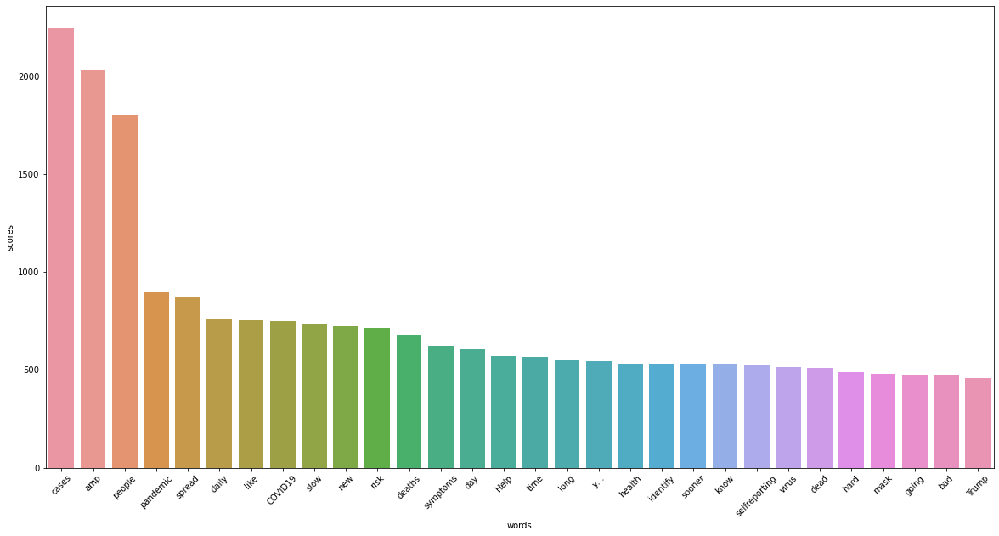

In [52]:
neg_df = pd.DataFrame(most_common_neg_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

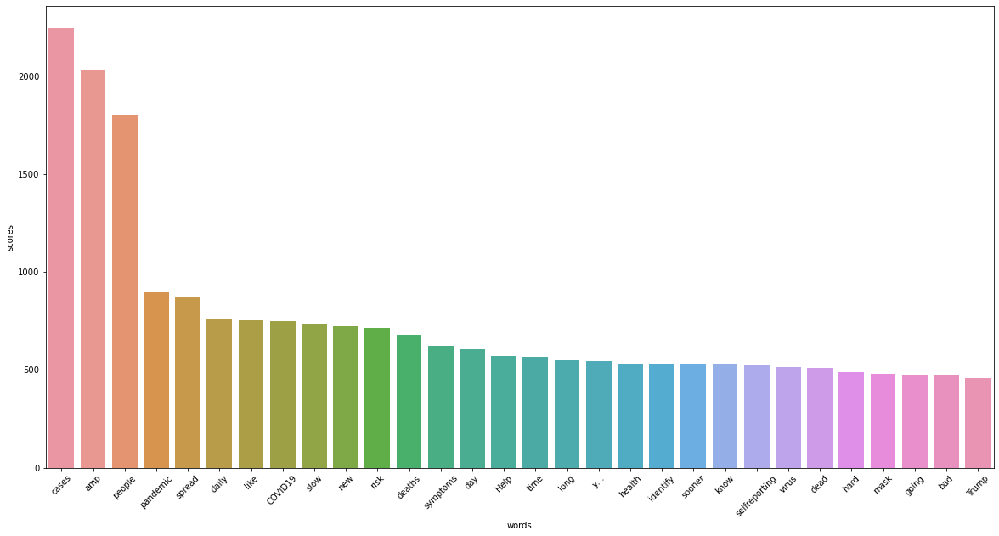

In [53]:
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

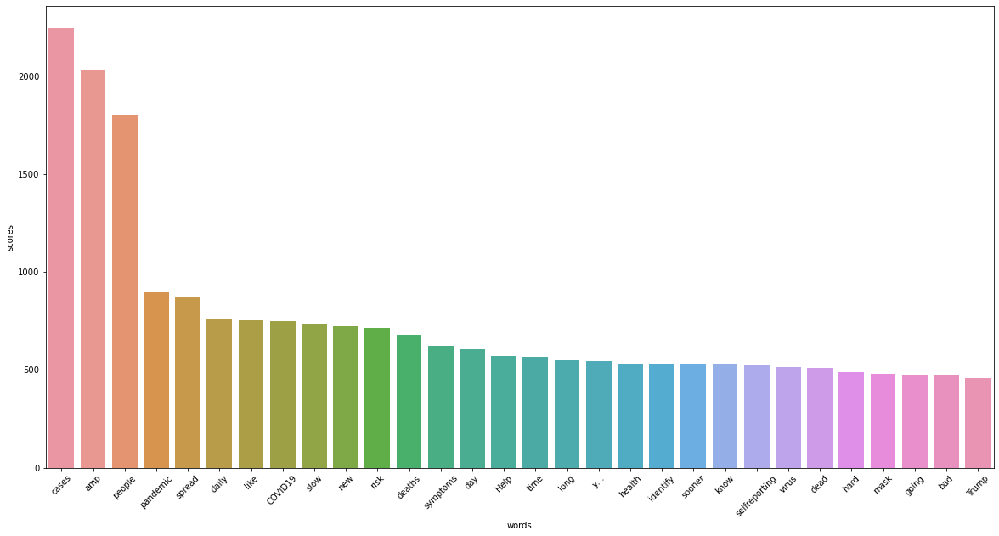

In [54]:
neut_df = pd.DataFrame(most_common_neut_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

In [57]:
pip install WordCloud

Note: you may need to restart the kernel to use updated packages.


In [91]:
from wordcloud import WordCloud

In [95]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [96]:
pos_docx = ''.join(pos_tokens)
neg_docx = ''.join(neg_tokens)
neu_docx = ''.join(neut_tokens)

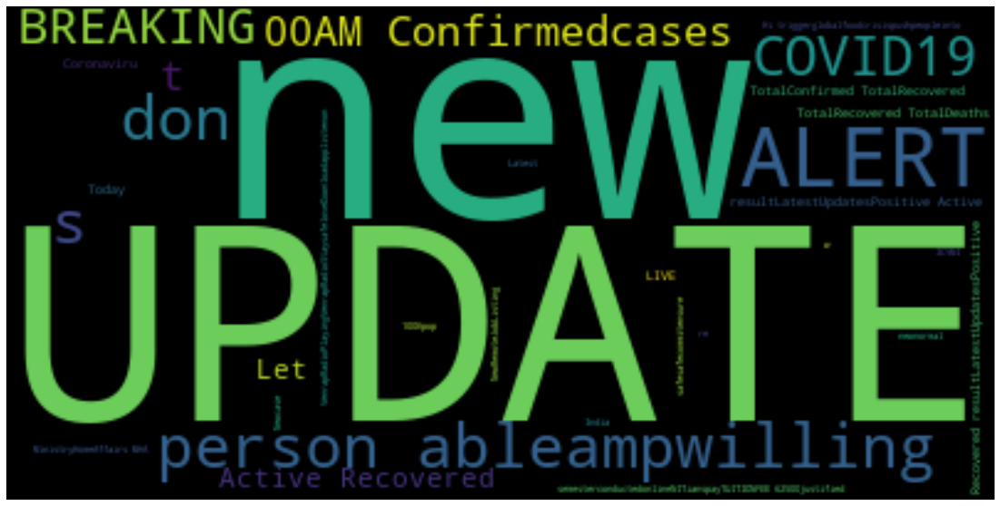

In [97]:
plot_wordcloud(pos_docx)

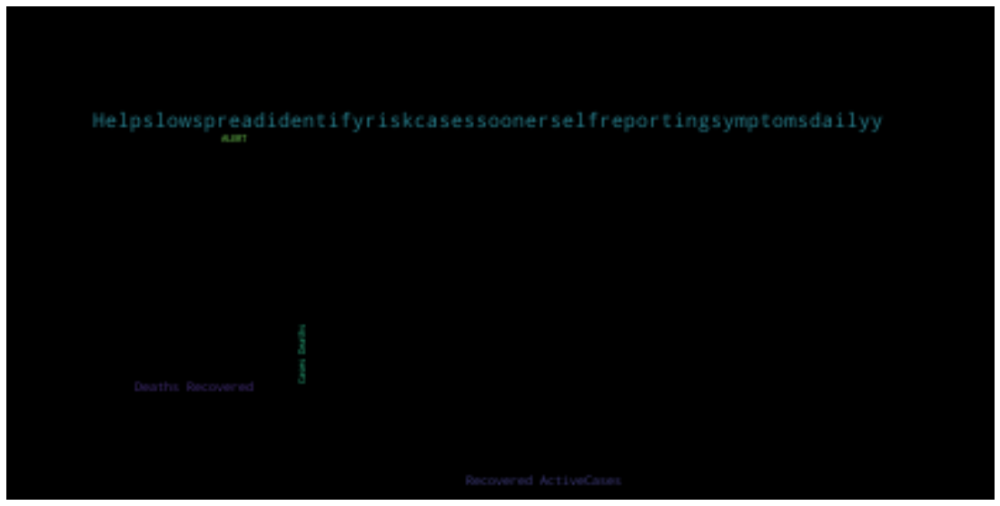

In [98]:
plot_wordcloud(neg_docx)

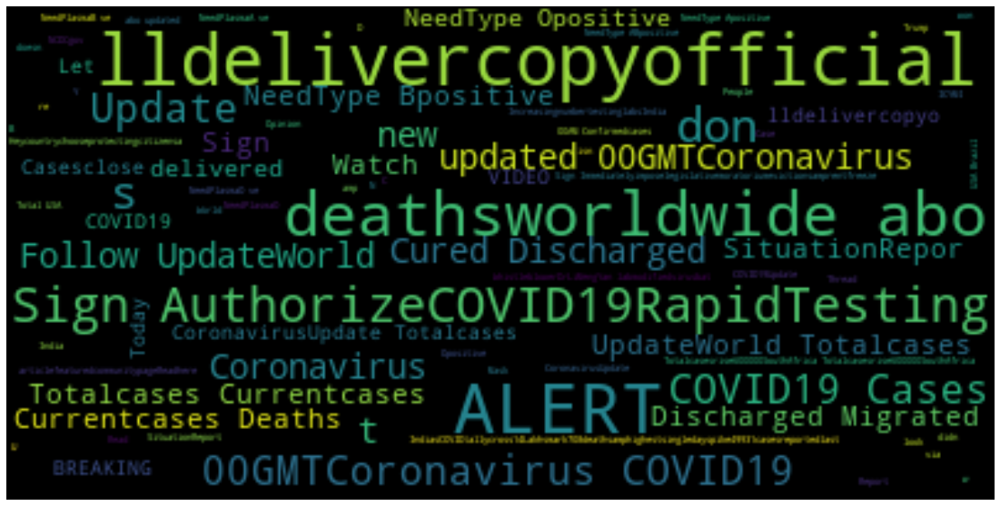

In [100]:
plot_wordcloud(neu_docx)

In [1]:
git init

SyntaxError: invalid syntax (<ipython-input-1-f188d5ac1197>, line 1)